# Shared Environment

NOTE THIS NOTEBOOK ASSUMES CHANGES MADE TO FILES, DOES NOT WORK WITHOUT USING REFACTORED FILES:

## Changes made to the following files:
* agent_wrapper
* learner 
* cyberbattle_chain
* cyberbattle_env


Code taken and modified from trainingDefender notebook from last week as well as other files in CyberBattleSim. I made some changes locally in this notebook to classes that I will put into files once this is working better.

No longer using cyberbattle_env because edited a new file that captures a lot of the properties of cyberbattle_env but the new step() considers the defender agent's presence in the environment and executes its actions. Mainly edited the class CyberbattleEnv and renamed it CyberBattleEnvTest. I had to change some of the features in agent_wrapper.

Using defenderwrapper as defender agent in shared environment. The defender agent's actions are based on DefenderAgentActions class.

## Trained on same environment - CyberBattleChain-12
I trained both the attacker and defender agent using CyberBattleChain-12. I solved some issues in their interaction in the shared environment by making sure that the defender agent was trained with the same iterations of episodes as the attacker.

The attacker is trained without the presence of a defender agent.

The defender agent is  without the attacker making any moves. 

## Interacting in simulation loop ie both agents affect the state of the environment
They both interact with the environments.

IMPROVEMENTS NEEDED:
* Defender fails every time it tries to reimage a node - there are certain conditions needed to be met in the environmnet for the defender to be allowed to reimage a node. So even when it is unnecessary to reimage or not allowed reimage it as long as it is infected it will try to reimage it which results in a failure. Only successful when blocking or allowing traffic.

Monday and tuesday I tried to get the multiagent environment working but a lot of issues so decided to do it a different way. On Tuesday night I regrouped and planned how to make a shared environment for both the attacker and defender to use since they were both trained in different environments.

Wednesday I followed the plan which included making a fully new environment file and replacing any references to the old environment (i kept the original as backup. The main changes were to the step() function which allowed interaction for the defender with the environment. Wednesday night I got both the attacker and defender trained on the same environment. This was fine for te attacker but needed to make a lot of adjustment to defenderwrapper etc. 

Thursday I started trying to get their interaction working but realised I needed to fix the defender training. Busy thursday night so didn't do much on that.

Friday I fixed both trainings for attacker and defender q learning. I also got them interacting with the same environmnet which was a lot easier when they were both trained better.

Saturday: reward of 0 for not reimaging - usually a reason why it doesn't reimage
increase training episodes


Increase training episodes


Modifications:

took out if node infected in choose action and added reimage node to the preventative actions list - result was there was na increase in successful actions


In [1]:
import time
import copy
import logging
import networkx
from networkx import convert_matrix
from typing import NamedTuple, Optional, Tuple, List, Dict, TypeVar, TypedDict, cast

import numpy
import gym
from gym import spaces
from gym.utils import seeding

import plotly.graph_objects as go
from plotly.subplots import make_subplots

from cyberbattle._env.shared_cyberbattle_env import EnvironmentBounds, AttackerGoal, DefenderGoal, DefenderConstraint
from cyberbattle._env.defender import DefenderAgent,ScanAndReimageCompromisedMachines
from cyberbattle.simulation.model import PortName, PrivilegeLevel
from cyberbattle.simulation import commandcontrol, model, actions
from cyberbattle._env.discriminatedunion import DiscriminatedUnion
from cyberbattle.agents.baseline import agent_wrapper as w
import cyberbattle.agents.baseline.learner as learner
from cyberbattle.agents.baseline.learner import Learner
import cyberbattle.agents.baseline.agent_tabularqlearning as a
import cyberbattle.agents.baseline.agent_ddql as ddqla
import cyberbattle.agents.baseline.agent_dql as dqla

# DefenderWrapper

In [2]:
import numpy as np
import random
from gym import spaces

class DefenderWrapper:
    def __init__(self, environment, name):
        self.env = environment
        self.network = environment.network
        self.defender_actions = DefenderAgentActions(environment)
        self.id_mapping = self.create_id_mapping()
        self.action_space = self.define_action_space()
        #self.observation_space = self.define_observation_space()
        self.last_attacker_reward = 0
        self.name = name
        self.performance_metrics = {
            'actions_taken': 0,
            'successful_actions': 0,
            'failed_actions': 0
        }

    def create_id_mapping(self):
        mapping = {}
        for i, node in enumerate(self.env.network.nodes):
            mapping[i] = node
        return mapping

    def define_action_space(self):
        return spaces.Dict({
            'action_type': spaces.Discrete(5),
            'node_id': spaces.Discrete(len(self.id_mapping)),
            'parameter': spaces.Discrete(10)
        })
    
    def define_observation_space(self):
        return spaces.Dict({
            'infected_nodes': spaces.Box(low=0, high=1, shape=(len(self.id_mapping),), dtype=np.int32),
            'firewall_status': spaces.Box(low=0, high=1, shape=(len(self.id_mapping),), dtype=np.int32),
            'service_status': spaces.Box(low=0, high=1, shape=(len(self.id_mapping),), dtype=np.int32)
        })
    
    def validate_action(self, action):
        action_type, numerical_node_id, _ = action.values()
        print(action_type,numerical_node_id,_)
        node_id = self.id_mapping.get(numerical_node_id)
        action1 = self.create_action(action_type, node_id)
        #print('new action1',action1)
        action_type1, numerical_node_id, _ = action.values()
        #print('action type1',action1['action_type'])
        #print('node id',node_id)
        #print('numerical_node_id',numerical_node_id)
        if node_id is None or action1['action_type'] not in [0, 1, 2, 3, 4]:
            #print(node_id)
            #print(action_type)
            return False
        return True

    def step(self, action):
        print(f"[DEBUG] Received action: {action}")
        
        if not self.validate_action(action):
            #print("[WARNING] Invalid action")
            return self.construct_step_response(-10, {'error': 'Invalid action'}, False)
    
        action_type, numerical_node_id, parameter = action.values()
        node_id = self.id_mapping[numerical_node_id]
        #print(f"[DEBUG] Processed Node ID: {node_id} (Numerical ID: {numerical_node_id})")
        action1 = self.create_action(action_type, node_id)
        action_result = self.perform_action(action_type, node_id, parameter)
        
        if action_result is None:
            #print("[ERROR] Action result is None")
            return self.construct_step_response(-10, {'error': 'Action result is None'}, False)
    
        reward = self.calculate_reward(action_result)
        done = self.defender_goal_reached()
        self.update_performance_metrics(action_result)
        
        response = self.construct_step_response(reward, action_result, done)
        #print(f"[DEBUG] Step response: {response}")
        return response

    def perform_action(self, action_type, node_id, parameter):
        # Get the current state of the node
        node_info = self.env.get_node(node_id)
    
        if action_type == 0:  # Reimage Node
            return self.defender_actions.reimage_node(node_id, self.env)
        
        elif action_type == 1:  # Block Traffic
            return self.defender_actions.block_traffic(node_id, parameter, incoming=True)
        
        elif action_type == 2:  # Allow Traffic
            return self.defender_actions.allow_traffic(node_id, parameter, incoming=True)
        
        elif action_type == 3:  # Stop Service
            if any(service.name == parameter and service.running for service in node_info.services):
                return self.defender_actions.stop_service(node_id, parameter)
            else:
                return {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service'}
        
        elif action_type == 4:  # Start Service
            if any(service.name == parameter and not service.running for service in node_info.services):
                return self.defender_actions.start_service(node_id, parameter)
            else:
                return {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service'}
        
        else:
            return {'status': 'error', 'reason': 'Unknown action type', 'action': 'unknown'}




    def calculate_reward(self, action_result):
      if action_result['status'] == 'success':
          if action_result['action'] == 'reimage_node':
              return 50  #Higher reward for re-imaging a compromised node
          else:
              return 25  #Standard reward for other successful actions
      elif action_result['status'] == 'failed':
          #print('failed')
          #print(action_result)
          if action_result['action'] == 'reimage_node':
              #print('reimaged')
              return 0
          else:
              #print('not reimaged')
              return -15  #Penalty for failed actions
      elif action_result['status'] == 'unnecessary':
          return -5  #Smaller penalty for unnecessary actions
      return 0  #Default reward for other cases


    def get_observation(self):
      #print('environment nodes',self.env.network.nodes)
      infected_nodes = [int(self.env.is_node_infected(node)) for node in self.env.network.nodes]
        
      #print('infected_nodes',infected_nodes)
      firewall_status = [int(self.env.get_firewall_status(node)) for node in self.env.network.nodes]
      service_status = [int(self.env.get_service_status(node)) for node in self.env.network.nodes]
      #print('firewall_status',firewall_status)
      #print('service_status',service_status)
      return {
          'infected_nodes': np.array(infected_nodes, dtype=np.int32),
          'firewall_status': np.array(firewall_status, dtype=np.int32),
          'service_status': np.array(service_status, dtype=np.int32)
      }


    def update_performance_metrics(self, action_result):
        self.performance_metrics['actions_taken'] += 1
        if action_result['status'] == 'success':
            self.performance_metrics['successful_actions'] += 1
        else:
            self.performance_metrics['failed_actions'] += 1

    def construct_step_response(self, reward, info, done):
        observation = self.get_observation()
        observation['action_mask'] = self.compute_defender_action_mask()
        info['performance_metrics'] = self.performance_metrics
        network_availability = self.env.network_availability
        info['network_availability'] = network_availability

        return observation, reward, done, info


    def compute_defender_action_mask(self):
        #initialise a blank action mask
        action_mask = {
            'Reimage Node': numpy.zeros(len(self.id_mapping), dtype=numpy.int32),
            'Block Traffic': numpy.zeros(len(self.id_mapping), dtype=numpy.int32),
            'Allow Traffic': numpy.zeros(len(self.id_mapping), dtype=numpy.int32),
            'Stop Service': numpy.zeros(len(self.id_mapping), dtype=numpy.int32),
            'Start Service': numpy.zeros(len(self.id_mapping), dtype=numpy.int32)
        }

        # Update the action mask based on the current state of the environment
        for numerical_id, node_id in self.id_mapping.items():
            node_info = self.env.network.nodes[node_id]['data']
    
            #print(f"Node ID: {node_id}, Info: {node_info}")
    
            # If node is infected or has vulnerabilities, defender can reimage node
            if node_info.agent_installed or self.has_vulnerabilities(node_id):
                action_mask['Reimage Node'][numerical_id] = 1
                #print(f"Node {node_id} can be reimaged (Infected or Vulnerable)")
    
            # Defender can block traffic and allow traffic on any node
            action_mask['Block Traffic'][numerical_id] = 1
            action_mask['Allow Traffic'][numerical_id] = 1
            #print(f"Node {node_id} can have traffic blocked/allowed")
    
            # If a service is running on the node, defender can stop service
            if any(service.running for service in node_info.services):
                action_mask['Stop Service'][numerical_id] = 1
                #print(f"Node {node_id} has running services that can be stopped")
    
            # If a service is stopped on the node, defender can start service
            if any(not service.running for service in node_info.services):
                action_mask['Start Service'][numerical_id] = 1
                #print(f"Node {node_id} has stopped services that can be started")
    
        return action_mask
    
    def update_last_attacker_reward(self, reward):
        self.last_attacker_reward = reward


    def default_or_preventive_action(self):
        random_node_id = random.choice(list(self.id_mapping.keys()))
        return self.create_action('Check Firewall', random_node_id)

    def defender_goal_reached(self):
        for _, node_id in self.id_mapping.items():
            node_info = self.env.network.nodes[node_id]['data']
            if node_info.agent_installed:  
                return False
        return True


    def reset(self):
        initial_observation = self.env.reset()
        return initial_observation
    
    def reimage_node(self, node_id, environment):
        # Mark the node for re-imaging
        self.node_reimaging_progress[node_id] = self.REIMAGING_DURATION
    
        # Now, update the node's state in the environment
        return self.defender_actions.reimage_node(node_id, environment)

    
    def get_node(self, node_id):
        #implement this method to access node information from the environment
        return self.env.get_node(node_id)

    def choose_action(self, state):
        """
        Choose an action based on the current state of the environment.
        """
        print("Choosing action based on the current state")

        #Detect infected nodes
        infected_nodes = self.find_infected_nodes()
        #print('infected nodes',infected_nodes)
        #print(f"Infected nodes: {infected_nodes}")
        '''
        #If there are infected nodes, reimage the first one
        if infected_nodes:
            #node_id_to_reimage = infected_nodes[0]
            node_id_to_reimage = random.choice(infected_nodes)
            #print(f"Reimaging node: {node_id_to_reimage}")
            return self.create_action('Reimage Node', node_id_to_reimage)
        '''
        #List of preventive actions
        preventive_actions = ['Reimage Node','Check Firewall', 'Block Traffic', 'Allow Traffic', 'Stop Service', 'Start Service']
        #print("No infected nodes found, selecting a preventive action")

        #Randomly select a preventive action
        selected_preventive_action = random.choice(preventive_actions)
        #print(f"Selected preventive action: {selected_preventive_action}")

        #Randomly select a node for the preventive action
        node_id_for_preventive_action = self.select_node_for_preventive_action()
        #print(f"Node selected for preventive action: {node_id_for_preventive_action}")

        return self.create_action(selected_preventive_action, node_id_for_preventive_action)

    def find_infected_nodes(self):
        """
        Find and return a list of numerical IDs of infected (or compromised) nodes.
        """
        infected_nodes = []
        for numerical_id, node_id in self.id_mapping.items():
            node_info = self.env.network.nodes[node_id]['data']
            if node_info.agent_installed or self.has_vulnerabilities(node_id):
                infected_nodes.append(numerical_id)
        return infected_nodes

    def has_vulnerabilities(self, node_id):
        """
        Check if a node has vulnerabilities.
        """
        node_info = self.env.network.nodes[node_id]['data']
        return bool(node_info.vulnerabilities)

    def select_node_for_preventive_action(self):
        """
        Select a node for a preventive action
        """
        return random.choice(list(self.id_mapping.keys()))

    def create_action(self, action_type, node_id):
        """
        Create an action dictionary based on the action type and node ID.
        """
        action_type_mapping = {
            'Reimage Node': 0,
            'Block Traffic': 1,
            'Allow Traffic': 2,
            'Stop Service': 3,
            'Start Service': 4
        }
        if action_type in action_type_mapping:
            action_number = action_type_mapping[action_type]
        else:
            action_number = random.choice(list(action_type_mapping.values()))
        return {'action_type': action_number, 'node_id': node_id, 'parameter': 0}

    def sample_valid_action(self):
        """
        Randomly selects a valid action for the defender.
        """
        action_type = random.randint(0, 4) 
        node_id = random.choice(list(self.id_mapping.keys()))
        parameter = random.randint(0, 9)  
        action = {
            'action_type': action_type,
            'node_id': node_id,
            'parameter': parameter
        }
        while not self.validate_action(action):
            action['action_type'] = random.randint(0, 4)
            action['node_id'] = random.choice(list(self.id_mapping.keys()))
            action['parameter'] = random.randint(0, 9)

        return action

    def render(self):
        #implements rendering logic here
        print("Rendering the current state of the environment")

    def close(self):
        pass



In [3]:
from typing import Dict
import datetime
from cyberbattle.simulation import model
from cyberbattle.simulation.model import PrivilegeLevel, MachineStatus
from cyberbattle.simulation.model import Identifiers, NodeID, NodeInfo, Environment
from cyberbattle._env.cyberbattle_chain import CyberBattleChain

class DefenderAgentActions:
    """Actions reserved for defender agents"""

    #number of steps it takes to completely reimage a node
    REIMAGING_DURATION = 15

    def __init__(self, environment: CyberBattleChain):
        #map nodes being reimaged to the remaining number of steps to completion
        self.node_reimaging_progress: Dict[model.NodeID, int] = dict()
        #last calculated availability of the network
        self.__network_availability: float = 1.0
        self._environment = environment

    @property
    def network_availability(self):
        return self.__network_availability

    def print_initial_node_states(self):
        print("Initial node states:")
        for node_id in self._environment.network.nodes:
            node_data = self._environment.get_node(node_id)
            print(f"Node {node_id}: {node_data}")

    def reimage_node(self, node_id: model.NodeID, environment: model.Environment):
        """Re-image a computer node"""
        node_info = environment.get_node(node_id)
        action_result = {}
    
        # Check if the agent is installed - Precondition for reimaging
        if not node_info.agent_installed:
            return {"action": "reimage_node", "status": "unnecessary", "node_id": node_id, "reason": "Reimaging not required - no agent installed"}
    
        # Proceed with reimaging
        if node_info.status != MachineStatus.Imaging:
            node_info.agent_installed = False
            node_info.privilege_level = PrivilegeLevel.NoAccess
            node_info.status = MachineStatus.Imaging
            node_info.last_reimaging = datetime.datetime.now()
            action_result = {"action": "reimage_node", "status": "success", "node_id": node_id}
        else:
            action_result = {"action": "reimage_node", "status": "unnecessary", "node_id": node_id}
    
        return action_result


    def on_attacker_step_taken(self):
        """Function to be called each time a step is taken in the simulation"""
        for node_id in list(self.node_reimaging_progress.keys()):
            remaining_steps = self.node_reimaging_progress[node_id]
            if remaining_steps > 0:
                self.node_reimaging_progress[node_id] -= 1
            else:
                print(f"Machine re-imaging completed: {node_id}")
                node_data = self._environment.get_node(node_id)
                node_data.status = MachineStatus.Running
                self.node_reimaging_progress.pop(node_id)

        #calculate the network availability metric based on machines and services that are running
        total_node_weights = 0
        network_node_availability = 0
        for node_id, node_info in self._environment._cyberbattle_env.__environment.nodes():
            total_service_weights = 0
            running_service_weights = 0
            if isinstance(node_info, ChainNodeInfo):
                for service in node_info.services:
                    total_service_weights += service.sla_weight
                    running_service_weights += service.sla_weight * int(service.running)

                if node_info.status == MachineStatus.Running:
                    adjusted_node_availability = (1 + running_service_weights) / (
                        1 + total_service_weights
                    )
                else:
                    adjusted_node_availability = 0.0

                total_node_weights += node_info.sla_weight
                network_node_availability += (
                    adjusted_node_availability * node_info.sla_weight
                )

        self.__network_availability = network_node_availability / total_node_weights
        assert self.__network_availability <= 1.0 and self.__network_availability >= 0.0

    def override_firewall_rule(
            self,
            node_id: model.NodeID,
            port_name: model.PortName,
            incoming: bool,
            permission: model.RulePermission,
        ):
            node_data = self._environment.get_node(node_id)

            def add_or_patch_rule(rules) -> List[FirewallRule]:
                new_rules = []
                has_matching_rule = False
                for r in rules:
                    if r.port == port_name:
                        has_matching_rule = True
                        new_rules.append(FirewallRule(r.port, permission))
                    else:
                        new_rules.append(r)

                if not has_matching_rule:
                    new_rules.append(model.FirewallRule(port_name, permission))
                return new_rules

            if incoming:
                node_data.firewall.incoming = add_or_patch_rule(node_data.firewall.incoming)
            else:
                node_data.firewall.outgoing = add_or_patch_rule(node_data.firewall.outgoing)


    #blocks network traffic on specific port of node, if node is running, the traffic on the node can be blocked
    #failure is is machine not running
    def block_traffic(self, node_id: model.NodeID, port_name: model.PortName, incoming: bool):
        node_data = self._environment.get_node(node_id)
        if node_data.status == MachineStatus.Running:
            self.override_firewall_rule(node_id, port_name, incoming, model.RulePermission.BLOCK)
            action_result = {"action": "block_traffic", "status": "success", "node_id": node_id, "port_name": port_name}
        else:
            action_result = {"action": "block_traffic", "status": "failed", "node_id": node_id, "port_name": port_name, "reason": "Machine not running"}
        return action_result

    #allows network traffic on specific port of node, if node is running, the traffic on the node is allowed
    #failure is is machine not running
    def allow_traffic(self, node_id: model.NodeID, port_name: model.PortName, incoming: bool):
        node_data = self._environment.get_node(node_id)
        if node_data.status == MachineStatus.Running:
            self.override_firewall_rule(node_id, port_name, incoming, model.RulePermission.ALLOW)
            action_result = {"action": "allow_traffic", "status": "success", "node_id": node_id, "port_name": port_name}
        else:
            action_result = {"action": "allow_traffic", "status": "failed", "node_id": node_id, "port_name": port_name, "reason": "Machine not running"}
        return action_result

    #stops service on specific node, if node is running and the specified service is running, it can be stopped successfully
    #failure is is if machine is not running and service is not found
    def stop_service(self, node_id: model.NodeID, port_name: model.PortName):
      """ Stop a service on a given node """
      node_data = self._environment.get_node(node_id)
      action_result = {}
      if node_data.status == MachineStatus.Running:
          service_found = False
          for service in node_data.services:
              if service.name == port_name:
                  if service.running:
                      service.running = False
                      service_found = True
                      action_result = {"action": "stop_service", "status": "success", "node_id": node_id, "port_name": port_name}
                      break
                  else:
                      action_result = {"action": "stop_service", "status": "unnecessary", "node_id": node_id, "port_name": port_name, "reason": "Service already stopped"}
                      break
          if not service_found:
              action_result = {"action": "stop_service", "status": "failed", "node_id": node_id, "port_name": port_name, "reason": "Service not found"}
      else:
          action_result = {"action": "stop_service", "status": "failed", "node_id": node_id, "port_name": port_name, "reason": "Machine not running"}
      return action_result

    #starts service on specific node
    #success if specified service is not running and can be started
    #unneccesary = service already running
    #failure = machine not running and srvice not running
    def start_service(self, node_id: model.NodeID, port_name: model.PortName):
        """ Start a service on a given node """
        node_data = self._environment.get_node(node_id)
        action_result = {}
        if node_data.status == MachineStatus.Running:
            service_found = False
            for service in node_data.services:
                if service.name == port_name:
                    if not service.running:
                        service.running = True
                        service_found = True
                        action_result = {"action": "start_service", "status": "success", "node_id": node_id, "port_name": port_name}
                        break
                    else:
                        action_result = {"action": "start_service", "status": "unnecessary", "node_id": node_id, "port_name": port_name, "reason": "Service already running"}
                        break
            if not service_found:
                action_result = {"action": "start_service", "status": "failed", "node_id": node_id, "port_name": port_name, "reason": "Service not found"}
        else:
            action_result = {"action": "start_service", "status": "failed", "node_id": node_id, "port_name": port_name, "reason": "Machine not running"}
        return action_result

In [4]:
import random

In [5]:
import gym

# Create an instance of the CyberBattleChain environment without the defender
gym_env = gym.make('CyberBattleChain-v0',
    size=12,
    attacker_goal=AttackerGoal(
        own_atleast=0,
        own_atleast_percent=1.0
    ),
    defender_constraint=DefenderConstraint(
        maintain_sla=0.80
    )
)

defender_name = "DefenderName" 
defender_agent = DefenderWrapper(gym_env,defender_name)

Generated nodes:
[('start', {'data': NodeInfo(services=[], vulnerabilities={'ScanExplorerRecentFiles': VulnerabilityInfo(description='Scan Windows Explorer recent files for possible references to other machines', type=<VulnerabilityType.LOCAL: 1>, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7f760875d970>, precondition=<cyberbattle.simulation.model.Precondition object at 0x7f7698de6640>, rates=Rates(probingDetectionRate=0.0, exploitDetectionRate=0.0, successRate=1.0), URL='', cost=1.0, reward_string='Found a reference to a remote Linux node in bash history')}, value=0, properties=[], firewall=FirewallConfiguration(outgoing=[FirewallRule(port='RDP', permission=<RulePermission.ALLOW: 0>, reason=''), FirewallRule(port='SSH', permission=<RulePermission.ALLOW: 0>, reason=''), FirewallRule(port='HTTPS', permission=<RulePermission.ALLOW: 0>, reason=''), FirewallRule(port='HTTP', permission=<RulePermission.ALLOW: 0>, reason='')], incoming=[FirewallRule(port='RDP', permis

In [6]:

ep = w.EnvironmentBounds.of_identifiers(
    maximum_total_credentials=22,
    maximum_node_count=22,
    identifiers=gym_env.identifiers
)
#cyberbattlechain_defender.render_as_fig()

In [7]:
random.seed(120394016)
%matplotlib inline
import cyberbattle.agents.baseline.agent_tabularqlearning as a
import cyberbattle.agents.baseline.learner as learner
from cyberbattle.agents.baseline.agent_wrapper import Verbosity
#ql
iteration_count = 10
training_episode_count = 10
eval_episode_count = 20
gamma_sweep = [
    0.015,  # about right
]

###### Q-learning
Learning with: episode_count=10,iteration_count=10,ϵ=0.95,ϵ_min=0.1, ϵ_multdecay=0.75,ϵ_expdecay=5000,γ=0.015,learning_rate=0.99,Q%=100
  ## Episode: 1/10 'Q-learning' ϵ=0.9500, γ=0.015,learning_rate=0.99,Q%=100


Episode 1|Iteration 10|reward:   20.0|last_reward_at:    8|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7f7608741880>)
Attacker reward: 14.0
Step called with action: {'connect': array([0, 0, 1, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 1, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Att

Episode 2|Iteration 5|reward:   14.0|last_reward_at:    5|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

Episode 2|Iteration 10|reward:   16.0|last_reward_at:    7|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker action:  ActionResult(reward=2.0, outcome=<cyberbattle.simulation.model.ProbeFailed object at 0x7f76087b05b0>)
Attacker reward: 2.0
Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker action:  ActionRe

Episode 3|Iteration 6|reward:   18.0|last_reward_at:    6|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7f7608795880>)
Attacker reward: 14.0
Step called with action: {'connect': array([0, 0, 5, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 5, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 5, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Att

Episode 3|Iteration 10|reward:   18.0|last_reward_at:    6|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=-6.0, outcome=<cyberbattle.simulation.model.ProbeSucceeded object at 0x7f76087b16a0>)
Attacker reward: -6.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(re

Episode 4|Iteration 10|reward:   20.0|last_reward_at:   10|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7f760870cfd0>)
Attacker reward: 14.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult

Episode 5|Iteration 1|reward:    0.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 5|Iteration 3|reward:   14.0|last_reward_at:    3|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7f76e071bcd0>)
Attacker reward: 14.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult

Episode 5|Iteration 10|reward:   14.0|last_reward_at:    3|Elapsed Time: 0:00:00||


Attacker reward: -10.0
  Episode 5 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/0 (1.00)
    explore-remote: 0/4 (0.00)
    explore-connect: 0/5 (0.00)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 2
  ## Episode: 6/10 'Q-learning' ϵ=0.7063, γ=0.015,learning_rate=0.99,Q%=100


Episode 6|Iteration 1|reward:    0.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

Episode 6|Iteration 10|reward:    0.0|last_reward_at: ----|Elapsed Time: 0:00:00||


Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executi

Episode 7|Iteration 3|reward:   14.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials

Episode 7|Iteration 3|reward:   14.0|last_reward_at:    3|Elapsed Time: 0:00:00||

Step called with action: {'connect': array([0, 1, 5, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 5, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 5, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10


Episode 7|Iteration 10|reward:   18.0|last_reward_at:    9|Elapsed Time: 0:00:00||


Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'connect': array([0, 0, 4, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 4, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 4, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7f7608719c40>)
Atta

Episode 8|Iteration 0|reward: ------|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}


Episode 8|Iteration 1|reward:    0.0|last_reward_at: ----|Elapsed Time: 0:00:00||

attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacke

Episode 8|Iteration 7|reward:   14.0|last_reward_at:    7|Elapsed Time: 0:00:00||

Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7f760871b2e0>)
Attacker reward: 14.0
Step called with action: {'connect': array([0, 0, 1, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 1, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-2.0, outcome=<cyberbattle.simulatio

Episode 8|Iteration 10|reward:   16.0|last_reward_at:   10|Elapsed Time: 0:00:00||


  Episode 8 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/1 (0.50)
    explore-remote: 1/6 (0.14)
    explore-connect: 0/1 (0.00)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 1
  ## Episode: 9/10 'Q-learning' ϵ=0.7025, γ=0.015,learning_rate=0.99,Q%=100


Episode 9|Iteration 1|reward:    0.0|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step ca

Episode 9|Iteration 4|reward:   14.0|last_reward_at:    4|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 1], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=4.0, outcome=<cyberbattle.simulation.model.ProbeSucceeded object at 0x7f76087244f0>)
Attacker reward: 4.0


Episode 9|Iteration 6|reward:   18.0|last_reward_at:    6|Elapsed Time: 0:00:00||

Step called with action: {'connect': array([0, 1, 6, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 6, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 6, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)


Episode 9|Iteration 10|reward:   20.0|last_reward_at:    8|Elapsed Time: 0:00:00||


Attacker reward: -10
Step called with action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 1], dtype=int32)}
attacker action:  ActionResult(reward=2.0, outcome=<cyberbattle.simulation.model.ProbeFailed object at 0x7f7608724370>)
Attacker reward: 2.0
Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0
Step called with action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 1, 0], dtype=int32)}
attac

Episode 10|Iteration 0|reward: ------|last_reward_at: ----|Elapsed Time: 0:00:00||

Step called with action: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
Executing attacker action {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker Action being executed: {'remote_vulnerability': array([0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-5.0, outcome=None)
Attacker reward: -5.0


Episode 10|Iteration 2|reward:   14.0|last_reward_at:    2|Elapsed Time: 0:00:00||

Step called with action: {'local_vulnerability': array([0, 1], dtype=int32)}
Executing attacker action {'local_vulnerability': array([0, 1], dtype=int32)}
attacker Action being executed: {'local_vulnerability': array([0, 1], dtype=int32)}
attacker action:  ActionResult(reward=14.0, outcome=<cyberbattle.simulation.model.LeakedCredentials object at 0x7f76087288e0>)
Attacker reward: 14.0
Step called with action: {'connect': array([0, 0, 2, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 2, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 2, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)
Attacker reward: -10.0
Step called with action: {'connect': array([0, 1, 0, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 0, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step calle

Episode 10|Iteration 9|reward:   14.0|last_reward_at:    2|Elapsed Time: 0:00:00||

Attacker reward: -10
Step called with action: {'connect': array([0, 1, 1, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 1, 1, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 1, 1, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10, outcome=None)
Attacker reward: -10
Step called with action: {'connect': array([0, 0, 0, 0], dtype=int32)}
Executing attacker action {'connect': array([0, 0, 0, 0], dtype=int32)}
attacker Action being executed: {'connect': array([0, 0, 0, 0], dtype=int32)}
attacker action:  ActionResult(reward=-10.0, outcome=None)


Episode 10|Iteration 10|reward:   14.0|last_reward_at:    2|Elapsed Time: 0:00:00||


Attacker reward: -10.0
  Episode 10 stopped at t=10 loss={loss_string}
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 1/0 (1.00)
    explore-remote: 0/1 (0.00)
    explore-connect: 0/8 (0.00)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 2
simulation ended


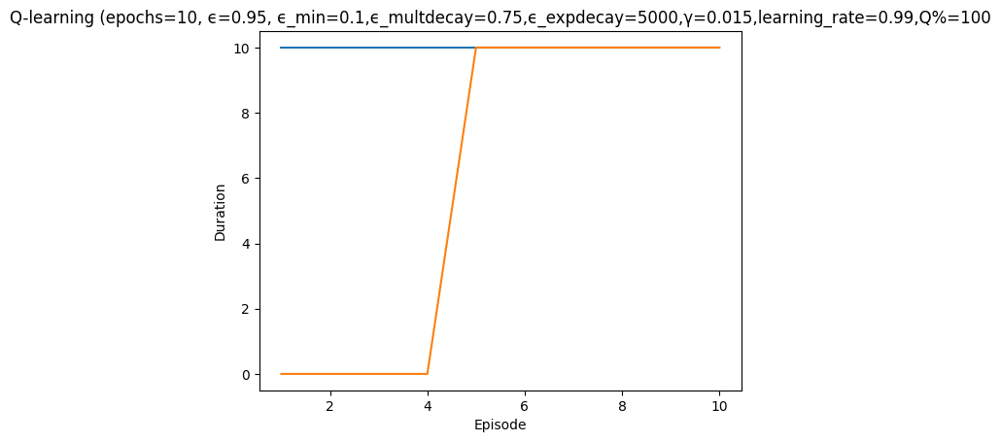

In [8]:
trained_attacker = learner.epsilon_greedy_search(
        gym_env,
        ep,
        a.QTabularLearner(ep, gamma=.015, learning_rate=0.99, exploit_percentile=100),
        episode_count=training_episode_count,
        iteration_count=iteration_count,
        epsilon=0.95,
        render=False,
        epsilon_multdecay=0.75,  # 0.999,
        epsilon_exponential_decay=5000,
        epsilon_minimum=0.1,
        verbosity=Verbosity.Quiet,
        title="Q-learning"
    )

In [9]:
import numpy as np
from cyberbattle._env.cyberbattle_env import Action

class EpsilonGreedyLearner:
    def __init__(self, env, defender, epsilon=0.1):
        self.env = env
        self.defender = defender
        self.epsilon = epsilon

    def choose_action(self, state):
        if np.random.rand() <= self.epsilon:
            return self.explore()
        else:
            return self.exploit(state)

    def explore(self):
        #randomly select an action from the defender's valid actions
        return self.defender.sample_valid_action()

    def exploit(self, state):
        return self.defender.sample_valid_action()

    def update_state(self, state, reward):
        pass

    def end_of_episode(self, episode_number):
        pass

class TrainedDefender:
    pass


In [10]:
import numpy as np
from typing import Tuple, Optional
import logging
import abc
from cyberbattle._env import cyberbattle_env

class DefenderEpsilonGreedyLearner(EpsilonGreedyLearner):
    def __init__(self, env, defender, ep, gamma, learning_rate, epsilon, state_space_size, action_space_size):
        super().__init__(env, defender, epsilon)
        self.defender = defender
        self.state_space_size = state_space_size
        self.action_space_size = action_space_size
        self.learning_rate = learning_rate
        self.q_matrix = np.zeros((self.state_space_size, self.action_space_size))
        self.gamma = gamma


    def decide_action(self, wrapped_env, observation) -> Tuple[str, cyberbattle_env.Action, object]:
        if np.random.rand() < self.epsilon:
            return self.explore(wrapped_env)
        else:
            return self.exploit(wrapped_env, observation)

    def explore(self, wrapped_env) -> Tuple[str, cyberbattle_env.Action, object]:
        action = wrapped_env.sample_valid_action()
        action_metadata = None
        action_style = 'explore'
        return action_style, action, action_metadata

    def exploit(self, wrapped_env, observation) -> Tuple[str, Optional[cyberbattle_env.Action], object]:
        action = wrapped_env.sample_valid_action()
        action_metadata = None
        action_style = 'exploit'
        return action_style, action, action_metadata

    def on_step(self, wrapped_env, observation, reward, done, info, action_metadata):
        current_state = self.encode_state(observation)
        action = self.encode_action(action_metadata)
        next_state = self.encode_state(observation) if not done else None
        self.update_q_matrix(current_state, action, reward, next_state)

    def update_q_matrix(self, state, action, reward, next_state):
        max_future_q = 0 if next_state is None else np.max(self.q_matrix[next_state])
        current_q = self.q_matrix[state, action]
        new_q = (1 - self.learning_rate) * current_q + self.learning_rate * (reward + self.gamma * max_future_q)
        self.q_matrix[state, action] = new_q

    def parameters_as_string(self):
        return "Defender learner parameters: "

    def encode_state(self, observation):
        state_index = 0
        return state_index

    def encode_action(self, action_metadata):
        action_index = 0
        return action_index

    def new_episode(self):
        pass

    def end_of_episode(self, i_episode, t):
        pass

    def end_of_iteration(self, t, done):
        pass

    def all_parameters_as_string(self):
        return ''

    def loss_as_string(self):
        return ''

    def stateaction_as_string(self, action_metadata):
        return ''


In [11]:
Breakdown = TypedDict('Breakdown', {
    'local': int,
    'remote': int,
    'connect': int
})

Outcomes = TypedDict('Outcomes', {
    'reward': Breakdown,
    'noreward': Breakdown
})

Stats = TypedDict('Stats', { 
    'exploit': Outcomes,
    'explore': Outcomes,
    'exploit_deflected_to_explore': int
})

TrainedLearner = TypedDict('TrainedLearner', {
    'all_episodes_rewards': List[List[float]],
    'all_episodes_availability': List[List[float]],
    'learner': Learner,
    'trained_on': str,
    'title': str
})

def epsilon_greedy_defender_training(
    cyberbattle_gym_env: cyberbattle_env.CyberBattleEnv,
    environment_properties: w.EnvironmentBounds,
    learner: DefenderEpsilonGreedyLearner,
    title: str,
    episode_count: int,
    iteration_count: int,
    epsilon: float,
    epsilon_minimum=0.0,
    epsilon_multdecay: Optional[float] = None,
    epsilon_exponential_decay: Optional[int] = None,
    render=True,
    render_last_episode_rewards_to: Optional[str] = None,
    verbosity: Verbosity = Verbosity.Normal,
    plot_episodes_length=True
) -> TrainedLearner:
    """Epsilon greedy search for CyberBattle gym environments

    Parameters
    ==========

    - cyberbattle_gym_env -- the CyberBattle environment to train on

    - learner --- the policy learner/exploiter

    - episode_count -- Number of training episodes

    - iteration_count -- Maximum number of iterations in each episode

    - epsilon -- explore vs exploit
        - 0.0 to exploit the learnt policy only without exploration
        - 1.0 to explore purely randomly

    - epsilon_minimum -- epsilon decay clipped at this value.
    Setting this value too close to 0 may leed the search to get stuck.

    - epsilon_decay -- epsilon gets multiplied by this value after each episode

    - epsilon_exponential_decay - if set use exponential decay. The bigger the value
    is, the slower it takes to get from the initial `epsilon` to `epsilon_minimum`.

    - verbosity -- verbosity of the `print` logging

    - render -- render the environment interactively after each episode

    - render_last_episode_rewards_to -- render the environment to the specified file path
    with an index appended to it each time there is a positive reward
    for the last episode only

    - plot_episodes_length -- Plot the graph showing total number of steps by episode
    at th end of the search.

    Note on convergence
    ===================

    Setting 'minimum_espilon' to 0 with an exponential decay <1
    makes the learning converge quickly (loss function getting to 0),
    but that's just a forced convergence, however, since when
    epsilon approaches 0, only the q-values that were explored so
    far get updated and so only that subset of cells from
    the Q-matrix converges.

    """

    print(f"###### {title}\n"
          f"Learning with: episode_count={episode_count},"
          f"iteration_count={iteration_count},"
          f"ϵ={epsilon},"
          f'ϵ_min={epsilon_minimum}, '
          + (f"ϵ_multdecay={epsilon_multdecay}," if epsilon_multdecay else '')
          + (f"ϵ_expdecay={epsilon_exponential_decay}," if epsilon_exponential_decay else '') +
          f"{learner.parameters_as_string()}")

    initial_epsilon = epsilon
    successful_reimaging_count = 0
    starting_services_count = 0
    allowing_traffic_count = 0
    blocking_traffic_count = 0
    stopping_services_count = 0
    all_episodes_rewards = []
    all_episodes_availability = []
    defender_name = 'MyDefenderEnv'
    wrapped_env = DefenderWrapper(cyberbattle_gym_env,defender_name)
    steps_done = 0
    plot_title = f"{title} (epochs={episode_count}, ϵ={initial_epsilon}, ϵ_min={epsilon_minimum}," \
        + (f"ϵ_multdecay={epsilon_multdecay}," if epsilon_multdecay else '') \
        + (f"ϵ_expdecay={epsilon_exponential_decay}," if epsilon_exponential_decay else '') \
        + learner.parameters_as_string()
    plottraining = PlotTraining(title=plot_title, render_each_episode=render)

    render_file_index = 1

    for i_episode in range(1, episode_count + 1):

        print(f"  ## Episode: {i_episode}/{episode_count} '{title}' "
              f"ϵ={epsilon:.4f}, "
              f"{learner.parameters_as_string()}")

        observation = wrapped_env.reset()
        total_reward = 0.0
        all_rewards = []
        all_availability = []
        learner.new_episode()

        stats = Stats(exploit=Outcomes(reward=Breakdown(local=0, remote=0, connect=0),
                                       noreward=Breakdown(local=0, remote=0, connect=0)),
                      explore=Outcomes(reward=Breakdown(local=0, remote=0, connect=0),
                                       noreward=Breakdown(local=0, remote=0, connect=0)),
                      exploit_deflected_to_explore=0
                      )

        episode_ended_at = None
        sys.stdout.flush()

        bar = progressbar.ProgressBar(
            widgets=[
                'Episode ',
                f'{i_episode}',
                '|Iteration ',
                progressbar.Counter(),
                '|',
                progressbar.Variable(name='reward', width=6, precision=10),
                '|',
                progressbar.Variable(name='last_reward_at', width=4),
                '|',
                progressbar.Timer(),
                progressbar.Bar()
            ],
            redirect_stdout=False)

        for t in bar(range(1, 1 + iteration_count)):

            if epsilon_exponential_decay:
                epsilon = epsilon_minimum + math.exp(-1. * steps_done /
                                                     epsilon_exponential_decay) * (initial_epsilon - epsilon_minimum)

            steps_done += 1

            x = np.random.rand()
            if x <= epsilon:
                action_style, gym_action, action_metadata = learner.explore(wrapped_env)
            else:
                action_style, gym_action, action_metadata = learner.exploit(wrapped_env, observation)
                if not gym_action:
                    stats['exploit_deflected_to_explore'] += 1
                    _, gym_action, action_metadata = learner.explore(wrapped_env)

            logging.debug(f"gym_action={gym_action}, action_metadata={action_metadata}")
            observation, reward, done, info = wrapped_env.step(gym_action)

            # Print the simplified action taken
            action_type = gym_action.get('action_type', 'Unknown')
            if action_type == 0:  #Reimage Node
                action_type = "Reimage Node"
            elif action_type == 1:  #Block Traffic
                action_type = "Block Traffic"
            elif action_type == 2:  #Allow Traffic
                action_type = "Reimage Node"
            elif action_type == 3:  #Stop Service
                action_type = "Allow Traffic"
            elif action_type == 4:  #Start Service
                action_type = "Start Service"

            print('action type: ',action_type)
            node_id = gym_action.get('node_id', 'Unknown')
            parameter = gym_action.get('parameter', 'Unknown')
            print(f"Iteration {t}: Action Taken: Type={action_type}, NodeID={node_id}, Parameter={parameter}")
        
            action_status = info.get('status', '')

            if action_status == 'success':
                action_name = info.get('action', '')
                if action_name == 'reimage_node':
                    successful_reimaging_count += 1
                elif action_name == 'start_service':
                    starting_services_count += 1
                elif action_name == 'allow_traffic':
                    allowing_traffic_count += 1
                elif action_name == 'block_traffic':
                    blocking_traffic_count += 1
                elif action_name == 'stop_service':
                    stopping_services_count += 1

            
            print('info',info)

            learner.on_step(wrapped_env, observation, reward, done, info, action_metadata)
            assert np.shape(reward) == ()

            all_rewards.append(reward)
            if 'network_availability' in info:
                all_availability.append(info['network_availability'])
            else:
                all_availability.append(0)  
            total_reward += reward
            bar.update(t, reward=total_reward)
            if reward > 0:
                bar.update(t, last_reward_at=t)

            if verbosity == Verbosity.Verbose or (verbosity == Verbosity.Normal and reward > 0):
                sign = ['-', '+'][reward > 0]

                print(f"    {sign} t={t} {action_style} r={reward} cum_reward:{total_reward} "
                      f"a={action_metadata}-{gym_action} "
                      f"creds={len(observation['credential_cache_matrix'])} "
                      f" {learner.stateaction_as_string(action_metadata)}")

            if i_episode == episode_count \
                    and render_last_episode_rewards_to is not None \
                    and reward > 0:
                fig = cyberbattle_gym_env.render_as_fig()
                fig.write_image(f"{render_last_episode_rewards_to}-e{i_episode}-{render_file_index}.png")
                render_file_index += 1

            learner.end_of_iteration(t, done)
            '''
            if done:
                episode_ended_at = t
                bar.finish(dirty=True)
                break
            '''
        sys.stdout.flush()

        loss_string = learner.loss_as_string()
        if loss_string:
            loss_string = "loss={loss_string}"

        if episode_ended_at:
            print(f"  Episode {i_episode} ended at t={episode_ended_at} {loss_string}")
        else:
            print(f"  Episode {i_episode} stopped at t={iteration_count} {loss_string}")

        print_stats(stats)
        print(f"  Episode {i_episode} breakdown:")
        print(f"    Successful Reimaging Count: {successful_reimaging_count}")
        print(f"    Starting Services Count: {starting_services_count}")
        print(f"    Allowing Traffic Count: {allowing_traffic_count}")
        print(f"    Blocking Traffic Count: {blocking_traffic_count}")
        print(f"    Stopping Services Count: {stopping_services_count}")

        all_episodes_rewards.append(all_rewards)
        all_episodes_availability.append(all_availability)

        length = episode_ended_at if episode_ended_at else iteration_count
        learner.end_of_episode(i_episode=i_episode, t=length)
        if plot_episodes_length:
            plottraining.episode_done(length)
        if render:
            wrapped_env.render()

        if epsilon_multdecay:
            epsilon = max(epsilon_minimum, epsilon * epsilon_multdecay)

    wrapped_env.close()
    print("simulation ended")
    if plot_episodes_length:
        plottraining.plot_end()

    return TrainedLearner(
        all_episodes_rewards=all_episodes_rewards,
        all_episodes_availability=all_episodes_availability,
        learner=learner,
        trained_on=cyberbattle_gym_env.name,
        title=plot_title
    )

In [12]:
def random_argtop_percentile(array: np.ndarray, percentile: float):
    """Just like `argmax` but if there are multiple elements with the max
    return a random index to break ties instead of returning the first one."""
    top_percentile = np.percentile(array, percentile)
    indices = np.where(array >= top_percentile)[0]
    if len(indices) == 0:
        return random_argmax(array)
    elif indices.shape[0] > 1:
        max_index = int(np.random.choice(indices))
    else:
        max_index = int(indices)

    return top_percentile, max_index


class QMatrix:
    """Q-Learning matrix for a given state and action space
        state_space  - Features defining the state space
        action_space - Features defining the action space
        qm           - Optional: initialization values for the Q matrix
    """
    # The Quality matrix
    qm: np.ndarray

    def __init__(self, name,
                 statespace: w.Feature,
                 actionspace: w.Feature,
                 qm: Optional[np.ndarray] = None):
        """Initialize the Q-matrix"""

        self.name = name
        self.statespace = statespace
        self.actionspace = actionspace
        self.statedim = statespace.flat_size()
        self.actiondim = actionspace.flat_size()
        self.qm = self.clear() if qm is None else qm

        # error calculated for the last update to the Q-matrix
        self.last_error = 0

    def shape(self):
        return (self.statedim, self.actiondim)

    def clear(self):
        """Re-initialize the Q-matrix to 0"""
        self.qm = np.zeros(shape=self.shape())
        # self.qm = np.random.rand(*self.shape()) / 100
        return self.qm

    def print(self):
        print(f"[{self.name}]\n"
              f"state: {self.statespace}\n"
              f"action: {self.actionspace}\n"
              f"shape = {self.shape()}")

    def update(self, current_state: int, action: int, next_state: int, reward, gamma, learning_rate):
        """Update the Q matrix after taking `action` in state 'current_State'
        and obtaining reward=R[current_state, action]"""

        maxq_atnext, max_index = random_argmax(self.qm[next_state, ])

        # bellman equation for Q-learning
        temporal_difference = reward + gamma * maxq_atnext - self.qm[current_state, action]
        self.qm[current_state, action] += learning_rate * temporal_difference

        # The loss is calculated using the squared difference between
        # target Q-Value and predicted Q-Value
        square_error = temporal_difference * temporal_difference
        self.last_error = square_error

        return self.qm[current_state, action]

    def exploit(self, features, percentile) -> Tuple[int, float]:
        """exploit: leverage the Q-matrix.
        Returns the expected Q value and the chosen action."""
        expected_q, action = random_argtop_percentile(self.qm[features, :], percentile)
        return int(action), float(expected_q)




In [13]:
#new
import numpy as np
from typing import Tuple

class DefenderQMatrix(QMatrix):
    def __init__(self, statespace, actionspace, defender):
        super().__init__('Defender Q-Matrix', statespace, actionspace)
        self.defender = defender


    '''
    update the Q-matrix based on the temporal difference error. It calculates the temporal difference, updates the Q-value, and returns the updated Q-value.
    '''
    def update(self, current_state: int, action: int, next_state: int, reward, gamma, learning_rate):
        """Update the Q matrix for the defender agent"""
        maxq_atnext, max_index = random_argmax(self.qm[next_state, ])

        #customise the temporal difference calculation
        temporal_difference = reward + gamma * maxq_atnext - self.qm[current_state, action]
        self.qm[current_state, action] += learning_rate * temporal_difference

        #customise the error calculation as needed
        square_error = temporal_difference * temporal_difference
        self.last_error = square_error

        return self.qm[current_state, action]

    '''
    #issue here
    def exploit(self, wrapped_env, observation):
        test_state_index = 0
        test_action_index = 0

        if test_state_index < self.statedim and test_action_index < self.actiondim:
            q_value = self.qm[test_state_index, test_action_index]
            return test_action_index, q_value
        else:
            raise IndexError("Test state or action index out of bounds.")
    '''
    def exploit(self, state_index):
        # Encode the current observation into a state index
        #state_index = self.encode_observation_to_state(observation)
        
        # Check if the state index is valid
        if 0 <= state_index < self.qm.shape[0]:
            # Find the action with the maximum Q-value for the current state
            action_index, q_value = max(enumerate(self.qm[state_index, :]), key=lambda x: x[1])
            return action_index, q_value
        else:
            # Handle invalid state index, perhaps by choosing a random action or default action
            print(f"State index {state_index} out of bounds. Choosing default action.")
            return 1, 1  # Example default action

    '''
    returns the maximum Q-value for a given state, handling terminal states by returning a default value.
    '''
    def get_max_q_value(self, state):
        """Return the maximum Q-value for a given state."""
        # Handle terminal state
        if state == -1:
            return 0

        if 0 <= state < self.qm.shape[0]:
            return np.max(self.qm[state, :])
        else:
            raise IndexError(f"State index out of bounds: {state}")

    '''
    returns the Q-value for a specific state-action pair, checking if the indices are within bounds.
    '''
    def get_q_value(self, state, action):
        """Return the Q-value for a specific state-action pair."""
        print(f"Accessing Q-matrix with state={state}, action={action}")
        if state >= 0 and state < self.qm.shape[0] and action >= 0 and action < self.qm.shape[1]:
            return self.qm[state, action]
        else:
            raise IndexError("State or action index out of bounds.")

    def encode_observation_to_state(self, observation): #weighting features in state_space
        if 'firewall_status' not in observation:
            print("firewall_status is missing from observation")
        if 'infected_nodes' not in observation:
            print("infected_nodes is missing from observation")
        if 'service_status' not in observation:
            print("service_status is missing from observation")
        # Define weights
        weight_firewall = 0.5
        weight_infected = 2
        weight_service = 1
        
        # Calculate weighted counts
        firewall_active = sum(observation['firewall_status']) * weight_firewall
        infected_nodes = sum(observation['infected_nodes']) * weight_infected
        services_active = sum(observation['service_status']) * weight_service
        
        # Combine into a single state index with adjusted weights
        state = int(firewall_active * 10000 + infected_nodes * 100 + services_active)
        return state

    '''
    allows for manually updating a specific state-action pair's Q-value.
    '''
    def update_q_value(self, state, action, new_q_value):
        """Update the Q-value for a specific state-action pair."""
        if state >= 0 and state < self.qm.shape[0] and action >= 0 and action < self.qm.shape[1]:
            self.qm[state, action] = new_q_value
        else:
            raise IndexError("State or action index out of bounds.")

In [14]:
class DefenderQLearner(EpsilonGreedyLearner):
    def __init__(self, env, defender, ep, q_matrix: DefenderQMatrix, epsilon, gamma, learning_rate):
        super().__init__(env, defender, epsilon)
        self.defender = defender
        self.q_matrix = q_matrix
        self.epsilon = epsilon
        self.gamma = gamma
        self.learning_rate = learning_rate
        #self.defender_actions = defender_actions
        self.SOME_THRESHOLD = 3

    def explore(self, wrapped_env) -> Tuple[str, Action, Optional[object]]:
        action = wrapped_env.sample_valid_action()
        print(action)
        action_style = "explore"
        action_metadata = None
        return action_style, action, action_metadata

    def convert_action_index_to_action(self, action_index, node_id, parameter):
        """
        Convert an action index to an action representation.

        Args:
            action_index (int): The index of the action to be converted.
            node_id (int): The ID of the node associated with the action.
            parameter (int): The parameter value for the action.

        Returns:
            dict: An action representation as a dictionary.
        """
        # Define a mapping from action indices to action types
        action_mapping = {
            0: 'Reimage Node',
            1: 'Block Traffic',
            2: 'Allow Traffic',
            3: 'Stop Service',
            4: 'Start Service'
        }

        #if the action index is valid
        if action_index not in action_mapping:
            raise ValueError("Invalid action index")

        #action dictionary
        action_type = action_mapping[action_index]
        action = {
            'action_type': action_type,
            'node_id': node_id,
            'parameter': parameter
        }

        return action

    def encode_observation_to_state(self, observation):
        # Define weights
        weight_firewall = 0.1  # Adjusted weight
        weight_infected = 0.2  # Adjusted weight
        weight_service = 0.1  # Adjusted weight
        
        # Normalise counts to range [0, 1] based on expected max values
        max_firewall = max(observation['firewall_status'])
        max_infected = len(observation['infected_nodes'])  
        max_service = len(observation['service_status'])  
        
        # Calculate normalized and weighted counts
        firewall_active = (sum(observation['firewall_status']) / max_firewall) * weight_firewall
        infected_nodes = (sum(observation['infected_nodes']) / max_infected) * weight_infected
        services_active = (sum(observation['service_status']) / max_service) * weight_service
        
        # Simplified state calculation
        state = int((firewall_active + infected_nodes + services_active) * 100)  # Adjust scaling factor
        
        # Debugging output
        print(f"firewall_active: {firewall_active}, infected_nodes: {infected_nodes}, services_active: {services_active}, calculated state: {state}")
        
        # Cap state at max_state_index
        max_state_index = 4999  # Example maximum state index
        state = min(state, max_state_index)
        
        return state

    def validate_action(self, action):
        if 'action_type' not in action or 'node_id' not in action or 'parameter' not in action:
            raise ValueError("Action format is incorrect")
            # Add any other necessary validation steps here

    def exploit(self, state,observation) -> Tuple[str, Action, Optional[object]]:
        observation = self.defender.get_observation()
        state_index = self.encode_observation_to_state(observation)
        
        # If no infected nodes are detected, use choose_action to select a preventive action
        infected_nodes = observation.get('infected_nodes', [])
        if sum(infected_nodes) == 0:
            print("No infected nodes detected. Choosing a preventive action.")
            preventive_action = self.defender.choose_action(observation)
            action_style = "exploit (preventive)"
            return action_style, preventive_action, None
        else:
            # Normal exploitation based on Q-matrix
            action_index, _ = self.q_matrix.exploit(state_index)
            node_id = self.extract_node_id_from_observation(observation)
            parameter = self.determine_parameter_based_on_state(observation)
            action = self.convert_action_index_to_action(action_index, node_id, parameter)
            print(action)
            action_style = "exploit"
            return action_style, action, None
    
    def extract_node_id_from_observation(self, observation):
        infected_nodes = observation.get('infected_nodes', [])
        print(infected_nodes)
        for index, is_infected in enumerate(infected_nodes):
            if is_infected == 1:
                return index
        return None

    def determine_parameter_based_on_state(self, observation):
        infected_nodes = observation.get('infected_nodes', [])
        number_of_infected_nodes = sum(infected_nodes)
        parameter = 1 if number_of_infected_nodes > self.SOME_THRESHOLD else 0
        return parameter




    def update_q_matrix(self, state, action, reward, next_state):
        print(f"Updating Q-matrix for state={state}, action={action}, next_state={next_state}")
        max_future_q = self.q_matrix.get_max_q_value(next_state)
        current_q = self.q_matrix.get_q_value(state, action)
        #calculate the new Q-value
        new_q = (1 - self.learning_rate) * current_q + self.learning_rate * (reward + self.gamma * max_future_q)
        #update the Q-matrix with the new Q-value
        self.q_matrix.update_q_value(state, action, new_q)

    def on_step(self, wrapped_env, action, reward, next_observation, done, info):
        current_observation = self.defender.get_observation()
        current_state = self.encode_observation_to_state(current_observation)
        next_state = self.encode_observation_to_state(next_observation) if not done else -1
        action_index = self.encode_action(action)
        # Update Q-matrix using encoded states
        self.update_q_matrix(current_state, action_index, reward, next_state)

    def end_of_iteration(self, current_iteration: int, total_iterations: int):
        pass

    def end_of_episode(self, i_episode=None, t=None):
        """
        Modified end_of_episode method with additional parameters.
        """
        pass


    def parameters_as_string(self):
        return "Defender learner parameters: []"

    def encode_state(self, observation):
        state_index = 0
        return state_index

    def encode_action(self, action_metadata):
        action_index = 0
        return action_index

    def new_episode(self):
        pass

    def all_parameters_as_string(self):
        return ''

    def loss_as_string(self):
        return ''

    def stateaction_as_string(self, action_metadata):
        return ''


In [15]:
def print_stats(stats):
    """Print learning statistics"""
    def print_breakdown(stats, actiontype: str):
        def ratio(kind: str) -> str:
            x, y = stats[actiontype]['reward'][kind], stats[actiontype]['noreward'][kind]
            sum = x + y
            if sum == 0:
                return 'NaN'
            else:
                return f"{(x / sum):.2f}"

        def print_kind(kind: str):
            print(
                f"    {actiontype}-{kind}: {stats[actiontype]['reward'][kind]}/{stats[actiontype]['noreward'][kind]} "
                f"({ratio(kind)})")
        print_kind('local')
        print_kind('remote')
        print_kind('connect')

    print("  Breakdown [Reward/NoReward (Success rate)]")
    print_breakdown(stats, 'explore')
    print_breakdown(stats, 'exploit')
    print(f"  exploit deflected to exploration: {stats['exploit_deflected_to_explore']}")


In [16]:
from cyberbattle.agents.baseline.agent_wrapper import ActionTrackingStateAugmentation, StateAugmentation
from cyberbattle.agents.baseline.plotting import PlotTraining, plot_averaged_cummulative_rewards
import progressbar
import math
from cyberbattle.agents.baseline import learner
import sys
from cyberbattle.simulation.model import FirewallRule

In [17]:
statespace = w.HashEncoding(ep, [
            # Feature_discovered_node_count(),
            # Feature_discovered_credential_count(),
            w.Feature_discovered_ports_sliding(ep),
            w.Feature_discovered_nodeproperties_sliding(ep),
            w.Feature_discovered_notowned_node_count(ep, 3)
        ], 5000)  # should not be too small, pick something big to avoid collision

actionspace = w.RavelEncoding(ep, [
            w.Feature_active_node_properties(ep)])
print(statespace)
print(actionspace)
q_matrix = DefenderQMatrix(statespace, actionspace,gym_env)
learner2 = DefenderQLearner(gym_env, defender_agent, ep, q_matrix, epsilon=0.9, gamma=0.015, learning_rate=.07)

MultiDiscrete([5000])
MultiDiscrete([16384])


# 100 episodes

###### Defender Q-Learning Training
Learning with: episode_count=50,iteration_count=200,ϵ=0.99,ϵ_min=0.05, ϵ_multdecay=1.0,ϵ_expdecay=5000,Defender learner parameters: []
  ## Episode: 1/50 'Defender Q-Learning Training' ϵ=0.9900, Defender learner parameters: []


Episode 1|Iteration 12|reward:   90.0|last_reward_at:   11|Elapsed Time: 0:00:00||

0 5 2
{'action_type': 0, 'node_id': 5, 'parameter': 2}
[DEBUG] Received action: {'action_type': 0, 'node_id': 5, 'parameter': 2}
0 5 2
action type:  Reimage Node
Iteration 1: Action Taken: Type=Reimage Node, NodeID=5, Parameter=2
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '4_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 1, 'successful_actions': 0, 'failed_actions': 1}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.014285714285714285, services_active: 0.0, calculated state: 141
Updating Q-matrix for state=141, action=0, next_state=-1
Accessing Q-matrix with state=141, action=0
0 5 3
{'action_type': 0, 'node_id': 5, 'parameter': 3}
[DEBUG] Received action: {'action_type': 0, 'node_id': 5, 'parameter': 3}
0 5 3
action type:  Reimage Node
Iteration 2: Action Taken: Type=Reimage Node, NodeID=5, Parameter=3
info {'action': 'reimage_node', 'status': 'unnecessary', '

Episode 1|Iteration 34|reward:  370.0|last_reward_at:   33|Elapsed Time: 0:00:00||

Updating Q-matrix for state=141, action=0, next_state=-1
Accessing Q-matrix with state=141, action=0
2 12 7
{'action_type': 2, 'node_id': 12, 'parameter': 7}
[DEBUG] Received action: {'action_type': 2, 'node_id': 12, 'parameter': 7}
2 12 7
action type:  Reimage Node
Iteration 14: Action Taken: Type=Reimage Node, NodeID=12, Parameter=7
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '11_LinuxNode', 'port_name': 7, 'performance_metrics': {'actions_taken': 14, 'successful_actions': 7, 'failed_actions': 7}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.014285714285714285, services_active: 0.0, calculated state: 141
Updating Q-matrix for state=141, action=0, next_state=-1
Accessing Q-matrix with state=141, action=0
4 1 4
{'action_type': 4, 'node_id': 1, 'parameter': 4}
[DEBUG] Received action: {'action_type': 4, 'node_id': 1, 'parameter': 4}
4 1 4
action type:  Start Service
Iteration 15: Action Taken: Type=Start Service, NodeID=1, Para

Episode 1|Iteration 34|reward:  370.0|last_reward_at:   34|Elapsed Time: 0:00:00||

0 3 6
{'action_type': 0, 'node_id': 3, 'parameter': 6}
[DEBUG] Received action: {'action_type': 0, 'node_id': 3, 'parameter': 6}
0 3 6
action type:  Reimage Node
Iteration 35: Action Taken: Type=Reimage Node, NodeID=3, Parameter=6
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '2_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 35, 'successful_actions': 18, 'failed_actions': 17}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.014285714285714285, services_active: 0.0, calculated state: 141

Episode 1|Iteration 49|reward:  440.0|last_reward_at:   43|Elapsed Time: 0:00:00||


Updating Q-matrix for state=141, action=0, next_state=-1
Accessing Q-matrix with state=141, action=0
2 11 6
{'action_type': 2, 'node_id': 11, 'parameter': 6}
[DEBUG] Received action: {'action_type': 2, 'node_id': 11, 'parameter': 6}
2 11 6
action type:  Reimage Node
Iteration 36: Action Taken: Type=Reimage Node, NodeID=11, Parameter=6
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '10_WindowsNode', 'port_name': 6, 'performance_metrics': {'actions_taken': 36, 'successful_actions': 19, 'failed_actions': 17}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.014285714285714285, services_active: 0.0, calculated state: 141
Updating Q-matrix for state=141, action=0, next_state=-1
Accessing Q-matrix with state=141, action=0
0 11 0
{'action_type': 0, 'node_id': 11, 'parameter': 0}
[DEBUG] Received action: {'action_type': 0, 'node_id': 11, 'parameter': 0}
0 11 0
action type:  Reimage Node
Iteration 37: Action Taken: Type=Reimage Node, NodeID=

Episode 1|Iteration 74|reward:  565.0|last_reward_at:   73|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 12 3
{'action_type': 0, 'node_id': 12, 'parameter': 3}
[DEBUG] Received action: {'action_type': 0, 'node_id': 12, 'parameter': 3}
0 12 3
action type:  Reimage Node
Iteration 51: Action Taken: Type=Reimage Node, NodeID=12, Parameter=3
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '11_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 51, 'successful_actions': 22, 'failed_actions': 29}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 8 1
{'action_type': 1, 'node_id': 8, 'parameter': 1}
[DEBUG] Received action: {'action_type': 1, 'node_id': 8, 'parameter': 1}
1 8 1
action type:  Block Traffic
Iteration 52: Action Taken: Type

Episode 1|Iteration 75|reward:  560.0|last_reward_at:   73|Elapsed Time: 0:00:00||

3 13 0
{'action_type': 3, 'node_id': 13, 'parameter': 0}
[DEBUG] Received action: {'action_type': 3, 'node_id': 13, 'parameter': 0}
3 13 0
action type:  Allow Traffic
Iteration 75: Action Taken: Type=Allow Traffic, NodeID=13, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 75, 'successful_actions': 31, 'failed_actions': 44}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 1|Iteration 90|reward:  575.0|last_reward_at:   89|Elapsed Time: 0:00:00||

3 2 3
{'action_type': 3, 'node_id': 2, 'parameter': 3}
[DEBUG] Received action: {'action_type': 3, 'node_id': 2, 'parameter': 3}
3 2 3
action type:  Allow Traffic
Iteration 76: Action Taken: Type=Allow Traffic, NodeID=2, Parameter=3
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 76, 'successful_actions': 31, 'failed_actions': 45}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 5 9
{'action_type': 1, 'node_id': 5, 'parameter': 9}
[DEBUG] Received action: {'action_type': 1, 'node_id': 5, 'parameter': 9}
1 5 9
action type:  Block Traffic
Iteration 77: Action Taken: Type=Block Traffic, NodeID=5, Parameter=9
info {'action': 'block_traffic', 'status': 'success', 'node_id': '4_WindowsNode', 'port_name': 9, 'perfor

Episode 1|Iteration 122|reward:  805.0|last_reward_at:  120|Elapsed Time: 0:00:00||

0 8 5
{'action_type': 0, 'node_id': 8, 'parameter': 5}
[DEBUG] Received action: {'action_type': 0, 'node_id': 8, 'parameter': 5}
0 8 5
action type:  Reimage Node
Iteration 91: Action Taken: Type=Reimage Node, NodeID=8, Parameter=5
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '7_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 91, 'successful_actions': 34, 'failed_actions': 57}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 4 4
{'action_type': 4, 'node_id': 4, 'parameter': 4}
[DEBUG] Received action: {'action_type': 4, 'node_id': 4, 'parameter': 4}
4 4 4
action type:  Start Service
Iteration 92: Action Taken: Type=Start Service, NodeID=4, Parameter=4
info {'status': 'unnecessary', 'reason': 'Service already running or n

Episode 1|Iteration 140|reward:  855.0|last_reward_at:  139|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 9 6
{'action_type': 0, 'node_id': 9, 'parameter': 6}
[DEBUG] Received action: {'action_type': 0, 'node_id': 9, 'parameter': 6}
0 9 6
action type:  Reimage Node
Iteration 124: Action Taken: Type=Reimage Node, NodeID=9, Parameter=6
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '8_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 124, 'successful_actions': 47, 'failed_actions': 77}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 2 7
{'action_type': 2, 'node_id': 2, 'parameter': 7}
[DEBUG] Received action: {'action_type': 2, 'node_id': 2, 'parameter': 7}
2 2 7
action type:  Reimage Node
Iteration 125: Action Taken: Type=R

Episode 1|Iteration 173|reward: 1190.0|last_reward_at:  172|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 5, 'parameter': 0}
3 5 0
action type:  Allow Traffic
Iteration 141: Action Taken: Type=Allow Traffic, NodeID=5, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 141, 'successful_actions': 52, 'failed_actions': 89}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 0 0
{'action_type': 2, 'node_id': 0, 'parameter': 0}
[DEBUG] Received action: {'action_type': 2, 'node_id': 0, 'parameter': 0}
2 0 0
action type:  Reimage Node
Iteration 142: Action Take

Episode 1|Iteration 188|reward: 1255.0|last_reward_at:  187|Elapsed Time: 0:00:00||

3 0 6
{'action_type': 3, 'node_id': 0, 'parameter': 6}
[DEBUG] Received action: {'action_type': 3, 'node_id': 0, 'parameter': 6}
3 0 6
action type:  Allow Traffic
Iteration 174: Action Taken: Type=Allow Traffic, NodeID=0, Parameter=6
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 174, 'successful_actions': 69, 'failed_actions': 105}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 3 1
{'action_type': 2, 'node_id': 3, 'parameter': 1}
[DEBUG] Received action: {'action_type': 2, 'node_id': 3, 'parameter': 1}
2 3 1
action type:  Reimage Node
Iteration 175: Action Taken: Type=Reimage Node, NodeID=3, Parameter=1
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '2_WindowsNode', 'port_name': 1, 'perf

Episode 1|Iteration 200|reward: 1255.0|last_reward_at:  200|Elapsed Time: 0:00:00||


2 12 0
{'action_type': 2, 'node_id': 12, 'parameter': 0}
[DEBUG] Received action: {'action_type': 2, 'node_id': 12, 'parameter': 0}
2 12 0
action type:  Reimage Node
Iteration 189: Action Taken: Type=Reimage Node, NodeID=12, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '11_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 189, 'successful_actions': 75, 'failed_actions': 114}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 8 3
{'action_type': 0, 'node_id': 8, 'parameter': 3}
[DEBUG] Received action: {'action_type': 0, 'node_id': 8, 'parameter': 3}
0 8 3
action type:  Reimage Node
Iteration 190: Action Taken: Type=Reimage Node, NodeID=8, Parameter=3
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '7_LinuxNode', 'reason': 'Reimaging no

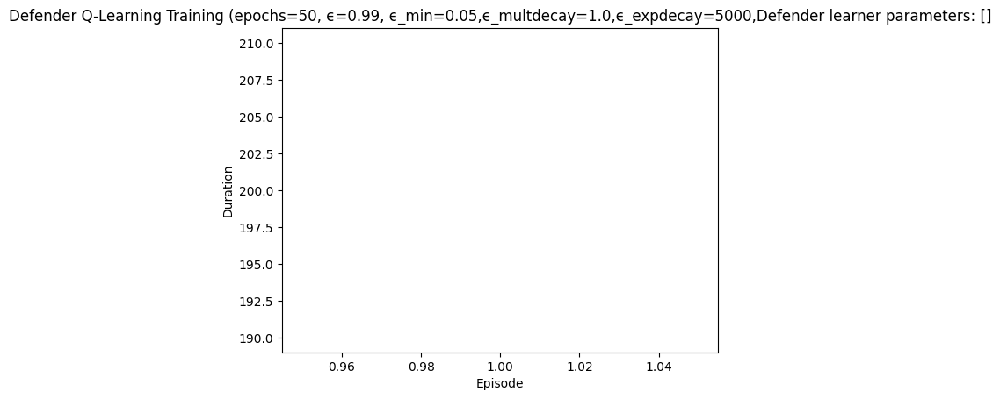

Rendering the current state of the environment
  ## Episode: 2/50 'Defender Q-Learning Training' ϵ=0.9533, Defender learner parameters: []


Episode 2|Iteration 59|reward:  655.0|last_reward_at:   59|Elapsed Time: 0:00:00||

1 2 3
{'action_type': 1, 'node_id': 2, 'parameter': 3}
[DEBUG] Received action: {'action_type': 1, 'node_id': 2, 'parameter': 3}
1 2 3
action type:  Block Traffic
Iteration 1: Action Taken: Type=Block Traffic, NodeID=2, Parameter=3
info {'action': 'block_traffic', 'status': 'success', 'node_id': '1_LinuxNode', 'port_name': 3, 'performance_metrics': {'actions_taken': 201, 'successful_actions': 77, 'failed_actions': 124}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 12 4
{'action_type': 1, 'node_id': 12, 'parameter': 4}
[DEBUG] Received action: {'action_type': 1, 'node_id': 12, 'parameter': 4}
1 12 4
action type:  Block Traffic
Iteration 2: Action Taken: Type=Block Traffic, NodeID=12, Parameter=4
info {'action': 'block_traffic', 'status': 'success', 'node_id': '11_LinuxNode', 'port_name': 4, 'performan

Episode 2|Iteration 60|reward:  650.0|last_reward_at:   59|Elapsed Time: 0:00:00||


Accessing Q-matrix with state=140, action=0
2 11 4
{'action_type': 2, 'node_id': 11, 'parameter': 4}
[DEBUG] Received action: {'action_type': 2, 'node_id': 11, 'parameter': 4}
2 11 4
action type:  Reimage Node
Iteration 61: Action Taken: Type=Reimage Node, NodeID=11, Parameter=4
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '10_WindowsNode', 'port_name': 4, 'performance_metrics': {'actions_taken': 261, 'successful_actions': 109, 'failed_actions': 152}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140

Episode 2|Iteration 114|reward: 1070.0|last_reward_at:  113|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 10 9
{'action_type': 1, 'node_id': 10, 'parameter': 9}
[DEBUG] Received action: {'action_type': 1, 'node_id': 10, 'parameter': 9}
1 10 9
action type:  Block Traffic
Iteration 62: Action Taken: Type=Block Traffic, NodeID=10, Parameter=9
info {'action': 'block_traffic', 'status': 'success', 'node_id': '9_LinuxNode', 'port_name': 9, 'performance_metrics': {'actions_taken': 262, 'successful_actions': 110, 'failed_actions': 152}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'actio

Episode 2|Iteration 164|reward: 1470.0|last_reward_at:  162|Elapsed Time: 0:00:00||

0 0 2
{'action_type': 0, 'node_id': 0, 'parameter': 2}
[DEBUG] Received action: {'action_type': 0, 'node_id': 0, 'parameter': 2}
0 0 2
action type:  Reimage Node
Iteration 116: Action Taken: Type=Reimage Node, NodeID=0, Parameter=2
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': 'start', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 316, 'successful_actions': 132, 'failed_actions': 184}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 13 9
{'action_type': 2, 'node_id': 13, 'parameter': 9}
[DEBUG] Received action: {'action_type': 2, 'node_id': 13, 'parameter': 9}
2 13 9
action type:  Reimage Node
Iteration 117: Action Taken: Type=Reimage Node, NodeID=13, Parameter=9
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '12

Episode 2|Iteration 165|reward: 1465.0|last_reward_at:  162|Elapsed Time: 0:00:00||

3 1 6
{'action_type': 3, 'node_id': 1, 'parameter': 6}
[DEBUG] Received action: {'action_type': 3, 'node_id': 1, 'parameter': 6}
3 1 6
action type:  Allow Traffic
Iteration 165: Action Taken: Type=Allow Traffic, NodeID=1, Parameter=6
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 365, 'successful_actions': 153, 'failed_actions': 212}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
3 6 1
{'action_type': 3, 'node_id': 6, 'parameter': 1}
[DEBUG] Received action: {'action_type': 3, 'node_id': 6, 'parameter': 1}
3 6 1
action type:  Allow Traffic
Iteration 166: Action Taken: Type=Allow Traffic, NodeID=6, Parameter=1
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service

Episode 2|Iteration 200|reward: 1620.0|last_reward_at:  196|Elapsed Time: 0:00:00||



Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 12 7
{'action_type': 0, 'node_id': 12, 'parameter': 7}
[DEBUG] Received action: {'action_type': 0, 'node_id': 12, 'parameter': 7}
0 12 7
action type:  Reimage Node
Iteration 167: Action Taken: Type=Reimage Node, NodeID=12, Parameter=7
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '11_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 367, 'successful_actions': 153, 'failed_actions': 214}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 4 7
{'action_type': 0, 'node_id': 4, 'parameter': 7}
[DEBUG] Received action: {'action_type': 0, 'node_id': 4, 'parameter': 7}
0 4 7
action type:  Reimage Node
Iteration 168: Action Taken: 

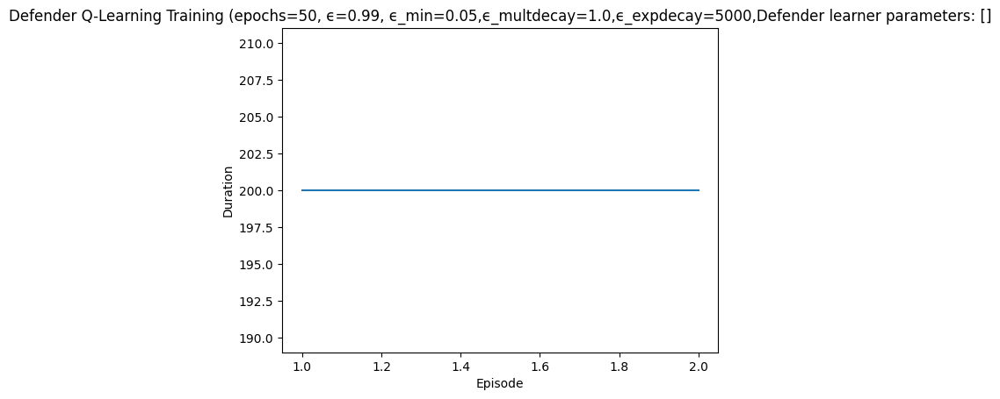

Rendering the current state of the environment
  ## Episode: 3/50 'Defender Q-Learning Training' ϵ=0.9179, Defender learner parameters: []


Episode 3|Iteration 40|reward:  370.0|last_reward_at:   39|Elapsed Time: 0:00:00||

0 10 3
{'action_type': 0, 'node_id': 10, 'parameter': 3}
[DEBUG] Received action: {'action_type': 0, 'node_id': 10, 'parameter': 3}
0 10 3
action type:  Reimage Node
Iteration 1: Action Taken: Type=Reimage Node, NodeID=10, Parameter=3
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '9_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 401, 'successful_actions': 164, 'failed_actions': 237}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 7, 'parameter': 0}
1 7 0
action type: 

Episode 3|Iteration 41|reward:  395.0|last_reward_at:   41|Elapsed Time: 0:00:00||

3 3 6
{'action_type': 3, 'node_id': 3, 'parameter': 6}
[DEBUG] Received action: {'action_type': 3, 'node_id': 3, 'parameter': 6}
3 3 6
action type:  Allow Traffic
Iteration 42: Action Taken: Type=Allow Traffic, NodeID=3, Parameter=6
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 442, 'successful_actions': 184, 'failed_actions': 258}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140

Episode 3|Iteration 83|reward:  625.0|last_reward_at:   83|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
3 6 7
{'action_type': 3, 'node_id': 6, 'parameter': 7}
[DEBUG] Received action: {'action_type': 3, 'node_id': 6, 'parameter': 7}
3 6 7
action type:  Allow Traffic
Iteration 43: Action Taken: Type=Allow Traffic, NodeID=6, Parameter=7
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 443, 'successful_actions': 184, 'failed_actions': 259}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 13 5
{'action_type': 4, 'node_id': 13, 'parameter': 5}
[DEBUG] Received action: {'action_type': 4, 'node_id': 13, 'parameter': 5}
4 13 5
action type:  Start Service
Iteration 44: Action Taken: Type=Start Service, NodeID=13, Paramet

Episode 3|Iteration 84|reward:  620.0|last_reward_at:   83|Elapsed Time: 0:00:00||

3 3 3
{'action_type': 3, 'node_id': 3, 'parameter': 3}
[DEBUG] Received action: {'action_type': 3, 'node_id': 3, 'parameter': 3}
3 3 3
action type:  Allow Traffic
Iteration 84: Action Taken: Type=Allow Traffic, NodeID=3, Parameter=3
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 484, 'successful_actions': 199, 'failed_actions': 285}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 3|Iteration 142|reward:  830.0|last_reward_at:  140|Elapsed Time: 0:00:00||

2 7 1
{'action_type': 2, 'node_id': 7, 'parameter': 1}
[DEBUG] Received action: {'action_type': 2, 'node_id': 7, 'parameter': 1}
2 7 1
action type:  Reimage Node
Iteration 85: Action Taken: Type=Reimage Node, NodeID=7, Parameter=1
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '6_WindowsNode', 'port_name': 1, 'performance_metrics': {'actions_taken': 485, 'successful_actions': 200, 'failed_actions': 285}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 3, 'parameter': 0}
3 3 0
action type:  Allow Traffic
Iteration 86: Action Taken: Typ

Episode 3|Iteration 143|reward:  855.0|last_reward_at:  143|Elapsed Time: 0:00:00||

3

Episode 3|Iteration 200|reward: 1090.0|last_reward_at:  197|Elapsed Time: 0:00:00||


 12 4
{'action_type': 3, 'node_id': 12, 'parameter': 4}
[DEBUG] Received action: {'action_type': 3, 'node_id': 12, 'parameter': 4}
3 12 4
action type:  Allow Traffic
Iteration 144: Action Taken: Type=Allow Traffic, NodeID=12, Parameter=4
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 544, 'successful_actions': 218, 'failed_actions': 326}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 0 3
{'action_type': 4, 'node_id': 0, 'parameter': 3}
[DEBUG] Received action: {'action_type': 4, 'node_id': 0, 'parameter': 3}
4 0 3
action type:  Start Service
Iteration 145: Action Taken: Type=Start Service, NodeID=0, Parameter=3
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'star

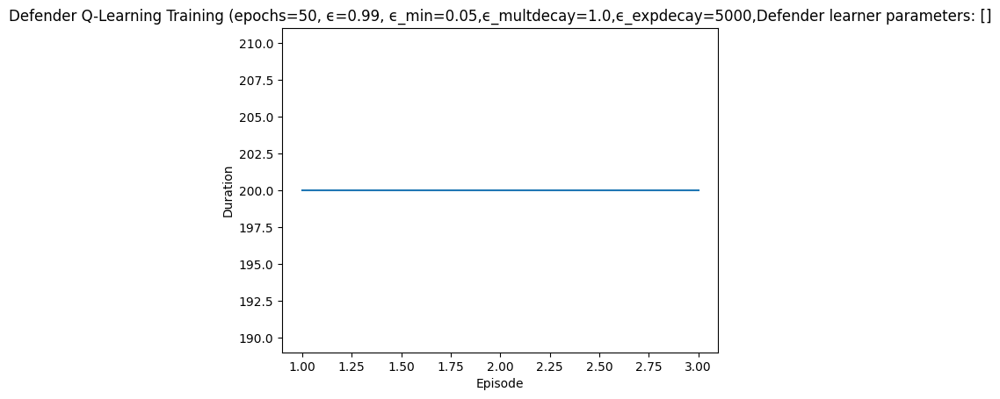

Rendering the current state of the environment
  ## Episode: 4/50 'Defender Q-Learning Training' ϵ=0.8839, Defender learner parameters: []


Episode 4|Iteration 5|reward:    5.0|last_reward_at:    5|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 2, 'parameter': 0}
0 2 0
action type:  Reimage Node
Iteration 1: Action Taken: Type=Reimage Node, NodeID=2, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '1_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 601, 'successful_actions': 236, 'failed_actions': 365}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 9 4
{'action_type': 0, 'node_id': 9, 'parameter': 4}
[DEBUG] Received action: {'action_type': 0, 'node_id': 9, 'parameter': 4}
0 9 4
action type:  Reim

Episode 4|Iteration 74|reward:  420.0|last_reward_at:   73|Elapsed Time: 0:00:00||

info {'action': 'allow_traffic', 'status': 'success', 'node_id': '9_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 606, 'successful_actions': 238, 'failed_actions': 368}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 12 8
{'action_type': 0, 'node_id': 12, 'parameter': 8}
[DEBUG] Received action: {'action_type': 0, 'node_id': 12, 'parameter': 8}
0 12 8
action type:  Reimage Node
Iteration 7: Action Taken: Type=Reimage Node, NodeID=12, Parameter=8
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '11_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 607, 'successful_actions': 238, 'failed_actions': 369}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active

Episode 4|Iteration 75|reward:  445.0|last_reward_at:   74|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 9, 'parameter': 0}
1 9 0
action type:  Block Traffic
Iteration 75: Action Taken: Type=Block Traffic, NodeID=9, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '8_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 675, 'successful_actions': 264, 'failed_actions': 411}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 4|Iteration 82|reward:  550.0|last_reward_at:   81|Elapsed Time: 0:00:00||

1 0 0
{'action_type': 1, 'node_id': 0, 'parameter': 0}
[DEBUG] Received action: {'action_type': 1, 'node_id': 0, 'parameter': 0}
1 0 0
action type:  Block Traffic
Iteration 76: Action Taken: Type=Block Traffic, NodeID=0, Parameter=0
info {'action': 'block_traffic', 'status': 'failed', 'node_id': 'start', 'port_name': 0, 'reason': 'Machine not running', 'performance_metrics': {'actions_taken': 676, 'successful_actions': 264, 'failed_actions': 412}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 8 1
{'action_type': 1, 'node_id': 8, 'parameter': 1}
[DEBUG] Received action: {'action_type': 1, 'node_id': 8, 'parameter': 1}
1 8 1
action type:  Block Traffic
Iteration 77: Action Taken: Type=Block Traffic, NodeID=8, Parameter=1
info {'action': 'block_traffic', 'status': 'success', 'node_id': '7_LinuxNode', 'po

Episode 4|Iteration 137|reward:  915.0|last_reward_at:  137|Elapsed Time: 0:00:00||

0 5 6
{'action_type': 0, 'node_id': 5, 'parameter': 6}
[DEBUG] Received action: {'action_type': 0, 'node_id': 5, 'parameter': 6}
0 5 6
action type:  Reimage Node
Iteration 83: Action Taken: Type=Reimage Node, NodeID=5, Parameter=6
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '4_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 683, 'successful_actions': 269, 'failed_actions': 414}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 9 5
{'action_type': 2, 'node_id': 9, 'parameter': 5}
[DEBUG] Received action: {'action_type': 2, 'node_id': 9, 'parameter': 5}
2 9 5
action type:  Reimage Node
Iteration 84: Action Taken: Type=Reimage Node, NodeID=9, Parameter=5
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '8

Episode 4|Iteration 140|reward:  900.0|last_reward_at:  137|Elapsed Time: 0:00:00||

4 7 5
{'action_type': 4, 'node_id': 7, 'parameter': 5}
[DEBUG] Received action: {'action_type': 4, 'node_id': 7, 'parameter': 5}
4 7 5
action type:  Start Service
Iteration 139: Action Taken: Type=Start Service, NodeID=7, Parameter=5
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 739, 'successful_actions': 291, 'failed_actions': 448}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 12 2
{'action_type': 4, 'node_id': 12, 'parameter': 2}
[DEBUG] Received action: {'action_type': 4, 'node_id': 12, 'parameter': 2}
4 12 2
action type:  Start Service
Iteration 140: Action Taken: Type=Start Service, NodeID=12, Parameter=2
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action':

Episode 4|Iteration 143|reward:  975.0|last_reward_at:  142|Elapsed Time: 0:00:00||

2 5 6
{'action_type': 2, 'node_id': 5, 'parameter': 6}
[DEBUG] Received action: {'action_type': 2, 'node_id': 5, 'parameter': 6}
2 5 6
action type:  Reimage Node
Iteration 141: Action Taken: Type=Reimage Node, NodeID=5, Parameter=6
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '4_WindowsNode', 'port_name': 6, 'performance_metrics': {'actions_taken': 741, 'successful_actions': 292, 'failed_actions': 449}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 6 0
{'action_type': 2, 'node_id': 6, 'parameter': 0}
[DEBUG] Received action: {'action_type': 2, 'node_id': 6, 'parameter': 0}
2 6 0
action type:  Reimage Node
Iteration 142: Action Taken: Type=Reimage Node, NodeID=6, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '5_LinuxNode', 'port_name': 0, 'performance_

Episode 4|Iteration 187|reward: 1255.0|last_reward_at:  185|Elapsed Time: 0:00:00||

4 4 1
{'action_type': 4, 'node_id': 4, 'parameter': 1}
[DEBUG] Received action: {'action_type': 4, 'node_id': 4, 'parameter': 1}
4 4 1
action type:  Start Service
Iteration 144: Action Taken: Type=Start Service, NodeID=4, Parameter=1
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 744, 'successful_actions': 294, 'failed_actions': 450}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 6 9
{'action_type': 1, 'node_id': 6, 'parameter': 9}
[DEBUG] Received action: {'action_type': 1, 'node_id': 6, 'parameter': 9}
1 6 9
action type:  Block Traffic
Iteration 145: Action Taken: Type=Block Traffic, NodeID=6, Parameter=9
info {'action': 'block_traffic', 'status': 'success', 'node_id': '5_LinuxNode', 'port_name': 9,

Episode 4|Iteration 187|reward: 1255.0|last_reward_at:  187|Elapsed Time: 0:00:00||

3 6 1
{'action_type': 3, 'node_id': 6, 'parameter': 1}
[DEBUG] Received action: {'action_type': 3, 'node_id': 6, 'parameter': 1}
3 6 1


Episode 4|Iteration 193|reward: 1345.0|last_reward_at:  192|Elapsed Time: 0:00:00||

action type:  Allow Traffic
Iteration 188: Action Taken: Type=Allow Traffic, NodeID=6, Parameter=1
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 788, 'successful_actions': 311, 'failed_actions': 477}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 4 0
{'action_type': 2, 'node_id': 4, 'parameter': 0}
[DEBUG] Received action: {'action_type': 2, 'node_id': 4, 'parameter': 0}
2 4 0
action type:  Reimage Node
Iteration 189: Action Taken: Type=Reimage Node, NodeID=4, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '3_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 789, 'successful_actions': 312, 'failed_actions': 477}, 'network_availability': 1.0}
firewall_active

Episode 4|Iteration 200|reward: 1340.0|last_reward_at:  197|Elapsed Time: 0:00:00||


4 4 0
{'action_type': 4, 'node_id': 4, 'parameter': 0}
[DEBUG] Received action: {'action_type': 4, 'node_id': 4, 'parameter': 0}
4 4 0
action type:  Start Service
Iteration 194: Action Taken: Type=Start Service, NodeID=4, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 794, 'successful_actions': 315, 'failed_actions': 479}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 8, 'parameter': 0}
3 8 0
action type:  Allow Traffic
Iteration 195: Act

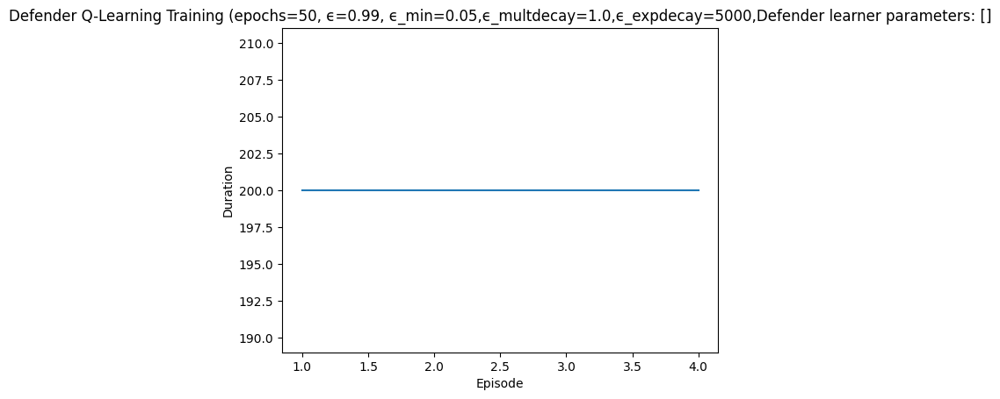

Rendering the current state of the environment
  ## Episode: 5/50 'Defender Q-Learning Training' ϵ=0.8512, Defender learner parameters: []


Episode 5|Iteration 3|reward:   35.0|last_reward_at:    3|Elapsed Time: 0:00:00||

1 8 5
{'action_type': 1, 'node_id': 8, 'parameter': 5}
[DEBUG] Received action: {'action_type': 1, 'node_id': 8, 'parameter': 5}
1 8 5
action type:  Block Traffic
Iteration 1: Action Taken: Type=Block Traffic, NodeID=8, Parameter=5
info {'action': 'block_traffic', 'status': 'success', 'node_id': '7_LinuxNode', 'port_name': 5, 'performance_metrics': {'actions_taken': 801, 'successful_actions': 317, 'failed_actions': 484}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 0 1
{'action_type': 1, 'node_id': 0, 'parameter': 1}
[DEBUG] Received action: {'action_type': 1, 'node_id': 0, 'parameter': 1}
1 0 1
action type:  Block Traffic
Iteration 2: Action Taken: Type=Block Traffic, NodeID=0, Parameter=1
info {'action': 'block_traffic', 'status': 'failed', 'node_id': 'start', 'port_name': 1, 'reason': 'Machine not

Episode 5|Iteration 35|reward:  265.0|last_reward_at:   35|Elapsed Time: 0:00:00||

1 4 7
{'action_type': 1, 'node_id': 4, 'parameter': 7}
[DEBUG] Received action: {'action_type': 1, 'node_id': 4, 'parameter': 7}
1 4 7
action type:  Block Traffic
Iteration 4: Action Taken: Type=Block Traffic, NodeID=4, Parameter=7
info {'action': 'block_traffic', 'status': 'success', 'node_id': '3_LinuxNode', 'port_name': 7, 'performance_metrics': {'actions_taken': 804, 'successful_actions': 319, 'failed_actions': 485}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 2, 'parameter': 0}
3 2 0
action type:  Allow Traffic
Iteration 5: Action Taken: Type=

Episode 5|Iteration 37|reward:  255.0|last_reward_at:   35|Elapsed Time: 0:00:00||


Accessing Q-matrix with state=140, action=0
4 8 5
{'action_type': 4, 'node_id': 8, 'parameter': 5}
[DEBUG] Received action: {'action_type': 4, 'node_id': 8, 'parameter': 5}
4 8 5
action type:  Start Service
Iteration 37: Action Taken: Type=Start Service, NodeID=8, Parameter=5
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 837, 'successful_actions': 331, 'failed_actions': 506}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 3 2
{'action_type': 1, 'node_id': 3, 'parameter': 2}
[DEBUG] Received action: {'action_type': 1, 'node_id': 3, 'parameter': 2}
1 3 2
action type:  Block Traffic
Iteration 38: Action Taken: Type=Block Traffic, NodeID=3, Parameter=2
info {'action': 'block_traffic', 'status': 'success'

Episode 5|Iteration 75|reward:  525.0|last_reward_at:   71|Elapsed Time: 0:00:00||

3 2 9
{'action_type': 3, 'node_id': 2, 'parameter': 9}
[DEBUG] Received action: {'action_type': 3, 'node_id': 2, 'parameter': 9}
3 2 9
action type:  Allow Traffic
Iteration 39: Action Taken: Type=Allow Traffic, NodeID=2, Parameter=9
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 839, 'successful_actions': 332, 'failed_actions': 507}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
3 10 3
{'action_type': 3, 'node_id': 10, 'parameter': 3}
[DEBUG] Received action: {'action_type': 3, 'node_id': 10, 'parameter': 3}
3 10 3
action type:  Allow Traffic
Iteration 40: Action Taken: Type=Allow Traffic, NodeID=10, Parameter=3
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_serv

Episode 5|Iteration 77|reward:  545.0|last_reward_at:   71|Elapsed Time: 0:00:00||

0 0 6
{'action_type': 0, 'node_id': 0, 'parameter': 6}
[DEBUG] Received action: {'action_type': 0, 'node_id': 0, 'parameter': 6}
0 0 6
action type:  Reimage Node
Iteration 76: Action Taken: Type=Reimage Node, NodeID=0, Parameter=6
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': 'start', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 876, 'successful_actions': 347, 'failed_actions': 529}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 10 9
{'action_type': 1, 'node_id': 10, 'parameter': 9}
[DEBUG] Received action: {'action_type': 1, 'node_id': 10, 'parameter': 9}
1 10 9
action type:  Block Traffic
Iteration 77: Action Taken: Type=Block Traffic, NodeID=10, Parameter=9
info {'action': 'block_traffic', 'status': 'success', 'node_id': '9_

Episode 5|Iteration 77|reward:  545.0|last_reward_at:   77|Elapsed Time: 0:00:00||

4 6 3
{'action_type': 4, 'node_id': 6, 'parameter': 3}
[DEBUG] Received action: {'action_type': 4, 'node_id': 6, 'parameter': 3}
4 6 3

Episode 5|Iteration 114|reward:  740.0|last_reward_at:  112|Elapsed Time: 0:00:00||


action type:  Start Service
Iteration 78: Action Taken: Type=Start Service, NodeID=6, Parameter=3
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 878, 'successful_actions': 348, 'failed_actions': 530}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 8 0
{'action_type': 2, 'node_id': 8, 'parameter': 0}
[DEBUG] Received action: {'action_type': 2, 'node_id': 8, 'parameter': 0}
2 8 0
action type:  Reimage Node
Iteration 79: Action Taken: Type=Reimage Node, NodeID=8, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '7_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 879, 'successful_actions': 349, 'failed_actions': 530}, 'network_availability': 1.0}
firewall_ac

Episode 5|Iteration 115|reward:  735.0|last_reward_at:  112|Elapsed Time: 0:00:00||

 Allow Traffic
Iteration 115: Action Taken: Type=Allow Traffic, NodeID=4, Parameter=5
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 915, 'successful_actions': 361, 'failed_actions': 554}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 10, 'parameter': 0}
2 10 0
action type:  Reimage Node
Iteration 116: Action Taken: Type=Reimage Node, NodeID=10, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '9_LinuxNode', 'port_name': 0, 'pe

Episode 5|Iteration 156|reward: 1100.0|last_reward_at:  156|Elapsed Time: 0:00:00||

Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 9, 'parameter': 0}
3 9 0
action type:  Allow Traffic
Iteration 117: Action Taken: Type=Allow Traffic, NodeID=9, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 917, 'successful_actions': 362, 'failed_actions': 555}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 10 7
{'action_type': 4, 'node_id': 10, 'parameter': 7}
[DEBUG] Received action: {'a

Episode 5|Iteration 157|reward: 1095.0|last_reward_at:  156|Elapsed Time: 0:00:00||

4 1 0
{'action_type': 4, 'node_id': 1, 'parameter': 0}
[DEBUG] Received action: {'action_type': 4, 'node_id': 1, 'parameter': 0}
4 1 0
action type:  Start Service
Iteration 157: Action Taken: Type=Start Service, NodeID=1, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 957, 'successful_actions': 380, 'failed_actions': 577}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 3 1
{'action_type': 0, 'node_id': 3, 'parameter': 1}
[DEBUG] Received action: {'action_type': 0, 'node_id': 3, 'parameter': 1}
0 3 1
action type:  Reimage Node
Iteration 158: Action Taken: Type=Reimage Node, NodeID=3, Parameter=1
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '2_WindowsNode', 'reason': 'R

Episode 5|Iteration 159|reward: 1085.0|last_reward_at:  156|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
3 13 6
{'action_type': 3, 'node_id': 13, 'parameter': 6}
[DEBUG] Received action: {'action_type': 3, 'node_id': 13, 'parameter': 6}
3 13 6
action type:  Allow Traffic
Iteration 159: Action Taken: Type=Allow Traffic, NodeID=13, Parameter=6
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 959, 'successful_actions': 380, 'failed_actions': 579}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 10 7
{'action_type': 1, 'node_id': 10, 'parameter': 7}
[DEBUG] Received action: {'action_type': 1, 'node_id': 10, 'parameter': 7}
1 10 7
action type:  Block Traffic
Iteration 160: Action Taken: Type=Block Traffic, NodeID=10, 

Episode 5|Iteration 200|reward: 1360.0|last_reward_at:  200|Elapsed Time: 0:00:00||



Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 6, 'parameter': 0}
4 6 0
action type:  Start Service
Iteration 161: Action Taken: Type=Start Service, NodeID=6, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 961, 'successful_actions': 381, 'failed_actions': 580}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 7 0
{'action_type': 1, 'node_id': 7, 'parameter': 0}
[DEBUG] Received action:

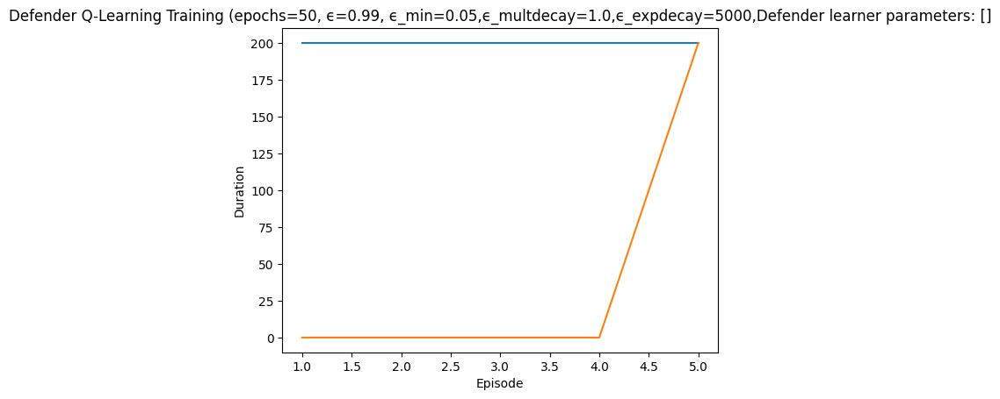

Rendering the current state of the environment
  ## Episode: 6/50 'Defender Q-Learning Training' ϵ=0.8198, Defender learner parameters: []


Episode 6|Iteration 10|reward:  100.0|last_reward_at:    8|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 10, 'parameter': 0}
0 10 0
action type:  Reimage Node
Iteration 1: Action Taken: Type=Reimage Node, NodeID=10, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '9_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 1001, 'successful_actions': 396, 'failed_actions': 605}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
3 6 2
{'action_type': 3, 'node_id': 6, 'parameter': 2}
[DEBUG] Received action: {'action_type': 3, 'node_id': 6, 'parameter': 2}
3 6 2
action type:  

Episode 6|Iteration 78|reward:  610.0|last_reward_at:   78|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 1, 'parameter': 0}
3 1 0
action type:  Allow Traffic
Iteration 11: Action Taken: Type=Allow Traffic, NodeID=1, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 1011, 'successful_actions': 401, 'failed_actions': 610}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 0 0
{'action_type': 1, 'node_id': 0, 'parameter': 0}
[DEBUG] Received action: {'action_type': 1, 'node_id': 0, 'parameter': 0}
1 0 0
action type:  Block Traffic
Iteration 12: Action Ta

Episode 6|Iteration 80|reward:  660.0|last_reward_at:   79|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 11 1
{'action_type': 1, 'node_id': 11, 'parameter': 1}
[DEBUG] Received action: {'action_type': 1, 'node_id': 11, 'parameter': 1}
1 11 1
action type:  Block Traffic
Iteration 80: Action Taken: Type=Block Traffic, NodeID=11, Parameter=1
info {'action': 'block_traffic', 'status': 'success', 'node_id': '10_WindowsNode', 'port_name': 1, 'performance_metrics': {'actions_taken': 1080, 'successful_actions': 432, 'failed_actions': 648}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 6|Iteration 84|reward:  730.0|last_reward_at:   83|Elapsed Time: 0:00:00||

0 9 8
{'action_type': 0, 'node_id': 9, 'parameter': 8}
[DEBUG] Received action: {'action_type': 0, 'node_id': 9, 'parameter': 8}
0 9 8
action type:  Reimage Node
Iteration 81: Action Taken: Type=Reimage Node, NodeID=9, Parameter=8
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '8_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 1081, 'successful_actions': 432, 'failed_actions': 649}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 9, 'parameter': 0}
1 9 0
action type:  

Episode 6|Iteration 156|reward: 1290.0|last_reward_at:  155|Elapsed Time: 0:00:00||

3 12 0
{'action_type': 3, 'node_id': 12, 'parameter': 0}
[DEBUG] Received action: {'action_type': 3, 'node_id': 12, 'parameter': 0}
3 12 0
action type:  Allow Traffic
Iteration 85: Action Taken: Type=Allow Traffic, NodeID=12, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 1085, 'successful_actions': 435, 'failed_actions': 650}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
3 0 3
{'action_type': 3, 'node_id': 0, 'parameter': 3}
[DEBUG] Received action: {'action_type': 3, 'node_id': 0, 'parameter': 3}
3 0 3
action type:  Allow Traffic
Iteration 86: Action Taken: Type=Allow Traffic, NodeID=0, Parameter=3
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_ser

Episode 6|Iteration 160|reward: 1330.0|last_reward_at:  160|Elapsed Time: 0:00:00||

Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
3 9 7
{'action_type': 3, 'node_id': 9, 'parameter': 7}
[DEBUG] Received action: {'action_type': 3, 'node_id': 9, 'parameter': 7}
3 9 7
action type:  Allow Traffic
Iteration 158: Action Taken: Type=Allow Traffic, NodeID=9, Parameter=7
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 1158, 'successful_actions': 468, 'failed_actions': 690}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 1 4
{'action_type': 4, 'node_id': 1, 'parameter': 4}
[DEBUG] Received action: {'action_type': 4, 'node_id': 1, 'parameter': 4}
4 1 4
action type:  Start Service
Iteration 159: Action Taken: Type=Start Service, NodeID=1, Parameter=

Episode 6|Iteration 167|reward: 1355.0|last_reward_at:  167|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
3 3 2
{'action_type': 3, 'node_id': 3, 'parameter': 2}
[DEBUG] Received action: {'action_type': 3, 'node_id': 3, 'parameter': 2}
3 3 2
action type:  Allow Traffic
Iteration 162: Action Taken: Type=Allow Traffic, NodeID=3, Parameter=2
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 1162, 'successful_actions': 469, 'failed_actions': 693}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
3 4 3
{'action_type': 3, 'node_id': 4, 'parameter': 3}
[DEBUG] Received action: {'action_type': 3, 'node_id': 4, 'parameter': 3}
3 4 3
action type:  Allow Traffic
Iteration 163: Action Taken: Type=Allow Traffic, NodeID=4, Parameter

Episode 6|Iteration 200|reward: 1490.0|last_reward_at:  200|Elapsed Time: 0:00:00||



Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 12 8
{'action_type': 0, 'node_id': 12, 'parameter': 8}
[DEBUG] Received action: {'action_type': 0, 'node_id': 12, 'parameter': 8}
0 12 8
action type:  Reimage Node
Iteration 169: Action Taken: Type=Reimage Node, NodeID=12, Parameter=8
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '11_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 1169, 'successful_actions': 471, 'failed_actions': 698}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the c

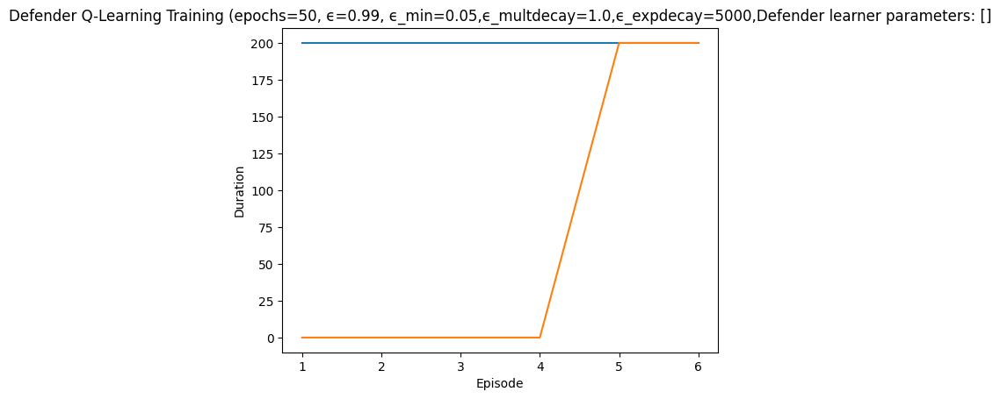

Rendering the current state of the environment
  ## Episode: 7/50 'Defender Q-Learning Training' ϵ=0.7896, Defender learner parameters: []


Episode 7|Iteration 19|reward:  135.0|last_reward_at:   17|Elapsed Time: 0:00:00||

2 0 8
{'action_type': 2, 'node_id': 0, 'parameter': 8}
[DEBUG] Received action: {'action_type': 2, 'node_id': 0, 'parameter': 8}
2 0 8
action type:  Reimage Node
Iteration 1: Action Taken: Type=Reimage Node, NodeID=0, Parameter=8
info {'action': 'allow_traffic', 'status': 'failed', 'node_id': 'start', 'port_name': 8, 'reason': 'Machine not running', 'performance_metrics': {'actions_taken': 1201, 'successful_actions': 482, 'failed_actions': 719}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
3 5 6
{'action_type': 3, 'node_id': 5, 'parameter': 6}
[DEBUG] Received action: {'action_type': 3, 'node_id': 5, 'parameter': 6}
3 5 6
action type:  Allow Traffic
Iteration 2: Action Taken: Type=Allow Traffic, NodeID=5, Parameter=6
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action':

Episode 7|Iteration 64|reward:  240.0|last_reward_at:   60|Elapsed Time: 0:00:00||

0 13 9
{'action_type': 0, 'node_id': 13, 'parameter': 9}
[DEBUG] Received action: {'action_type': 0, 'node_id': 13, 'parameter': 9}
0 13 9
action type:  Reimage Node
Iteration 20: Action Taken: Type=Reimage Node, NodeID=13, Parameter=9
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '12_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 1220, 'successful_actions': 490, 'failed_actions': 730}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 5 6
{'action_type': 2, 'node_id': 5, 'parameter': 6}
[DEBUG] Received action: {'action_type': 2, 'node_id': 5, 'parameter': 6}
2 5 6
action type:  Reimage Node
Iteration 21: Action Taken: Type=Reimage Node, NodeID=5, Parameter=6
info {'action': 'allow_traffic', 'status': 'success', 'node_

Episode 7|Iteration 66|reward:  230.0|last_reward_at:   64|Elapsed Time: 0:00:00||

3 12 3
{'action_type': 3, 'node_id': 12, 'parameter': 3}
[DEBUG] Received action: {'action_type': 3, 'node_id': 12, 'parameter': 3}
3 12 3
action type:  Allow Traffic
Iteration 65: Action Taken: Type=Allow Traffic, NodeID=12, Parameter=3
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 1265, 'successful_actions': 501, 'failed_actions': 764}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 0, 'parameter': 0}
3 0 0
action type:  Allow Traffic
Iteration 66: Acti

Episode 7|Iteration 78|reward:  320.0|last_reward_at:   78|Elapsed Time: 0:00:00||

3 9 3
{'action_type': 3, 'node_id': 9, 'parameter': 3}
[DEBUG] Received action: {'action_type': 3, 'node_id': 9, 'parameter': 3}
3 9 3
action type:  Allow Traffic
Iteration 67: Action Taken: Type=Allow Traffic, NodeID=9, Parameter=3
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 1267, 'successful_actions': 501, 'failed_actions': 766}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 10 1
{'action_type': 2, 'node_id': 10, 'parameter': 1}
[DEBUG] Received action: {'action_type': 2, 'node_id': 10, 'parameter': 1}
2 10 1
action type:  Reimage Node
Iteration 68: Action Taken: Type=Reimage Node, NodeID=10, Parameter=1
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '9_LinuxNode', 'port_name': 1, 'p

Episode 7|Iteration 122|reward:  590.0|last_reward_at:  119|Elapsed Time: 0:00:00||

 Block Traffic
Iteration 79: Action Taken: Type=Block Traffic, NodeID=5, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '4_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 1279, 'successful_actions': 507, 'failed_actions': 772}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 1 0
{'action_type': 1, 'node_id': 1, 'parameter': 0}
[DEBUG] Received action: {'action_type': 1, 'node_id': 1, 'parameter': 0}
1 1 0
action type:  Block Traffic
Iteration 80: Action Taken: Type=Block Traffic, NodeID=1, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '13_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 1280, 'successful_actions': 508, 'failed_actions': 772}, 'network_availability': 1.0}
firewall_active: 1.40000000000

Episode 7|Iteration 123|reward:  615.0|last_reward_at:  123|Elapsed Time: 0:00:00||

Accessing Q-matrix with state=140, action=0
4 2 6
{'action_type': 4, 'node_id': 2, 'parameter': 6}
[DEBUG] Received action: {'action_type': 4, 'node_id': 2, 'parameter': 6}
4 2 6

Episode 7|Iteration 133|reward:  565.0|last_reward_at:  127|Elapsed Time: 0:00:00||


action type:  Start Service
Iteration 124: Action Taken: Type=Start Service, NodeID=2, Parameter=6
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 1324, 'successful_actions': 524, 'failed_actions': 800}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 2, 'parameter': 0}
4 2 0
action type:  Start Service
Iteration 125: Action Taken: Type=Start Service, NodeID=2, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found',

Episode 7|Iteration 180|reward:  870.0|last_reward_at:  179|Elapsed Time: 0:00:00||

0 2 6
{'action_type': 0, 'node_id': 2, 'parameter': 6}
[DEBUG] Received action: {'action_type': 0, 'node_id': 2, 'parameter': 6}
0 2 6
action type:  Reimage Node
Iteration 134: Action Taken: Type=Reimage Node, NodeID=2, Parameter=6
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '1_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 1334, 'successful_actions': 525, 'failed_actions': 809}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 13, 'parameter': 0}
4 13 0
action type: 

Episode 7|Iteration 180|reward:  870.0|last_reward_at:  180|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 4, 'parameter': 0}
3 4 0
action type:  Allow Traffic
Iteration 181: Action Taken: Type=Allow Traffic, NodeID=4, Parameter=0
info

Episode 7|Iteration 193|reward:  855.0|last_reward_at:  191|Elapsed Time: 0:00:00||

 {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 1381, 'successful_actions': 543, 'failed_actions': 838}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 10 5
{'action_type': 4, 'node_id': 10, 'parameter': 5}
[DEBUG] Received action: {'action_type': 4, 'node_id': 10, 'parameter': 5}
4 10 5
action type:  Start Service
Iteration 182: Action Taken: Type=Start Service, NodeID=10, Parameter=5
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 1382, 'successful_actions': 543, 'failed_actions': 839}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state:

Episode 7|Iteration 200|reward:  900.0|last_reward_at:  200|Elapsed Time: 0:00:00||



Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 9 0
{'action_type': 2, 'node_id': 9, 'parameter': 0}
[DEBUG] Received action: {'action_type': 2, 'node_id': 9, 'parameter': 0}
2 9 0
action type:  Reimage Node
Iteration 195: Action Taken: Type=Reimage Node, NodeID=9, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '8_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 1395, 'successful_actions': 546, 'failed_actions': 849}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 1 0
{'action_type': 0, 'node_id': 1, 'parameter': 0}
[DEBUG] Received action: {'action_type': 0, 'node_id': 1, 'parameter': 0}
0 1 0
action type:  Reimage Node
Iteration 196: Action Taken: Type=Reimage Node, NodeID=1, Parameter=0
info {

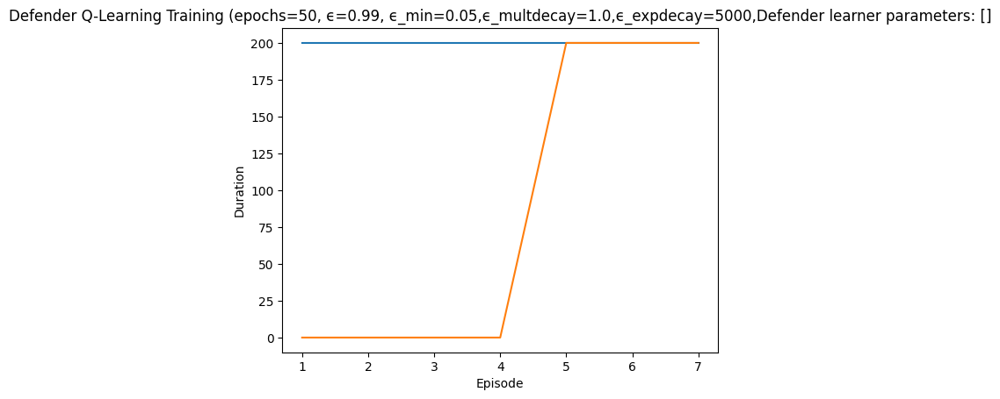

Rendering the current state of the environment
  ## Episode: 8/50 'Defender Q-Learning Training' ϵ=0.7606, Defender learner parameters: []


Episode 8|Iteration 56|reward:  410.0|last_reward_at:   51|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 3, 'parameter': 0}
3 3 0
action type:  Allow Traffic
Iteration 1: Action Taken: Type=Allow Traffic, NodeID=3, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 1401, 'successful_actions': 548, 'failed_actions': 853}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 2 7
{'action_type': 2, 'node_id': 2, 'parameter': 7}
[DEBUG] Received action: {'action_type': 2, 'node_id': 2, 'parameter': 7}
2 2 7
action type:  Reimage Node
Iteration 2: Action Taken

Episode 8|Iteration 58|reward:  430.0|last_reward_at:   51|Elapsed Time: 0:00:00||

4 1 9
{'action_type': 4, 'node_id': 1, 'parameter': 9}
[DEBUG] Received action: {'action_type': 4, 'node_id': 1, 'parameter': 9}
4 1 9
action type:  Start Service
Iteration 57: Action Taken: Type=Start Service, NodeID=1, Parameter=9
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 1457, 'successful_actions': 571, 'failed_actions': 886}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 10 9
{'action_type': 1, 'node_id': 10, 'parameter': 9}
[DEBUG] Received action: {'action_type': 1, 'node_id': 10, 'parameter': 9}
1 10 9
action type:  Block Traffic
Iteration 58: Action Taken: Type=Block Traffic, NodeID=10, Parameter=9
info {'action': 'block_traffic', 'status': 'success', 'node_id': '9_LinuxNode', 'port_name'

Episode 8|Iteration 110|reward:  590.0|last_reward_at:  110|Elapsed Time: 0:00:00||

3 4 8
{'action_type': 3, 'node_id': 4, 'parameter': 8}
[DEBUG] Received action: {'action_type': 3, 'node_id': 4, 'parameter': 8}
3 4 8
action type:  Allow Traffic
Iteration 59: Action Taken: Type=Allow Traffic, NodeID=4, Parameter=8
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 1459, 'successful_actions': 572, 'failed_actions': 887}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
3 13 0
{'action_type': 3, 'node_id': 13, 'parameter': 0}
[DEBUG] Received action: {'action_type': 3, 'node_id': 13, 'parameter': 0}
3 13 0
action type:  Allow Traffic
Iteration 60: Action Taken: Type=Allow Traffic, NodeID=13, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_ser

Episode 8|Iteration 112|reward:  610.0|last_reward_at:  112|Elapsed Time: 0:00:00||

3 1 8
{'action_type': 3, 'node_id': 1, 'parameter': 8}
[DEBUG] Received action: {'action_type': 3, 'node_id': 1, 'parameter': 8}
3 1 8
action type:  Allow Traffic
Iteration 111: Action Taken: Type=Allow Traffic, NodeID=1, Parameter=8
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 1511, 'successful_actions': 587, 'failed_actions': 924}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 6 7
{'action_type': 2, 'node_id': 6, 'parameter': 7}
[DEBUG] Received action: {'action_type': 2, 'node_id': 6, 'parameter': 7}
2 6 7
action type:  Reimage Node
Iteration 112: Action Taken: Type=Reimage Node, NodeID=6, Parameter=7
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '5_LinuxNode', 'port_name': 7, 'perf

Episode 8|Iteration 168|reward:  870.0|last_reward_at:  166|Elapsed Time: 0:00:00||

4 4 1
{'action_type': 4, 'node_id': 4, 'parameter': 1}
[DEBUG] Received action: {'action_type': 4, 'node_id': 4, 'parameter': 1}
4 4 1
action type:  Start Service
Iteration 113: Action Taken: Type=Start Service, NodeID=4, Parameter=1
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 1513, 'successful_actions': 588, 'failed_actions': 925}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 2, 'parameter': 0}
3 2 0
action type:  Allow Traffic
Iteration 114: Ac

Episode 8|Iteration 168|reward:  870.0|last_reward_at:  168|Elapsed Time: 0:00:00||

0 3 7
{'action_type': 0, 'node_id': 3, 'parameter': 7}
[DEBUG] Received action: {'action_type': 0, 'node_id': 3, 'parameter': 7}
0 3 7
action type:  Reimage Node
Iteration 169: Action Taken: Type=Reimage Node, NodeID=3, Parameter=7
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '2_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 1569, 'successful_actions': 606, 'failed_actions': 963}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1


Episode 8|Iteration 200|reward: 1100.0|last_reward_at:  196|Elapsed Time: 0:00:00||


Accessing Q-matrix with state=140, action=0
0 7 8
{'action_type': 0, 'node_id': 7, 'parameter': 8}
[DEBUG] Received action: {'action_type': 0, 'node_id': 7, 'parameter': 8}
0 7 8
action type:  Reimage Node
Iteration 170: Action Taken: Type=Reimage Node, NodeID=7, Parameter=8
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '6_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 1570, 'successful_actions': 606, 'failed_actions': 964}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 4 2
{'action_type': 1, 'node_id': 4, 'parameter': 2}
[DEBUG] Received action: {'action_type': 1, 'node_id': 4, 'parameter': 2}
1 4 2
action type:  Block Traffic
Iteration 171: Action Taken: Type=Block Traffic, NodeID=4, Parameter=2
info {'action': 'b

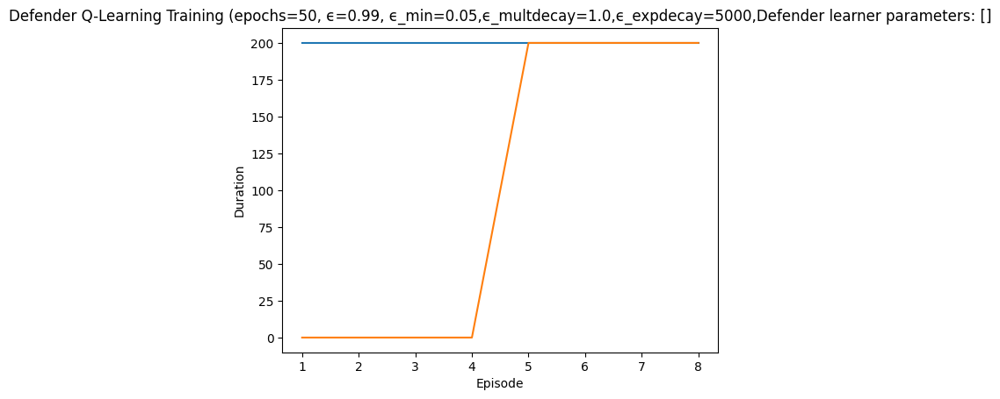

Rendering the current state of the environment
  ## Episode: 9/50 'Defender Q-Learning Training' ϵ=0.7327, Defender learner parameters: []


Episode 9|Iteration 14|reward:   20.0|last_reward_at:   14|Elapsed Time: 0:00:00||

1 12 1
{'action_type': 1, 'node_id': 12, 'parameter': 1}
[DEBUG] Received action: {'action_type': 1, 'node_id': 12, 'parameter': 1}
1 12 1
action type:  Block Traffic
Iteration 1: Action Taken: Type=Block Traffic, NodeID=12, Parameter=1
info {'action': 'block_traffic', 'status': 'success', 'node_id': '11_LinuxNode', 'port_name': 1, 'performance_metrics': {'actions_taken': 1601, 'successful_actions': 620, 'failed_actions': 981}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 6 8
{'action_type': 0, 'node_id': 6, 'parameter': 8}
[DEBUG] Received action: {'action_type': 0, 'node_id': 6, 'parameter': 8}
0 6 8
action type:  Reimage Node
Iteration 2: Action Taken: Type=Reimage Node, NodeID=6, Parameter=8
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '5_LinuxNode', 'reason': 'Reimaging no

Episode 9|Iteration 51|reward:  345.0|last_reward_at:   48|Elapsed Time: 0:00:00||

 {'action': 'block_traffic', 'status': 'success', 'node_id': '13_LinuxNode', 'port_name': 1, 'performance_metrics': {'actions_taken': 1615, 'successful_actions': 624, 'failed_actions': 991}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 2, 'parameter': 0}
2 2 0
action type:  Reimage Node
Iteration 16: Action Taken: Type=Reimage Node, NodeID=2, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '1_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 1616, 'successful_actions': 625, 'failed_actions': 991}, 'net

Episode 9|Iteration 52|reward:  340.0|last_reward_at:   48|Elapsed Time: 0:00:00||

2 6 1
{'action_type': 2, 'node_id': 6, 'parameter': 1}
[DEBUG] Received action: {'action_type': 2, 'node_id': 6, 'parameter': 1}
2 6 1
action type:  Reimage Node
Iteration 53: Action Taken: Type=Reimage Node, NodeID=6, Parameter=1
info 

Episode 9|Iteration 56|reward:  410.0|last_reward_at:   55|Elapsed Time: 0:00:00||

{'action': 'allow_traffic', 'status': 'success', 'node_id': '5_LinuxNode', 'port_name': 1, 'performance_metrics': {'actions_taken': 1653, 'successful_actions': 641, 'failed_actions': 1012}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 3, 'parameter': 0}
4 3 0
action type:  Start Service
Iteration 54: Action Taken: Type=Start Service, NodeID=3, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 1654, 'successful_actions': 641, 'failed_actions

Episode 9|Iteration 95|reward:  605.0|last_reward_at:   89|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 8, 'parameter': 0}
0 8 0
action type:  Reimage Node
Iteration 57: Action Taken: Type=Reimage Node, NodeID=8, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '7_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 1657, 'successful_actions': 643, 'failed_actions': 1014}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 3 1
{'action_type': 1, 'node_id': 3, 'parameter': 1}
[DEBUG] Received action: {'action_type': 1, 'node_id': 3, 'parameter': 1}
1 3 1
action type:  B

Episode 9|Iteration 96|reward:  600.0|last_reward_at:   89|Elapsed Time: 0:00:00||

 Reimage Node
Iteration 96: Action Taken: Type=Reimage Node, NodeID=7, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '6_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 1696, 'successful_actions': 657, 'failed_actions': 1039}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4

Episode 9|Iteration 102|reward:  600.0|last_reward_at:   89|Elapsed Time: 0:00:00||

 2 8
{'action_type': 4, 'node_id': 2, 'parameter': 8}
[DEBUG] Received action: {'action_type': 4, 'node_id': 2, 'parameter': 8}
4 2 8
action type:  Start Service
Iteration 97: Action Taken: Type=Start Service, NodeID=2, Parameter=8
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 1697, 'successful_actions': 657, 'failed_actions': 1040}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 2 6
{'action_type': 0, 'node_id': 2, 'parameter': 6}
[DEBUG] Received action: {'action_type': 0, 'node_id': 2, 'parameter': 6}
0 2 6
action type:  Reimage Node
Iteration 98: Action Taken: Type=Reimage Node, NodeID=2, Parameter=6
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '1_LinuxNode', 'reason': 'Reim

Episode 9|Iteration 132|reward:  670.0|last_reward_at:  128|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 4, 'parameter': 0}
3 4 0
action type:  Allow Traffic
Iteration 103: Action Taken: Type=Allow Traffic, NodeID=4, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 1703, 'successful_actions': 658, 'failed_actions': 1045}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 12 3
{'action_type': 4, 'node_id': 12, 'parameter': 3}
[DEBUG] Received action: {'action_type': 4, 'node_id': 12, 'parameter': 3}
4 12 3
action type:  Start Service
Iteration 104: Ac

Episode 9|Iteration 133|reward:  695.0|last_reward_at:  133|Elapsed Time: 0:00:00||

 Block Traffic
Iteration 133: Action Taken: Type=Block Traffic, NodeID=2, Parameter=6
info {'action': 'block_traffic', 'status': 'success', 'node_id': '1_LinuxNode', 'port_name': 6, 'performance_metrics': {'actions_taken': 1733, 'successful_actions': 667, 'failed_actions': 1066}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 9 0
{'action_type': 0, 'node_id': 9, 'parameter': 0}
[DEBUG] Received action: {'action_type': 0, 'node_id': 9, 'parameter': 0}
0 9 0
action type: 

Episode 9|Iteration 139|reward:  695.0|last_reward_at:  136|Elapsed Time: 0:00:00||

 Reimage Node
Iteration 134: Action Taken: Type=Reimage Node, NodeID=9, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '8_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 1734, 'successful_actions': 667, 'failed_actions': 1067}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 2 5
{'action_type': 4, 'node_id': 2, 'parameter': 5}
[DEBUG] Received action: {'action_type': 4, 'node_id': 2, 'parameter': 5}
4 2 5
action type:  Start Service
Iteration 135: Action Taken: Type=Start Service, NodeID=2, Parameter=5
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 1735, 'successful_actions': 667, 'failed_actions': 1068}, 'n

Episode 9|Iteration 171|reward:  895.0|last_reward_at:  171|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 11, 'parameter': 0}
4 11 0
action type:  Start Service
Iteration 140: Action Taken: Type=Start Service, NodeID=11, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 1740, 'successful_actions': 668, 'failed_actions': 1072}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 13 4
{'action_type': 0, 'node_id': 13, 'parameter': 4}
[DEBUG] Received action: {'action_type': 0, 'node_id': 13, 'parameter': 4}
0 13 4
action type:  Reimage Node
Iteration 

Episode 9|Iteration 172|reward:  920.0|last_reward_at:  172|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140

Episode 9|Iteration 179|reward:  945.0|last_reward_at:  176|Elapsed Time: 0:00:00||


No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 10, 'parameter': 0}
3 10 0
action type:  Allow Traffic
Iteration 173: Action Taken: Type=Allow Traffic, NodeID=10, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 1773, 'successful_actions': 681, 'failed_actions': 1092}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 6 5
{'action_type': 2, 'node_id': 6, 'parameter': 5}
[DEBUG] Received action: {'action_type': 2, 'node_id': 6, 'parameter': 5}
2 6 5
action type:  Reimage Node
Iteration 174: Action Taken: Type=Reimage Node, NodeID=6, Parameter=5
info {'action': 'allow_traffic', 'status': 'succes

Episode 9|Iteration 200|reward:  930.0|last_reward_at:  190|Elapsed Time: 0:00:00||


firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 1, 'parameter': 0}
2 1 0
action type:  Reimage Node
Iteration 180: Action Taken: Type=Reimage Node, NodeID=1, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '13_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 1780, 'successful_actions': 684, 'failed_actions': 1096}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 8 0
{'action_type': 0, 'node_id': 8, 'parameter': 0}
[DEBUG] Received action: {'action_type': 0, 'node_id': 8, 'parameter': 0}
0 8 0
action type:  Reimage Node
Iteration 181: Action Taken: T

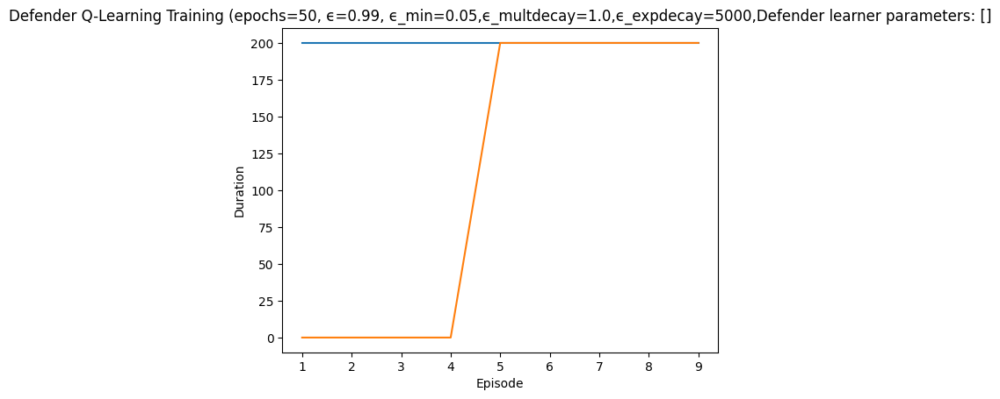

Rendering the current state of the environment
  ## Episode: 10/50 'Defender Q-Learning Training' ϵ=0.7059, Defender learner parameters: []


Episode 10|Iteration 43|reward:  255.0|last_reward_at:   38|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 1, 'parameter': 0}
1 1 0
action type:  Block Traffic
Iteration 1: Action Taken: Type=Block Traffic, NodeID=1, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '13_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 1801, 'successful_actions': 687, 'failed_actions': 1114}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 2 8
{'action_type': 0, 'node_id': 2, 'parameter': 8}
[DEBUG] Received action: {'action_type': 0, 'node_id': 2, 'parameter': 8}
0 2 8
action type:  Reimage Node
Iteration 2: Action Taken: Typ

Episode 10|Iteration 44|reward:  250.0|last_reward_at:   38|Elapsed Time: 0:00:00||

0 6 5
{'action_type': 0, 'node_id': 6, 'parameter': 5}
[DEBUG] Received action: {'action_type': 0, 'node_id': 6, 'parameter': 5}
0 6 5
action type:  Reimage Node
Iteration 44: Action Taken: Type=Reimage Node, NodeID=6, Parameter=5
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '5_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 1844, 'successful_actions': 702, 'failed_actions': 1142}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 10|Iteration 87|reward:  395.0|last_reward_at:   80|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 4, 'parameter': 0}
1 4 0
action type:  Block Traffic
Iteration 45: Action Taken: Type=Block Traffic, NodeID=4, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '3_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 1845, 'successful_actions': 703, 'failed_actions': 1142}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the cur

Episode 10|Iteration 90|reward:  410.0|last_reward_at:   80|Elapsed Time: 0:00:00||


No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 1, 'parameter': 0}
3 1 0
action type:  Allow Traffic
Iteration 88: Action Taken: Type=Allow Traffic, NodeID=1, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 1888, 'successful_actions': 715, 'failed_actions': 1173}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 0 6
{'action_type': 0, 'node_id': 0, 'parameter': 6}
[DEBUG] Received action: {'action_type': 0, 'node_id': 0, 'parameter': 6}
0 0 6
action type:  Reimage Node
Iteration 89: Action Taken: Type=Reimage Node, NodeID=0, Parameter=6
info {'action': 'reimage_node', 'status': 'unnecessary'

Episode 10|Iteration 128|reward:  450.0|last_reward_at:  128|Elapsed Time: 0:00:00||

4 10 6
{'action_type': 4, 'node_id': 10, 'parameter': 6}
[DEBUG] Received action: {'action_type': 4, 'node_id': 10, 'parameter': 6}
4 10 6
action type:  Start Service
Iteration 91: Action Taken: Type=Start Service, NodeID=10, Parameter=6
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 1891, 'successful_actions': 716, 'failed_actions': 1175}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 9, 'parameter': 0}
2 9 0
action type:  Reimage Node
Iteration 92:

Episode 10|Iteration 129|reward:  475.0|last_reward_at:  129|Elapsed Time: 0:00:00||

4 13 4
{'action_type': 4, 'node_id': 13, 'parameter': 4}
[DEBUG] Received action: {'action_type': 4, 'node_id': 13, 'parameter': 4}
4 13 4
action type:  Start Service
Iteration 130: Action Taken: Type=Start Service, NodeID=13, Parameter=4
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 1930, 'successful_actions': 725, 'failed_actions': 1205}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140

Episode 10|Iteration 168|reward:  790.0|last_reward_at:  163|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 11 3
{'action_type': 4, 'node_id': 11, 'parameter': 3}
[DEBUG] Received action: {'action_type': 4, 'node_id': 11, 'parameter': 3}
4 11 3
action type:  Start Service
Iteration 131: Action Taken: Type=Start Service, NodeID=11, Parameter=3
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 1931, 'successful_actions': 725, 'failed_actions': 1206}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 8 2
{'action_type': 1, 'node_id': 8, 'parameter': 2}
[DEBUG] Received action: {'action_type': 1, 'node_id': 8, 'parameter': 2}
1 8 2
action type:  Block Traffic
Iteration 132: Action Taken: Type=Block Traffic, NodeID=8

Episode 10|Iteration 172|reward:  830.0|last_reward_at:  172|Elapsed Time: 0:00:00||

4 11 0
{'action_type': 4, 'node_id': 11, 'parameter': 0}
[DEBUG] Received action: {'action_type': 4, 'node_id': 11, 'parameter': 0}
4 11 0
action type:  Start Service
Iteration 169: Action Taken: Type=Start Service, NodeID=11, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 1969, 'successful_actions': 742, 'failed_actions': 1227}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 4 7
{'action_type': 2, 'node_id': 4, 'parameter': 7}
[DEBUG] Received action: {'action_type': 2, 'node_id': 4, 'parameter': 7}
2 4 7
action type:  Reimage Node
Iteration 170: Action Taken: Type=Reimage Node, NodeID=4, Parameter=7
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '3_LinuxNode', 'port_name

Episode 10|Iteration 200|reward:  890.0|last_reward_at:  194|Elapsed Time: 0:00:00||


firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 7, 'parameter': 0}
2 7 0
action type:  Reimage Node
Iteration 173: Action Taken: Type=Reimage Node, NodeID=7, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '6_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 1973, 'successful_actions': 745, 'failed_actions': 1228}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the cu

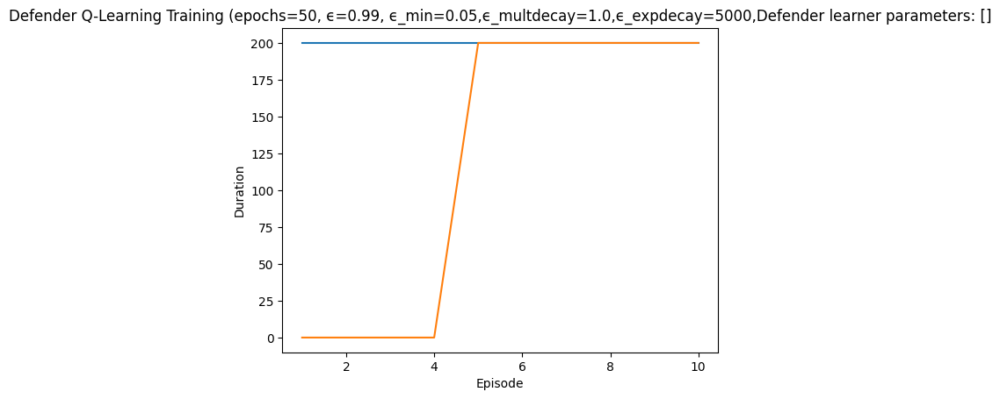

Rendering the current state of the environment
  ## Episode: 11/50 'Defender Q-Learning Training' ϵ=0.6802, Defender learner parameters: []


Episode 11|Iteration 8|reward:  110.0|last_reward_at:    8|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 4, 'parameter': 0}
0 4 0
action type:  Reimage Node
Iteration 1: Action Taken: Type=Reimage Node, NodeID=4, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '3_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 2001, 'successful_actions': 751, 'failed_actions': 1250}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 9 7
{'action_type': 1, 'node_id': 9, 'parameter': 7}
[DEBUG] Received action: {'action_type': 1, 'node_id': 9, 'parameter': 7}
1 9 7
action type:  Bl

Episode 11|Iteration 63|reward:  495.0|last_reward_at:   62|Elapsed Time: 0:00:00||

Iteration 9: Action Taken: Type=Reimage Node, NodeID=13, Parameter=4
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '12_WindowsNode', 'port_name': 4, 'performance_metrics': {'actions_taken': 2009, 'successful_actions': 757, 'failed_actions': 1252}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 10, 'parameter': 0}
1 10 0
action type:  Block Traffic
Iteration 10: Action Taken: Type=Block Traffic, NodeID=10, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '9_LinuxNode', 'port_name': 0, 'performance_metrics'

Episode 11|Iteration 64|reward:  490.0|last_reward_at:   62|Elapsed Time: 0:00:00||


3

Episode 11|Iteration 87|reward:  615.0|last_reward_at:   86|Elapsed Time: 0:00:00||

 11 1
{'action_type': 3, 'node_id': 11, 'parameter': 1}
[DEBUG] Received action: {'action_type': 3, 'node_id': 11, 'parameter': 1}
3 11 1
action type:  Allow Traffic
Iteration 65: Action Taken: Type=Allow Traffic, NodeID=11, Parameter=1
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 2065, 'successful_actions': 778, 'failed_actions': 1287}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 2, 'parameter': 0}
0 2 0
action type:  Reimage Node
Iteration 66: Actio

Episode 11|Iteration 134|reward:  820.0|last_reward_at:  132|Elapsed Time: 0:00:00||

2 12 4
{'action_type': 2, 'node_id': 12, 'parameter': 4}
[DEBUG] Received action: {'action_type': 2, 'node_id': 12, 'parameter': 4}
2 12 4
action type:  Reimage Node
Iteration 88: Action Taken: Type=Reimage Node, NodeID=12, Parameter=4
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '11_LinuxNode', 'port_name': 4, 'performance_metrics': {'actions_taken': 2088, 'successful_actions': 787, 'failed_actions': 1301}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 0, 'parameter': 0}
2 0 0
action type:  Reimage Node
Iteration 89: Action Taken

Episode 11|Iteration 135|reward:  845.0|last_reward_at:  135|Elapsed Time: 0:00:00||

2 0 1
{'action_type': 2, 'node_id': 0, 'parameter': 1}
[DEBUG] Received action: {'action_type': 2, 'node_id': 0, 'parameter': 1}
2 0 1
action type: 

Episode 11|Iteration 145|reward:  905.0|last_reward_at:  144|Elapsed Time: 0:00:00||

 Reimage Node
Iteration 136: Action Taken: Type=Reimage Node, NodeID=0, Parameter=1
info {'action': 'allow_traffic', 'status': 'failed', 'node_id': 'start', 'port_name': 1, 'reason': 'Machine not running', 'performance_metrics': {'actions_taken': 2136, 'successful_actions': 803, 'failed_actions': 1333}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 3 1
{'action_type': 0, 'node_id': 3, 'parameter': 1}
[DEBUG] Received action: {'action_type': 0, 'node_id': 3, 'parameter': 1}
0 3 1
action type:  Reimage Node
Iteration 137: Action Taken: Type=Reimage Node, NodeID=3, Parameter=1
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '2_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 2137, 'successful_actions': 803, 'failed_actions

Episode 11|Iteration 186|reward: 1170.0|last_reward_at:  186|Elapsed Time: 0:00:00||

3 2 3
{'action_type': 3, 'node_id': 2, 'parameter': 3}
[DEBUG] Received action: {'action_type': 3, 'node_id': 2, 'parameter': 3}
3 2 3
action type:  Allow Traffic
Iteration 146: Action Taken: Type=Allow Traffic, NodeID=2, Parameter=3
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 2146, 'successful_actions': 807, 'failed_actions': 1339}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
3 4 5
{'action_type': 3, 'node_id': 4, 'parameter': 5}
[DEBUG] Received action: {'action_type': 3, 'node_id': 4, 'parameter': 5}
3 4 5
action type:  Allow Traffic
Iteration 147: Action Taken: Type=Allow Traffic, NodeID=4, Parameter=5
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_servi

Episode 11|Iteration 187|reward: 1165.0|last_reward_at:  186|Elapsed Time: 0:00:00||

4 8 0
action type:  Start Service
Iteration 187: Action Taken: Type=Start Service, NodeID=8, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 2187, 'successful_actions': 823, 'failed_actions': 1364}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 5 9
{'action_type': 0, 'node_id': 5, 'parameter': 9}
[DEBUG] Received action: {'action_type': 0, 'node_id': 5, 'parameter': 9}
0 5 9
action type:  Reimage Node
Iteration 188: Action Taken: Type=Reimage Node, NodeID=5, Parameter=9
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '4_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 2188, 'successful_actions': 823, 'failed_

Episode 11|Iteration 197|reward: 1175.0|last_reward_at:  193|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 7, 'parameter': 0}
3 7 0
action type:  Allow Traffic
Iteration 189: Action Taken: Type=Allow Traffic, NodeID=7, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 2189, 'successful_actions': 823, 'failed_actions': 1366}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with s

Episode 11|Iteration 200|reward: 1160.0|last_reward_at:  197|Elapsed Time: 0:00:00||


4 13 0
{'action_type': 4, 'node_id': 13, 'parameter': 0}
[DEBUG] Received action: {'action_type': 4, 'node_id': 13, 'parameter': 0}
4 13 0
action type:  Start Service
Iteration 198: Action Taken: Type=Start Service, NodeID=13, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 2198, 'successful_actions': 825, 'failed_actions': 1373}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 5 4
{'action_type': 0, 'node_id': 5, 'parameter': 4}
[DEBUG] Received action: {'action_type': 0, 'node_id': 5, 'parameter': 4}
0 5 4
action type:  Reimage Node
Iteration 199: Action Taken: Type=Reimage Node, NodeID=5, Parameter=4
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '4_WindowsNode', 'reas

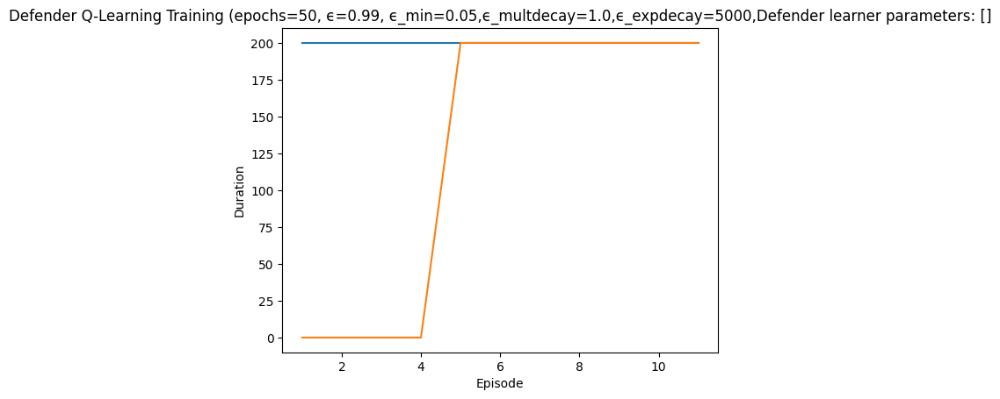

Rendering the current state of the environment
  ## Episode: 12/50 'Defender Q-Learning Training' ϵ=0.6555, Defender learner parameters: []


Episode 12|Iteration 2|reward:   20.0|last_reward_at:    2|Elapsed Time: 0:00:00||

3 13 2
{'action_type': 3, 'node_id': 13, 'parameter': 2}
[DEBUG] Received action: {'action_type': 3, 'node_id': 13, 'parameter': 2}
3 13 2
action type:  Allow Traffic
Iteration 1: Action Taken: Type=Allow Traffic, NodeID=13, Parameter=2
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 2201, 'successful_actions': 825, 'failed_actions': 1376}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 3, 'parameter': 0}
2 3 0
action type:  Reimage Node
Iteration 2: Action

Episode 12|Iteration 15|reward:  105.0|last_reward_at:   14|Elapsed Time: 0:00:00||

Block Traffic
Iteration 3: Action Taken: Type=Block Traffic, NodeID=12, Parameter=8
info {'action': 'block_traffic', 'status': 'success', 'node_id': '11_LinuxNode', 'port_name': 8, 'performance_metrics': {'actions_taken': 2203, 'successful_actions': 827, 'failed_actions': 1376}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 1 7
{'action_type': 2, 'node_id': 1, 'parameter': 7}
[DEBUG] Received action: {'action_type': 2, 'node_id': 1, 'parameter': 7}
2 1 7
action type:  Reimage Node
Iteration 4: Action Taken: Type=Reimage Node, NodeID=1, Parameter=7
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '13_LinuxNode', 'port_name': 7, 'performance_metrics': {'actions_taken': 2204, 'successful_actions': 828, 'failed_actions': 1376}, 'network_availability': 1.0}
firewall_active: 1.40000000000000

Episode 12|Iteration 70|reward:  540.0|last_reward_at:   68|Elapsed Time: 0:00:00||

1 0 8
{'action_type': 1, 'node_id': 0, 'parameter': 8}
[DEBUG] Received action: {'action_type': 1, 'node_id': 0, 'parameter': 8}
1 0 8
action type:  Block Traffic
Iteration 16: Action Taken: Type=Block Traffic, NodeID=0, Parameter=8
info {'action': 'block_traffic', 'status': 'failed', 'node_id': 'start', 'port_name': 8, 'reason': 'Machine not running', 'performance_metrics': {'actions_taken': 2216, 'successful_actions': 831, 'failed_actions': 1385}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 4 9
{'action_type': 4, 'node_id': 4, 'parameter': 9}
[DEBUG] Received action: {'action_type': 4, 'node_id': 4, 'parameter': 9}
4 4 9
action type:  Start Service
Iteration 17: Action Taken: Type=Start Service, NodeID=4, Parameter=9
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 

Episode 12|Iteration 71|reward:  565.0|last_reward_at:   70|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 3, 'parameter': 0}
1 3 0
action type:  Block Traffic
Iteration 71: Action Taken: Type=Block Traffic, NodeID=3, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '2_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 2271, 'successful_actions': 856, 'failed_actions': 1415}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 12|Iteration 74|reward:  610.0|last_reward_at:   74|Elapsed Time: 0:00:00||

2 8 3
{'action_type': 2, 'node_id': 8, 'parameter': 3}
[DEBUG] Received action: {'action_type': 2, 'node_id': 8, 'parameter': 3}
2 8 3
action type:  Reimage Node
Iteration 72: Action Taken: Type=Reimage Node, NodeID=8, Parameter=3
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '7_LinuxNode', 'port_name': 3, 'performance_metrics': {'actions_taken': 2272, 'successful_actions': 857, 'failed_actions': 1415}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 6 0
{'action_type': 0, 'node_id': 6, 'parameter': 0}
[DEBUG] Received action: {'action_type': 0, 'node_id': 6, 'parameter': 0}
0 6 0
action type:  Reimage Node
Iteration 73: Action Taken: Type=Reimage Node, NodeID=6, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '5_LinuxNode', 'reason': 'Reimaging not req

Episode 12|Iteration 83|reward:  685.0|last_reward_at:   80|Elapsed Time: 0:00:00||

0 12 7
{'action_type': 0, 'node_id': 12, 'parameter': 7}
[DEBUG] Received action: {'action_type': 0, 'node_id': 12, 'parameter': 7}
0 12 7
action type:  Reimage Node
Iteration 75: Action Taken: Type=Reimage Node, NodeID=12, Parameter=7
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '11_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 2275, 'successful_actions': 858, 'failed_actions': 1417}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 8 9
{'action_type': 2, 'node_id': 8, 'parameter': 9}
[DEBUG] Received action: {'action_type': 2, 'node_id': 8, 'parameter': 9}
2 8 9
action type:  Reimage Node
Iteration 76: Action Taken: Type=Reimage Node, NodeID=8, Parameter=9
info {'action': 'allow_traffic', 'status': 'success', 'node_i

Episode 12|Iteration 130|reward: 1250.0|last_reward_at:  130|Elapsed Time: 0:00:00||

0 6 0
{'action_type': 0, 'node_id': 6, 'parameter': 0}
[DEBUG] Received action: {'action_type': 0, 'node_id': 6, 'parameter': 0}
0 6 0
action type:  Reimage Node
Iteration 84: Action Taken: Type=Reimage Node, NodeID=6, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '5_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 2284, 'successful_actions': 862, 'failed_actions': 1422}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 4, 'parameter': 0}
1 4 0
action type:  B

Episode 12|Iteration 132|reward: 1240.0|last_reward_at:  130|Elapsed Time: 0:00:00||

3 5 8
{'action_type': 3, 'node_id': 5, 'parameter': 8}
[DEBUG] Received action: {'action_type': 3, 'node_id': 5, 'parameter': 8}
3 5 8
action type:  Allow Traffic
Iteration 131: Action Taken: Type=Allow Traffic, NodeID=5, Parameter=8
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 2331, 'successful_actions': 889, 'failed_actions': 1442}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
3 8 6
{'action_type': 3, 'node_id': 8, 'parameter': 6}
[DEBUG] Received action: {'action_type': 3, 'node_id': 8, 'parameter': 6}
3 8 6
action type:  Allow Traffic
Iteration 132: Action Taken: Type=Allow Traffic, NodeID=8, Parameter=6
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_servi

Episode 12|Iteration 134|reward: 1290.0|last_reward_at:  133|Elapsed Time: 0:00:00||

1 5 7
{'action_type': 1, 'node_id': 5, 'parameter': 7}
[DEBUG] Received action: {'action_type': 1, 'node_id': 5, 'parameter': 7}
1 5 7
action type:  Block Traffic
Iteration 133: Action Taken: Type=Block Traffic, NodeID=5, Parameter=7
info {'action': 'block_traffic', 'status': 'success', 'node_id': '4_WindowsNode', 'port_name': 7, 'performance_metrics': {'actions_taken': 2333, 'successful_actions': 890, 'failed_actions': 1443}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 2 3
{'action_type': 1, 'node_id': 2, 'parameter': 3}
[DEBUG] Received action: {'action_type': 1, 'node_id': 2, 'parameter': 3}
1 2 3
action type:  Block Traffic
Iteration 134: Action Taken: Type=Block Traffic, NodeID=2, Parameter=3
info {'action': 'block_traffic', 'status': 'success', 'node_id': '1_LinuxNode', 'port_name': 3, 'perfor

Episode 12|Iteration 142|reward: 1280.0|last_reward_at:  140|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 8, 'parameter': 0}
4 8 0
action type:  Start Service
Iteration 135: Action Taken: Type=Start Service, NodeID=8, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 2335, 'successful_actions': 891, 'failed_actions': 1444}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action bas

Episode 12|Iteration 188|reward: 1460.0|last_reward_at:  185|Elapsed Time: 0:00:00||


Iteration 143: Action Taken: Type=Start Service, NodeID=3, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 2343, 'successful_actions': 892, 'failed_actions': 1451}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 8 4
{'action_type': 4, 'node_id': 8, 'parameter': 4}
[DEBUG] Received action: {'action_type': 4, 'node_id': 8, 'parameter': 4}
4 8 4
action type:  Start Service
Iteration 144: Action Taken: Type=Start Service, NodeID=8, Parameter=4
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 2344, 'successful_actions': 892, 'failed_actions': 1452}, 'network_availability': 1.0}
firewall_active: 1.

Episode 12|Iteration 190|reward: 1450.0|last_reward_at:  185|Elapsed Time: 0:00:00||

4 0 3
{'action_type': 4, 'node_id': 0, 'parameter': 3}
[DEBUG] Received action: {'action_type': 4, 'node_id': 0, 'parameter': 3}
4 0 3
action type:  Start Service
Iteration 190: Action Taken: Type=Start Service, NodeID=0, Parameter=3
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 2390, 'successful_actions': 906, 'failed_actions': 1484}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 12|Iteration 191|reward: 1475.0|last_reward_at:  191|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 3, 'parameter': 0}
1 3 0
action type:  Block Traffic
Iteration 191: Action Taken: Type=Block Traffic, NodeID=3, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '2_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 2391, 'successful_actions': 907, 'failed_actions': 1484}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 12|Iteration 199|reward: 1585.0|last_reward_at:  198|Elapsed Time: 0:00:00||

4 2 8
{'action_type': 4, 'node_id': 2, 'parameter': 8}
[DEBUG] Received action: {'action_type': 4, 'node_id': 2, 'parameter': 8}
4 2 8
action type:  Start Service
Iteration 192: Action Taken: Type=Start Service, NodeID=2, Parameter=8
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 2392, 'successful_actions': 907, 'failed_actions': 1485}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 4 3
{'action_type': 2, 'node_id': 4, 'parameter': 3}
[DEBUG] Received action: {'action_type': 2, 'node_id': 4, 'parameter': 3}
2 4 3
action type:  Reimage Node
Iteration 193: Action Taken: Type=Reimage Node, NodeID=4, Parameter=3
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '3_LinuxNode', 'port_name': 3,

Episode 12|Iteration 200|reward: 1610.0|last_reward_at:  200|Elapsed Time: 0:00:00||


2 6 0
{'action_type': 2, 'node_id': 6, 'parameter': 0}
[DEBUG] Received action: {'action_type': 2, 'node_id': 6, 'parameter': 0}
2 6 0
action type:  Reimage Node
Iteration 200: Action Taken: Type=Reimage Node, NodeID=6, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '5_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 2400, 'successful_actions': 913, 'failed_actions': 1487}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
  Episode 12 stopped at t=200 
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 0/0 (NaN)
    explore-remote: 0/0 (NaN)
    explore-connect: 0/0 (NaN)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0
  Episode 12 breakdown:
    Successful Reimagin

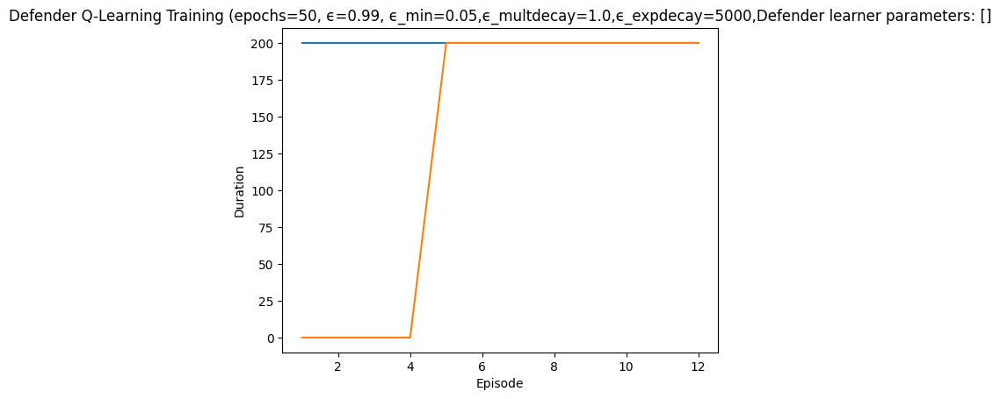

Rendering the current state of the environment
  ## Episode: 13/50 'Defender Q-Learning Training' ϵ=0.6318, Defender learner parameters: []


Episode 13|Iteration 48|reward:  320.0|last_reward_at:   48|Elapsed Time: 0:00:00||

0 7 1
{'action_type': 0, 'node_id': 7, 'parameter': 1}
[DEBUG] Received action: {'action_type': 0, 'node_id': 7, 'parameter': 1}
0 7 1
action type:  Reimage Node
Iteration 1: Action Taken: Type=Reimage Node, NodeID=7, Parameter=1
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '6_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 2401, 'successful_actions': 913, 'failed_actions': 1488}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 0 5
{'action_type': 0, 'node_id': 0, 'parameter': 5}
[DEBUG] Received action: {'action_type': 0, 'node_id': 0, 'parameter': 5}
0 0 5
action type:  Reimage Node
Iteration 2: Action Taken: Type=Reimage Node, NodeID=0, Parameter=5
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id':

Episode 13|Iteration 49|reward:  315.0|last_reward_at:   48|Elapsed Time: 0:00:00||

action type:  Start Service
Iteration 49: Action Taken: Type=Start Service, NodeID=4, Parameter=3
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 2449, 'successful_actions': 933, 'failed_actions': 1516}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140

Episode 13|Iteration 100|reward:  710.0|last_reward_at:   99|Elapsed Time: 0:00:00||


No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 11, 'parameter': 0}
2 11 0
action type:  Reimage Node
Iteration 50: Action Taken: Type=Reimage Node, NodeID=11, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '10_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 2450, 'successful_actions': 934, 'failed_actions': 1516}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 6 8
{'action_type': 0, 'node_id': 6, 'parameter': 8}
[DEBUG] Received action: {'action_type': 0, 'node_id': 6, 'parameter': 8}
0 6 8
action type:  Reimage Node
Iteration 51: Action Taken: Type=Reimage Node, NodeID=6, Parameter=8
info {'action': 'reimage_node', 'status': 'unnecessary', '

Episode 13|Iteration 101|reward:  735.0|last_reward_at:   99|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 13|Iteration 143|reward: 1015.0|last_reward_at:  143|Elapsed Time: 0:00:00||

2 7 3
{'action_type': 2, 'node_id': 7, 'parameter': 3}
[DEBUG] Received action: {'action_type': 2, 'node_id': 7, 'parameter': 3}
2 7 3
action type:  Reimage Node
Iteration 102: Action Taken: Type=Reimage Node, NodeID=7, Parameter=3
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '6_WindowsNode', 'port_name': 3, 'performance_metrics': {'actions_taken': 2502, 'successful_actions': 957, 'failed_actions': 1545}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 2, 'parameter': 0}
2 2 0
action type:  Reimage Node
Iteration 103: Action Taken: 

Episode 13|Iteration 144|reward: 1010.0|last_reward_at:  143|Elapsed Time: 0:00:00||

Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
3

Episode 13|Iteration 190|reward: 1170.0|last_reward_at:  190|Elapsed Time: 0:00:00||

 0 1
{'action_type': 3, 'node_id': 0, 'parameter': 1}
[DEBUG] Received action: {'action_type': 3, 'node_id': 0, 'parameter': 1}
3 0 1
action type:  Allow Traffic
Iteration 145: Action Taken: Type=Allow Traffic, NodeID=0, Parameter=1
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 2545, 'successful_actions': 973, 'failed_actions': 1572}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 13, 'parameter': 0}
1 13 0
action type:  Block Traffic
Iteration 146: Actio

Episode 13|Iteration 191|reward: 1165.0|last_reward_at:  190|Elapsed Time: 0:00:00||

 Allow Traffic
Iteration 191: Action Taken: Type=Allow Traffic, NodeID=11, Parameter=5
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 2591, 'successful_actions': 987, 'failed_actions': 1604}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 6 3
{'action_type': 1, 'node_id': 6, 'parameter': 3}
[DEBUG] Received action: {'action_type': 1, 'node_id': 6, 'parameter': 3}
1 6 3
action type: 

Episode 13|Iteration 200|reward: 1300.0|last_reward_at:  200|Elapsed Time: 0:00:00||


 Block Traffic
Iteration 192: Action Taken: Type=Block Traffic, NodeID=6, Parameter=3
info {'action': 'block_traffic', 'status': 'success', 'node_id': '5_LinuxNode', 'port_name': 3, 'performance_metrics': {'actions_taken': 2592, 'successful_actions': 988, 'failed_actions': 1604}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 12, 'parameter': 0}
2 12 0
action type:  Reimage Node
Iteration 193: Action Taken: Type=Reimage Node, NodeID=12, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '11_LinuxNode', 'port_name': 0, 'perfor

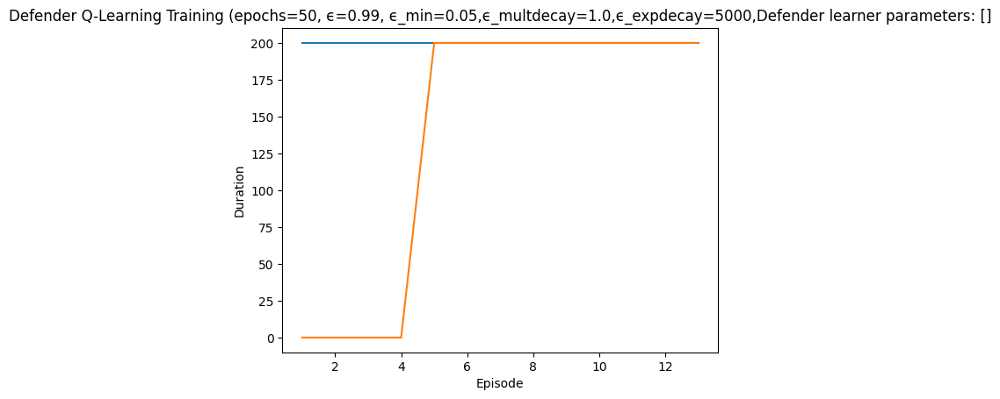

Rendering the current state of the environment
  ## Episode: 14/50 'Defender Q-Learning Training' ϵ=0.6090, Defender learner parameters: []


Episode 14|Iteration 44|reward:  140.0|last_reward_at:   43|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 7, 'parameter': 0}
1 7 0
action type:  Block Traffic
Iteration 1: Action Taken: Type=Block Traffic, NodeID=7, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '6_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 2601, 'successful_actions': 994, 'failed_actions': 1607}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 10 4
{'action_type': 4, 'node_id': 10, 'parameter': 4}
[DEBUG] Received action: {'action_type': 4, 'node_id': 10, 'parameter': 4}
4 10 4
action type:  Start Service
Iteration 2: Action Take

Episode 14|Iteration 46|reward:  160.0|last_reward_at:   43|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 9 4
{'action_type': 2, 'node_id': 9, 'parameter': 4}
[DEBUG] Received action: {'action_type': 2, 'node_id': 9, 'parameter': 4}
2 9 4
action type:  Reimage Node
Iteration 46: Action Taken: Type=Reimage Node, NodeID=9, Parameter=4
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '8_WindowsNode', 'port_name': 4, 'performance_metrics': {'actions_taken': 2646, 'successful_actions': 1007, 'failed_actions': 1639}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 14|Iteration 88|reward:  320.0|last_reward_at:   81|Elapsed Time: 0:00:00||

2 10 8
{'action_type': 2, 'node_id': 10, 'parameter': 8}
[DEBUG] Received action: {'action_type': 2, 'node_id': 10, 'parameter': 8}
2 10 8
action type:  Reimage Node
Iteration 47: Action Taken: Type=Reimage Node, NodeID=10, Parameter=8
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '9_LinuxNode', 'port_name': 8, 'performance_metrics': {'actions_taken': 2647, 'successful_actions': 1008, 'failed_actions': 1639}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 5, 'parameter': 0}
3 5 0
action type:  Allow Traffic
Iteration 48: Action Take

Episode 14|Iteration 91|reward:  365.0|last_reward_at:   90|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 7 0
{'action_type': 1, 'node_id': 7, 'parameter': 0}
[DEBUG] Received action: {'action_type': 1, 'node_id': 7, 'parameter': 0}
1 7 0
action type:  Block Traffic
Iteration 90: Action Taken: Type=Block Traffic, NodeID=7, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '6_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 2690, 'successful_actions': 1022, 'failed_actions': 1668}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
3 3 0
{'action_type': 3, 'node_id': 3, 'parameter': 0}
[DEBUG] Received action: {'action_type': 3, 'node_id': 3, 'parameter': 0}
3 3 0
action type:  Allow Traffic
Iteration 91: Action Taken: Type=Allow Traffic, NodeID=3, Parameter=0
in

Episode 14|Iteration 125|reward:  735.0|last_reward_at:  124|Elapsed Time: 0:00:00||

0 9 6
{'action_type': 0, 'node_id': 9, 'parameter': 6}
[DEBUG] Received action: {'action_type': 0, 'node_id': 9, 'parameter': 6}
0 9 6
action type:  Reimage Node
Iteration 92: Action Taken: Type=Reimage Node, NodeID=9, Parameter=6
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '8_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 2692, 'successful_actions': 1022, 'failed_actions': 1670}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 10 9
{'action_type': 4, 'node_id': 10, 'parameter': 9}
[DEBUG] Received action: {'action_type': 4, 'node_id': 10, 'parameter': 9}
4 10 9
action type:  Start Service
Iteration 93: Action Taken: Type=Start Service, NodeID=10, Parameter=9
info {'status': 'unnecessary', 'reason': 'Service already

Episode 14|Iteration 127|reward:  755.0|last_reward_at:  127|Elapsed Time: 0:00:00||

0 9 2
{'action_type': 0, 'node_id': 9, 'parameter': 2}
[DEBUG] Received action: {'action_type': 0, 'node_id': 9, 'parameter': 2}
0 9 2
action type:  Reimage Node
Iteration 126: Action Taken: Type=Reimage Node, NodeID=9, Parameter=2
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '8_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 2726, 'successful_actions': 1040, 'failed_actions': 1686}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 3 5
{'action_type': 2, 'node_id': 3, 'parameter': 5}
[DEBUG] Received action: {'action_type': 2, 'node_id': 3, 'parameter': 5}
2 3 5
action type:  Reimage Node
Iteration 127: Action Taken: Type=Reimage Node, NodeID=3, Parameter=5
info {'action': 'allow_traffic', 'status': 'success', 'node_id

Episode 14|Iteration 166|reward:  990.0|last_reward_at:  165|Elapsed Time: 0:00:00||


3 1 5
action type:  Allow Traffic
Iteration 128: Action Taken: Type=Allow Traffic, NodeID=1, Parameter=5
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 2728, 'successful_actions': 1041, 'failed_actions': 1687}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 6 2
{'action_type': 0, 'node_id': 6, 'parameter': 2}
[DEBUG] Received action: {'action_type': 0, 'node_id': 6, 'parameter': 2}
0 6 2
action type:  Reimage Node
Iteration 129: Action Taken: Type=Reimage Node, NodeID=6, Parameter=2
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '5_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 2729, 'successful_actions': 1041, 'failed_acti

Episode 14|Iteration 167|reward: 1015.0|last_reward_at:  167|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 13, 'parameter': 0}
1 13 0
action type:  Block Traffic
Iteration 167: Action Taken: Type=Block Traffic, NodeID=13, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '12_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 2767, 'successful_actions': 1057, 'failed_actions': 1710}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 1 6
{'action_type': 0, 'node_id': 1, 'parameter': 6}
[DEBUG] Received action: {'action_type': 0, 'node_id': 1, 'parameter': 6}
0 1 6
action type: 

Episode 14|Iteration 200|reward: 1210.0|last_reward_at:  195|Elapsed Time: 0:00:00||


 Reimage Node
Iteration 168: Action Taken: Type=Reimage Node, NodeID=1, Parameter=6
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '13_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 2768, 'successful_actions': 1057, 'failed_actions': 1711}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 12, 'parameter': 0}
2 12 0
action type:  Reimage Node
Iteration 169: Action Taken: Type=Reimage Node, NodeID=12, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_

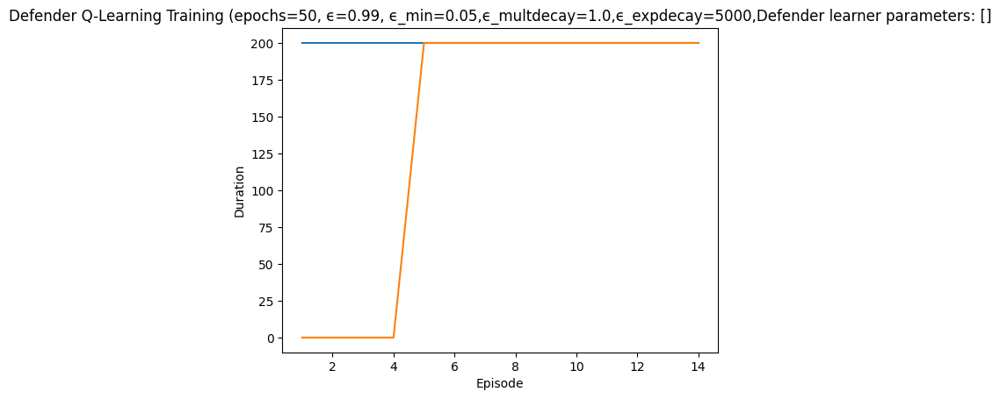

Rendering the current state of the environment
  ## Episode: 15/50 'Defender Q-Learning Training' ϵ=0.5870, Defender learner parameters: []


Episode 15|Iteration 44|reward:  180.0|last_reward_at:   44|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 3, 'parameter': 0}
3 3 0
action type:  Allow Traffic
Iteration 1: Action Taken: Type=Allow Traffic, NodeID=3, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 2801, 'successful_actions': 1069, 'failed_actions': 1732}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 1 0
{'action_type': 4, 'node_id': 1, 'parameter': 0}
[DEBUG] Received action: {'action_type': 4, 'node_id': 1, 'parameter': 0}
4 1 0
action type:  Start Service
Iteration 2: Action Ta

Episode 15|Iteration 45|reward:  175.0|last_reward_at:   44|Elapsed Time: 0:00:00||


{'action_type': 3, 'node_id': 7, 'parameter': 6}
[DEBUG] Received action: {'action_type': 3, 'node_id': 7, 'parameter': 6}
3 7 6
action type:  Allow Traffic
Iteration 45: Action Taken: Type=Allow Traffic, NodeID=7, Parameter=6
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 2845, 'successful_actions': 1083, 'failed_actions': 1762}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 11 7
{'action_type': 2, 'node_id': 11, 'parameter': 7}
[DEBUG] Received action: {'action_type': 2, 'node_id': 11, 'parameter': 7}
2 11 7


Episode 15|Iteration 87|reward:  505.0|last_reward_at:   85|Elapsed Time: 0:00:00||

action type:  Reimage Node
Iteration 46: Action Taken: Type=Reimage Node, NodeID=11, Parameter=7
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '10_WindowsNode', 'port_name': 7, 'performance_metrics': {'actions_taken': 2846, 'successful_actions': 1084, 'failed_actions': 1762}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 12, 'parameter': 0}
0 12 0
action type:  Reimage Node
Iteration 47: Action Taken: Type=Reimage Node, NodeID=12, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '11_LinuxNode', 'reaso

Episode 15|Iteration 89|reward:  485.0|last_reward_at:   85|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
3 6 7
{'action_type': 3, 'node_id': 6, 'parameter': 7}
[DEBUG] Received action: {'action_type': 3, 'node_id': 6, 'parameter': 7}
3 6 7
action type:  Allow Traffic
Iteration 89: Action Taken: Type=Allow Traffic, NodeID=6, Parameter=7
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 2889, 'successful_actions': 1101, 'failed_actions': 1788}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1

Episode 15|Iteration 130|reward:  800.0|last_reward_at:  127|Elapsed Time: 0:00:00||

 2 5
{'action_type': 1, 'node_id': 2, 'parameter': 5}
[DEBUG] Received action: {'action_type': 1, 'node_id': 2, 'parameter': 5}
1 2 5
action type:  Block Traffic
Iteration 90: Action Taken: Type=Block Traffic, NodeID=2, Parameter=5
info {'action': 'block_traffic', 'status': 'success', 'node_id': '1_LinuxNode', 'port_name': 5, 'performance_metrics': {'actions_taken': 2890, 'successful_actions': 1102, 'failed_actions': 1788}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 1, 'parameter': 0}
2 1 0
action type:  Reimage Node
Iteration 91: Action Taken: Ty

Episode 15|Iteration 131|reward:  795.0|last_reward_at:  127|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 11, 'parameter': 0}
4 11 0
action type:  Start Service
Iteration 131: Action Taken: Type=Start Service, NodeID=11, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 2931, 'successful_actions': 1119, 'failed_actions': 1812}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action

Episode 15|Iteration 181|reward: 1065.0|last_reward_at:  180|Elapsed Time: 0:00:00||


firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 7, 'parameter': 0}
3 7 0
action type:  Allow Traffic
Iteration 133: Action Taken: Type=Allow Traffic, NodeID=7, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 2933, 'successful_actions': 1119, 'failed_actions': 1814}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with

Episode 15|Iteration 182|reward: 1060.0|last_reward_at:  180|Elapsed Time: 0:00:00||

{'action_type': 4, 'node_id': 5, 'parameter': 1}
[DEBUG] Received action: {'action_type': 4, 'node_id': 5, 'parameter': 1}
4 5 1
action type:  Start Service
Iteration 182: Action Taken: Type=Start Service, NodeID=5, Parameter=1
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 2982, 'successful_actions': 1137, 'failed_actions': 1845}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 8 9
{'action_type': 2, 'node_id': 8, 'parameter': 9}
[DEBUG] Received action: {'action_type': 2, 'node_id': 8, 'parameter': 9}
2 8 9

Episode 15|Iteration 200|reward: 1180.0|last_reward_at:  200|Elapsed Time: 0:00:00||



action type:  Reimage Node
Iteration 183: Action Taken: Type=Reimage Node, NodeID=8, Parameter=9
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '7_LinuxNode', 'port_name': 9, 'performance_metrics': {'actions_taken': 2983, 'successful_actions': 1138, 'failed_actions': 1845}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 3, 'parameter': 0}
0 3 0
action type:  Reimage Node
Iteration 184: Action Taken: Type=Reimage Node, NodeID=3, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '2_WindowsNode', 'reason':

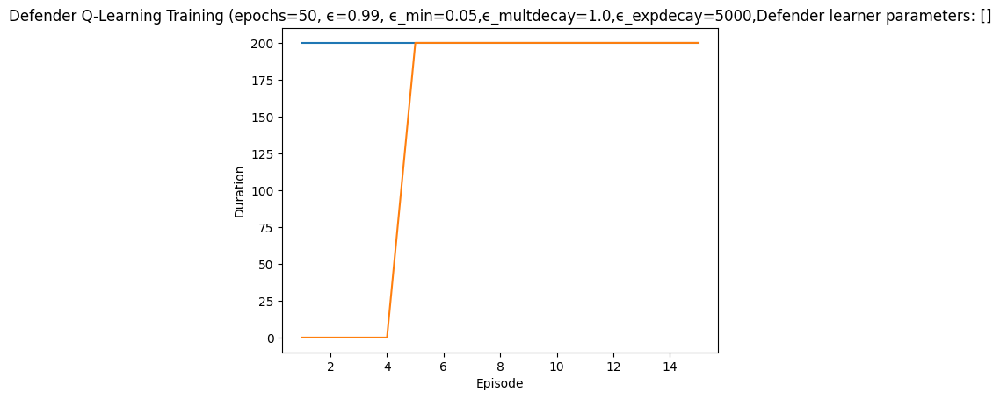

Rendering the current state of the environment
  ## Episode: 16/50 'Defender Q-Learning Training' ϵ=0.5660, Defender learner parameters: []


Episode 16|Iteration 18|reward:  180.0|last_reward_at:   16|Elapsed Time: 0:00:00||

3 10 5
{'action_type': 3, 'node_id': 10, 'parameter': 5}
[DEBUG] Received action: {'action_type': 3, 'node_id': 10, 'parameter': 5}
3 10 5
action type:  Allow Traffic
Iteration 1: Action Taken: Type=Allow Traffic, NodeID=10, Parameter=5
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 3001, 'successful_actions': 1144, 'failed_actions': 1857}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 7, 'parameter': 0}
1 7 0
action type:  Block Traffic
Iteration 2: Acti

Episode 16|Iteration 64|reward:  560.0|last_reward_at:   64|Elapsed Time: 0:00:00||

1 7 7
{'action_type': 1, 'node_id': 7, 'parameter': 7}
[DEBUG] Received action: {'action_type': 1, 'node_id': 7, 'parameter': 7}
1 7 7
action type:  Block Traffic
Iteration 19: Action Taken: Type=Block Traffic, NodeID=7, Parameter=7
info {'action': 'block_traffic', 'status': 'success', 'node_id': '6_WindowsNode', 'port_name': 7, 'performance_metrics': {'actions_taken': 3019, 'successful_actions': 1154, 'failed_actions': 1865}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 4, 'parameter': 0}
0 4 0
action type:  Reimage Node
Iteration 20: Action Taken:

Episode 16|Iteration 65|reward:  585.0|last_reward_at:   65|Elapsed Time: 0:00:00||

 Reimage Node
Iteration 65: Action Taken: Type=Reimage Node, NodeID=6, Parameter=2
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '5_LinuxNode', 'port_name': 2, 'performance_metrics': {'actions_taken': 3065, 'successful_actions': 1175, 'failed_actions': 1890}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0

Episode 16|Iteration 75|reward:  595.0|last_reward_at:   74|Elapsed Time: 0:00:00||

 1 6
{'action_type': 0, 'node_id': 1, 'parameter': 6}
[DEBUG] Received action: {'action_type': 0, 'node_id': 1, 'parameter': 6}
0 1 6
action type:  Reimage Node
Iteration 66: Action Taken: Type=Reimage Node, NodeID=1, Parameter=6
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '13_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 3066, 'successful_actions': 1175, 'failed_actions': 1891}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 1, 'parameter': 0}
4 1 0
action type:  

Episode 16|Iteration 128|reward:  980.0|last_reward_at:  125|Elapsed Time: 0:00:00||

1 9 6
{'action_type': 1, 'node_id': 9, 'parameter': 6}
[DEBUG] Received action: {'action_type': 1, 'node_id': 9, 'parameter': 6}
1 9 6
action type:  Block Traffic
Iteration 77: Action Taken: Type=Block Traffic, NodeID=9, Parameter=6
info {'action': 'block_traffic', 'status': 'success', 'node_id': '8_WindowsNode', 'port_name': 6, 'performance_metrics': {'actions_taken': 3077, 'successful_actions': 1178, 'failed_actions': 1899}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 6 6
{'action_type': 1, 'node_id': 6, 'parameter': 6}
[DEBUG] Received action: {'action_type': 1, 'node_id': 6, 'parameter': 6}
1 6 6
action type:  Block Traffic
Iteration 78: Action Taken: Type=Block Traffic, NodeID=6, Parameter=6
info {'action': 'block_traffic', 'status': 'success', 'node_id': '5_LinuxNode', 'port_name': 6, 'perform

Episode 16|Iteration 131|reward: 1025.0|last_reward_at:  130|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 4, 'parameter': 0}
2 4 0
action type:  Reimage Node
Iteration 130: Action Taken: Type=Reimage Node, NodeID=4, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '3_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 3130, 'successful_actions': 1200, 'failed_actions': 1930}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 13 1
{'action_type': 1, 'node_id': 13, 'parameter': 1}
[DEBUG] Received action: {'action_type': 1, 'node_id': 13, 'parameter': 1}
1 13 1
action type:  Block Traffic
Iteration 131: Action Tak

Episode 16|Iteration 138|reward: 1080.0|last_reward_at:  136|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 9, 'parameter': 0}
4 9 0
action type:  Start Service
Iteration 132: Action Taken: Type=Start Service, NodeID=9, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 3132, 'successful_actions': 1201, 'failed_actions': 1931}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 2 9
{'action_type': 4, 'node_id': 2, 'parameter': 9}
[DEBUG] Received action: {'action_type': 4, 'node_id': 2, 'parameter': 9}
4 2 9
action type:  Start Service
Iteration 133: 

Episode 16|Iteration 186|reward: 1240.0|last_reward_at:  185|Elapsed Time: 0:00:00||

3 4 2
{'action_type': 3, 'node_id': 4, 'parameter': 2}
[DEBUG] Received action: {'action_type': 3, 'node_id': 4, 'parameter': 2}
3 4 2
action type:  Allow Traffic
Iteration 140: Action Taken: Type=Allow Traffic, NodeID=4, Parameter=2
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 3140, 'successful_actions': 1204, 'failed_actions': 1936}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 4, 'parameter': 0}
2 4 0
action type:  Reimage Node
Iteration 141: Action

Episode 16|Iteration 187|reward: 1235.0|last_reward_at:  185|Elapsed Time: 0:00:00||

 Reimage Node
Iteration 187: Action Taken: Type=Reimage Node, NodeID=8, Parameter=6
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '7_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 3187, 'successful_actions': 1218, 'failed_actions': 1969}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 13, 'parameter': 0}
0 13 0
action type:  Reimage Node
Iteration 188: Action Taken: Type=Reimage Node, NodeID=13, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'nod

Episode 16|Iteration 196|reward: 1300.0|last_reward_at:  196|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 1 6
{'action_type': 2, 'node_id': 1, 'parameter': 6}
[DEBUG] Received action: {'action_type': 2, 'node_id': 1, 'parameter': 6}
2 1 6
action type:  Reimage Node
Iteration 189: Action Taken: Type=Reimage Node, NodeID=1, Parameter=6
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '13_LinuxNode', 'port_name': 6, 'performance_metrics': {'actions_taken': 3189, 'successful_actions': 1219, 'failed_actions': 1970}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_

Episode 16|Iteration 200|reward: 1310.0|last_reward_at:  198|Elapsed Time: 0:00:00||


firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 3, 'parameter': 0}
0 3 0
action type:  Reimage Node
Iteration 197: Action Taken: Type=Reimage Node, NodeID=3, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '2_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 3197, 'successful_actions': 1222, 'failed_actions': 1975}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 12 5
{'action_type': 1, 'node_id': 12, 'parameter': 5}
[DEBUG] Received action: {'action_type': 1, 'node_id': 12, 'parameter': 5}
1 12 5
action 

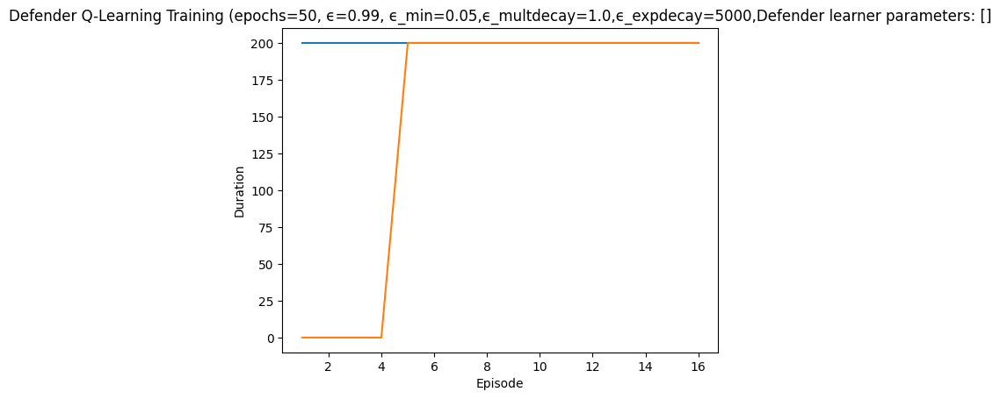

Rendering the current state of the environment
  ## Episode: 17/50 'Defender Q-Learning Training' ϵ=0.5458, Defender learner parameters: []


Episode 17|Iteration 1|reward:   25.0|last_reward_at: ----|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 13, 'parameter': 0}
2 13 0
action type:  Reimage Node
Iteration 1: Action Taken: Type=Reimage Node, NodeID=13, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '12_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 3201, 'successful_actions': 1224, 'failed_actions': 1977}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 17|Iteration 73|reward:  155.0|last_reward_at:   67|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 12, 'parameter': 0}
3 12 0
action type:  Allow Traffic
Iteration 2: Action Taken: Type=Allow Traffic, NodeID=12, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 3202, 'successful_actions': 1224, 'failed_actions': 1978}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 9 4
{'action_type': 4, 'node_id': 9, 'parameter': 4}
[DEBUG] Received action: {'action_type': 4, 'node_id': 9, 'parameter': 4}
4 9 4
action type:  Start Service
Iteration 3: Action

Episode 17|Iteration 77|reward:  195.0|last_reward_at:   75|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 10, 'parameter': 0}
1 10 0
action type:  Block Traffic
Iteration 75: Action Taken: Type=Block Traffic, NodeID=10, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '9_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 3275, 'successful_actions': 1242, 'failed_actions': 2033}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 0 1
{'action_type': 4, 'node_id': 0, 'parameter': 1}
[DEBUG] Received action: {'action_type': 4, 'node_id': 0, 'parameter': 1}
4 0 1
action type:  Start Service
Iteration 76: Action Take

Episode 17|Iteration 77|reward:  195.0|last_reward_at:   77|Elapsed Time: 0:00:00||

3

Episode 17|Iteration 148|reward:  510.0|last_reward_at:  145|Elapsed Time: 0:00:00||

 11 4
{'action_type': 3, 'node_id': 11, 'parameter': 4}
[DEBUG] Received action: {'action_type': 3, 'node_id': 11, 'parameter': 4}
3 11 4
action type:  Allow Traffic
Iteration 78: Action Taken: Type=Allow Traffic, NodeID=11, Parameter=4
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 3278, 'successful_actions': 1243, 'failed_actions': 2035}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 7, 'parameter': 0}
0 7 0
action type:  Reimage Node
Iteration 79: Acti

Episode 17|Iteration 151|reward:  525.0|last_reward_at:  150|Elapsed Time: 0:00:00||

4 13 2
{'action_type': 4, 'node_id': 13, 'parameter': 2}
[DEBUG] Received action: {'action_type': 4, 'node_id': 13, 'parameter': 2}
4 13 2
action type:  Start Service
Iteration 149: Action Taken: Type=Start Service, NodeID=13, Parameter=2
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 3349, 'successful_actions': 1266, 'failed_actions': 2083}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 11, 'parameter': 0}
2 11 0
action type:  Reimage Node
Iteration

Episode 17|Iteration 200|reward:  850.0|last_reward_at:  195|Elapsed Time: 0:00:00||


1 10 0
{'action_type': 1, 'node_id': 10, 'parameter': 0}
[DEBUG] Received action: {'action_type': 1, 'node_id': 10, 'parameter': 0}
1 10 0
action type:  Block Traffic
Iteration 152: Action Taken: Type=Block Traffic, NodeID=10, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '9_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 3352, 'successful_actions': 1268, 'failed_actions': 2084}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 12 2
{'action_type': 1, 'node_id': 12, 'parameter': 2}
[DEBUG] Received action: {'action_type': 1, 'node_id': 12, 'parameter': 2}
1 12 2
action type:  Block Traffic
Iteration 153: Action Taken: Type=Block Traffic, NodeID=12, Parameter=2
info {'action': 'block_traffic', 'status': 'success', 'node_id': '11_LinuxNode', 'port_name': 

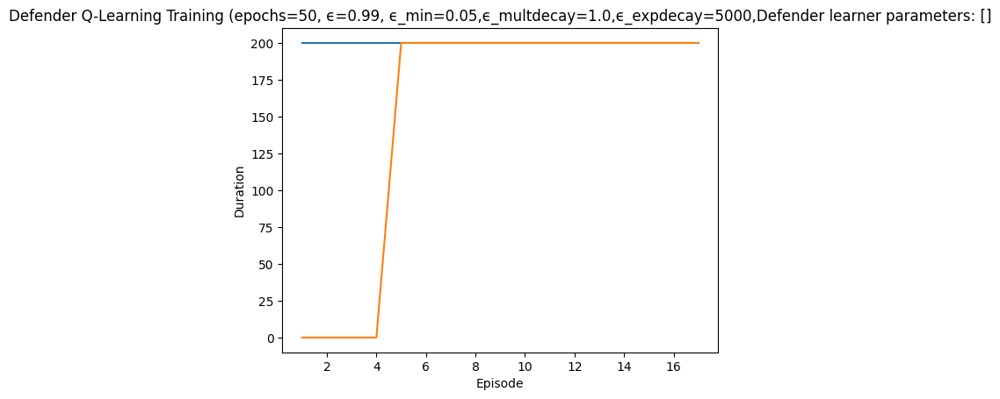

Rendering the current state of the environment
  ## Episode: 18/50 'Defender Q-Learning Training' ϵ=0.5263, Defender learner parameters: []


Episode 18|Iteration 11|reward:   35.0|last_reward_at:   11|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 3, 'parameter': 0}
0 3 0
action type:  Reimage Node
Iteration 1: Action Taken: Type=Reimage Node, NodeID=3, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '2_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 3401, 'successful_actions': 1286, 'failed_actions': 2115}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 10 4
{'action_type': 4, 'node_id': 10, 'parameter': 4}
[DEBUG] Received action: {'action_type': 4, 'node_id': 10, 'parameter': 4}
4 10 4
action ty

Episode 18|Iteration 69|reward:  305.0|last_reward_at:   66|Elapsed Time: 0:00:00||

Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 13, 'parameter': 0}
3 13 0
action type:  Allow Traffic
Iteration 12: Action Taken: Type=Allow Traffic, NodeID=13, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 3412, 'successful_actions': 1289, 'failed_actions': 2123}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 3, 'parameter': 0}
0 3 0
action type:  Reimage Node
Iteration 13: Action Taken: Typ

Episode 18|Iteration 70|reward:  300.0|last_reward_at:   66|Elapsed Time: 0:00:00||


info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 3470, 'successful_actions': 1308, 'failed_actions': 2162}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140

Episode 18|Iteration 80|reward:  390.0|last_reward_at:   78|Elapsed Time: 0:00:00||


No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 10, 'parameter': 0}
1 10 0
action type:  Block Traffic
Iteration 71: Action Taken: Type=Block Traffic, NodeID=10, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '9_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 3471, 'successful_actions': 1309, 'failed_actions': 2162}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 0 0
{'action_type': 1, 'node_id': 0, 'parameter': 0}
[DEBUG] Received action: {'action_type': 1, 'node_id': 0, 'parameter': 0}
1 0 0
action type:  Block Traffic
Iteration 72: Action Taken: Type=Block Traffic, NodeID=0, Parameter=0
info {'action': 'block_traffic', 'status': 'failed', 'no

Episode 18|Iteration 120|reward:  730.0|last_reward_at:  120|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 9, 'parameter': 0}
2 9 0
action type:  Reimage Node
Iteration 82: Action Taken: Type=Reimage Node, NodeID=9, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '8_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 3482, 'successful_actions': 1314, 'failed_actions': 2168}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculate

Episode 18|Iteration 121|reward:  725.0|last_reward_at:  120|Elapsed Time: 0:00:00||

3 3 3
{'action_type': 3, 'node_id': 3, 'parameter': 3}
[DEBUG] Received action: {'action_type': 3, 'node_id': 3, 'parameter': 3}
3 3 3
action type: 

Episode 18|Iteration 136|reward:  760.0|last_reward_at:  132|Elapsed Time: 0:00:00||

 Allow Traffic
Iteration 122: Action Taken: Type=Allow Traffic, NodeID=3, Parameter=3
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 3522, 'successful_actions': 1331, 'failed_actions': 2191}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 11, 'parameter': 0}
1 11 0
action type:  Block Traffic
Iteration 123: Action Taken: Type=Block Traffic, NodeID=11, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '10_WindowsNode', 'port_name'

Episode 18|Iteration 180|reward: 1020.0|last_reward_at:  174|Elapsed Time: 0:00:00||


Iteration 137: Action Taken: Type=Block Traffic, NodeID=10, Parameter=3
info {'action': 'block_traffic', 'status': 'success', 'node_id': '9_LinuxNode', 'port_name': 3, 'performance_metrics': {'actions_taken': 3537, 'successful_actions': 1336, 'failed_actions': 2201}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
3 11 0
{'action_type': 3, 'node_id': 11, 'parameter': 0}
[DEBUG] Received action: {'action_type': 3, 'node_id': 11, 'parameter': 0}
3 11 0
action type:  Allow Traffic
Iteration 138: Action Taken: Type=Allow Traffic, NodeID=11, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 3538, 'successful_actions': 1336, 'failed_actions': 2202}, 'network_availability': 1.0}
firewall_active: 1.400000000

Episode 18|Iteration 181|reward: 1015.0|last_reward_at:  174|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 8, 'parameter': 0}
0 8 0
action type:  Reimage Node
Iteration 181: Action Taken: Type=Reimage Node, NodeID=8, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '7_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 3581, 'successful_actions': 1351, 'failed_actions': 2230}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1

Episode 18|Iteration 190|reward: 1060.0|last_reward_at:  188|Elapsed Time: 0:00:00||

 13 4
{'action_type': 1, 'node_id': 13, 'parameter': 4}
[DEBUG] Received action: {'action_type': 1, 'node_id': 13, 'parameter': 4}
1 13 4
action type:  Block Traffic
Iteration 182: Action Taken: Type=Block Traffic, NodeID=13, Parameter=4
info {'action': 'block_traffic', 'status': 'success', 'node_id': '12_WindowsNode', 'port_name': 4, 'performance_metrics': {'actions_taken': 3582, 'successful_actions': 1352, 'failed_actions': 2230}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 9, 'parameter': 0}
0 9 0
action type:  Reimage Node
Iteration 183: Action

Episode 18|Iteration 200|reward: 1220.0|last_reward_at:  200|Elapsed Time: 0:00:00||



Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 5 5
{'action_type': 2, 'node_id': 5, 'parameter': 5}
[DEBUG] Received action: {'action_type': 2, 'node_id': 5, 'parameter': 5}
2 5 5
action type:  Reimage Node
Iteration 192: Action Taken: Type=Reimage Node, NodeID=5, Parameter=5
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '4_WindowsNode', 'port_name': 5, 'performance_metrics': {'actions_taken': 3592, 'successful_actions': 1356, 'failed_actions': 2236}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 9 0
{'action_type': 0, 'node_id': 9, 'parameter': 0}
[DEBUG] Received action: {'action_type': 0, 'node_id': 9, 'parameter': 0}
0 9 0
action type:  Reimage Node
Iteration 193: Action Taken: Type=Reimage Node, NodeID=9, Parameter=0
info

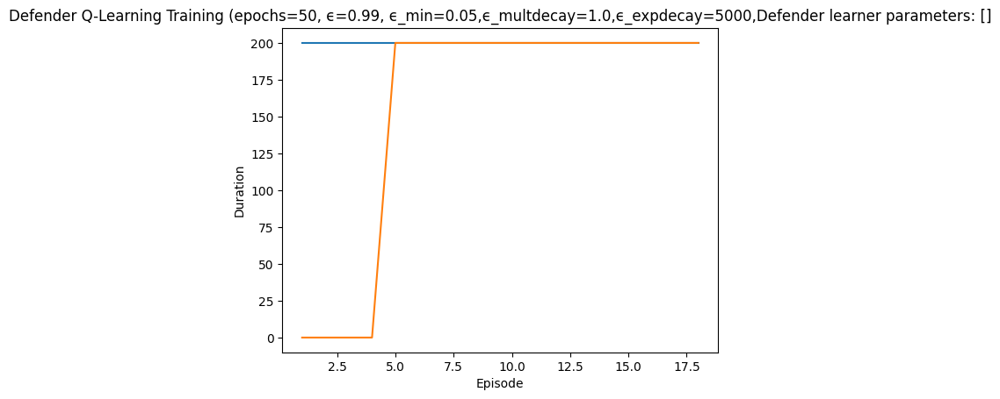

Rendering the current state of the environment
  ## Episode: 19/50 'Defender Q-Learning Training' ϵ=0.5076, Defender learner parameters: []


Episode 19|Iteration 51|reward:  305.0|last_reward_at:   49|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 3, 'parameter': 0}
0 3 0
action type:  Reimage Node
Iteration 1: Action Taken: Type=Reimage Node, NodeID=3, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '2_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 3601, 'successful_actions': 1361, 'failed_actions': 2240}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 6 8
{'action_type': 2, 'node_id': 6, 'parameter': 8}
[DEBUG] Received action: {'action_type': 2, 'node_id': 6, 'parameter': 8}
2 6 8
action type: 

Episode 19|Iteration 95|reward:  565.0|last_reward_at:   91|Elapsed Time: 0:00:00||

0 1 9
{'action_type': 0, 'node_id': 1, 'parameter': 9}
[DEBUG] Received action: {'action_type': 0, 'node_id': 1, 'parameter': 9}
0 1 9
action type:  Reimage Node
Iteration 52: Action Taken: Type=Reimage Node, NodeID=1, Parameter=9
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '13_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 3652, 'successful_actions': 1380, 'failed_actions': 2272}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 8, 'parameter': 0}
0 8 0
action type: 

Episode 19|Iteration 96|reward:  590.0|last_reward_at:   91|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 7, 'parameter': 0}
1 7 0
action type:  Block Traffic
Iteration 96: Action Taken: Type=Block Traffic, NodeID=7, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '6_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 3696, 'successful_actions': 1397, 'failed_actions': 2299}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 19|Iteration 147|reward:  835.0|last_reward_at:  146|Elapsed Time: 0:00:00||

2 5 3
{'action_type': 2, 'node_id': 5, 'parameter': 3}
[DEBUG] Received action: {'action_type': 2, 'node_id': 5, 'parameter': 3}
2 5 3
action type:  Reimage Node
Iteration 97: Action Taken: Type=Reimage Node, NodeID=5, Parameter=3
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '4_WindowsNode', 'port_name': 3, 'performance_metrics': {'actions_taken': 3697, 'successful_actions': 1398, 'failed_actions': 2299}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 2 1
{'action_type': 4, 'node_id': 2, 'parameter': 1}
[DEBUG] Received action: {'action_type': 4, 'node_id': 2, 'parameter': 1}
4 2 1
action type:  Start Service
Iteration 98: Action Taken: Type=Start Service, NodeID=2, Parameter=1
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service'

Episode 19|Iteration 196|reward:  970.0|last_reward_at:  193|Elapsed Time: 0:00:00||

3 6 4
{'action_type': 3, 'node_id': 6, 'parameter': 4}
[DEBUG] Received action: {'action_type': 3, 'node_id': 6, 'parameter': 4}
3 6 4
action type:  Allow Traffic
Iteration 148: Action Taken: Type=Allow Traffic, NodeID=6, Parameter=4
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 3748, 'successful_actions': 1414, 'failed_actions': 2334}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 8, 'parameter': 0}
4 8 0
action type:  Start Service
Iteration 149: Actio

Episode 19|Iteration 198|reward:  990.0|last_reward_at:  193|Elapsed Time: 0:00:00||

 Reimage Node
Iteration 197: Action Taken: Type=Reimage Node, NodeID=12, Parameter=2
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '11_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 3797, 'successful_actions': 1427, 'failed_actions': 2370}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 10 5
{'action_type': 1, 'node_id': 10, 'parameter': 5}
[DEBUG] Received action: {'action_type': 1, 'node_id': 10, 'parameter': 5}
1 10 5
action type:  Block Traffic
Iteration 198: Action Taken: Type=Block Traffic, NodeID=10, Parameter=5
info {'action': 'block_traffic', 'status': 'success', 'node_id': '9_LinuxNode', 'port_name': 5, 'performance_metrics': {'actions_taken': 3798, 'successful_actions': 1428, 'failed_actions': 2370}, 'networ

Episode 19|Iteration 200|reward:  980.0|last_reward_at:  198|Elapsed Time: 0:00:00||


firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 11, 'parameter': 0}
4 11 0
action type:  Start Service
Iteration 199: Action Taken: Type=Start Service, NodeID=11, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 3799, 'successful_actions': 1428, 'failed_actions': 2371}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action

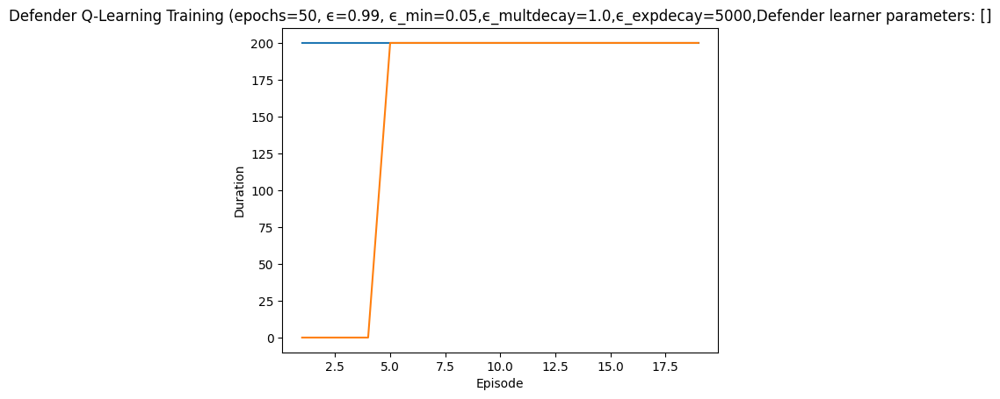

Rendering the current state of the environment
  ## Episode: 20/50 'Defender Q-Learning Training' ϵ=0.4897, Defender learner parameters: []


Episode 20|Iteration 37|reward:  255.0|last_reward_at:   37|Elapsed Time: 0:00:00||

1 8 4
{'action_type': 1, 'node_id': 8, 'parameter': 4}
[DEBUG] Received action: {'action_type': 1, 'node_id': 8, 'parameter': 4}
1 8 4
action type:  Block Traffic
Iteration 1: Action Taken: Type=Block Traffic, NodeID=8, Parameter=4
info {'action': 'block_traffic', 'status': 'success', 'node_id': '7_LinuxNode', 'port_name': 4, 'performance_metrics': {'actions_taken': 3801, 'successful_actions': 1429, 'failed_actions': 2372}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 10, 'parameter': 0}
0 10 0
action type:  Reimage Node
Iteration 2: Action Taken: T

Episode 20|Iteration 39|reward:  305.0|last_reward_at:   38|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 9, 'parameter': 0}
2 9 0
action type:  Reimage Node
Iteration 39: Action Taken: Type=Reimage Node, NodeID=9, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '8_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 3839, 'successful_actions': 1445, 'failed_actions': 2394}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 20|Iteration 75|reward:  415.0|last_reward_at:   72|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 1, 'parameter': 0}
0 1 0
action type:  Reimage Node
Iteration 40: Action Taken: Type=Reimage Node, NodeID=1, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '13_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 3840, 'successful_actions': 1445, 'failed_actions': 2395}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 13 6
{'action_type': 0, 'node_id': 13, 'parameter': 6}
[DEBUG] Received action: {'action_type': 0, 'node_id': 13, 'parameter': 6}
0 13 6
action ty

Episode 20|Iteration 78|reward:  400.0|last_reward_at:   72|Elapsed Time: 0:00:00||

Start Service
Iteration 76: Action Taken: Type=Start Service, NodeID=4, Parameter=7
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 3876, 'successful_actions': 1455, 'failed_actions': 2421}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
3 12 6
{'action_type': 3, 'node_id': 12, 'parameter': 6}
[DEBUG] Received action: {'action_type': 3, 'node_id': 12, 'parameter': 6}
3 12 6
action type:  Allow Traffic
Iteration 77: Action Taken: Type=Allow Traffic, NodeID=12, Parameter=6
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 3877, 'successful_actions': 1455, 'failed_actions': 2422}, 'network_availability': 1.0}
firewa

Episode 20|Iteration 114|reward:  650.0|last_reward_at:  114|Elapsed Time: 0:00:00||

4 6 0
{'action_type': 4, 'node_id': 6, 'parameter': 0}
[DEBUG] Received action: {'action_type': 4, 'node_id': 6, 'parameter': 0}
4 6 0
action type:  Start Service
Iteration 80: Action Taken: Type=Start Service, NodeID=6, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 3880, 'successful_actions': 1456, 'failed_actions': 2424}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 10, 'parameter': 0}
3 10 0
action type:  Allow Traffic
Iteration 81: 

Episode 20|Iteration 115|reward:  675.0|last_reward_at:  115|Elapsed Time: 0:00:00||

2 11 7
{'action_type': 2, 'node_id': 11, 'parameter': 7}
[DEBUG] Received action: {'action_type': 2, 'node_id': 11, 'parameter': 7}
2 11 7
action type:  Reimage Node
Iteration 115: Action Taken: Type=Reimage Node, NodeID=11, Parameter=7
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '10_WindowsNode', 'port_name': 7, 'performance_metrics': {'actions_taken': 3915, 'successful_actions': 1471, 'failed_actions': 2444}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 0, 'parameter': 0}
4 0 0
action type:  Start Service
Iteration 116: Action

Episode 20|Iteration 154|reward:  890.0|last_reward_at:  153|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 2 7
{'action_type': 1, 'node_id': 2, 'parameter': 7}
[DEBUG] Received action: {'action_type': 1, 'node_id': 2, 'parameter': 7}
1 2 7
action type:  Block Traffic
Iteration 117: Action Taken: Type=Block Traffic, NodeID=2, Parameter=7
info {'action': 'block_traffic', 'status': 'success', 'node_id': '1_LinuxNode', 'port_name': 7, 'performance_metrics': {'actions_taken': 3917, 'successful_actions': 1472, 'failed_actions': 2445}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 3 1
{'action_type': 4, 'node_id': 3, 'parameter': 1}
[DEBUG] Received action: {'action_type': 4, 'node_id': 3, 'parameter': 1}
4 3 1
action type:  Start Service
Iteration 118: Action Taken: Type=Start Service, NodeID=3, Parameter=1
in

Episode 20|Iteration 156|reward:  910.0|last_reward_at:  156|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 10, 'parameter': 0}
3 10 0
action type:  Allow Traffic
Iteration 155: Action Taken: Type=Allow Traffic, NodeID=10, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 3955, 'successful_actions': 1485, 'failed_actions': 2470}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 11 0
{'action_type': 1, 'node_id': 11, 'parameter': 0}
[DEBUG] Received action: {'action_type': 1, 'node_id': 11, 'parameter': 0}
1 11 0
action type:  Block Traffic
Iteration 156

Episode 20|Iteration 195|reward: 1215.0|last_reward_at:  195|Elapsed Time: 0:00:01||

Reimage Node
Iteration 157: Action Taken: Type=Reimage Node, NodeID=13, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '12_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 3957, 'successful_actions': 1487, 'failed_actions': 2470}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 9 7
{'action_type': 0, 'node_id': 9, 'parameter': 7}
[DEBUG] Received action: {'action_type': 0, 'node_id': 9, 'parameter': 7}
0 9 7
action type:  Reimage Node
Iteration 158: Action Taken: Type=Reimage Node, NodeID=9, Parameter=7
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '8_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 3958, 'successful_actions': 1487, 'failed_actions': 2471}, 'network_av

Episode 20|Iteration 197|reward: 1235.0|last_reward_at:  197|Elapsed Time: 0:00:01||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 5, 'parameter': 0}
1 5 0
action type:  Block Traffic
Iteration 197: Action Taken: Type=Block Traffic, NodeID=5, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '4_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 3997, 'successful_actions': 1504, 'failed_actions': 2493}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calcul

Episode 20|Iteration 200|reward: 1280.0|last_reward_at:  200|Elapsed Time: 0:00:01||


 Block Traffic
Iteration 198: Action Taken: Type=Block Traffic, NodeID=6, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '5_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 3998, 'successful_actions': 1505, 'failed_actions': 2493}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 12, 'parameter': 0}
0 12 0
action type:  Reimage Node
Iteration 199: Action Taken: Type=Reimage Node, NodeID=12, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '11_LinuxNode', 'reason': 'Reimagin

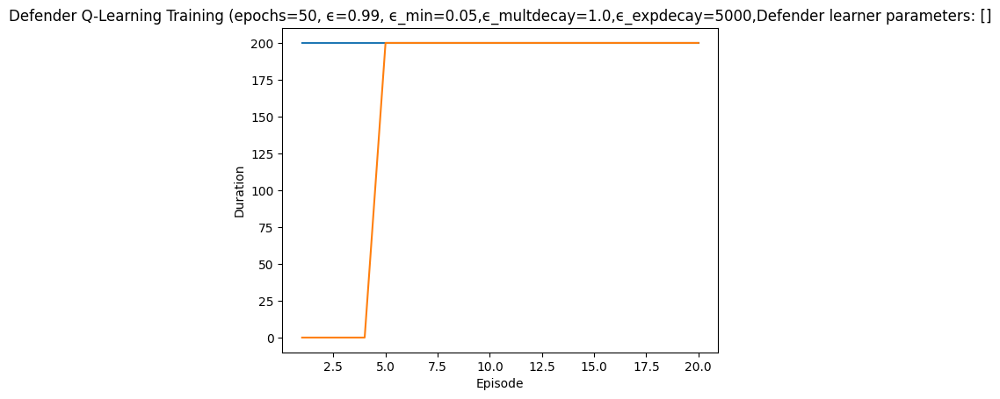

Rendering the current state of the environment
  ## Episode: 21/50 'Defender Q-Learning Training' ϵ=0.4725, Defender learner parameters: []


Episode 21|Iteration 57|reward:  545.0|last_reward_at:   57|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 9, 'parameter': 0}
0 9 0
action type:  Reimage Node
Iteration 1: Action Taken: Type=Reimage Node, NodeID=9, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '8_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 4001, 'successful_actions': 1506, 'failed_actions': 2495}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 10 8
{'action_type': 4, 'node_id': 10, 'parameter': 8}
[DEBUG] Received action: {'action_type': 4, 'node_id': 10, 'parameter': 8}
4 10 8
action ty

Episode 21|Iteration 59|reward:  565.0|last_reward_at:   58|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 10, 'parameter': 0}
0 10 0
action type:  Reimage Node
Iteration 59: Action Taken: Type=Reimage Node, NodeID=10, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '9_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 4059, 'successful_actions': 1535, 'failed_actions': 2524}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 21|Iteration 110|reward:  870.0|last_reward_at:  109|Elapsed Time: 0:00:00||

2 5 7
{'action_type': 2, 'node_id': 5, 'parameter': 7}
[DEBUG] Received action: {'action_type': 2, 'node_id': 5, 'parameter': 7}
2 5 7
action type:  Reimage Node
Iteration 60: Action Taken: Type=Reimage Node, NodeID=5, Parameter=7
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '4_WindowsNode', 'port_name': 7, 'performance_metrics': {'actions_taken': 4060, 'successful_actions': 1536, 'failed_actions': 2524}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 2, 'parameter': 0}
3 2 0
action type:  Allow Traffic
Iteration 61: Action Taken: 

Episode 21|Iteration 161|reward:  975.0|last_reward_at:  158|Elapsed Time: 0:00:00||

3 13 3
{'action_type': 3, 'node_id': 13, 'parameter': 3}
[DEBUG] Received action: {'action_type': 3, 'node_id': 13, 'parameter': 3}
3 13 3
action type:  Allow Traffic
Iteration 111: Action Taken: Type=Allow Traffic, NodeID=13, Parameter=3
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 4111, 'successful_actions': 1554, 'failed_actions': 2557}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 10 9
{'action_type': 2, 'node_id': 10, 'parameter': 9}
[DEBUG] Received action: {'action_type': 2, 'node_id': 10, 'parameter': 9}
2 10 9
action type:  Reimage Node
Iteration 112: Action Taken: Type=Reimage Node, NodeID=10, Parameter=9
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '9_LinuxNode', 'port_nam

Episode 21|Iteration 162|reward:  970.0|last_reward_at:  158|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140

Episode 21|Iteration 200|reward: 1200.0|last_reward_at:  199|Elapsed Time: 0:00:00||



No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 5, 'parameter': 0}
2 5 0
action type:  Reimage Node
Iteration 163: Action Taken: Type=Reimage Node, NodeID=5, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '4_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 4163, 'successful_actions': 1568, 'failed_actions': 2595}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 8 5
{'action_type': 4, 'node_id': 8, 'parameter': 5}
[DEBUG] Received action: {'action_type': 4, 'node_id': 8, 'parameter': 5}
4 8 5
action type:  Start Service
Iteration 164: Action Taken: Type=Start Service, NodeID=8, Parameter=5
info {'status': 'unnecessary', 'reason': 'Service already

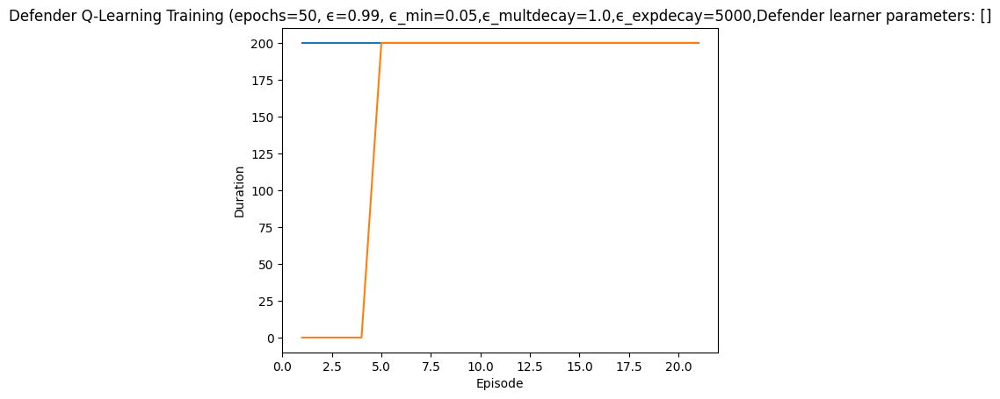

Rendering the current state of the environment
  ## Episode: 22/50 'Defender Q-Learning Training' ϵ=0.4559, Defender learner parameters: []


Episode 22|Iteration 61|reward:  265.0|last_reward_at:   60|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 11, 'parameter': 0}
4 11 0
action type:  Start Service
Iteration 1: Action Taken: Type=Start Service, NodeID=11, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 4201, 'successful_actions': 1581, 'failed_actions': 2620}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action b

Episode 22|Iteration 62|reward:  290.0|last_reward_at:   62|Elapsed Time: 0:00:00||

 9
{'action_type': 1, 'node_id': 9, 'parameter': 9}
[DEBUG] Received action: {'action_type': 1, 'node_id': 9, 'parameter': 9}
1 9 9
action type:  Block Traffic
Iteration 62: Action Taken: Type=Block Traffic, NodeID=9, Parameter=9
info {'action': 'block_traffic', 'status': 'success', 'node_id': '8_WindowsNode', 'port_name': 9, 'performance_metrics': {'actions_taken': 4262, 'successful_actions': 1602, 'failed_actions': 2660}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140

Episode 22|Iteration 115|reward:  785.0|last_reward_at:  113|Elapsed Time: 0:00:00||


No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 6, 'parameter': 0}
2 6 0
action type:  Reimage Node
Iteration 63: Action Taken: Type=Reimage Node, NodeID=6, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '5_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 4263, 'successful_actions': 1603, 'failed_actions': 2660}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 3 0
{'action_type': 4, 'node_id': 3, 'parameter': 0}
[DEBUG] Received action: {'action_type': 4, 'node_id': 3, 'parameter': 0}
4 3 0
action type:  Start Service
Iteration 64: Action Taken: Type=Start Service, NodeID=3, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already run

Episode 22|Iteration 117|reward:  805.0|last_reward_at:  115|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 7, 'parameter': 0}
4 7 0
action type:  Start Service
Iteration 116: Action Taken: Type=Start Service, NodeID=7, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 4316, 'successful_actions': 1628, 'failed_actions': 2688}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 12 9
{'action_type': 2, 'node_id': 12, 'parameter': 9}
[DEBUG] Received action: {'action_type': 2, 'node_id': 12, 'parameter': 9}
2 12 9
action type:  Reimage Node
Iteration 11

Episode 22|Iteration 180|reward: 1100.0|last_reward_at:  172|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 10, 'parameter': 0}
3 10 0
action type:  Allow Traffic
Iteration 118: Action Taken: Type=Allow Traffic, NodeID=10, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 4318, 'successful_actions': 1629, 'failed_actions': 2689}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action base

Episode 22|Iteration 183|reward: 1115.0|last_reward_at:  183|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 13, 'parameter': 0}
4 13 0
action type:  Start Service
Iteration 182: Action Taken: Type=Start Service, NodeID=13, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 4382, 'successful_actions': 1650, 'failed_actions': 2732}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 6 8
{'action_type': 2, 'node_id': 6, 'parameter': 8}
[DEBUG] Received action: {'action_type': 2, 'node_id': 6, 'parameter': 8}
2 6 8
action type:  Reimage Node
Iteration 183

Episode 22|Iteration 200|reward: 1240.0|last_reward_at:  199|Elapsed Time: 0:00:00||


0 10 2
{'action_type': 0, 'node_id': 10, 'parameter': 2}
[DEBUG] Received action: {'action_type': 0, 'node_id': 10, 'parameter': 2}
0 10 2
action type:  Reimage Node
Iteration 184: Action Taken: Type=Reimage Node, NodeID=10, Parameter=2
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '9_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 4384, 'successful_actions': 1651, 'failed_actions': 2733}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 4, 'parameter': 0}
4 4 0
action t

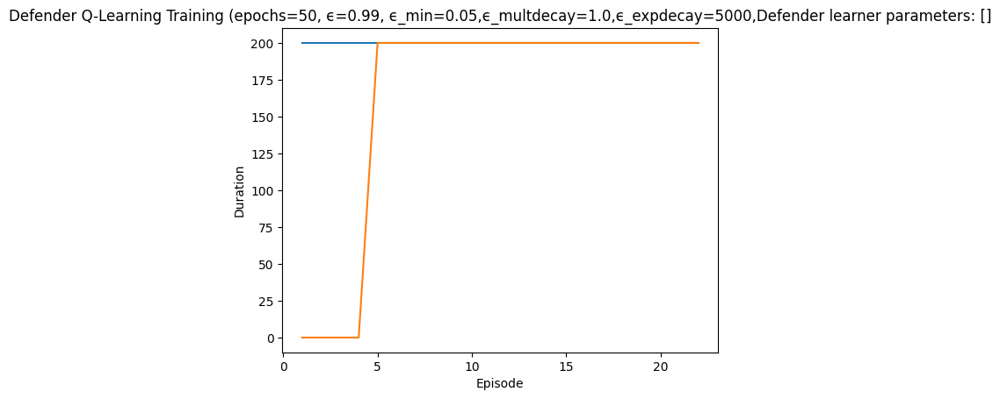

Rendering the current state of the environment
  ## Episode: 23/50 'Defender Q-Learning Training' ϵ=0.4400, Defender learner parameters: []


Episode 23|Iteration 70|reward:  430.0|last_reward_at:   66|Elapsed Time: 0:00:00||

0 1 0
{'action_type': 0, 'node_id': 1, 'parameter': 0}
[DEBUG] Received action: {'action_type': 0, 'node_id': 1, 'parameter': 0}
0 1 0
action type:  Reimage Node
Iteration 1: Action Taken: Type=Reimage Node, NodeID=1, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '13_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 4401, 'successful_actions': 1658, 'failed_actions': 2743}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 9 0
{'action_type': 1, 'node_id': 9, 'parameter': 0}
[DEBUG] Received action: {'action_type': 1, 'node_id': 9, 'parameter': 0}
1 9 0
action type:  Block Traffic
Iteration 2: Action Taken: Type=Block Traffic, NodeID=9, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': 

Episode 23|Iteration 71|reward:  455.0|last_reward_at:   71|Elapsed Time: 0:00:00||


0 12 1
{'action_type': 0, 'node_id': 12, 'parameter': 1}
[DEBUG] Received action: {'action_type': 0, 'node_id': 12, 'parameter': 1}
0 12 1
action type:  Reimage Node

Episode 23|Iteration 132|reward:  690.0|last_reward_at:  130|Elapsed Time: 0:00:00||


Iteration 72: Action Taken: Type=Reimage Node, NodeID=12, Parameter=1
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '11_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 4472, 'successful_actions': 1685, 'failed_actions': 2787}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 0, 'parameter': 0}
1 0 0
action type:  Block Traffic
Iteration 73: Action Taken: Type=Block Traffic, NodeID=0, Parameter=0
info {'action': 'block_traffic', 'status': 'failed', 'node_id': 'start', 'p

Episode 23|Iteration 133|reward:  685.0|last_reward_at:  130|Elapsed Time: 0:00:00||


info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '12_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 4533, 'successful_actions': 1704, 'failed_actions': 2829}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140

Episode 23|Iteration 188|reward: 1170.0|last_reward_at:  188|Elapsed Time: 0:00:00||


No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 3, 'parameter': 0}
0 3 0
action type:  Reimage Node
Iteration 134: Action Taken: Type=Reimage Node, NodeID=3, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '2_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 4534, 'successful_actions': 1704, 'failed_actions': 2830}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 

Episode 23|Iteration 189|reward: 1195.0|last_reward_at:  188|Elapsed Time: 0:00:00||

3 0
action type:  Reimage Node
Iteration 189: Action Taken: Type=Reimage Node, NodeID=3, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '2_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 4589, 'successful_actions': 1731, 'failed_actions': 2858}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 23|Iteration 200|reward: 1310.0|last_reward_at:  199|Elapsed Time: 0:00:00||


firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 0, 'parameter': 0}
3 0 0
action type:  Allow Traffic
Iteration 190: Action Taken: Type=Allow Traffic, NodeID=0, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 4590, 'successful_actions': 1731, 'failed_actions': 2859}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based o

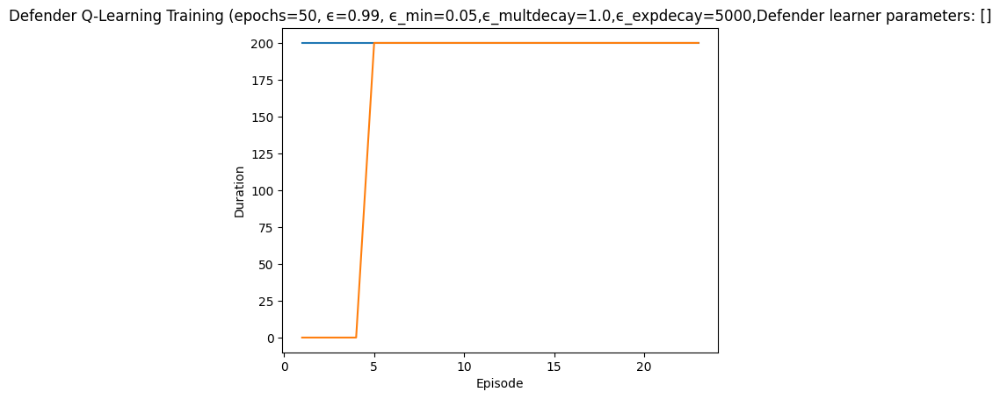

Rendering the current state of the environment
  ## Episode: 24/50 'Defender Q-Learning Training' ϵ=0.4247, Defender learner parameters: []


Episode 24|Iteration 17|reward:  185.0|last_reward_at:   17|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 5, 'parameter': 0}
4 5 0
action type:  Start Service
Iteration 1: Action Taken: Type=Start Service, NodeID=5, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 4601, 'successful_actions': 1737, 'failed_actions': 2864}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action base

Episode 24|Iteration 46|reward:  370.0|last_reward_at:   46|Elapsed Time: 0:00:00||

Iteration 18: Action Taken: Type=Allow Traffic, NodeID=4, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 4618, 'successful_actions': 1746, 'failed_actions': 2872}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 2 3
{'action_type': 0, 'node_id': 2, 'parameter': 3}
[DEBUG] Received action: {'action_type': 0, 'node_id': 2, 'parameter': 3}
0 2 3
action type:  Reimage Node
Iteration 19: Action Taken: Type=Reimage Node, NodeID=2, Parameter=3
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '1_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 4619, 'successful_actions': 1746, 'failed_actions': 2873}, 'network_availability': 

Episode 24|Iteration 47|reward:  365.0|last_reward_at:   46|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 3, 'parameter': 0}
4 3 0
action type:  Start Service
Iteration 47: Action Taken: Type=Start Service, NodeID=3, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 4647, 'successful_actions': 1757, 'failed_actions': 2890}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action bas

Episode 24|Iteration 56|reward:  440.0|last_reward_at:   56|Elapsed Time: 0:00:00||


3 6 0
action type:  Allow Traffic
Iteration 48: Action Taken: Type=Allow Traffic, NodeID=6, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 4648, 'successful_actions': 1757, 'failed_actions': 2891}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 6, 'parameter': 0}
2 6 0
action type:  Reimage Node
Iteration 49: Action Taken: Type=Reimage Node, NodeID=6, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '5_LinuxNode', '

Episode 24|Iteration 96|reward:  740.0|last_reward_at:   96|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 1, 'parameter': 0}
3 1 0
action type:  Allow Traffic
Iteration 57: Action Taken: Type=Allow Traffic, NodeID=1, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 4657, 'successful_actions': 1761, 'failed_actions': 2896}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 6 6
{'action_type': 0, 'node_id': 6, 'parameter': 6}
[DEBUG] Received action: {'action_type': 0, 'node_id': 6, 'parameter': 6}
0 6 6
action type:  Reimage Node
Iteration 58: Action T

Episode 24|Iteration 97|reward:  765.0|last_reward_at:   97|Elapsed Time: 0:00:00||

2 2 7
{'action_type': 2, 'node_id': 2, 'parameter': 7}
[DEBUG] Received action: {'action_type': 2, 'node_id': 2, 'parameter': 7}
2 2 7
action type:  Reimage Node
Iteration 97: Action Taken: Type=Reimage Node, NodeID=2, Parameter=7
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '1_LinuxNode', 'port_name': 7, 'performance_metrics': {'actions_taken': 4697, 'successful_actions': 1779, 'failed_actions': 2918}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 3, 'parameter': 0}
2 3 0
action type:  Reimage Node
Iteration 98: Action Taken: Typ

Episode 24|Iteration 105|reward:  815.0|last_reward_at:  104|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 1 4
{'action_type': 1, 'node_id': 1, 'parameter': 4}
[DEBUG] Received action: {'action_type': 1, 'node_id': 1, 'parameter': 4}
1 1 4
action type:  Block Traffic
Iteration 99: Action Taken: Type=Block Traffic, NodeID=1, Parameter=4
info {'action': 'block_traffic', 'status': 'success', 'node_id': '13_LinuxNode', 'port_name': 4, 'performance_metrics': {'actions_taken': 4699, 'successful_actions': 1781, 'failed_actions': 2918}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choos

Episode 24|Iteration 138|reward: 1040.0|last_reward_at:  138|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 13 0
{'action_type': 1, 'node_id': 13, 'parameter': 0}
[DEBUG] Received action: {'action_type': 1, 'node_id': 13, 'parameter': 0}
1 13 0
action type:  Block Traffic
Iteration 107: Action Taken: Type=Block Traffic, NodeID=13, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '12_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 4707, 'successful_actions': 1783, 'failed_actions': 2924}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: 

Episode 24|Iteration 139|reward: 1035.0|last_reward_at:  138|Elapsed Time: 0:00:00||


No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 3, 'parameter': 0}
3 3 0
action type:  Allow Traffic
Iteration 139: Action Taken: Type=Allow Traffic, NodeID=3, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 4739, 'successful_actions': 1795, 'failed_actions': 2944}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 24|Iteration 152|reward: 1120.0|last_reward_at:  151|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 6, 'parameter': 0}
1 6 0
action type:  Block Traffic
Iteration 140: Action Taken: Type=Block Traffic, NodeID=6, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '5_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 4740, 'successful_actions': 1796, 'failed_actions': 2944}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 11 2
{'action_type': 1, 'node_id': 11, 'parameter': 2}
[DEBUG] Received action: {'action_type': 1, 'node_id': 11, 'parameter': 2}
1 11 2
action type:  Block Traffic
Iteration 141: Action T

Episode 24|Iteration 192|reward: 1430.0|last_reward_at:  190|Elapsed Time: 0:00:00||

 0
action type:  Allow Traffic
Iteration 153: Action Taken: Type=Allow Traffic, NodeID=13, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 4753, 'successful_actions': 1800, 'failed_actions': 2953}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 12 3
{'action_type': 2, 'node_id': 12, 'parameter': 3}
[DEBUG] Received action: {'action_type': 2, 'node_id': 12, 'parameter': 3}
2 12 3
action type:  Reimage Node
Iteration 154: Action Taken: Type=Reimage Node, NodeID=12, Parameter=3
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '11_LinuxNode', 'port_name': 3, 'performance_metrics': {'actions_taken': 4754, 'successful_actions': 1801, 'failed_actions': 2953}, 'network_availability': 1.0}

Episode 24|Iteration 193|reward: 1455.0|last_reward_at:  193|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 9, 'parameter': 0}
1 9 0
action type:  Block Traffic
Iteration 193: Action Taken: Type=Block Traffic, NodeID=9, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '8_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 4793, 'successful_actions': 1818, 'failed_actions': 2975}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the

Episode 24|Iteration 200|reward: 1410.0|last_reward_at:  193|Elapsed Time: 0:00:00||



3 11 0
action type:  Allow Traffic
Iteration 194: Action Taken: Type=Allow Traffic, NodeID=11, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 4794, 'successful_actions': 1818, 'failed_actions': 2976}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 8, 'parameter': 0}
4 8 0
action type:  Start Service
Iteration 195: Action Taken: Type=Start Service, NodeID=8, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not fo

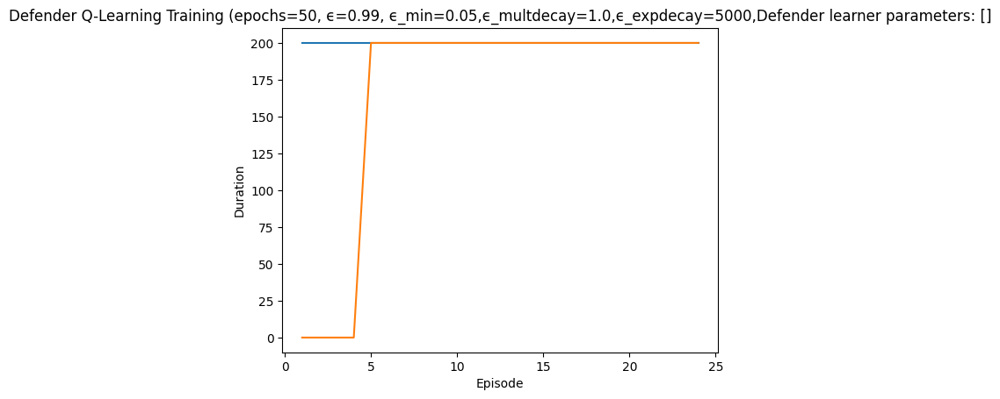

Rendering the current state of the environment
  ## Episode: 25/50 'Defender Q-Learning Training' ϵ=0.4100, Defender learner parameters: []


Episode 25|Iteration 7|reward:  -35.0|last_reward_at: ----|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 5, 'parameter': 0}
4 5 0
action type:  Start Service
Iteration 1: Action Taken: Type=Start Service, NodeID=5, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 4801, 'successful_actions': 1818, 'failed_actions': 2983}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
3 4 2
{'action_type': 3, 'node_id': 4, 'parameter': 2}
[DEBUG] Received action: {'action_type': 3, 'node_id': 4, 'parameter': 2}
3 4 2
action type:  Allow Traffic
Iteration 2: Acti

Episode 25|Iteration 47|reward:  265.0|last_reward_at:   46|Elapsed Time: 0:00:00||

1 0 0
{'action_type': 1, 'node_id': 0, 'parameter': 0}
[DEBUG] Received action: {'action_type': 1, 'node_id': 0, 'parameter': 0}
1 0 0
action type:  Block Traffic
Iteration 8: Action Taken: Type=Block Traffic, NodeID=0, Parameter=0
info {'action': 'block_traffic', 'status': 'failed', 'node_id': 'start', 'port_name': 0, 'reason': 'Machine not running', 'performance_metrics': {'actions_taken': 4808, 'successful_actions': 1818, 'failed_actions': 2990}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
3 8 4
{'action_type': 3, 'node_id': 8, 'parameter': 4}
[DEBUG] Received action: {'action_type': 3, 'node_id': 8, 'parameter': 4}
3 8 4
action type:  Allow Traffic
Iteration 9: Action Taken: Type=Allow Traffic, NodeID=8, Parameter=4
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'acti

Episode 25|Iteration 48|reward:  260.0|last_reward_at:   46|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 8, 'parameter': 0}
3 8 0
action type:  Allow Traffic
Iteration 48: Action Taken: Type=Allow Traffic, NodeID=8, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 4848, 'successful_actions': 1835, 'failed_actions': 3013}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 25|Iteration 51|reward:  275.0|last_reward_at:   46|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 8, 'parameter': 0}
0 8 0
action type:  Reimage Node
Iteration 49: Action Taken: Type=Reimage Node, NodeID=8, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '7_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 4849, 'successful_actions': 1835, 'failed_actions': 3014}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventi

Episode 25|Iteration 102|reward:  540.0|last_reward_at:   96|Elapsed Time: 0:00:00||

1 8 3
{'action_type': 1, 'node_id': 8, 'parameter': 3}
[DEBUG] Received action: {'action_type': 1, 'node_id': 8, 'parameter': 3}
1 8 3
action type:  Block Traffic
Iteration 52: Action Taken: Type=Block Traffic, NodeID=8, Parameter=3
info {'action': 'block_traffic', 'status': 'success', 'node_id': '7_LinuxNode', 'port_name': 3, 'performance_metrics': {'actions_taken': 4852, 'successful_actions': 1837, 'failed_actions': 3015}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 2, 'parameter': 0}
2 2 0
action type:  Reimage Node
Iteration 53: Action Taken: T

Episode 25|Iteration 107|reward:  545.0|last_reward_at:  104|Elapsed Time: 0:00:00||

info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 4903, 'successful_actions': 1854, 'failed_actions': 3049}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 9 9
{'action_type': 2, 'node_id': 9, 'parameter': 9}
[DEBUG] Received action: {'action_type': 2, 'node_id': 9, 'parameter': 9}
2 9 9
action type:  Reimage Node
Iteration 104: Action Taken: Type=Reimage Node, NodeID=9, Parameter=9
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '8_WindowsNode', 'port_name': 9, 'performance_metrics': {'actions_taken': 4904, 'successful_actions': 1855, 'failed_actions': 3049}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Upda

Episode 25|Iteration 113|reward:  575.0|last_reward_at:  111|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 1, 'parameter': 0}
4 1 0
action type:  Start Service
Iteration 108: Action Taken: Type=Start Service, NodeID=1, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 4908, 'successful_actions': 1855, 'failed_actions': 3053}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action ba

Episode 25|Iteration 174|reward: 1010.0|last_reward_at:  174|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 8, 'parameter': 0}
4 8 0
action type:  Start Service
Iteration 114: Action Taken: Type=Start Service, NodeID=8, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 4914, 'successful_actions': 1857, 'failed_actions': 3057}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action ba

Episode 25|Iteration 179|reward:  975.0|last_reward_at:  174|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 12, 'parameter': 0}
0 12 0
action type:  Reimage Node
Iteration 176: Action Taken: Type=Reimage Node, NodeID=12, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '11_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 4976, 'successful_actions': 1882, 'failed_actions': 3094}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 0 5
{'action_type': 1, 'node_id': 0, 'parameter': 5}
[DEBUG] Received action: {'action_type': 1, 'node_id': 0, 'parameter': 5}
1 0 5
action ty

Episode 25|Iteration 183|reward: 1045.0|last_reward_at:  183|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 6, 'parameter': 0}
0 6 0
action type:  Reimage Node
Iteration 180: Action Taken: Type=Reimage Node, NodeID=6, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '5_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 4980, 'successful_actions': 1882, 'failed_actions': 3098}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a prevent

Episode 25|Iteration 200|reward: 1110.0|last_reward_at:  197|Elapsed Time: 0:00:00||


firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 1, 'parameter': 0}
3 1 0
action type:  Allow Traffic
Iteration 184: Action Taken: Type=Allow Traffic, NodeID=1, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 4984, 'successful_actions': 1885, 'failed_actions': 3099}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based o

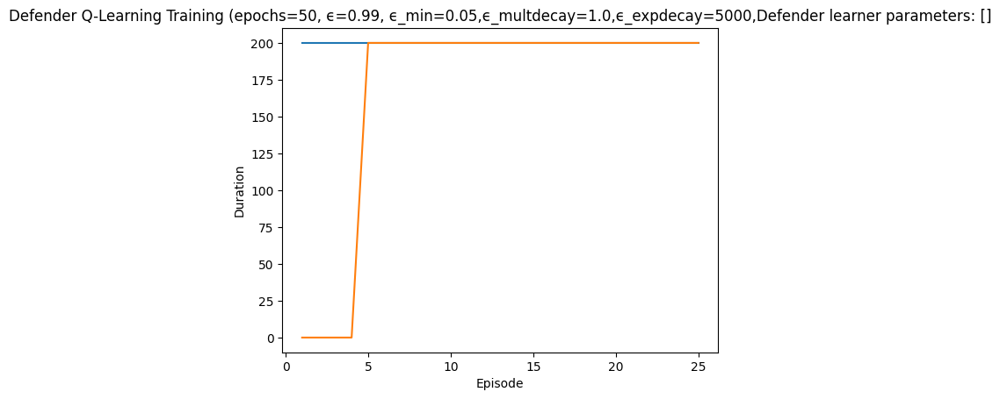

Rendering the current state of the environment
  ## Episode: 26/50 'Defender Q-Learning Training' ϵ=0.3959, Defender learner parameters: []


Episode 26|Iteration 7|reward:   85.0|last_reward_at:    7|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 9, 'parameter': 0}
0 9 0
action type:  Reimage Node
Iteration 1: Action Taken: Type=Reimage Node, NodeID=9, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '8_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 5001, 'successful_actions': 1890, 'failed_actions': 3111}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a prevent

Episode 26|Iteration 47|reward:  285.0|last_reward_at:   47|Elapsed Time: 0:00:00||

Iteration 8: Action Taken: Type=Start Service, NodeID=13, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 5008, 'successful_actions': 1894, 'failed_actions': 3114}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 10, 'parameter': 0}
3 10 0
action type:  Allow Traffic
Iteration 9: Action Taken: Type=Allow Traffic, NodeID=10, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'per

Episode 26|Iteration 48|reward:  310.0|last_reward_at:   48|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 26|Iteration 52|reward:  320.0|last_reward_at:   49|Elapsed Time: 0:00:00||

2 3 8
{'action_type': 2, 'node_id': 3, 'parameter': 8}
[DEBUG] Received action: {'action_type': 2, 'node_id': 3, 'parameter': 8}
2 3 8
action type:  Reimage Node
Iteration 49: Action Taken: Type=Reimage Node, NodeID=3, Parameter=8
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '2_WindowsNode', 'port_name': 8, 'performance_metrics': {'actions_taken': 5049, 'successful_actions': 1910, 'failed_actions': 3139}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 7 0
{'action_type': 0, 'node_id': 7, 'parameter': 0}
[DEBUG] Received action: {'action_type': 0, 'node_id': 7, 'parameter': 0}
0 7 0
action type:  Reimage Node
Iteration 50: Action Taken: Type=Reimage Node, NodeID=7, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '6_WindowsNode', 'reason': 'Reimaging no

Episode 26|Iteration 93|reward:  555.0|last_reward_at:   90|Elapsed Time: 0:00:00||

 Block Traffic
Iteration 53: Action Taken: Type=Block Traffic, NodeID=7, Parameter=8
info {'action': 'block_traffic', 'status': 'success', 'node_id': '6_WindowsNode', 'port_name': 8, 'performance_metrics': {'actions_taken': 5053, 'successful_actions': 1911, 'failed_actions': 3142}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 7, 'parameter': 0}
4 7 0
action type:  Start Service
Iteration 54: Action Taken: Type=Start Service, NodeID=7, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_servic

Episode 26|Iteration 94|reward:  550.0|last_reward_at:   93|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 10, 'parameter': 0}
0 10 0
action type:  Reimage Node
Iteration 94: Action Taken: Type=Reimage Node, NodeID=10, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '9_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 5094, 'successful_actions': 1926, 'failed_actions': 3168}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 26|Iteration 99|reward:  645.0|last_reward_at:   98|Elapsed Time: 0:00:00||

3 9 0
{'action_type': 3, 'node_id': 9, 'parameter': 0}
[DEBUG] Received action: {'action_type': 3, 'node_id': 9, 'parameter': 0}
3 9 0
action type:  Allow Traffic
Iteration 95: Action Taken: Type=Allow Traffic, NodeID=9, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 5095, 'successful_actions': 1926, 'failed_actions': 3169}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 6, 'parameter': 0}
2 6 0
action type:  Reimage Node
Iteration 96: Action T

Episode 26|Iteration 138|reward:  940.0|last_reward_at:  138|Elapsed Time: 0:00:00||

1 11 6
{'action_type': 1, 'node_id': 11, 'parameter': 6}
[DEBUG] Received action: {'action_type': 1, 'node_id': 11, 'parameter': 6}
1 11 6
action type:  Block Traffic
Iteration 100: Action Taken: Type=Block Traffic, NodeID=11, Parameter=6
info {'action': 'block_traffic', 'status': 'success', 'node_id': '10_WindowsNode', 'port_name': 6, 'performance_metrics': {'actions_taken': 5100, 'successful_actions': 1931, 'failed_actions': 3169}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 12, 'parameter': 0}
2 12 0
action type:  Reimage Node
Iteration 101: Act

Episode 26|Iteration 139|reward:  935.0|last_reward_at:  138|Elapsed Time: 0:00:00||


0 11 0
action type:  Reimage Node
Iteration 139: Action Taken: Type=Reimage Node, NodeID=11, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '10_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 5139, 'successful_actions': 1947, 'failed_actions': 3192}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 5, 'parameter': 0}
1 5 0
action type:  Block Traffic
Iteration 140: Action Taken: Type=Block Traffic, NodeID=5, Parameter=0
info

Episode 26|Iteration 144|reward:  940.0|last_reward_at:  140|Elapsed Time: 0:00:00||

 {'action': 'block_traffic', 'status': 'success', 'node_id': '4_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 5140, 'successful_actions': 1948, 'failed_actions': 3192}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
3 8 7
{'action_type': 3, 'node_id': 8, 'parameter': 7}
[DEBUG] Received action: {'action_type': 3, 'node_id': 8, 'parameter': 7}
3 8 7
action type:  Allow Traffic
Iteration 141: Action Taken: Type=Allow Traffic, NodeID=8, Parameter=7
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 5141, 'successful_actions': 1948, 'failed_actions': 3193}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updati

Episode 26|Iteration 194|reward: 1340.0|last_reward_at:  192|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 6, 'parameter': 0}
0 6 0
action type:  Reimage Node
Iteration 145: Action Taken: Type=Reimage Node, NodeID=6, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '5_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 5145, 'successful_actions': 1948, 'failed_actions': 3197}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a prevent

Episode 26|Iteration 197|reward: 1355.0|last_reward_at:  195|Elapsed Time: 0:00:00||

2 7 0
{'action_type': 2, 'node_id': 7, 'parameter': 0}
[DEBUG] Received action: {'action_type': 2, 'node_id': 7, 'parameter': 0}
2 7 0
action type:  Reimage Node
Iteration 195: Action Taken: Type=Reimage Node, NodeID=7, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '6_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 5195, 'successful_actions': 1971, 'failed_actions': 3224}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 1 8
{'action_type': 4, 'node_id': 1, 'parameter': 8}
[DEBUG] Received action: {'action_type': 4, 'node_id': 1, 'parameter': 8}
4 1 8
action type:  Start Service
Iteration 196: Action Taken: Type=Start Service, NodeID=1, Parameter=8
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_servic

Episode 26|Iteration 200|reward: 1340.0|last_reward_at:  195|Elapsed Time: 0:00:00||


firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 1, 'parameter': 0}
3 1 0
action type:  Allow Traffic
Iteration 198: Action Taken: Type=Allow Traffic, NodeID=1, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 5198, 'successful_actions': 1971, 'failed_actions': 3227}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based o

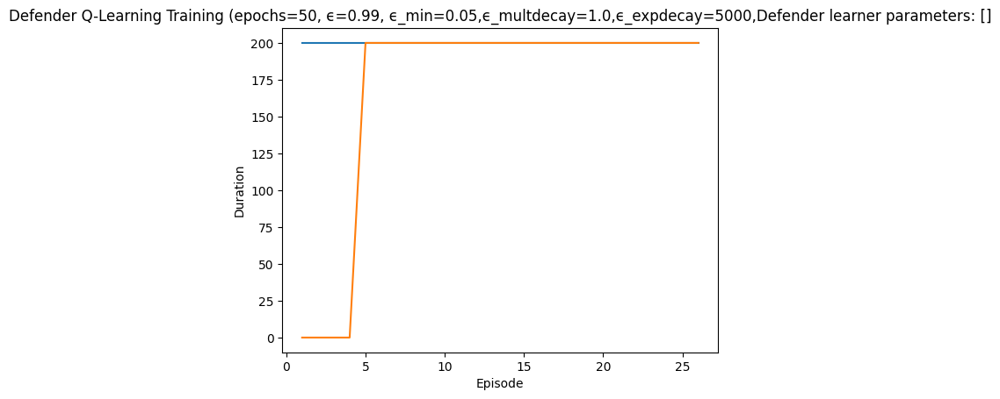

Rendering the current state of the environment
  ## Episode: 27/50 'Defender Q-Learning Training' ϵ=0.3823, Defender learner parameters: []


Episode 27|Iteration 12|reward:   20.0|last_reward_at:   10|Elapsed Time: 0:00:00||

4 5 5
{'action_type': 4, 'node_id': 5, 'parameter': 5}
[DEBUG] Received action: {'action_type': 4, 'node_id': 5, 'parameter': 5}
4 5 5
action type:  Start Service
Iteration 1: Action Taken: Type=Start Service, NodeID=5, Parameter=5
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 5201, 'successful_actions': 1971, 'failed_actions': 3230}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 1, 'parameter': 0}
2 1 0
action type:  Reimage Node
Iteration 2: Actio

Episode 27|Iteration 71|reward:  275.0|last_reward_at:   71|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 2, 'parameter': 0}
4 2 0
action type:  Start Service
Iteration 13: Action Taken: Type=Start Service, NodeID=2, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 5213, 'successful_actions': 1974, 'failed_actions': 3239}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 9 3
{'action_type': 1, 'node_id': 9, 'parameter': 3}
[DEBUG] Received action: {'action_type': 1, 'node_id': 9, 'parameter': 3}
1 9 3
action type:  Block Traffic
Iteration 14: Ac

Episode 27|Iteration 72|reward:  300.0|last_reward_at:   72|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 7, 'parameter': 0}
2 7 0
action type:  Reimage Node
Iteration 72: Action Taken: Type=Reimage Node, NodeID=7, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '6_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 5272, 'successful_actions': 1994, 'failed_actions': 3278}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 27|Iteration 77|reward:  255.0|last_reward_at:   72|Elapsed Time: 0:00:00||

0 4 4
{'action_type': 0, 'node_id': 4, 'parameter': 4}
[DEBUG] Received action: {'action_type': 0, 'node_id': 4, 'parameter': 4}
0 4 4
action type:  Reimage Node
Iteration 73: Action Taken: Type=Reimage Node, NodeID=4, Parameter=4
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '3_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 5273, 'successful_actions': 1994, 'failed_actions': 3279}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 0 5
{'action_type': 1, 'node_id': 0, 'parameter': 5}
[DEBUG] Received action: {'action_type': 1, 'node_id': 0, 'parameter': 5}
1 0 5
action type:  Block Traffic
Iteration 74: Action Taken: Type=Block Traffic, NodeID=0, Parameter=5
info {'action': 'block_traffic', 'status': 'failed', 'node_id': 

Episode 27|Iteration 143|reward:  725.0|last_reward_at:  140|Elapsed Time: 0:00:00||


info {'action': 'allow_traffic', 'status': 'success', 'node_id': '12_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 5278, 'successful_actions': 1995, 'failed_actions': 3283}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 4, 'parameter': 0}
0 4 0
action type:  Reimage Node
Iteration 79: Action Taken: Type=Reimage Node, NodeID=4, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '3_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 5279, 's

Episode 27|Iteration 144|reward:  720.0|last_reward_at:  140|Elapsed Time: 0:00:00||

3 3 3
{'action_type': 3, 'node_id': 3, 'parameter': 3}
[DEBUG] Received action: {'action_type': 3, 'node_id': 3, 'parameter': 3}
3 3 3
action type:  Allow Traffic
Iteration 144: Action Taken: Type=Allow Traffic, NodeID=3, Parameter=3
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 5344, 'successful_actions': 2021, 'failed_actions': 3323}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 27|Iteration 149|reward:  755.0|last_reward_at:  148|Elapsed Time: 0:00:00||

3 2 8
{'action_type': 3, 'node_id': 2, 'parameter': 8}
[DEBUG] Received action: {'action_type': 3, 'node_id': 2, 'parameter': 8}
3 2 8
action type:  Allow Traffic
Iteration 145: Action Taken: Type=Allow Traffic, NodeID=2, Parameter=8
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 5345, 'successful_actions': 2021, 'failed_actions': 3324}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 2, 'parameter': 0}
0 2 0
action type:  Reimage Node
Iteration 146: Action

Episode 27|Iteration 200|reward: 1000.0|last_reward_at:  199|Elapsed Time: 0:00:00||



4 4 0
action type:  Start Service
Iteration 150: Action Taken: Type=Start Service, NodeID=4, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 5350, 'successful_actions': 2023, 'failed_actions': 3327}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 7, 'parameter': 0}
3 7 0
action type:  Allow Traffic
Iteration 151: Action Taken: Type=Allow Traffic, NodeID=7, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not fou

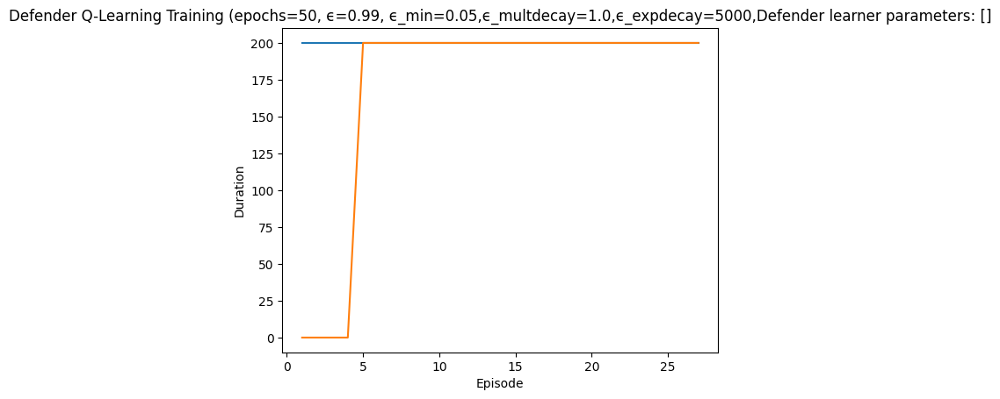

Rendering the current state of the environment
  ## Episode: 28/50 'Defender Q-Learning Training' ϵ=0.3693, Defender learner parameters: []


Episode 28|Iteration 18|reward:  140.0|last_reward_at:   12|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 10, 'parameter': 0}
1 10 0
action type:  Block Traffic
Iteration 1: Action Taken: Type=Block Traffic, NodeID=10, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '9_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 5401, 'successful_actions': 2041, 'failed_actions': 3360}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the 

Episode 28|Iteration 64|reward:  450.0|last_reward_at:   63|Elapsed Time: 0:00:00||

info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 5419, 'successful_actions': 2048, 'failed_actions': 3371}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 13 6
{'action_type': 4, 'node_id': 13, 'parameter': 6}
[DEBUG] Received action: {'action_type': 4, 'node_id': 13, 'parameter': 6}
4 13 6
action type:  Start Service
Iteration 20: Action Taken: Type=Start Service, NodeID=13, Parameter=6
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 5420, 'successful_actions': 2048, 'failed_actions': 3372}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calcu

Episode 28|Iteration 78|reward:  530.0|last_reward_at:   78|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 9, 'parameter': 0}
2 9 0
action type:  Reimage Node
Iteration 66: Action Taken: Type=Reimage Node, NodeID=9, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '8_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 5466, 'successful_actions': 2068, 'failed_actions': 3398}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculate

Episode 28|Iteration 113|reward:  745.0|last_reward_at:  112|Elapsed Time: 0:00:00||

 Allow Traffic
Iteration 79: Action Taken: Type=Allow Traffic, NodeID=8, Parameter=2
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 5479, 'successful_actions': 2071, 'failed_actions': 3408}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 12, 'parameter': 0}
2 12 0
action type:  Reimage Node
Iteration 80: Action Taken: Type=Reimage Node, NodeID=12, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '11_LinuxNode', 'port_name': 0, '

Episode 28|Iteration 114|reward:  740.0|last_reward_at:  112|Elapsed Time: 0:00:00||

4 12 8
{'action_type': 4, 'node_id': 12, 'parameter': 8}
[DEBUG] Received action: {'action_type': 4, 'node_id': 12, 'parameter': 8}
4 12 8
action type:  Start Service
Iteration 114: Action Taken: Type=Start Service, NodeID=12, Parameter=8
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 5514, 'successful_actions': 2084, 'failed_actions': 3430}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140

Episode 28|Iteration 125|reward:  805.0|last_reward_at:  125|Elapsed Time: 0:00:00||


No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 12, 'parameter': 0}
4 12 0
action type:  Start Service
Iteration 115: Action Taken: Type=Start Service, NodeID=12, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 5515, 'successful_actions': 2084, 'failed_actions': 3431}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 7 0
{'action_type': 1, 'node_id': 7, 'parameter': 0}
[DEBUG] Received action: {'action_type': 1, 'node_id': 7, 'parameter': 0}
1 7 0
action type:  Block Traffic
Iteration 116: Action Taken: Type=Block Traffic, NodeID=7, Parameter=0
info {'action': 'block_traffic', 'status':

Episode 28|Iteration 160|reward:  980.0|last_reward_at:  158|Elapsed Time: 0:00:00||


Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 1, 'parameter': 0}
0 1 0
action type:  Reimage Node
Iteration 127: Action Taken: Type=Reimage Node, NodeID=1, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '13_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 5527, 'successful_actions': 2089, 'failed_actions': 3438}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140


Episode 28|Iteration 161|reward: 1005.0|last_reward_at:  158|Elapsed Time: 0:00:00||


No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 3, 'parameter': 0}
2 3 0
action type:  Reimage Node
Iteration 161: Action Taken: Type=Reimage Node, NodeID=3, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '2_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 5561, 'successful_actions': 2101, 'failed_actions': 3460}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 28|Iteration 172|reward: 1100.0|last_reward_at:  171|Elapsed Time: 0:00:00||

0 3 7
{'action_type': 0, 'node_id': 3, 'parameter': 7}
[DEBUG] Received action: {'action_type': 0, 'node_id': 3, 'parameter': 7}
0 3 7
action type:  Reimage Node
Iteration 162: Action Taken: Type=Reimage Node, NodeID=3, Parameter=7
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '2_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 5562, 'successful_actions': 2101, 'failed_actions': 3461}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 7, 'parameter': 0}
4 7 0
action type

Episode 28|Iteration 200|reward: 1200.0|last_reward_at:  195|Elapsed Time: 0:00:00||


4 2 5
{'action_type': 4, 'node_id': 2, 'parameter': 5}
[DEBUG] Received action: {'action_type': 4, 'node_id': 2, 'parameter': 5}
4 2 5
action type:  Start Service
Iteration 173: Action Taken: Type=Start Service, NodeID=2, Parameter=5
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 5573, 'successful_actions': 2106, 'failed_actions': 3467}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 3, 'parameter': 0}
4 3 0
action type:  Start Service
Iteration 174: 

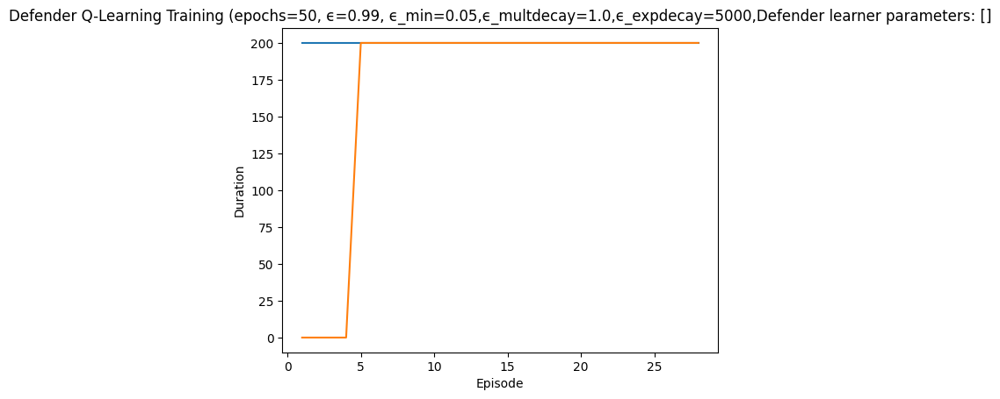

Rendering the current state of the environment
  ## Episode: 29/50 'Defender Q-Learning Training' ϵ=0.3568, Defender learner parameters: []


Episode 29|Iteration 48|reward:  160.0|last_reward_at:   48|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 4, 'parameter': 0}
4 4 0
action type:  Start Service
Iteration 1: Action Taken: Type=Start Service, NodeID=4, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 5601, 'successful_actions': 2114, 'failed_actions': 3487}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 2 7
{'action_type': 4, 'node_id': 2, 'parameter': 7}
[DEBUG] Received action: {'action_type': 4, 'node_id': 2, 'parameter': 7}
4 2 7
action type:  Start Service
Iteration 2: Acti

Episode 29|Iteration 50|reward:  150.0|last_reward_at:   48|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 8, 'parameter': 0}
0 8 0
action type:  Reimage Node
Iteration 50: Action Taken: Type=Reimage Node, NodeID=8, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '7_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 5650, 'successful_actions': 2128, 'failed_actions': 3522}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 29|Iteration 93|reward:  385.0|last_reward_at:   92|Elapsed Time: 0:00:00||

2 7 7
{'action_type': 2, 'node_id': 7, 'parameter': 7}
[DEBUG] Received action: {'action_type': 2, 'node_id': 7, 'parameter': 7}
2 7 7
action type:  Reimage Node
Iteration 51: Action Taken: Type=Reimage Node, NodeID=7, Parameter=7
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '6_WindowsNode', 'port_name': 7, 'performance_metrics': {'actions_taken': 5651, 'successful_actions': 2129, 'failed_actions': 3522}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 3, 'parameter': 0}
3 3 0
action type:  Allow Traffic
Iteration 52: Action Taken: 

Episode 29|Iteration 94|reward:  380.0|last_reward_at:   92|Elapsed Time: 0:00:00||

3 1 0
{'action_type': 3, 'node_id': 1, 'parameter': 0}
[DEBUG] Received action: {'action_type': 3, 'node_id': 1, 'parameter': 0}
3 1 0
action type:  Allow Traffic
Iteration 94: Action Taken: Type=Allow Traffic, NodeID=1, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 5694, 'successful_actions': 2143, 'failed_actions': 3551}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 8, 'parameter': 0}
1 8 0
action type:  Block Traffic
Iteration 95: Action 

Episode 29|Iteration 133|reward:  925.0|last_reward_at:  132|Elapsed Time: 0:00:00||


firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 12, 'parameter': 0}
3 12 0
action type:  Allow Traffic
Iteration 96: Action Taken: Type=Allow Traffic, NodeID=12, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 5696, 'successful_actions': 2144, 'failed_actions': 3552}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix wi

Episode 29|Iteration 133|reward:  925.0|last_reward_at:  133|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 13, 'parameter': 0}
1 13 0
action type: 

Episode 29|Iteration 175|reward: 1165.0|last_reward_at:  174|Elapsed Time: 0:00:00||

 Block Traffic
Iteration 134: Action Taken: Type=Block Traffic, NodeID=13, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '12_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 5734, 'successful_actions': 2169, 'failed_actions': 3565}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 2, 'parameter': 0}
4 2 0
action type:  Start Service
Iteration 135: Action Taken: Type=Start Service, NodeID=2, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_se

Episode 29|Iteration 176|reward: 1160.0|last_reward_at:  174|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 8 8
{'action_type': 1, 'node_id': 8, 'parameter': 8}
[DEBUG] Received action: {'action_type': 1, 'node_id': 8, 'parameter': 8}
1 8 8
action type:  Block Traffic
Iteration 177: Action Taken: Type=Block Traffic, NodeID=8, Parameter=8
info {'action': 'block_traffic', 'status': 'success', 'node_id': '7_LinuxNode', 'port_name': 8, 'performance_metrics': {'actions_taken': 5777, 'successful_actions': 2184, 'failed_actions': 3593}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 29|Iteration 200|reward: 1310.0|last_reward_at:  196|Elapsed Time: 0:00:00||


firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 5, 'parameter': 0}
3 5 0
action type:  Allow Traffic
Iteration 178: Action Taken: Type=Allow Traffic, NodeID=5, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 5778, 'successful_actions': 2184, 'failed_actions': 3594}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based o

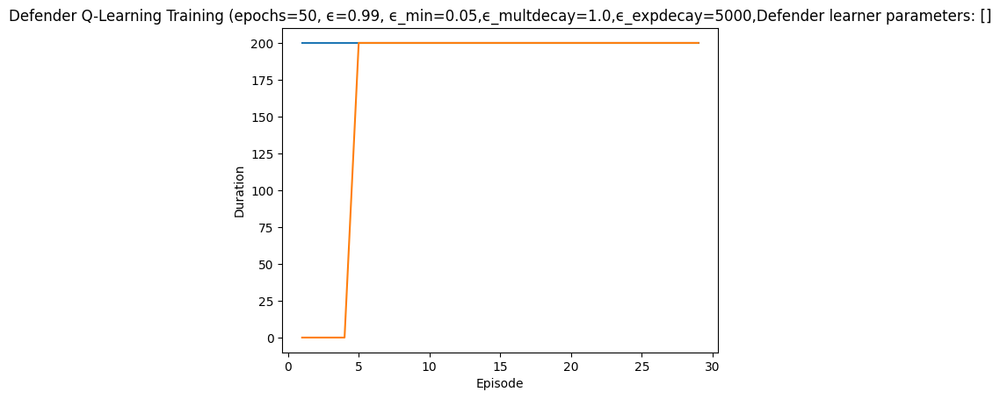

Rendering the current state of the environment
  ## Episode: 30/50 'Defender Q-Learning Training' ϵ=0.3447, Defender learner parameters: []


Episode 30|Iteration 48|reward:  330.0|last_reward_at:   47|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 11, 'parameter': 0}
3 11 0
action type:  Allow Traffic
Iteration 1: Action Taken: Type=Allow Traffic, NodeID=11, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 5801, 'successful_actions': 2192, 'failed_actions': 3609}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based 

Episode 30|Iteration 51|reward:  345.0|last_reward_at:   51|Elapsed Time: 0:00:00||

Reimage Node
Iteration 49: Action Taken: Type=Reimage Node, NodeID=10, Parameter=2
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '9_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 5849, 'successful_actions': 2211, 'failed_actions': 3638}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 13, 'parameter': 0}
0 13 0
action type:  Reimage Node
Iteration 50: Action Taken: Type=Reimage Node, NodeID=13, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_

Episode 30|Iteration 103|reward:  635.0|last_reward_at:  103|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 2, 'parameter': 0}
2 2 0
action type:  Reimage Node
Iteration 52: Action Taken: Type=Reimage Node, NodeID=2, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '1_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 5852, 'successful_actions': 2213, 'failed_actions': 3639}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the curr

Episode 30|Iteration 105|reward:  685.0|last_reward_at:  105|Elapsed Time: 0:00:00||

 9 0
action type:  Reimage Node
Iteration 104: Action Taken: Type=Reimage Node, NodeID=9, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '8_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 5904, 'successful_actions': 2232, 'failed_actions': 3672}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 2 2
{'action_type': 2, 'node_id': 2, 'parameter': 2}
[DEBUG] Received action: {'action_type': 2, 'node_id': 2, 'parameter': 2}
2 2 2
action type:  Reimage Node
Iteration 105: Action Taken: Type=Reimage Node, NodeID=2, Parameter=2
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '1_LinuxNode', 'port_name': 2, 'performance_metrics': {'actions_taken': 5905, 'successful_actions': 2233, 'failed_actions': 3672}, 'network_availability': 1.0}
firewall_ac

Episode 30|Iteration 168|reward: 1070.0|last_reward_at:  167|Elapsed Time: 0:00:00||

[DEBUG] Received action: {'action_type': 0, 'node_id': 7, 'parameter': 3}
0 7 3
action type:  Reimage Node
Iteration 106: Action Taken: Type=Reimage Node, NodeID=7, Parameter=3
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '6_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 5906, 'successful_actions': 2233, 'failed_actions': 3673}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 4 6
{'action_type': 0, 'node_id': 4, 'parameter': 6}
[DEBUG] Received action: {'action_type': 0, 'node_id': 4, 'parameter': 6}
0 4 6
action type:  Reimage Node
Iteration 107: Action Taken: Type=Reimage Node, NodeID=4, Parameter=6
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '3_LinuxNode', 'reason': 'Reimaging not required 

Episode 30|Iteration 170|reward: 1090.0|last_reward_at:  170|Elapsed Time: 0:00:00||

0 12 1
{'action_type': 0, 'node_id': 12, 'parameter': 1}
[DEBUG] Received action: {'action_type': 0, 'node_id': 12, 'parameter': 1}
0 12 1
action type:  Reimage Node
Iteration 169: Action Taken: Type=Reimage Node, NodeID=12, Parameter=1
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '11_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 5969, 'successful_actions': 2257, 'failed_actions': 3712}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 3, 'parameter': 0}
1 3 0
action 

Episode 30|Iteration 200|reward: 1280.0|last_reward_at:  199|Elapsed Time: 0:00:00||



2 6 4
{'action_type': 2, 'node_id': 6, 'parameter': 4}
[DEBUG] Received action: {'action_type': 2, 'node_id': 6, 'parameter': 4}
2 6 4
action type:  Reimage Node
Iteration 172: Action Taken: Type=Reimage Node, NodeID=6, Parameter=4
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '5_LinuxNode', 'port_name': 4, 'performance_metrics': {'actions_taken': 5972, 'successful_actions': 2259, 'failed_actions': 3713}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 12 9
{'action_type': 0, 'node_id': 12, 'parameter': 9}
[DEBUG] Received action: {'action_type': 0, 'node_id': 12, 'parameter': 9}
0 12 9
action type:  Reimage Node
Iteration 173: Action Taken: Type=Reimage Node, NodeID=12, Parameter=9
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '11_LinuxNode', 'reason': 'Reimagi

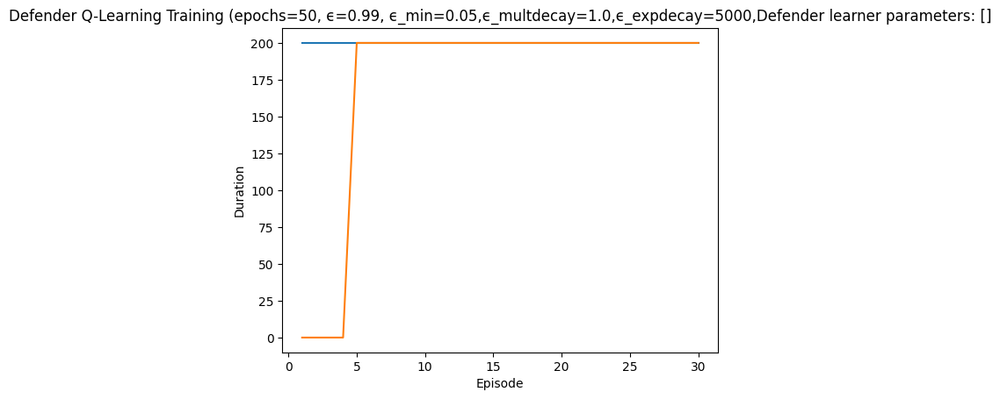

Rendering the current state of the environment
  ## Episode: 31/50 'Defender Q-Learning Training' ϵ=0.3332, Defender learner parameters: []


Episode 31|Iteration 9|reward:    5.0|last_reward_at:    7|Elapsed Time: 0:00:00||

0 0 9
{'action_type': 0, 'node_id': 0, 'parameter': 9}
[DEBUG] Received action: {'action_type': 0, 'node_id': 0, 'parameter': 9}
0 0 9
action type:  Reimage Node
Iteration 1: Action Taken: Type=Reimage Node, NodeID=0, Parameter=9
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': 'start', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 6001, 'successful_actions': 2270, 'failed_actions': 3731}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 3 0
{'action_type': 2, 'node_id': 3, 'parameter': 0}
[DEBUG] Received action: {'action_type': 2, 'node_id': 3, 'parameter': 0}
2 3 0
action type:  Reimage Node
Iteration 2: Action Taken: Type=Reimage Node, NodeID=3, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '2_Window

Episode 31|Iteration 76|reward:  510.0|last_reward_at:   73|Elapsed Time: 0:00:00||

Iteration 10: Action Taken: Type=Block Traffic, NodeID=5, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '4_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 6010, 'successful_actions': 2273, 'failed_actions': 3737}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 8 0
{'action_type': 0, 'node_id': 8, 'parameter': 0}
[DEBUG] Received action: {'action_type': 0, 'node_id': 8, 'parameter': 0}
0 8 0
action type:  Reimage Node
Iteration 11: Action Taken: Type=Reimage Node, NodeID=8, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '7_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 6011, 'successful_actions': 2273, 'failed_actions': 3738}, 'network_availability': 1.0}


Episode 31|Iteration 77|reward:  505.0|last_reward_at:   76|Elapsed Time: 0:00:00||

4 11 1
{'action_type': 4, 'node_id': 11, 'parameter': 1}
[DEBUG] Received action: {'action_type': 4, 'node_id': 11, 'parameter': 1}
4 11 1
action type:  Start Service
Iteration 77: Action Taken: Type=Start Service, NodeID=11, Parameter=1
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 6077, 'successful_actions': 2300, 'failed_actions': 3777}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 31|Iteration 87|reward:  575.0|last_reward_at:   85|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 9, 'parameter': 0}
1 9 0
action type:  Block Traffic
Iteration 78: Action Taken: Type=Block Traffic, NodeID=9, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '8_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 6078, 'successful_actions': 2301, 'failed_actions': 3777}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the 

Episode 31|Iteration 149|reward:  975.0|last_reward_at:  149|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 11, 'parameter': 0}
1 11 0
action type:  Block Traffic
Iteration 88: Action Taken: Type=Block Traffic, NodeID=11, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '10_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 6088, 'successful_actions': 2305, 'failed_actions': 3783}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on 

Episode 31|Iteration 151|reward:  955.0|last_reward_at:  149|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 0, 'parameter': 0}
1 0 0
action type:  Block Traffic
Iteration 151: Action Taken: Type=Block Traffic, NodeID=0, Parameter=0
info {'action': 'block_traffic', 'status': 'failed', 'node_id': 'start', 'port_name': 0, 'reason': 'Machine not running', 'performance_metrics': {'actions_taken': 6151, 'successful_actions': 2328, 'failed_actions': 3823}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 7 9
{'action_type': 4, 'node_id': 7, 'parameter': 9}
[DEBUG] Received action: {'action_type': 4, 'node_id': 7, 'parameter': 9}
4 7 9
action type:  Start Service


Episode 31|Iteration 159|reward:  945.0|last_reward_at:  154|Elapsed Time: 0:00:00||

Iteration 152: Action Taken: Type=Start Service, NodeID=7, Parameter=9
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 6152, 'successful_actions': 2328, 'failed_actions': 3824}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 8, 'parameter': 0}
0 8 0
action type:  Reimage Node
Iteration 153: Action Taken: Type=Reimage Node, NodeID=8, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '7_LinuxNode', 'reason': 'Reimaging not r

Episode 31|Iteration 200|reward: 1190.0|last_reward_at:  200|Elapsed Time: 0:00:00||


firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 0, 'parameter': 0}
3 0 0
action type:  Allow Traffic
Iteration 161: Action Taken: Type=Allow Traffic, NodeID=0, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 6161, 'successful_actions': 2329, 'failed_actions': 3832}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based o

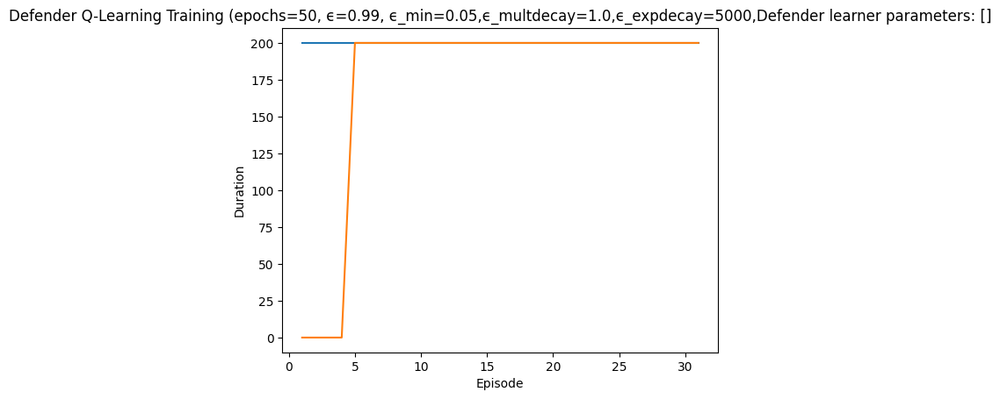

Rendering the current state of the environment
  ## Episode: 32/50 'Defender Q-Learning Training' ϵ=0.3221, Defender learner parameters: []


Episode 32|Iteration 3|reward:   15.0|last_reward_at:    3|Elapsed Time: 0:00:00||

4 2 9
{'action_type': 4, 'node_id': 2, 'parameter': 9}
[DEBUG] Received action: {'action_type': 4, 'node_id': 2, 'parameter': 9}
4 2 9
action type:  Start Service
Iteration 1: Action Taken: Type=Start Service, NodeID=2, Parameter=9
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 6201, 'successful_actions': 2344, 'failed_actions': 3857}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 11, 'parameter': 0}
0 11 0
action type:  Reimage Node
Iteration 2: Act

Episode 32|Iteration 48|reward:  440.0|last_reward_at:   48|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 9, 'parameter': 0}
2 9 0
action type:  Reimage Node
Iteration 5: Action Taken: Type=Reimage Node, NodeID=9, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '8_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 6205, 'successful_actions': 2346, 'failed_actions': 3859}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140

Episode 32|Iteration 49|reward:  435.0|last_reward_at:   48|Elapsed Time: 0:00:00||

 Allow Traffic
Iteration 49: Action Taken: Type=Allow Traffic, NodeID=2, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 6249, 'successful_actions': 2367, 'failed_actions': 3882}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140

Episode 32|Iteration 51|reward:  425.0|last_reward_at:   48|Elapsed Time: 0:00:00||


No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 8, 'parameter': 0}
4 8 0
action type:  Start Service
Iteration 50: Action Taken: Type=Start Service, NodeID=8, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 6250, 'successful_actions': 2367, 'failed_actions': 3883}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 7, 'parameter': 0}
3 7

Episode 32|Iteration 93|reward:  625.0|last_reward_at:   90|Elapsed Time: 0:00:00||

 1 0
{'action_type': 0, 'node_id': 1, 'parameter': 0}
[DEBUG] Received action: {'action_type': 0, 'node_id': 1, 'parameter': 0}
0 1 0
action type:  Reimage Node
Iteration 52: Action Taken: Type=Reimage Node, NodeID=1, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '13_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 6252, 'successful_actions': 2367, 'failed_actions': 3885}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 7 6
{'action_type': 4, 'node_id': 7, 'parameter': 6}
[DEBUG] Received action: {'action_type': 4, 'node_id': 7, 'parameter': 6}
4 7 6
action type:  Start Service
Iteration 53: Action Taken: Type=Start Service, NodeID=7, Parameter=6
info {'status': 'unnecessary', 'reason': 'Service already runnin

Episode 32|Iteration 94|reward:  620.0|last_reward_at:   90|Elapsed Time: 0:00:00||

Iteration 94: Action Taken: Type=Reimage Node, NodeID=11, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '10_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 6294, 'successful_actions': 2381, 'failed_actions': 3913}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 7, 'parameter': 0}
4 7 0
action type:  Start Service
Iteration 95: Action Taken: Type=Start Service, NodeID=7, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not f

Episode 32|Iteration 96|reward:  610.0|last_reward_at:   90|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 4, 'parameter': 0}
4 4 0
action type:  Start Service
Iteration 96: Action Taken: Type=Start Service, NodeID=4, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 6296, 'successful_actions': 2381, 'failed_actions': 3915}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.

Episode 32|Iteration 137|reward:  825.0|last_reward_at:  129|Elapsed Time: 0:00:00||

 Block Traffic
Iteration 97: Action Taken: Type=Block Traffic, NodeID=6, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '5_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 6297, 'successful_actions': 2382, 'failed_actions': 3915}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 1 1
{'action_type': 0, 'node_id': 1, 'parameter': 1}
[DEBUG] Received action: {'action_type': 0, 'node_id': 1, 'parameter': 1}
0 1 1
action type:  Reimage Node
Iteration 98: Action Taken: Type=Reimage Node, NodeID=1, Parameter=1
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '13_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 6298, 'successful_actions': 2382, 'failed_actions': 3916}, 'network_availa

Episode 32|Iteration 138|reward:  850.0|last_reward_at:  138|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 7, 'parameter': 0}
1 7 0
action type:  Block Traffic
Iteration 138: Action Taken: Type=Block Traffic, NodeID=7, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '6_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 6338, 'successful_actions': 2396, 'failed_actions': 3942}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 32|Iteration 141|reward:  895.0|last_reward_at:  140|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 11, 'parameter': 0}
3 11 0
action type:  Allow Traffic
Iteration 139: Action Taken: Type=Allow Traffic, NodeID=11, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 6339, 'successful_actions': 2396, 'failed_actions': 3943}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action base

Episode 32|Iteration 176|reward: 1100.0|last_reward_at:  175|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 1, 'parameter': 0}
3 1 0
action type:  Allow Traffic
Iteration 142: Action Taken: Type=Allow Traffic, NodeID=1, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 6342, 'successful_actions': 2398, 'failed_actions': 3944}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 4 1
{'action_type': 2, 'node_id': 4, 'parameter': 1}
[DEBUG] Received action: {'action_type': 2, 'node_id': 4, 'parameter': 1}
2 4 1
action type:  Reimage Node
Iteration 143: Action

Episode 32|Iteration 177|reward: 1085.0|last_reward_at:  175|Elapsed Time: 0:00:00||

Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 0, 'parameter': 0}
2 0 0
action type:  Reimage Node
Iteration 177: Action Taken: Type=Reimage Node, NodeID=0, Parameter=0
info {'action': 'allow_traffic', 'status': 'failed', 'node_id': 'start', 'port_name': 0, 'reason': 'Machine not running', 'performance_metrics': {'actions_taken': 6377, 'successful_actions': 2411, 'failed_actions': 3966}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 5, 'parameter': 0}
2 5 0
action type:  Reimage Node
Iteration 178: A

Episode 32|Iteration 178|reward: 1110.0|last_reward_at:  178|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 2 1
{'action_type': 2, 'node_id': 2, 'parameter': 1}
[DEBUG] Received action: {'action_type': 2, 'node_id': 2, 'parameter': 1}
2 2 1
action type: 

Episode 32|Iteration 200|reward: 1270.0|last_reward_at:  196|Elapsed Time: 0:00:00||


 Reimage Node
Iteration 179: Action Taken: Type=Reimage Node, NodeID=2, Parameter=1
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '1_LinuxNode', 'port_name': 1, 'performance_metrics': {'actions_taken': 6379, 'successful_actions': 2413, 'failed_actions': 3966}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 2 4
{'action_type': 4, 'node_id': 2, 'parameter': 4}
[DEBUG] Received action: {'action_type': 4, 'node_id': 2, 'parameter': 4}
4 2 4
action type:  Start Service
Iteration 180: Action Taken: Type=Start Service, NodeID=2, Parameter=4
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 6380, 'successful_actions': 2413, 'failed_actions': 3967}, 'network_availability': 1.0}
firewall_active: 

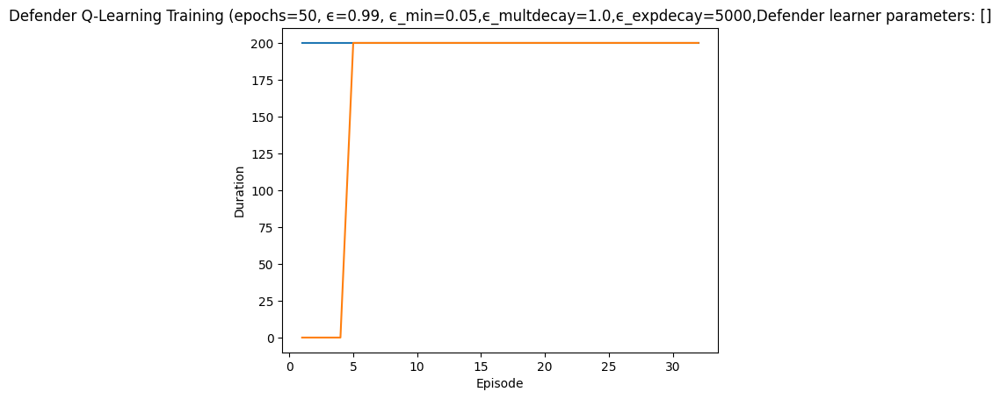

Rendering the current state of the environment
  ## Episode: 33/50 'Defender Q-Learning Training' ϵ=0.3114, Defender learner parameters: []


Episode 33|Iteration 51|reward:  315.0|last_reward_at:   51|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 10, 'parameter': 0}
0 10 0
action type:  Reimage Node
Iteration 1: Action Taken: Type=Reimage Node, NodeID=10, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '9_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 6401, 'successful_actions': 2421, 'failed_actions': 3980}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preven

Episode 33|Iteration 53|reward:  335.0|last_reward_at:   52|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 7, 'parameter': 0}
3 7 0
action type:  Allow Traffic
Iteration 53: Action Taken: Type=Allow Traffic, NodeID=7, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 6453, 'successful_actions': 2441, 'failed_actions': 4012}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 33|Iteration 105|reward:  715.0|last_reward_at:   95|Elapsed Time: 0:00:00||

2 4 4
{'action_type': 2, 'node_id': 4, 'parameter': 4}
[DEBUG] Received action: {'action_type': 2, 'node_id': 4, 'parameter': 4}
2 4 4
action type:  Reimage Node
Iteration 54: Action Taken: Type=Reimage Node, NodeID=4, Parameter=4
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '3_LinuxNode', 'port_name': 4, 'performance_metrics': {'actions_taken': 6454, 'successful_actions': 2442, 'failed_actions': 4012}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 3, 'parameter': 0}
3 3 0
action type:  Allow Traffic
Iteration 55: Action Taken: Ty

Episode 33|Iteration 106|reward:  710.0|last_reward_at:   95|Elapsed Time: 0:00:00||

 Reimage Node
Iteration 106: Action Taken: Type=Reimage Node, NodeID=0, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': 'start', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 6506, 'successful_actions': 2463, 'failed_actions': 4043}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 33|Iteration 144|reward: 1090.0|last_reward_at:  143|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 11, 'parameter': 0}
0 11 0
action type:  Reimage Node
Iteration 107: Action Taken: Type=Reimage Node, NodeID=11, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '10_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 6507, 'successful_actions': 2463, 'failed_actions': 4044}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a p

Episode 33|Iteration 144|reward: 1090.0|last_reward_at:  144|Elapsed Time: 0:00:00||

0 12 3
{'action_type': 0, 'node_id': 12, 'parameter': 3}
[DEBUG] Received action: {'action_type': 0, 'node_id': 12, 'parameter': 3}
0 12 3
action type:  Reimage Node
Iteration 145: Action Taken: Type=Reimage Node, NodeID=12, Parameter=3
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '11_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 6545, 'successful_actions': 2482, 'failed_actions': 4063}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140


Episode 33|Iteration 184|reward: 1370.0|last_reward_at:  183|Elapsed Time: 0:00:00||

Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 2 9
{'action_type': 4, 'node_id': 2, 'parameter': 9}
[DEBUG] Received action: {'action_type': 4, 'node_id': 2, 'parameter': 9}
4 2 9
action type:  Start Service
Iteration 146: Action Taken: Type=Start Service, NodeID=2, Parameter=9
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 6546, 'successful_actions': 2482, 'failed_actions': 4064}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received actio

Episode 33|Iteration 200|reward: 1500.0|last_reward_at:  200|Elapsed Time: 0:00:00||



No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 9, 'parameter': 0}
4 9 0
action type:  Start Service
Iteration 185: Action Taken: Type=Start Service, NodeID=9, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 6585, 'successful_actions': 2498, 'failed_actions': 4087}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 10 0
{'action_type': 1, 'node_id': 10, 'parameter': 0}
[DEBUG] Received action: {'action_type': 1, 'node_id': 10, 'parameter': 0}
1 10 0
action type:  Block Traffic
Iteration 186: Action Taken: Type=Block Traffic, NodeID=10, Parameter=0
info {'action': 'block_traffic', 'status

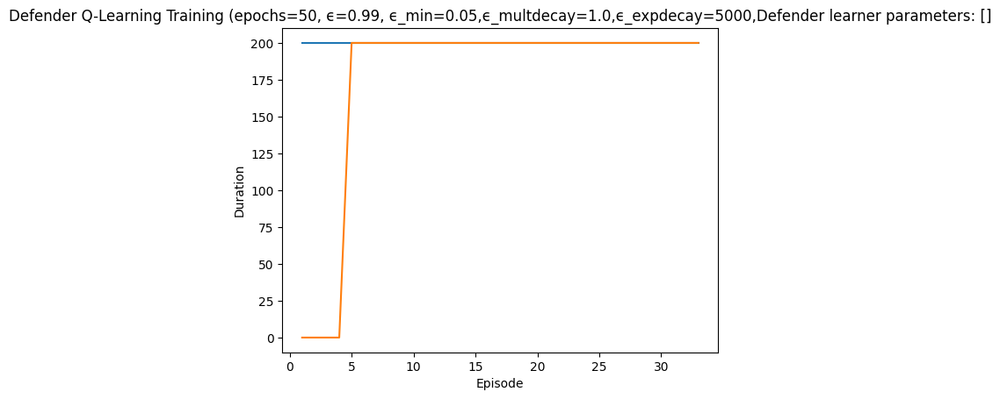

Rendering the current state of the environment
  ## Episode: 34/50 'Defender Q-Learning Training' ϵ=0.3012, Defender learner parameters: []


Episode 34|Iteration 14|reward:  200.0|last_reward_at:   13|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 7, 'parameter': 0}
3 7 0
action type:  Allow Traffic
Iteration 1: Action Taken: Type=Allow Traffic, NodeID=7, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 6601, 'successful_actions': 2505, 'failed_actions': 4096}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on 

Episode 34|Iteration 47|reward:  405.0|last_reward_at:   46|Elapsed Time: 0:00:00||

4 13 7
{'action_type': 4, 'node_id': 13, 'parameter': 7}
[DEBUG] Received action: {'action_type': 4, 'node_id': 13, 'parameter': 7}
4 13 7
action type:  Start Service
Iteration 15: Action Taken: Type=Start Service, NodeID=13, Parameter=7
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 6615, 'successful_actions': 2514, 'failed_actions': 4101}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 0, 'parameter': 0}
2 0 0
action type:  Reimage Node
Iteration 16

Episode 34|Iteration 48|reward:  400.0|last_reward_at:   47|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 11, 'parameter': 0}
0 11 0
action type:  Reimage Node
Iteration 48: Action Taken: Type=Reimage Node, NodeID=11, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '10_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 6648, 'successful_actions': 2527, 'failed_actions': 4121}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140

Episode 34|Iteration 53|reward:  405.0|last_reward_at:   50|Elapsed Time: 0:00:00||


No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 6, 'parameter': 0}
4 6 0
action type:  Start Service
Iteration 49: Action Taken: Type=Start Service, NodeID=6, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 6649, 'successful_actions': 2527, 'failed_actions': 4122}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 6, 'parameter': 0}
1 6

Episode 34|Iteration 89|reward:  705.0|last_reward_at:   89|Elapsed Time: 0:00:00||

 Reimage Node
Iteration 54: Action Taken: Type=Reimage Node, NodeID=10, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '9_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 6654, 'successful_actions': 2528, 'failed_actions': 4126}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 8, 'parameter': 0}
3 8 0
action type:  Allow Traffic
Iteration 55: Action Taken: Type=Allow Traffic, NodeID=8, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running o

Episode 34|Iteration 91|reward:  695.0|last_reward_at:   89|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 10, 'parameter': 0}
3 10 0
action type:  Allow Traffic
Iteration 91: Action Taken: Type=Allow Traffic, NodeID=10, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 6691, 'successful_actions': 2545, 'failed_actions': 4146}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 34|Iteration 95|reward:  705.0|last_reward_at:   94|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 13, 'parameter': 0}
0 13 0
action type:  Reimage Node
Iteration 92: Action Taken: Type=Reimage Node, NodeID=13, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '12_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 6692, 'successful_actions': 2545, 'failed_actions': 4147}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 10 1
{'action_type': 0, 'node_id': 10, 'parameter': 1}
[DEBUG] Received action: {'action_type': 0, 'node_id': 10, 'parameter': 1}
0 10 1
acti

Episode 34|Iteration 131|reward:  955.0|last_reward_at:  130|Elapsed Time: 0:00:00||

Reimage Node
Iteration 96: Action Taken: Type=Reimage Node, NodeID=5, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '4_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 6696, 'successful_actions': 2546, 'failed_actions': 4150}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 2, 'parameter': 0}
1 2 0
action type:  Block Traffic
Iteration 97: Action Taken: Type=Block Traffic, NodeID=2, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id'

Episode 34|Iteration 132|reward:  950.0|last_reward_at:  130|Elapsed Time: 0:00:00||

3 10 3
{'action_type': 3, 'node_id': 10, 'parameter': 3}
[DEBUG] Received action: {'action_type': 3, 'node_id': 10, 'parameter': 3}
3 10 3
action type:  Allow Traffic
Iteration 132: Action Taken: Type=Allow Traffic, NodeID=10, Parameter=3
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 6732, 'successful_actions': 2561, 'failed_actions': 4171}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 10 5
{'action_type': 2, 'node_id': 10, 'parameter': 5}
[DEBUG] Received action: {'action_type': 2, 'node_id': 10, 'parameter': 5}


Episode 34|Iteration 141|reward:  995.0|last_reward_at:  138|Elapsed Time: 0:00:00||

2 10 5
action type:  Reimage Node
Iteration 133: Action Taken: Type=Reimage Node, NodeID=10, Parameter=5
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '9_LinuxNode', 'port_name': 5, 'performance_metrics': {'actions_taken': 6733, 'successful_actions': 2562, 'failed_actions': 4171}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 11 4
{'action_type': 0, 'node_id': 11, 'parameter': 4}
[DEBUG] Received action: {'action_type': 0, 'node_id': 11, 'parameter': 4}
0 11 4
action type:  Reimage Node
Iteration 134: Action Taken: Type=Reimage Node, NodeID=11, Parameter=4
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '10_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 6734, 'successful_actions': 2562, 'failed_acti

Episode 34|Iteration 200|reward: 1510.0|last_reward_at:  200|Elapsed Time: 0:00:00||


firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 10, 'parameter': 0}
0 10 0
action type:  Reimage Node
Iteration 142: Action Taken: Type=Reimage Node, NodeID=10, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '9_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 6742, 'successful_actions': 2564, 'failed_actions': 4178}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a prev

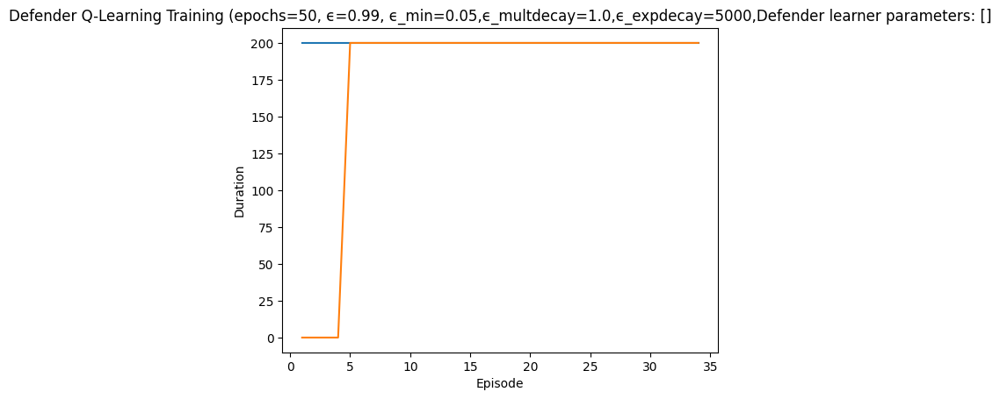

Rendering the current state of the environment
  ## Episode: 35/50 'Defender Q-Learning Training' ϵ=0.2913, Defender learner parameters: []


Episode 35|Iteration 25|reward:  145.0|last_reward_at:   25|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 0, 'parameter': 0}
3 0 0
action type:  Allow Traffic
Iteration 1: Action Taken: Type=Allow Traffic, NodeID=0, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 6801, 'successful_actions': 2591, 'failed_actions': 4210}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on 

Episode 35|Iteration 48|reward:  440.0|last_reward_at:   48|Elapsed Time: 0:00:00||

1 7 2
{'action_type': 1, 'node_id': 7, 'parameter': 2}
[DEBUG] Received action: {'action_type': 1, 'node_id': 7, 'parameter': 2}
1 7 2
action type:  Block Traffic
Iteration 26: Action Taken: Type=Block Traffic, NodeID=7, Parameter=2
info {'action': 'block_traffic', 'status': 'success', 'node_id': '6_WindowsNode', 'port_name': 2, 'performance_metrics': {'actions_taken': 6826, 'successful_actions': 2601, 'failed_actions': 4225}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 7, 'parameter': 0}
1 7 0
action type:  Block Traffic
Iteration 27: Action Taken

Episode 35|Iteration 49|reward:  435.0|last_reward_at:   48|Elapsed Time: 0:00:00||


[DEBUG] Received action: {'action_type': 3, 'node_id': 11, 'parameter': 0}
3 11 0
action type:  Allow Traffic
Iteration 49: Action Taken: Type=Allow Traffic, NodeID=11, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 6849, 'successful_actions': 2614, 'failed_actions': 4235}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4

Episode 35|Iteration 64|reward:  480.0|last_reward_at:   64|Elapsed Time: 0:00:00||

 13 0
{'action_type': 4, 'node_id': 13, 'parameter': 0}
[DEBUG] Received action: {'action_type': 4, 'node_id': 13, 'parameter': 0}
4 13 0
action type:  Start Service
Iteration 50: Action Taken: Type=Start Service, NodeID=13, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 6850, 'successful_actions': 2614, 'failed_actions': 4236}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
3 5 4
{'action_type': 3, 'node_id': 5, 'parameter': 4}
[DEBUG] Received action: {'action_type': 3, 'node_id': 5, 'parameter': 4}
3 5 4
action type:  Allow Traffic
Iteration 51: Action Taken: Type=Allow Traffic, NodeID=5, Parameter=4
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'st

Episode 35|Iteration 105|reward:  525.0|last_reward_at:  102|Elapsed Time: 0:00:00||

 Block Traffic
Iteration 65: Action Taken: Type=Block Traffic, NodeID=2, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '1_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 6865, 'successful_actions': 2619, 'failed_actions': 4246}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 13, 'parameter': 0}
3 13 0
action type:  Allow Traffic
Iteration 66: Action Taken: Type=Allow Traffic, NodeID=13, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 

Episode 35|Iteration 106|reward:  520.0|last_reward_at:  102|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 4, 'parameter': 0}
0 4 0
action type:  Reimage Node
Iteration 106: Action Taken: Type=Reimage Node, NodeID=4, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '3_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 6906, 'successful_actions': 2628, 'failed_actions': 4278}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 35|Iteration 118|reward:  540.0|last_reward_at:  111|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 7, 'parameter': 0}
2 7 0
action type:  Reimage Node
Iteration 107: Action Taken: Type=Reimage Node, NodeID=7, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '6_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 6907, 'successful_actions': 2629, 'failed_actions': 4278}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the c

Episode 35|Iteration 158|reward:  850.0|last_reward_at:  152|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 2 8
{'action_type': 0, 'node_id': 2, 'parameter': 8}
[DEBUG] Received action: {'action_type': 0, 'node_id': 2, 'parameter': 8}
0 2 8
action type:  Reimage Node
Iteration 120: Action Taken: Type=Reimage Node, NodeID=2, Parameter=8
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '1_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 6920, 'successful_actions': 2632, 'failed_actions': 4288}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the curre

Episode 35|Iteration 158|reward:  850.0|last_reward_at:  158|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 2, 'parameter': 0}


Episode 35|Iteration 173|reward:  865.0|last_reward_at:  167|Elapsed Time: 0:00:00||

4 2 0
action type:  Start Service
Iteration 159: Action Taken: Type=Start Service, NodeID=2, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 6959, 'successful_actions': 2648, 'failed_actions': 4311}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 4 5
{'action_type': 1, 'node_id': 4, 'parameter': 5}
[DEBUG] Received action: {'action_type': 1, 'node_id': 4, 'parameter': 5}
1 4 5
action type:  Block Traffic
Iteration 160: Action Taken: Type=Block Traffic, NodeID=4, Parameter=5
info {'action': 'block_traffic', 'status': 'success', 'node_id': '3_LinuxNode', 'port_name': 5, 'performance_metrics': {'actions_taken': 6960, 'successful_actions': 2649, 'failed_actions': 4311}, 'network_availability': 1

Episode 35|Iteration 200|reward:  970.0|last_reward_at:  196|Elapsed Time: 0:00:00||


0 9 2
{'action_type': 0, 'node_id': 9, 'parameter': 2}
[DEBUG] Received action: {'action_type': 0, 'node_id': 9, 'parameter': 2}
0 9 2
action type:  Reimage Node
Iteration 174: Action Taken: Type=Reimage Node, NodeID=9, Parameter=2
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '8_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 6974, 'successful_actions': 2651, 'failed_actions': 4323}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
3 10 4
{'action_type': 3, 'node_id': 10, 'parameter': 4}
[DEBUG] Received action: {'action_type': 3, 'node_id': 10, 'parameter': 4}
3 10 4
action type:  Allow Traffic
Iteration 175: Action Taken: Type=Allow Traffic, NodeID=10, Parameter=4
info {'status': 'unnecessary', 'reason': 'Service not r

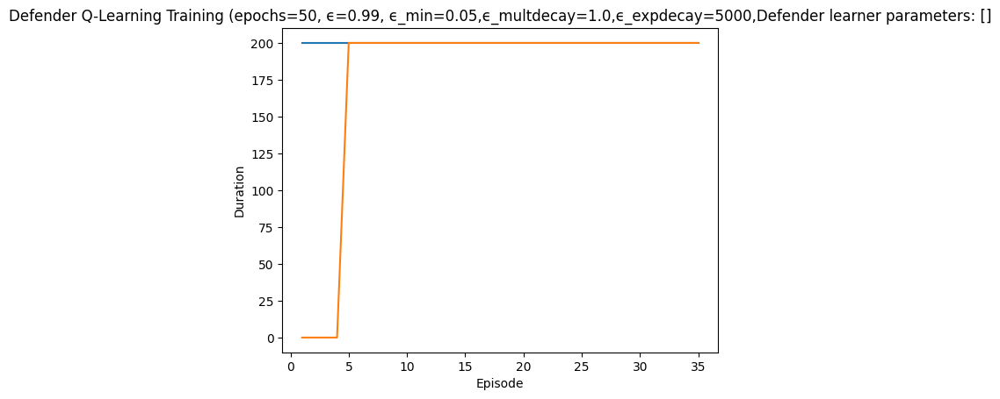

Rendering the current state of the environment
  ## Episode: 36/50 'Defender Q-Learning Training' ϵ=0.2818, Defender learner parameters: []


Episode 36|Iteration 17|reward:   85.0|last_reward_at:   15|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 9, 'parameter': 0}
3 9 0
action type:  Allow Traffic
Iteration 1: Action Taken: Type=Allow Traffic, NodeID=9, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 7001, 'successful_actions': 2659, 'failed_actions': 4342}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on 

Episode 36|Iteration 68|reward:  310.0|last_reward_at:   63|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 2, 'parameter': 0}
3 2 0
action type:  Allow Traffic
Iteration 19: Action Taken: Type=Allow Traffic, NodeID=2, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 7019, 'successful_actions': 2666, 'failed_actions': 4353}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 9 9
{'action_type': 0, 'node_id': 9, 'parameter': 9}
[DEBUG] Received action: {'action_type': 0, 'node_id': 9, 'parameter': 9}
0 9 9
action type:  Reimage Node
Iteration 20: Action T

Episode 36|Iteration 70|reward:  330.0|last_reward_at:   63|Elapsed Time: 0:00:00||

1 9 1
{'action_type': 1, 'node_id': 9, 'parameter': 1}
[DEBUG] Received action: {'action_type': 1, 'node_id': 9, 'parameter': 1}
1 9 1
action type:  Block Traffic
Iteration 70: Action Taken: Type=Block Traffic, NodeID=9, Parameter=1
info {'action': 'block_traffic', 'status': 'success', 'node_id': '8_WindowsNode', 'port_name': 1, 'performance_metrics': {'actions_taken': 7070, 'successful_actions': 2683, 'failed_actions': 4387}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 36|Iteration 83|reward:  415.0|last_reward_at:   79|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 8, 'parameter': 0}
2 8 0
action type:  Reimage Node
Iteration 71: Action Taken: Type=Reimage Node, NodeID=8, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '7_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 7071, 'successful_actions': 2684, 'failed_actions': 4387}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the curr

Episode 36|Iteration 121|reward:  545.0|last_reward_at:  118|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 9, 'parameter': 0}
2 9 0
action type:  Reimage Node
Iteration 84: Action Taken: Type=Reimage Node, NodeID=9, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '8_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 7084, 'successful_actions': 2689, 'failed_actions': 4395}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 7 8
{'action_type': 4, 'node_id': 7, 'parameter': 8}
[DEBUG] Received action: {'action_type': 4, 'node_id': 7, 'parameter': 8}
4 7 8
action type:  Start Service
Iteration 85: Action Taken: 

Episode 36|Iteration 122|reward:  540.0|last_reward_at:  118|Elapsed Time: 0:00:00||

 6 0
action type:  Allow Traffic
Iteration 122: Action Taken: Type=Allow Traffic, NodeID=6, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 7122, 'successful_actions': 2699, 'failed_actions': 4423}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 3 5
{'action_type': 2, 'node_id': 3, 'parameter': 5}
[DEBUG] Received action: {'action_type': 2, 'node_id': 3, 'parameter': 5}
2

Episode 36|Iteration 132|reward:  670.0|last_reward_at:  132|Elapsed Time: 0:00:00||

 3 5
action type:  Reimage Node
Iteration 123: Action Taken: Type=Reimage Node, NodeID=3, Parameter=5
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '2_WindowsNode', 'port_name': 5, 'performance_metrics': {'actions_taken': 7123, 'successful_actions': 2700, 'failed_actions': 4423}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 2 0
{'action_type': 4, 'node_id': 2, 'parameter': 0}
[DEBUG] Received action: {'action_type': 4, 'node_id': 2, 'parameter': 0}
4 2 0
action type:  Start Service
Iteration 124: Action Taken: Type=Start Service, NodeID=2, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 7124, 'successful_actions': 2700, 'failed_actions': 4424}, 'network_availability': 1.

Episode 36|Iteration 165|reward:  985.0|last_reward_at:  161|Elapsed Time: 0:00:00||

4 9 3
{'action_type': 4, 'node_id': 9, 'parameter': 3}
[DEBUG] Received action: {'action_type': 4, 'node_id': 9, 'parameter': 3}
4 9 3
action type:  Start Service
Iteration 133: Action Taken: Type=Start Service, NodeID=9, Parameter=3
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 7133, 'successful_actions': 2705, 'failed_actions': 4428}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 4, 'parameter': 0}
3 4 0
action type:  Allow Traffic
Iteration 134: 

Episode 36|Iteration 177|reward: 1105.0|last_reward_at:  176|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 9, 'parameter': 0}
3 9 0
action type:  Allow Traffic
Iteration 167: Action Taken: Type=Allow Traffic, NodeID=9, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 7167, 'successful_actions': 2722, 'failed_actions': 4445}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based o

Episode 36|Iteration 200|reward: 1140.0|last_reward_at:  198|Elapsed Time: 0:00:00||



Iteration 178: Action Taken: Type=Reimage Node, NodeID=1, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '13_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 7178, 'successful_actions': 2727, 'failed_actions': 4451}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 6, 'parameter': 0}
4 6 0
action type:  Start Service
Iteration 179: Action Taken: Type=Start Service, NodeID=6, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not f

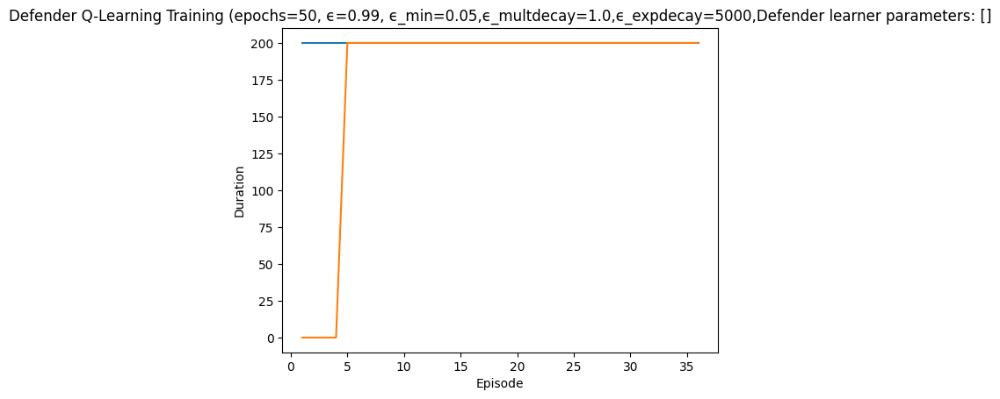

Rendering the current state of the environment
  ## Episode: 37/50 'Defender Q-Learning Training' ϵ=0.2728, Defender learner parameters: []


Episode 37|Iteration 24|reward:  200.0|last_reward_at:   24|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 3, 'parameter': 0}
2 3 0
action type:  Reimage Node
Iteration 1: Action Taken: Type=Reimage Node, NodeID=3, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '2_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 7201, 'successful_actions': 2733, 'failed_actions': 4468}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the cur

Episode 37|Iteration 51|reward:  115.0|last_reward_at:   45|Elapsed Time: 0:00:00||


Iteration 25: Action Taken: Type=Allow Traffic, NodeID=3, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 7225, 'successful_actions': 2743, 'failed_actions': 4482}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 0 1
{'action_type': 2, 'node_id': 0, 'parameter': 1}
[DEBUG] Received action: {'action_type': 2, 'node_id': 0, 'parameter': 1}
2 0 1
action type:  Reimage Node
Iteration 26: Action Taken: Type=Reimage Node, NodeID=0, Parameter=1
info {'action': 'allow_traffic', 'status': 'failed', 'node_id': 'start', 'port_name': 1, 'reason': 'Machine not running', 'performance_metrics': {'actions_taken': 7226, 'successful_actions': 2743, 'failed_actions': 4483}, 'network_availability': 1.0}
firewall_act

Episode 37|Iteration 52|reward:  140.0|last_reward_at:   45|Elapsed Time: 0:00:00||


No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 12, 'parameter': 0}
1 12 0
action type:  Block Traffic
Iteration 52: Action Taken: Type=Block Traffic, NodeID=12, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '11_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 7252, 'successful_actions': 2747, 'failed_actions': 4505}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 37|Iteration 62|reward:  210.0|last_reward_at:   61|Elapsed Time: 0:00:00||

2 5 3
{'action_type': 2, 'node_id': 5, 'parameter': 3}
[DEBUG] Received action: {'action_type': 2, 'node_id': 5, 'parameter': 3}
2 5 3
action type:  Reimage Node
Iteration 53: Action Taken: Type=Reimage Node, NodeID=5, Parameter=3
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '4_WindowsNode', 'port_name': 3, 'performance_metrics': {'actions_taken': 7253, 'successful_actions': 2748, 'failed_actions': 4505}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 10 0
{'action_type': 4, 'node_id': 10, 'parameter': 0}
[DEBUG] Received action: {'action_type': 4, 'node_id': 10, 'parameter': 0}
4 10 0
action type:  Start Service
Iteration 54: Action Taken: Type=Start Service, NodeID=10, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_ser

Episode 37|Iteration 91|reward:  425.0|last_reward_at:   91|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 12, 'parameter': 0}
0 12 0
action type:  Reimage Node
Iteration 64: Action Taken: Type=Reimage Node, NodeID=12, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '11_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 7264, 'successful_actions': 2751, 'failed_actions': 4513}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
3 3 3
{'action_type': 3, 'node_id': 3, 'parameter': 3}
[DEBUG] Received action: {'action_type': 3, 'node_id': 3, 'parameter': 3}
3 3 3
action typ

Episode 37|Iteration 92|reward:  450.0|last_reward_at:   92|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 7, 'parameter': 0}
2 7 0
action type:  Reimage Node
Iteration 92: Action Taken: Type=Reimage Node, NodeID=7, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '6_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 7292, 'successful_actions': 2764, 'failed_actions': 4528}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 37|Iteration 103|reward:  505.0|last_reward_at:  102|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 3, 'parameter': 0}
0 3 0
action type:  Reimage Node
Iteration 93: Action Taken: Type=Reimage Node, NodeID=3, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '2_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 7293, 'successful_actions': 2764, 'failed_actions': 4529}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 11 8
{'action_type': 4, 'node_id': 11, 'parameter': 8}
[DEBUG] Received action: {'action_type': 4, 'node_id': 11, 'parameter': 8}
4 11 8
action t

Episode 37|Iteration 132|reward:  750.0|last_reward_at:  132|Elapsed Time: 0:00:00||


No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 13, 'parameter': 0}
0 13 0
action type:  Reimage Node
Iteration 104: Action Taken: Type=Reimage Node, NodeID=13, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '12_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 7304, 'successful_actions': 2768, 'failed_actions': 4536}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type':

Episode 37|Iteration 134|reward:  740.0|last_reward_at:  132|Elapsed Time: 0:00:00||

0 8 7
{'action_type': 0, 'node_id': 8, 'parameter': 7}
[DEBUG] Received action: {'action_type': 0, 'node_id': 8, 'parameter': 7}
0 8 7
action type:  Reimage Node
Iteration 134: Action Taken: Type=Reimage Node, NodeID=8, Parameter=7
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '7_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 7334, 'successful_actions': 2781, 'failed_actions': 4553}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 7, 'parameter': 0}
4 7 0
action type: 

Episode 37|Iteration 144|reward:  780.0|last_reward_at:  143|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 1, 'parameter': 0}
0 1 0
action type:  Reimage Node
Iteration 136: Action Taken: Type=Reimage Node, NodeID=1, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '13_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 7336, 'successful_actions': 2781, 'failed_actions': 4555}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preven

Episode 37|Iteration 174|reward:  980.0|last_reward_at:  174|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 9, 'parameter': 0}
2 9 0
action type:  Reimage Node
Iteration 145: Action Taken: Type=Reimage Node, NodeID=9, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '8_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 7345, 'successful_actions': 2785, 'failed_actions': 4560}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the c

Episode 37|Iteration 176|reward: 1000.0|last_reward_at:  176|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 6, 'parameter': 0}
2 6 0
action type:  Reimage Node
Iteration 176: Action Taken: Type=Reimage Node, NodeID=6, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '5_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 7376, 'successful_actions': 2797, 'failed_actions': 4579}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 7 7
{'action_type': 4, 'node_id': 7, 'parameter': 7}
[DEBUG] Received action: {'action_t

Episode 37|Iteration 186|reward: 1060.0|last_reward_at:  186|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 0, 'parameter': 0}
0 0 0
action type:  Reimage Node
Iteration 178: Action Taken: Type=Reimage Node, NodeID=0, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': 'start', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 7378, 'successful_actions': 2797, 'failed_actions': 4581}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive ac

Episode 37|Iteration 200|reward: 1040.0|last_reward_at:  194|Elapsed Time: 0:00:00||



Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 1 5
{'action_type': 4, 'node_id': 1, 'parameter': 5}
[DEBUG] Received action: {'action_type': 4, 'node_id': 1, 'parameter': 5}
4 1 5
action type:  Start Service
Iteration 188: Action Taken: Type=Start Service, NodeID=1, Parameter=5
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 7388, 'successful_actions': 2801, 'failed_actions': 4587}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received acti

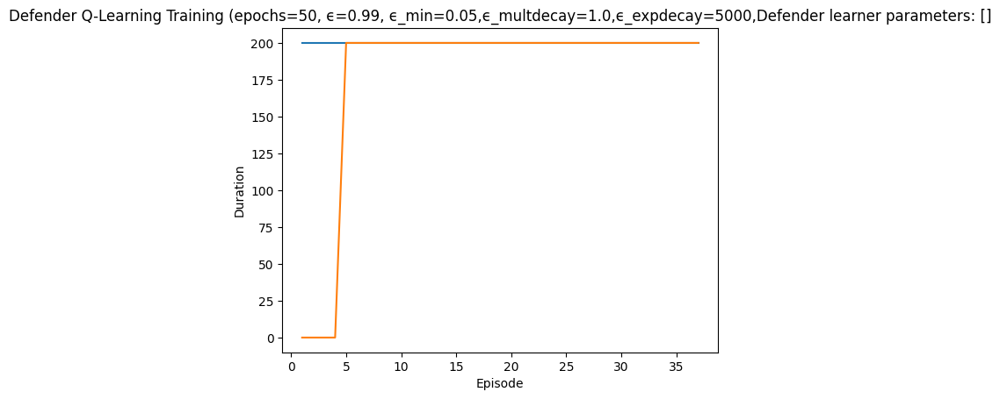

Rendering the current state of the environment
  ## Episode: 38/50 'Defender Q-Learning Training' ϵ=0.2640, Defender learner parameters: []


Episode 38|Iteration 5|reward:   65.0|last_reward_at:    5|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 4, 'parameter': 0}
2 4 0
action type:  Reimage Node
Iteration 1: Action Taken: Type=Reimage Node, NodeID=4, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '3_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 7401, 'successful_actions': 2804, 'failed_actions': 4597}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
3 6 0
{'action_type': 3, 'node_id': 6, 'parameter': 0}
[DEBUG] Received action: {'action_type': 3, 'node_id': 6, 'parameter': 0}
3 6 0
action type:  Allow Traffic
Iteration 2: Action Taken: Type

Episode 38|Iteration 62|reward:  350.0|last_reward_at:   59|Elapsed Time: 0:00:00||

Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 7, 'parameter': 0}
1 7 0
action type:  Block Traffic
Iteration 6: Action Taken: Type=Block Traffic, NodeID=7, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '6_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 7406, 'successful_actions': 2807, 'failed_actions': 4599}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 6, 'parameter': 0}
2 6 0
action type:  Reimage Node
Iteration 7: Action Taken: Type=Reimage 

Episode 38|Iteration 63|reward:  345.0|last_reward_at:   59|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 2, 'parameter': 0}
2 2 0
action type:  Reimage Node
Iteration 64: Action Taken: Type=Reimage Node, NodeID=2, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '1_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 7464, 'successful_actions': 2827, 'failed_actions': 4637}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140

Episode 38|Iteration 66|reward:  390.0|last_reward_at:   65|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 8 8
{'action_type': 1, 'node_id': 8, 'parameter': 8}
[DEBUG] Received action: {'action_type': 1, 'node_id': 8, 'parameter': 8}
1 8 8
action type:  Block Traffic
Iteration 65: Action Taken: Type=Block Traffic, NodeID=8, Parameter=8
info {'action': 'block_traffic', 'status': 'success', 'node_id': '7_LinuxNode', 'port_name': 8, 'performance_metrics': {'actions_taken': 7465, 'successful_actions': 2828, 'failed_actions': 4637}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_

Episode 38|Iteration 114|reward:  520.0|last_reward_at:  112|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 7, 'parameter': 0}
2 7 0
action type:  Reimage Node
Iteration 68: Action Taken: Type=Reimage Node, NodeID=7, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '6_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 7468, 'successful_actions': 2829, 'failed_actions': 4639}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the cu

Episode 38|Iteration 115|reward:  515.0|last_reward_at:  112|Elapsed Time: 0:00:00||

4 12 6
{'action_type': 4, 'node_id': 12, 'parameter': 6}
[DEBUG] Received action: {'action_type': 4, 'node_id': 12, 'parameter': 6}
4 12 6
action type:  Start Service
Iteration 115: Action Taken: Type=Start Service, NodeID=12, Parameter=6
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 7515, 'successful_actions': 2841, 'failed_actions': 4674}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 38|Iteration 118|reward:  590.0|last_reward_at:  118|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 7, 'parameter': 0}
2 7 0
action type:  Reimage Node
Iteration 116: Action Taken: Type=Reimage Node, NodeID=7, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '6_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 7516, 'successful_actions': 2842, 'failed_actions': 4674}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the c

Episode 38|Iteration 166|reward:  800.0|last_reward_at:  165|Elapsed Time: 0:00:00||

 Reimage Node
Iteration 119: Action Taken: Type=Reimage Node, NodeID=2, Parameter=5
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '1_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 7519, 'successful_actions': 2844, 'failed_actions': 4675}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 0, 'parameter': 0}
0 0 0
action type:  Reimage Node
Iteration 120: Action Taken: Type=Reimage Node, NodeID=0, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_i

Episode 38|Iteration 166|reward:  800.0|last_reward_at:  166|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state

Episode 38|Iteration 168|reward:  850.0|last_reward_at:  168|Elapsed Time: 0:00:00||


[DEBUG] Received action: {'action_type': 1, 'node_id': 9, 'parameter': 0}
1 9 0
action type:  Block Traffic
Iteration 167: Action Taken: Type=Block Traffic, NodeID=9, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '8_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 7567, 'successful_actions': 2861, 'failed_actions': 4706}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 4 4
{'action_type': 1, 'node_id': 4, 'parameter': 4}
[DEBUG] Received action: {'action_type': 1, 'node_id': 4, 'parameter': 4}
1 4 4
action type:  Block Traffic
Iteration 168: Action Taken: Type=Block Traffic, NodeID=4, Parameter=4
info {'action': 'block_traffic', 'status': 'success', 'node_id': '3_LinuxNode', 'port_name': 4, 'performance_metrics': {'actions_taken': 7568, 'successful_a

Episode 38|Iteration 200|reward: 1150.0|last_reward_at:  199|Elapsed Time: 0:00:00||



Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 2, 'parameter': 0}
2 2 0
action type:  Reimage Node
Iteration 170: Action Taken: Type=Reimage Node, NodeID=2, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '1_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 7570, 'successful_actions': 2863, 'failed_actions': 4707}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated

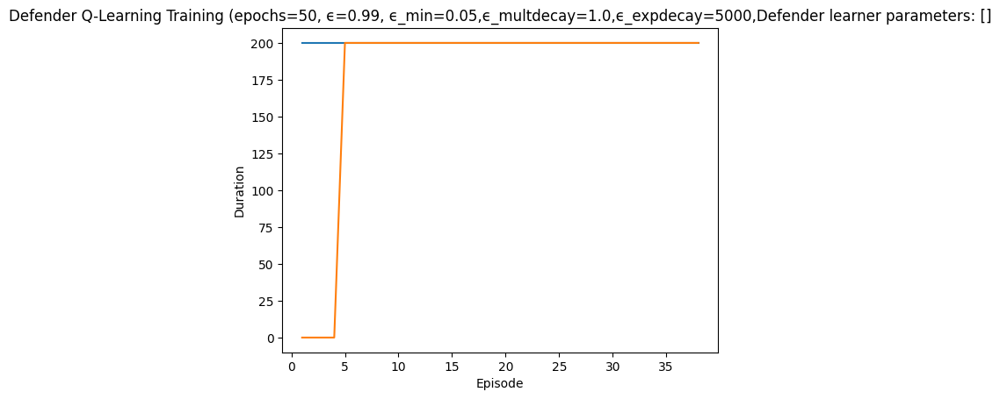

Rendering the current state of the environment
  ## Episode: 39/50 'Defender Q-Learning Training' ϵ=0.2556, Defender learner parameters: []


Episode 39|Iteration 48|reward:  120.0|last_reward_at:   41|Elapsed Time: 0:00:00||

4 5 9
{'action_type': 4, 'node_id': 5, 'parameter': 9}
[DEBUG] Received action: {'action_type': 4, 'node_id': 5, 'parameter': 9}
4 5 9
action type:  Start Service
Iteration 1: Action Taken: Type=Start Service, NodeID=5, Parameter=9
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 7601, 'successful_actions': 2878, 'failed_actions': 4723}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 5 2
{'action_type': 0, 'node_id': 5, 'parameter': 2}
[DEBUG] Received action: {'action_type': 0, 'node_id': 5, 'parameter': 2}
0 5 2
action type:  Reimage Node
Iteration 2: Action Taken: Type=Reimage Node, NodeID=5, Parameter=2
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '4_WindowsNode', 'reason': 'Re

Episode 39|Iteration 50|reward:  110.0|last_reward_at:   41|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 2, 'parameter': 0}
3 2 0
action type:  Allow Traffic
Iteration 50: Action Taken: Type=Allow Traffic, NodeID=2, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 7650, 'successful_actions': 2890, 'failed_actions': 4760}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 39|Iteration 101|reward:  165.0|last_reward_at:   91|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 13, 'parameter': 0}
4 13 0
action type:  Start Service
Iteration 51: Action Taken: Type=Start Service, NodeID=13, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 7651, 'successful_actions': 2890, 'failed_actions': 4761}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action 

Episode 39|Iteration 102|reward:  190.0|last_reward_at:  102|Elapsed Time: 0:00:00||


No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 6, 'parameter': 0}
1 6 0
action type:  Block Traffic
Iteration 102: Action Taken: Type=Block Traffic, NodeID=6, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '5_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 7702, 'successful_actions': 2902, 'failed_actions': 4800}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 39|Iteration 150|reward:  490.0|last_reward_at:  145|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 3, 'parameter': 0}
4 3 0
action type:  Start Service
Iteration 103: Action Taken: Type=Start Service, NodeID=3, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 7703, 'successful_actions': 2902, 'failed_actions': 4801}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action ba

Episode 39|Iteration 152|reward:  510.0|last_reward_at:  151|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 9, 'parameter': 0}
3 9 0
action type:  Allow Traffic
Iteration 152: Action Taken: Type=Allow Traffic, NodeID=9, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 7752, 'successful_actions': 2921, 'failed_actions': 4831}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 39|Iteration 199|reward:  725.0|last_reward_at:  197|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 0, 'parameter': 0}
2 0 0
action type:  Reimage Node
Iteration 153: Action Taken: Type=Reimage Node, NodeID=0, Parameter=0
info {'action': 'allow_traffic', 'status': 'failed', 'node_id': 'start', 'port_name': 0, 'reason': 'Machine not running', 'performance_metrics': {'actions_taken': 7753, 'successful_actions': 2921, 'failed_actions': 4832}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 0 3
{'action_type': 1, 'node_id': 0, 'parameter': 3}
[DEBUG] Received action: {'action_type': 1, 'node_id': 0, 'parameter': 3}
1 0 3
action type:  Block Traffic
Ite

Episode 39|Iteration 200|reward:  750.0|last_reward_at:  200|Elapsed Time: 0:00:00||



Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
  Episode 39 stopped at t=200 
  Breakdown [Reward/NoReward (Success rate)]
    explore-local: 0/0 (NaN)
    explore-remote: 0/0 (NaN)
    explore-connect: 0/0 (NaN)
    exploit-local: 0/0 (NaN)
    exploit-remote: 0/0 (NaN)
    exploit-connect: 0/0 (NaN)
  exploit deflected to exploration: 0
  Episode 39 breakdown:
    Successful Reimaging Count: 1
    Starting Services Count: 0
    Allowing Traffic Count: 1507
    Blocking Traffic Count: 1430
    Stopping Services Count: 0


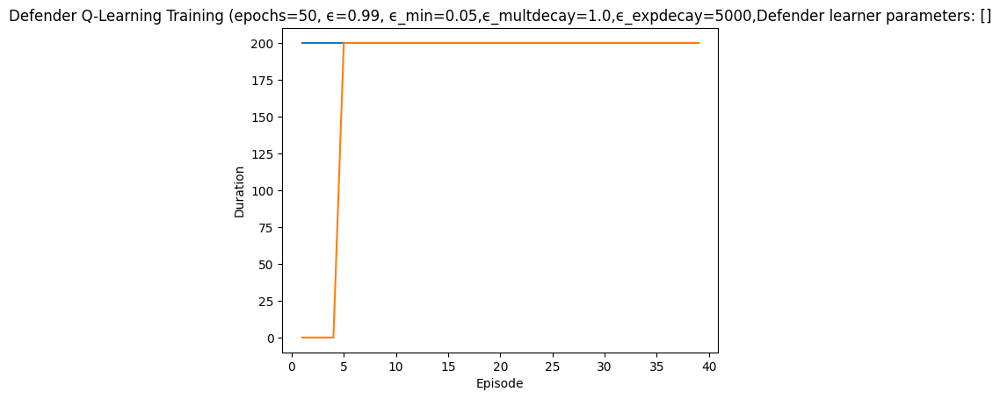

Rendering the current state of the environment
  ## Episode: 40/50 'Defender Q-Learning Training' ϵ=0.2476, Defender learner parameters: []


Episode 40|Iteration 78|reward:  580.0|last_reward_at:   78|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 10, 'parameter': 0}
3 10 0
action type:  Allow Traffic
Iteration 1: Action Taken: Type=Allow Traffic, NodeID=10, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 7801, 'successful_actions': 2938, 'failed_actions': 4863}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 3 0
{'action_type': 4, 'node_id': 3, 'parameter': 0}
[DEBUG] Received action: {'action_type': 4, 'node_id': 3, 'parameter': 0}
4 3 0
action type:  Start Service
Iteration 2: Action

Episode 40|Iteration 81|reward:  565.0|last_reward_at:   78|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 13, 'parameter': 0}
0 13 0
action type:  Reimage Node
Iteration 80: Action Taken: Type=Reimage Node, NodeID=13, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '12_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 7880, 'successful_actions': 2971, 'failed_actions': 4909}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 11 8
{'action_type': 4, 'node_id': 11, 'parameter': 8}
[DEBUG] Received action: {'action_type': 4, 'node_id': 11, 'parameter': 8}
4 11 8
acti

Episode 40|Iteration 142|reward:  900.0|last_reward_at:  140|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 12, 'parameter': 0}
1 12 0
action type:  Block Traffic
Iteration 82: Action Taken: Type=Block Traffic, NodeID=12, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '11_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 7882, 'successful_actions': 2972, 'failed_actions': 4910}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on th

Episode 40|Iteration 143|reward:  895.0|last_reward_at:  140|Elapsed Time: 0:00:00||


0 8 0
action type:  Reimage Node
Iteration 143: Action Taken: Type=Reimage Node, NodeID=8, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '7_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 7943, 'successful_actions': 2993, 'failed_actions': 4950}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 40|Iteration 193|reward: 1215.0|last_reward_at:  191|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 9, 'parameter': 0}
2 9 0
action type:  Reimage Node
Iteration 144: Action Taken: Type=Reimage Node, NodeID=9, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '8_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 7944, 'successful_actions': 2994, 'failed_actions': 4950}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
3 4 2
{'action_type': 3, 'node_id': 4, 'parameter': 2}
[DEBUG] Received action: {'action_type': 3, 'node_id': 4, 'parameter': 2}
3 4 2
action type:  Allow Traffic
Iteration 145: Action Taken

Episode 40|Iteration 194|reward: 1240.0|last_reward_at:  194|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 40|Iteration 200|reward: 1270.0|last_reward_at:  200|Elapsed Time: 0:00:00||


firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 1, 'parameter': 0}
3 1 0
action type:  Allow Traffic
Iteration 195: Action Taken: Type=Allow Traffic, NodeID=1, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 7995, 'successful_actions': 3013, 'failed_actions': 4982}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based o

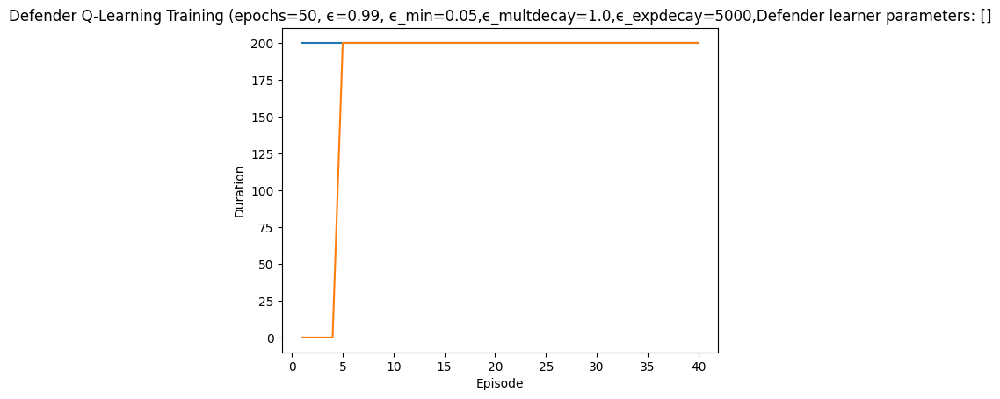

Rendering the current state of the environment
  ## Episode: 41/50 'Defender Q-Learning Training' ϵ=0.2398, Defender learner parameters: []


Episode 41|Iteration 73|reward:  395.0|last_reward_at:   71|Elapsed Time: 0:00:00||

1 0 0
{'action_type': 1, 'node_id': 0, 'parameter': 0}
[DEBUG] Received action: {'action_type': 1, 'node_id': 0, 'parameter': 0}
1 0 0
action type:  Block Traffic
Iteration 1: Action Taken: Type=Block Traffic, NodeID=0, Parameter=0
info {'action': 'block_traffic', 'status': 'failed', 'node_id': 'start', 'port_name': 0, 'reason': 'Machine not running', 'performance_metrics': {'actions_taken': 8001, 'successful_actions': 3015, 'failed_actions': 4986}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 4, 'parameter': 0}
3 4 0
action type:  Allow Traffic
Ite

Episode 41|Iteration 74|reward:  390.0|last_reward_at:   73|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 12, 'parameter': 0}
3 12 0
action type:  Allow Traffic
Iteration 74: Action Taken: Type=Allow Traffic, NodeID=12, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 8074, 'successful_actions': 3041, 'failed_actions': 5033}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 41|Iteration 130|reward:  970.0|last_reward_at:  130|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 3, 'parameter': 0}
2 3 0
action type:  Reimage Node
Iteration 75: Action Taken: Type=Reimage Node, NodeID=3, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '2_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 8075, 'successful_actions': 3042, 'failed_actions': 5033}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the cu

Episode 41|Iteration 131|reward:  995.0|last_reward_at:  130|Elapsed Time: 0:00:00||

 Block Traffic
Iteration 131: Action Taken: Type=Block Traffic, NodeID=11, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '10_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 8131, 'successful_actions': 3071, 'failed_actions': 5060}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 41|Iteration 200|reward: 1330.0|last_reward_at:  200|Elapsed Time: 0:00:00||


firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 2, 'parameter': 0}
1 2 0
action type:  Block Traffic
Iteration 132: Action Taken: Type=Block Traffic, NodeID=2, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '1_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 8132, 'successful_actions': 3072, 'failed_actions': 5060}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the c

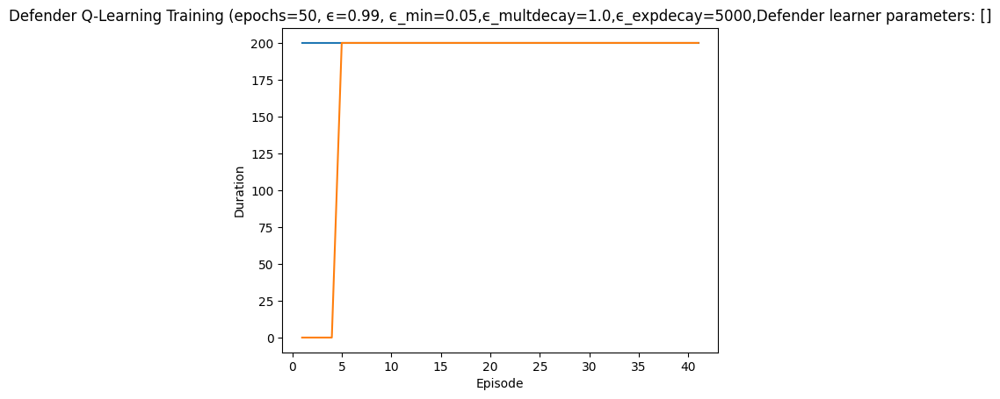

Rendering the current state of the environment
  ## Episode: 42/50 'Defender Q-Learning Training' ϵ=0.2324, Defender learner parameters: []


Episode 42|Iteration 9|reward:  125.0|last_reward_at:    5|Elapsed Time: 0:00:00||

2 3 7
{'action_type': 2, 'node_id': 3, 'parameter': 7}
[DEBUG] Received action: {'action_type': 2, 'node_id': 3, 'parameter': 7}
2 3 7
action type:  Reimage Node
Iteration 1: Action Taken: Type=Reimage Node, NodeID=3, Parameter=7
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '2_WindowsNode', 'port_name': 7, 'performance_metrics': {'actions_taken': 8201, 'successful_actions': 3095, 'failed_actions': 5106}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 13 2
{'action_type': 1, 'node_id': 13, 'parameter': 2}
[DEBUG] Received action: {'action_type': 1, 'node_id': 13, 'parameter': 2}
1 13 2
action type:  Block Traffic
Iteration 2: Action Taken: Type=Block Traffic, NodeID=13, Parameter=2
info {'action': 'block_traffic', 'status': 'success', 'node_id': '12_WindowsNode', 'port_name': 2, 'per

Episode 42|Iteration 60|reward:  470.0|last_reward_at:   59|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 12, 'parameter': 0}
3 12 0
action type:  Allow Traffic
Iteration 10: Action Taken: Type=Allow Traffic, NodeID=12, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 8210, 'successful_actions': 3100, 'failed_actions': 5110}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 9 7
{'action_type': 0, 'node_id': 9, 'parameter': 7}
[DEBUG] Received action: {'action_type': 0, 'node_id': 9, 'parameter': 7}
0 9 7
action type:  Reimage Node
Iteration 11: Actio

Episode 42|Iteration 62|reward:  460.0|last_reward_at:   59|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 8, 'parameter': 0}
0 8 0
action type:  Reimage Node
Iteration 62: Action Taken: Type=Reimage Node, NodeID=8, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '7_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 8262, 'successful_actions': 3120, 'failed_actions': 5142}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 42|Iteration 67|reward:  455.0|last_reward_at:   67|Elapsed Time: 0:00:00||

4 13 6
{'action_type': 4, 'node_id': 13, 'parameter': 6}
[DEBUG] Received action: {'action_type': 4, 'node_id': 13, 'parameter': 6}
4 13 6
action type:  Start Service
Iteration 63: Action Taken: Type=Start Service, NodeID=13, Parameter=6
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 8263, 'successful_actions': 3120, 'failed_actions': 5143}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
3 3 8
{'action_type': 3, 'node_id': 3, 'parameter': 8}
[DEBUG] Received action: {'action_type': 3, 'node_id': 3, 'parameter': 8}
3 3 8
action type:  Allow Traffic
Iteration 64: Action Taken: Type=Allow Traffic, NodeID=3, Parameter=8
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 's

Episode 42|Iteration 119|reward:  905.0|last_reward_at:  114|Elapsed Time: 0:00:00||

Reimage Node
Iteration 68: Action Taken: Type=Reimage Node, NodeID=0, Parameter=4
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': 'start', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 8268, 'successful_actions': 3121, 'failed_actions': 5147}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 13, 'parameter': 0}
2 13 0
action type:  Reimage Node
Iteration 69: Action Taken: Type=Reimage Node, NodeID=13, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '12_W

Episode 42|Iteration 120|reward:  900.0|last_reward_at:  114|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 10, 'parameter': 0}
3 10 0
action type:  Allow Traffic
Iteration 120: Action Taken: Type=Allow Traffic, NodeID=10, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 8320, 'successful_actions': 3145, 'failed_actions': 5175}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 8 5
{'action_type': 4, 'node_id': 8, 'parameter': 5}
[DEBUG] Received action: {'action_type': 4, 'node_id': 8, 'parameter': 5}
4 8 5
action type:  Start Service
Iteration 121: Ac

Episode 42|Iteration 125|reward:  905.0|last_reward_at:  122|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 4, 'parameter': 0}
2 4 0
action type:  Reimage Node
Iteration 122: Action Taken: Type=Reimage Node, NodeID=4, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '3_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 8322, 'successful_actions': 3146, 'failed_actions': 5176}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated

Episode 42|Iteration 168|reward: 1120.0|last_reward_at:  166|Elapsed Time: 0:00:00||

2 10 1
{'action_type': 2, 'node_id': 10, 'parameter': 1}
[DEBUG] Received action: {'action_type': 2, 'node_id': 10, 'parameter': 1}
2 10 1
action type:  Reimage Node
Iteration 126: Action Taken: Type=Reimage Node, NodeID=10, Parameter=1
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '9_LinuxNode', 'port_name': 1, 'performance_metrics': {'actions_taken': 8326, 'successful_actions': 3147, 'failed_actions': 5179}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 3, 'parameter': 0}
3 3 0
action type:  Allow Traffic
Iteration 127: Action Ta

Episode 42|Iteration 169|reward: 1115.0|last_reward_at:  166|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 7, 'parameter': 0}
0 7 0
action type: 

Episode 42|Iteration 173|reward: 1125.0|last_reward_at:  171|Elapsed Time: 0:00:00||

 Reimage Node
Iteration 170: Action Taken: Type=Reimage Node, NodeID=7, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '6_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 8370, 'successful_actions': 3161, 'failed_actions': 5209}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 8, 'parameter': 0}
2 8 0
action type:  Reimage Node
Iteration 171: Action Taken: Type=Reimage Node, NodeID=8, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id

Episode 42|Iteration 200|reward: 1340.0|last_reward_at:  200|Elapsed Time: 0:00:00||



Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 4, 'parameter': 0}
4 4 0
action type:  Start Service
Iteration 175: Action Taken: Type=Start Service, NodeID=4, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 8375, 'successful_actions': 3162, 'failed_actions': 5213}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 4 5
{'action_type': 0, 'node_id': 4, 'parameter': 5}
[DEBUG] Received acti

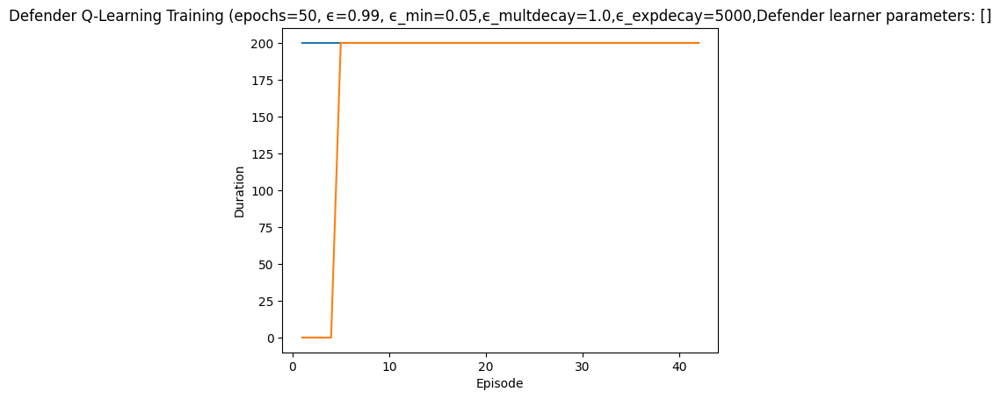

Rendering the current state of the environment
  ## Episode: 43/50 'Defender Q-Learning Training' ϵ=0.2252, Defender learner parameters: []


Episode 43|Iteration 71|reward:  425.0|last_reward_at:   68|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 11, 'parameter': 0}
0 11 0
action type:  Reimage Node
Iteration 1: Action Taken: Type=Reimage Node, NodeID=11, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '10_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 8401, 'successful_actions': 3174, 'failed_actions': 5227}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 8 0
{'action_type': 0, 'node_id': 8, 'parameter': 0}
[DEBUG] Received action: {'action_type': 0, 'node_id': 8, 'parameter': 0}
0 8 0
action ty

Episode 43|Iteration 74|reward:  470.0|last_reward_at:   73|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 6, 'parameter': 0}
4 6 0
action type:  Start Service
Iteration 72: Action Taken: Type=Start Service, NodeID=6, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 8472, 'successful_actions': 3200, 'failed_actions': 5272}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action bas

Episode 43|Iteration 145|reward:  965.0|last_reward_at:  144|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 4, 'parameter': 0}
4 4 0
action type:  Start Service
Iteration 75: Action Taken: Type=Start Service, NodeID=4, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 8475, 'successful_actions': 3202, 'failed_actions': 5273}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action bas

Episode 43|Iteration 148|reward:  950.0|last_reward_at:  144|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 12, 'parameter': 0}
4 12 0
action type:  Start Service
Iteration 146: Action Taken: Type=Start Service, NodeID=12, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 8546, 'successful_actions': 3231, 'failed_actions': 5315}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action

Episode 43|Iteration 200|reward: 1230.0|last_reward_at:  199|Elapsed Time: 0:00:00||


firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 6, 'parameter': 0}
3 6 0
action type:  Allow Traffic
Iteration 149: Action Taken: Type=Allow Traffic, NodeID=6, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 8549, 'successful_actions': 3231, 'failed_actions': 5318}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based o

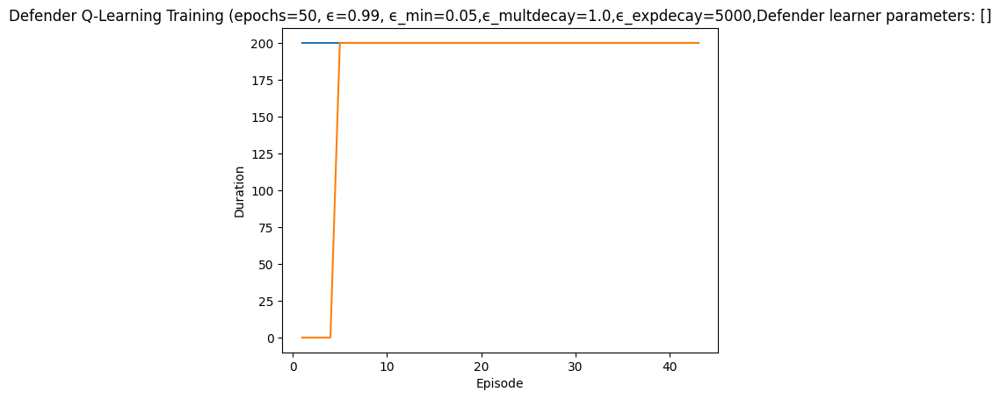

Rendering the current state of the environment
  ## Episode: 44/50 'Defender Q-Learning Training' ϵ=0.2184, Defender learner parameters: []


Episode 44|Iteration 33|reward:  225.0|last_reward_at:   33|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 7, 'parameter': 0}
1 7 0
action type:  Block Traffic
Iteration 1: Action Taken: Type=Block Traffic, NodeID=7, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '6_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 8601, 'successful_actions': 3250, 'failed_actions': 5351}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the c

Episode 44|Iteration 47|reward:  335.0|last_reward_at:   43|Elapsed Time: 0:00:00||

Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 11, 'parameter': 0}
2 11 0
action type:  Reimage Node
Iteration 35: Action Taken: Type=Reimage Node, NodeID=11, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '10_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 8635, 'successful_actions': 3263, 'failed_actions': 5372}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a pr

Episode 44|Iteration 48|reward:  360.0|last_reward_at:   47|Elapsed Time: 0:00:00||

1 1 3
{'action_type': 1, 'node_id': 1, 'parameter': 3}
[DEBUG] Received action: {'action_type': 1, 'node_id': 1, 'parameter': 3}
1 1 3
action type:  Block Traffic
Iteration 48: Action Taken: Type=Block Traffic, NodeID=1, Parameter=3
info {'action': 'block_traffic', 'status': 'success', 'node_id': '13_LinuxNode', 'port_name': 3, 'performance_metrics': {'actions_taken': 8648, 'successful_actions': 3269, 'failed_actions': 5379}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 44|Iteration 66|reward:  420.0|last_reward_at:   58|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 2, 'parameter': 0}
1 2 0
action type:  Block Traffic
Iteration 49: Action Taken: Type=Block Traffic, NodeID=2, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '1_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 8649, 'successful_actions': 3270, 'failed_actions': 5379}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the cu

Episode 44|Iteration 102|reward:  620.0|last_reward_at:  102|Elapsed Time: 0:00:00||

 {'action': 'allow_traffic', 'status': 'success', 'node_id': '11_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 8667, 'successful_actions': 3275, 'failed_actions': 5392}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 9, 'parameter': 0}
3 9 0
action type:  Allow Traffic
Iteration 68: Action Taken: Type=Allow Traffic, NodeID=9, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 8668, 'successful_actions': 3275, 'failed_actions'

Episode 44|Iteration 103|reward:  645.0|last_reward_at:  102|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 10, 'parameter': 0}
2 10 0
action type:  Reimage Node
Iteration 103: Action Taken: Type=Reimage Node, NodeID=10, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '9_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 8703, 'successful_actions': 3288, 'failed_actions': 5415}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 44|Iteration 119|reward:  715.0|last_reward_at:  115|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 4, 'parameter': 0}
2 4 0
action type:  Reimage Node
Iteration 104: Action Taken: Type=Reimage Node, NodeID=4, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '3_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 8704, 'successful_actions': 3289, 'failed_actions': 5415}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the cur

Episode 44|Iteration 145|reward:  945.0|last_reward_at:  145|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 13, 'parameter': 0}
0 13 0
action type:  Reimage Node
Iteration 120: Action Taken: Type=Reimage Node, NodeID=13, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '12_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 8720, 'successful_actions': 3293, 'failed_actions': 5427}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
3 11 6
{'action_type': 3, 'node_id': 11, 'parameter': 6}
[DEBUG] Received action: {'action_type': 3, 'node_id': 11, 'parameter': 6}
3 11 6
act

Episode 44|Iteration 146|reward:  940.0|last_reward_at:  145|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 12, 'parameter': 0}
4 12 0
action type:  Start Service
Iteration 146: Action Taken: Type=Start Service, NodeID=12, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 8746, 'successful_actions': 3305, 'failed_actions': 5441}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 2 1
{'action_type': 0, 'node_id': 2, 'parameter': 1}
[DEBUG] Received action: {'action_type': 0, 'node_id': 2, 'parameter': 1}
0 2 1
action type:  Reimage Node
Iteration 147

Episode 44|Iteration 159|reward: 1055.0|last_reward_at:  158|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 9, 'parameter': 0}
1 9 0
action type:  Block Traffic
Iteration 148: Action Taken: Type=Block Traffic, NodeID=9, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '8_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 8748, 'successful_actions': 3306, 'failed_actions': 5442}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calcul

Episode 44|Iteration 182|reward: 1170.0|last_reward_at:  182|Elapsed Time: 0:00:00||


No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 4, 'parameter': 0}
2 4 0
action type:  Reimage Node
Iteration 160: Action Taken: Type=Reimage Node, NodeID=4, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '3_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 8760, 'successful_actions': 3312, 'failed_actions': 5448}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 9, 'parameter': 0}
3 9 0
action typ

Episode 44|Iteration 183|reward: 1165.0|last_reward_at:  182|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 13, 'parameter': 0}
3 13 0
action type:  Allow Traffic
Iteration 183: Action Taken: Type=Allow Traffic, NodeID=13, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 8783, 'successful_actions': 3319, 'failed_actions': 5464}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 44|Iteration 196|reward: 1250.0|last_reward_at:  195|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 9, 'parameter': 0}
2 9 0
action type:  Reimage Node
Iteration 184: Action Taken: Type=Reimage Node, NodeID=9, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '8_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 8784, 'successful_actions': 3320, 'failed_actions': 5464}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the c

Episode 44|Iteration 200|reward: 1290.0|last_reward_at:  199|Elapsed Time: 0:00:00||



Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 6 1
{'action_type': 4, 'node_id': 6, 'parameter': 1}
[DEBUG] Received action: {'action_type': 4, 'node_id': 6, 'parameter': 1}
4 6 1
action type:  Start Service
Iteration 198: Action Taken: Type=Start Service, NodeID=6, Parameter=1
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 8798, 'successful_actions': 3325, 'failed_actions': 5473}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 5 0
{'action_type': 1, 'node_id': 5, 'parameter': 0}
[DEBUG] Received action: {'action_type': 1, 'node_id': 5, 'parameter': 0}
1 5 0
action type:  Block Traffic
Iteration 199: Action Taken: Type=Block Traffic, NodeID=5, Pa

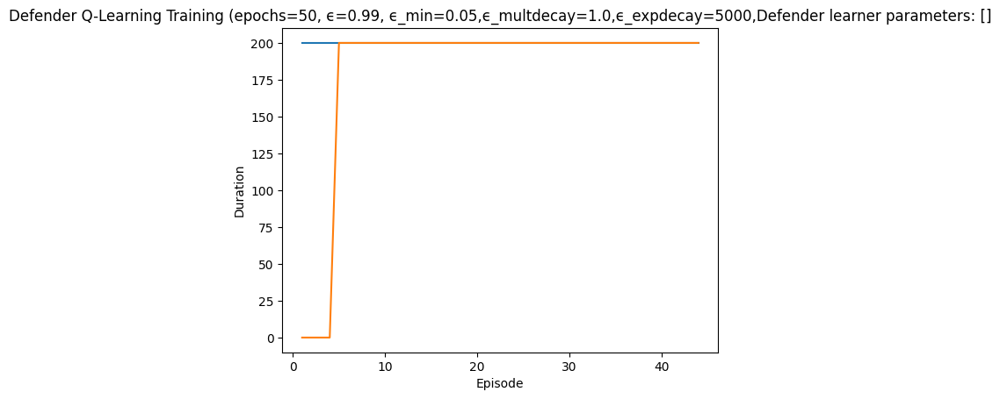

Rendering the current state of the environment
  ## Episode: 45/50 'Defender Q-Learning Training' ϵ=0.2118, Defender learner parameters: []


Episode 45|Iteration 10|reward:   70.0|last_reward_at:   10|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 10, 'parameter': 0}
0 10 0
action type:  Reimage Node
Iteration 1: Action Taken: Type=Reimage Node, NodeID=10, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '9_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 8801, 'successful_actions': 3326, 'failed_actions': 5475}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preven

Episode 45|Iteration 56|reward:  310.0|last_reward_at:   56|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 6, 'parameter': 0}
0 6 0
action type:  Reimage Node
Iteration 11: Action Taken: Type=Reimage Node, NodeID=6, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '5_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 8811, 'successful_actions': 3330, 'failed_actions': 5481}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventi

Episode 45|Iteration 57|reward:  305.0|last_reward_at:   56|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 2, 'parameter': 0}
3 2 0
action type:  Allow Traffic
Iteration 57: Action Taken: Type=Allow Traffic, NodeID=2, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 8857, 'successful_actions': 3347, 'failed_actions': 5510}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on

Episode 45|Iteration 60|reward:  320.0|last_reward_at:   58|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 1 0
{'action_type': 0, 'node_id': 1, 'parameter': 0}
[DEBUG] Received action: {'action_type': 0, 'node_id': 1, 'parameter': 0}
0 1 0
action type:  Reimage Node
Iteration 59: Action Taken: Type=Reimage Node, NodeID=1, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '13_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 8859, 'successful_actions': 3348, 'failed_actions': 5511}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the curre

Episode 45|Iteration 98|reward:  550.0|last_reward_at:   95|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 13, 'parameter': 0}
1 13 0
action type:  Block Traffic
Iteration 62: Action Taken: Type=Block Traffic, NodeID=13, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '12_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 8862, 'successful_actions': 3350, 'failed_actions': 5512}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
3 0 3
{'action_type': 3, 'node_id': 0, 'parameter': 3}
[DEBUG] Received action: {'a

Episode 45|Iteration 99|reward:  575.0|last_reward_at:   99|Elapsed Time: 0:00:00||

Block Traffic
Iteration 99: Action Taken: Type=Block Traffic, NodeID=11, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '10_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 8899, 'successful_actions': 3363, 'failed_actions': 5536}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 45|Iteration 101|reward:  595.0|last_reward_at:  100|Elapsed Time: 0:00:00||

1 13 2
{'action_type': 1, 'node_id': 13, 'parameter': 2}
[DEBUG] Received action: {'action_type': 1, 'node_id': 13, 'parameter': 2}
1 13 2
action type:  Block Traffic
Iteration 100: Action Taken: Type=Block Traffic, NodeID=13, Parameter=2
info {'action': 'block_traffic', 'status': 'success', 'node_id': '12_WindowsNode', 'port_name': 2, 'performance_metrics': {'actions_taken': 8900, 'successful_actions': 3364, 'failed_actions': 5536}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 1 2
{'action_type': 4, 'node_id': 1, 'parameter': 2}
[DEBUG] Received action: {'action_type': 4, 'node_id': 1, 'parameter': 2}
4 1 2
action type:  Start Service
Iteration 101: Action Taken: Type=Start Service, NodeID=1, Parameter=2
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'star

Episode 45|Iteration 144|reward:  810.0|last_reward_at:  144|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 10, 'parameter': 0}
4 10 0
action type:  Start Service
Iteration 102: Action Taken: Type=Start Service, NodeID=10, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 8902, 'successful_actions': 3364, 'failed_actions': 5538}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action

Episode 45|Iteration 147|reward:  795.0|last_reward_at:  144|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 11, 'parameter': 0}
4 11 0
action type:  Start Service
Iteration 146: Action Taken: Type=Start Service, NodeID=11, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 8946, 'successful_actions': 3379, 'failed_actions': 5567}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action

Episode 45|Iteration 149|reward:  785.0|last_reward_at:  144|Elapsed Time: 0:00:00||

0 4 8
{'action_type': 0, 'node_id': 4, 'parameter': 8}
[DEBUG] Received action: {'action_type': 0, 'node_id': 4, 'parameter': 8}
0 4 8
action type:  Reimage Node
Iteration 149: Action Taken: Type=Reimage Node, NodeID=4, Parameter=8
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '3_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 8949, 'successful_actions': 3379, 'failed_actions': 5570}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 2, 'parameter': 0}
4 2 0
action type: 

Episode 45|Iteration 192|reward: 1140.0|last_reward_at:  191|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 13, 'parameter': 0}
1 13 0
action type:  Block Traffic
Iteration 151: Action Taken: Type=Block Traffic, NodeID=13, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '12_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 8951, 'successful_actions': 3380, 'failed_actions': 5571}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on

Episode 45|Iteration 194|reward: 1130.0|last_reward_at:  191|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 0, 'parameter': 0}
0 0 0
action type:  Reimage Node
Iteration 194: Action Taken: Type=Reimage Node, NodeID=0, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': 'start', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 8994, 'successful_actions': 3398, 'failed_actions': 5596}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes:

Episode 45|Iteration 196|reward: 1120.0|last_reward_at:  191|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 11, 'parameter': 0}
3 11 0
action type:  Allow Traffic
Iteration 196: Action Taken: Type=Allow Traffic, NodeID=11, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 8996, 'successful_actions': 3398, 'failed_actions': 5598}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0

Episode 45|Iteration 200|reward: 1160.0|last_reward_at:  199|Elapsed Time: 0:00:00||


firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 2, 'parameter': 0}
3 2 0
action type:  Allow Traffic
Iteration 198: Action Taken: Type=Allow Traffic, NodeID=2, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 8998, 'successful_actions': 3399, 'failed_actions': 5599}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based o

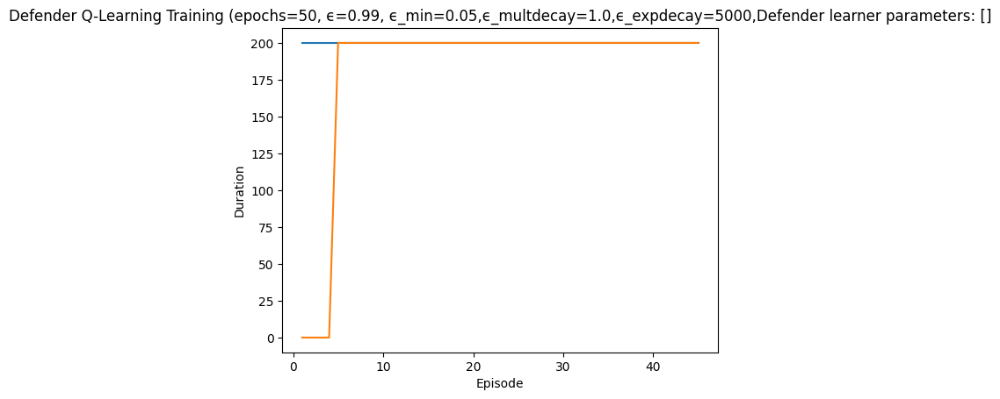

Rendering the current state of the environment
  ## Episode: 46/50 'Defender Q-Learning Training' ϵ=0.2054, Defender learner parameters: []


Episode 46|Iteration 29|reward:   95.0|last_reward_at:   22|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 8, 'parameter': 0}
4 8 0
action type:  Start Service
Iteration 1: Action Taken: Type=Start Service, NodeID=8, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 9001, 'successful_actions': 3400, 'failed_actions': 5601}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action base

Episode 46|Iteration 58|reward:  230.0|last_reward_at:   58|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 1, 'parameter': 0}
2 1 0
action type:  Reimage Node
Iteration 30: Action Taken: Type=Reimage Node, NodeID=1, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '13_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 9030, 'successful_actions': 3409, 'failed_actions': 5621}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the cur

Episode 46|Iteration 69|reward:  205.0|last_reward_at:   60|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 7, 'parameter': 0}
2 7 0
action type:  Reimage Node
Iteration 60: Action Taken: Type=Reimage Node, NodeID=7, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '6_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 9060, 'successful_actions': 3419, 'failed_actions': 5641}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the cu

Episode 46|Iteration 100|reward:  390.0|last_reward_at:   98|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 6, 'parameter': 0}
2 6 0
action type:  Reimage Node
Iteration 70: Action Taken: Type=Reimage Node, NodeID=6, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '5_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 9070, 'successful_actions': 3420, 'failed_actions': 5650}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the curr

Episode 46|Iteration 101|reward:  415.0|last_reward_at:   98|Elapsed Time: 0:00:00||

2 7 8
{'action_type': 2, 'node_id': 7, 'parameter': 8}
[DEBUG] Received action: {'action_type': 2, 'node_id': 7, 'parameter': 8}
2 7 8
action type:  Reimage Node
Iteration 101: Action Taken: Type=Reimage Node, NodeID=7, Parameter=8
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '6_WindowsNode', 'port_name': 8, 'performance_metrics': {'actions_taken': 9101, 'successful_actions': 3432, 'failed_actions': 5669}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 46|Iteration 111|reward:  445.0|last_reward_at:  108|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 3, 'parameter': 0}
2 3 0
action type:  Reimage Node
Iteration 102: Action Taken: Type=Reimage Node, NodeID=3, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '2_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 9102, 'successful_actions': 3433, 'failed_actions': 5669}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the c

Episode 46|Iteration 139|reward:  665.0|last_reward_at:  137|Elapsed Time: 0:00:00||

1 2 3
{'action_type': 1, 'node_id': 2, 'parameter': 3}
[DEBUG] Received action: {'action_type': 1, 'node_id': 2, 'parameter': 3}
1 2 3
action type:  Block Traffic
Iteration 112: Action Taken: Type=Block Traffic, NodeID=2, Parameter=3
info {'action': 'block_traffic', 'status': 'success', 'node_id': '1_LinuxNode', 'port_name': 3, 'performance_metrics': {'actions_taken': 9112, 'successful_actions': 3436, 'failed_actions': 5676}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 7, 'parameter': 0}
0 7 0
action type:  Reimage Node
Iteration 113: Action Taken:

Episode 46|Iteration 140|reward:  690.0|last_reward_at:  140|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 8, 'parameter': 0}
3 8 0
action type:  Allow Traffic
Iteration 141: Action Taken: Type=Allow Traffic, NodeID=8, Parameter=0
info 

Episode 46|Iteration 148|reward:  770.0|last_reward_at:  148|Elapsed Time: 0:00:00||

{'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 9141, 'successful_actions': 3448, 'failed_actions': 5693}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 8, 'parameter': 0}
0 8 0
action type:  Reimage Node
Iteration 142: Action Taken: Type=Reimage Node, NodeID=8, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '7_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 9142, 'su

Episode 46|Iteration 178|reward:  830.0|last_reward_at:  176|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 9, 'parameter': 0}
0 9 0
action type:  Reimage Node
Iteration 150: Action Taken: Type=Reimage Node, NodeID=9, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '8_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 9150, 'successful_actions': 3452, 'failed_actions': 5698}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infecte

Episode 46|Iteration 180|reward:  850.0|last_reward_at:  179|Elapsed Time: 0:00:00||


info {'action': 'block_traffic', 'status': 'success', 'node_id': '2_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 9179, 'successful_actions': 3460, 'failed_actions': 5719}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 5, 'parameter': 0}
3 5 0
action type:  Allow Traffic
Iteration 180: Action Taken: Type=Allow Traffic, NodeID=5, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 9180, 'successful_actions': 3460, 'failed_a

Episode 46|Iteration 187|reward:  995.0|last_reward_at:  186|Elapsed Time: 0:00:00||

Iteration 181: Action Taken: Type=Reimage Node, NodeID=3, Parameter=5
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '2_WindowsNode', 'port_name': 5, 'performance_metrics': {'actions_taken': 9181, 'successful_actions': 3461, 'failed_actions': 5720}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 3, 'parameter': 0}
1 3 0
action type:  Block Traffic
Iteration 182: Action Taken: Type=Block Traffic, NodeID=3, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '2_WindowsNode', 'port_name': 0, 'performance_metrics

Episode 46|Iteration 200|reward: 1110.0|last_reward_at:  197|Elapsed Time: 0:00:00||


3 4 1
{'action_type': 3, 'node_id': 4, 'parameter': 1}
[DEBUG] Received action: {'action_type': 3, 'node_id': 4, 'parameter': 1}
3 4 1
action type:  Allow Traffic
Iteration 188: Action Taken: Type=Allow Traffic, NodeID=4, Parameter=1
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 9188, 'successful_actions': 3466, 'failed_actions': 5722}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 2 8
{'action_type': 1, 'node_id': 2, 'parameter': 8}
[DEBUG] Received action: {'action_type': 1, 'node_id': 2, 'parameter': 8}
1 2 8
action type:  Block Traffic
Iteration 189: Action Taken: Type=Block Traffic, NodeID=2, Parameter=8
info {'action': 'block_traffic', 'status': 'success', 'node_id': '1_LinuxNode', 'port_name': 8, '

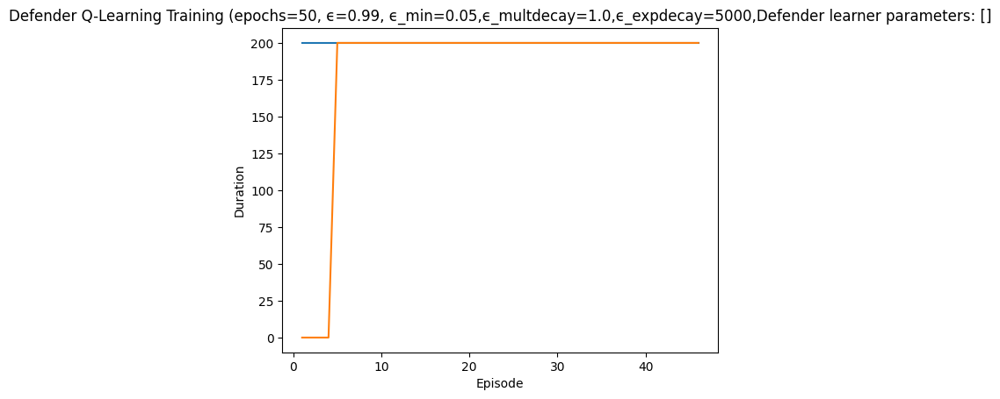

Rendering the current state of the environment
  ## Episode: 47/50 'Defender Q-Learning Training' ϵ=0.1993, Defender learner parameters: []


Episode 47|Iteration 11|reward:   65.0|last_reward_at:    9|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 4, 'parameter': 0}
4 4 0
action type:  Start Service
Iteration 1: Action Taken: Type=Start Service, NodeID=4, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 9201, 'successful_actions': 3472, 'failed_actions': 5729}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 8 1
{'action_type': 2, 'node_id': 8, 'parameter': 1}
[DEBUG] Received action: {'action_type': 2, 'node_id': 8, 'parameter': 1}
2 8 1
action type:  Reimage Node
Iteration 2: Actio

Episode 47|Iteration 48|reward:  350.0|last_reward_at:   46|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 2, 'parameter': 0}
2 2 0
action type:  Reimage Node
Iteration 12: Action Taken: Type=Reimage Node, NodeID=2, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '1_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 9212, 'successful_actions': 3477, 'failed_actions': 5735}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the curr

Episode 47|Iteration 49|reward:  345.0|last_reward_at:   46|Elapsed Time: 0:00:00||

4 8 5
{'action_type': 4, 'node_id': 8, 'parameter': 5}
[DEBUG] Received action: {'action_type': 4, 'node_id': 8, 'parameter': 5}
4 8 5
action type:  Start Service
Iteration 49: Action Taken: Type=Start Service, NodeID=8, Parameter=5
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 9249, 'successful_actions': 3492, 'failed_actions': 5757}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140

Episode 47|Iteration 51|reward:  325.0|last_reward_at:   46|Elapsed Time: 0:00:00||


No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 0, 'parameter': 0}
2 0 0
action type:  Reimage Node
Iteration 50: Action Taken: Type=Reimage Node, NodeID=0, Parameter=0
info {'action': 'allow_traffic', 'status': 'failed', 'node_id': 'start', 'port_name': 0, 'reason': 'Machine not running', 'performance_metrics': {'actions_taken': 9250, 'successful_actions': 3492, 'failed_actions': 5758}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 3, 'parame

Episode 47|Iteration 95|reward:  485.0|last_reward_at:   91|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 5, 'parameter': 0}
2 5 0
action type:  Reimage Node
Iteration 53: Action Taken: Type=Reimage Node, NodeID=5, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '4_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 9253, 'successful_actions': 3493, 'failed_actions': 5760}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculate

Episode 47|Iteration 102|reward:  570.0|last_reward_at:  102|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 7, 'parameter': 0}
3 7 0
action type:  Allow Traffic
Iteration 97: Action Taken: Type=Allow Traffic, NodeID=7, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 9297, 'successful_actions': 3505, 'failed_actions': 5792}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
2 7 3
{'action_type': 2, 'node_id': 7, 'parameter': 3}
[DEBUG] Received action: {'action_type': 2, 'node_id': 7, 'parameter': 3}
2 7 3
action type:  Reimage Node
Iteration 98: Action T

Episode 47|Iteration 146|reward:  890.0|last_reward_at:  146|Elapsed Time: 0:00:00||

 Allow Traffic
Iteration 103: Action Taken: Type=Allow Traffic, NodeID=4, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 9303, 'successful_actions': 3509, 'failed_actions': 5794}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 11, 'parameter': 0}
4 11 0
action type:  Start Service
Iteration 104: Action Taken: Type=Start Service, NodeID=11, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'st

Episode 47|Iteration 148|reward:  910.0|last_reward_at:  148|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 4, 'parameter': 0}
1 4 0
action type:  Block Traffic
Iteration 148: Action Taken: Type=Block Traffic, NodeID=4, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '3_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 9348, 'successful_actions': 3528, 'failed_actions': 5820}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 47|Iteration 151|reward:  895.0|last_reward_at:  148|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 8, 'parameter': 0}
4 8 0
action type:  Start Service
Iteration 149: Action Taken: Type=Start Service, NodeID=8, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 9349, 'successful_actions': 3528, 'failed_actions': 5821}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 13 9
{'action_type': 4, 'node_id': 13, 'parameter': 9}
[DEBUG] Received action: {'action_type': 4, 'node_id': 13, 'parameter': 9}
4 13 9
action type:  Start Service
Iteration 1

Episode 47|Iteration 186|reward: 1020.0|last_reward_at:  179|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 3, 'parameter': 0}
1 3 0
action type:  Block Traffic
Iteration 153: Action Taken: Type=Block Traffic, NodeID=3, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '2_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 9353, 'successful_actions': 3529, 'failed_actions': 5824}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calcul

Episode 47|Iteration 188|reward: 1010.0|last_reward_at:  179|Elapsed Time: 0:00:00||

Start Service
Iteration 187: Action Taken: Type=Start Service, NodeID=5, Parameter=7
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 9387, 'successful_actions': 3538, 'failed_actions': 5849}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 2, 'parameter': 0}
0 2 0
action type:  Reimage Node
Iteration 188: Action Taken: Type=Reimage Node, NodeID=2, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '1_LinuxNode', 'reason': 'R

Episode 47|Iteration 191|reward:  995.0|last_reward_at:  179|Elapsed Time: 0:00:00||


{'action_type': 0, 'node_id': 6, 'parameter': 7}
[DEBUG] Received action: {'action_type': 0, 'node_id': 6, 'parameter': 7}
0 6 7
action type:  Reimage Node
Iteration 189: Action Taken: Type=Reimage Node, NodeID=6, Parameter=7
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '5_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 9389, 'successful_actions': 3538, 'failed_actions': 5851}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 0, 'parameter': 0}
3 0 0
action type:  Allo

Episode 47|Iteration 200|reward: 1070.0|last_reward_at:  198|Elapsed Time: 0:00:00||



info {'action': 'block_traffic', 'status': 'success', 'node_id': '11_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 9392, 'successful_actions': 3539, 'failed_actions': 5853}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 8, 'parameter': 0}
3 8 0
action type:  Allow Traffic
Iteration 193: Action Taken: Type=Allow Traffic, NodeID=8, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 9393, 'successful_actions': 3539, 'failed_ac

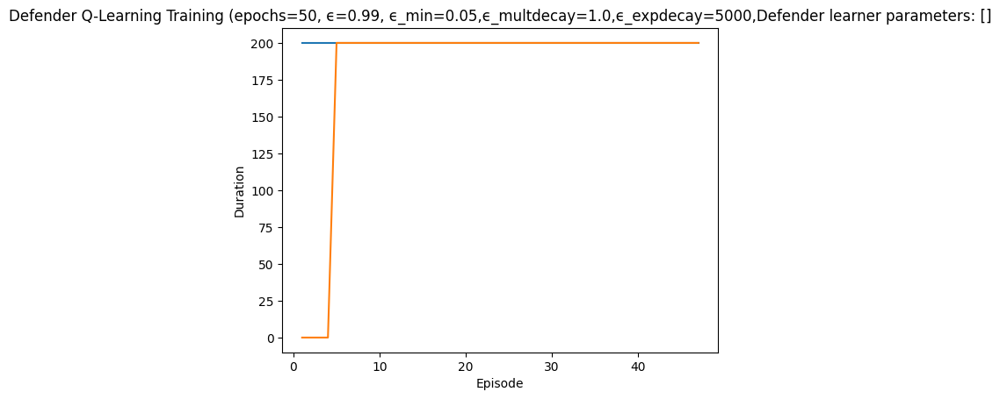

Rendering the current state of the environment
  ## Episode: 48/50 'Defender Q-Learning Training' ϵ=0.1935, Defender learner parameters: []


Episode 48|Iteration 56|reward:  420.0|last_reward_at:   54|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 3, 'parameter': 0}
2 3 0
action type:  Reimage Node
Iteration 1: Action Taken: Type=Reimage Node, NodeID=3, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '2_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 9401, 'successful_actions': 3543, 'failed_actions': 5858}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the cur

Episode 48|Iteration 58|reward:  410.0|last_reward_at:   54|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 3, 'parameter': 0}
0 3 0
action type:  Reimage Node
Iteration 58: Action Taken: Type=Reimage Node, NodeID=3, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '2_WindowsNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 9458, 'successful_actions': 3566, 'failed_actions': 5892}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 48|Iteration 101|reward:  725.0|last_reward_at:  100|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 7, 'parameter': 0}
4 7 0
action type:  Start Service
Iteration 59: Action Taken: Type=Start Service, NodeID=7, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 9459, 'successful_actions': 3566, 'failed_actions': 5893}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action bas

Episode 48|Iteration 103|reward:  745.0|last_reward_at:  103|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 11, 'parameter': 0}
2 11 0
action type:  Reimage Node
Iteration 103: Action Taken: Type=Reimage Node, NodeID=11, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '10_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 9503, 'successful_actions': 3585, 'failed_actions': 5918}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0


Episode 48|Iteration 151|reward: 1065.0|last_reward_at:  149|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 8, 'parameter': 0}
1 8 0
action type:  Block Traffic
Iteration 104: Action Taken: Type=Block Traffic, NodeID=8, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '7_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 9504, 'successful_actions': 3586, 'failed_actions': 5918}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
3 10 6
{'action_type': 3, 'node_id': 10, 'parameter': 6}
[DEBUG] Received action: {'action_type': 3, 'node_id': 10, 'parameter': 6}
3 10 6
action type:  Allow Traffic
Iteration 105: Action T

Episode 48|Iteration 153|reward: 1085.0|last_reward_at:  152|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 10, 'parameter': 0}
1 10 0
action type:  Block Traffic
Iteration 152: Action Taken: Type=Block Traffic, NodeID=10, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '9_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 9552, 'successful_actions': 3605, 'failed_actions': 5947}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on th

Episode 48|Iteration 200|reward: 1350.0|last_reward_at:  200|Elapsed Time: 0:00:00||


firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 2, 'parameter': 0}
4 2 0
action type:  Start Service
Iteration 155: Action Taken: Type=Start Service, NodeID=2, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 9555, 'successful_actions': 3605, 'failed_actions': 5950}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
1 9 9
{'action_type': 1, 'node_id': 9, 'parameter': 9}
[DEBUG] Received action: {'action_type': 1, 'node_id': 9, 'parameter': 9}
1 9 9
action type:  Block Traffic
Iteration 156: 

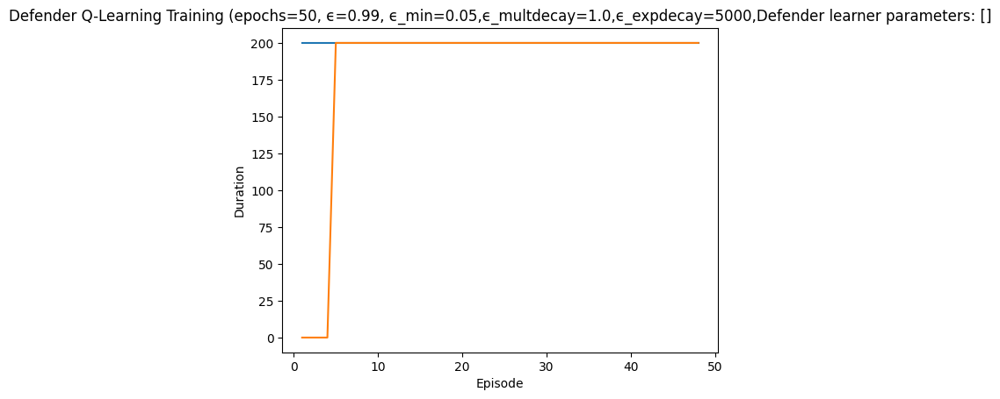

Rendering the current state of the environment
  ## Episode: 49/50 'Defender Q-Learning Training' ϵ=0.1878, Defender learner parameters: []


Episode 49|Iteration 27|reward:  165.0|last_reward_at:   23|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 5, 'parameter': 0}
3 5 0
action type:  Allow Traffic
Iteration 1: Action Taken: Type=Allow Traffic, NodeID=5, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 9601, 'successful_actions': 3622, 'failed_actions': 5979}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on 

Episode 49|Iteration 78|reward:  370.0|last_reward_at:   78|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 13, 'parameter': 0}
2 13 0
action type:  Reimage Node
Iteration 28: Action Taken: Type=Reimage Node, NodeID=13, Parameter=0
info {'action': 'allow_traffic', 'status': 'success', 'node_id': '12_WindowsNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 9628, 'successful_actions': 3633, 'failed_actions': 5995}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
0 2 3
{'action_type': 0, 'node_id': 2, 'parameter': 3}
[DEBUG] Received action: {'action_type': 0, 'node_id': 2, 'parameter': 3}
0 2 3
action type:  Reimage Node
Iteration 29: Action Take

Episode 49|Iteration 80|reward:  360.0|last_reward_at:   78|Elapsed Time: 0:00:00||

 Start Service
Iteration 79: Action Taken: Type=Start Service, NodeID=5, Parameter=9
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 9679, 'successful_actions': 3648, 'failed_actions': 6031}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 10, 'parameter': 0}
4 10 0
action type:  Start Service
Iteration 80: Action Taken: Type=Start Service, NodeID=10, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 

Episode 49|Iteration 91|reward:  425.0|last_reward_at:   90|Elapsed Time: 0:00:00||

1 6 3
{'action_type': 1, 'node_id': 6, 'parameter': 3}
[DEBUG] Received action: {'action_type': 1, 'node_id': 6, 'parameter': 3}
1 6 3
action type:  Block Traffic
Iteration 81: Action Taken: Type=Block Traffic, NodeID=6, Parameter=3
info {'action': 'block_traffic', 'status': 'success', 'node_id': '5_LinuxNode', 'port_name': 3, 'performance_metrics': {'actions_taken': 9681, 'successful_actions': 3649, 'failed_actions': 6032}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 7, 'parameter': 0}
0 7 0
action type:  Reimage Node
Iteration 82: Action Taken: T

Episode 49|Iteration 135|reward:  805.0|last_reward_at:  134|Elapsed Time: 0:00:00||


Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 12, 'parameter': 0}
4 12 0
action type:  Start Service
Iteration 93: Action Taken: Type=Start Service, NodeID=12, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 9693, 'successful_actions': 3652, 'failed_actions': 6041}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active:

Episode 49|Iteration 138|reward:  790.0|last_reward_at:  134|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 0, 'parameter': 0}
4 0 0
action type:  Start Service
Iteration 137: Action Taken: Type=Start Service, NodeID=0, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 9737, 'successful_actions': 3672, 'failed_actions': 6065}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action ba

Episode 49|Iteration 148|reward:  860.0|last_reward_at:  148|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 0, 'node_id': 10, 'parameter': 0}
0 10 0
action type:  Reimage Node
Iteration 139: Action Taken: Type=Reimage Node, NodeID=10, Parameter=0
info {'action': 'reimage_node', 'status': 'unnecessary', 'node_id': '9_LinuxNode', 'reason': 'Reimaging not required - no agent installed', 'performance_metrics': {'actions_taken': 9739, 'successful_actions': 3672, 'failed_actions': 6067}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
4 5 3
{'action_type': 4, 'node_id': 5, 'parameter': 3}
[DEBUG] Received action: {'action_type': 4, 'node_id': 5, 'parameter': 3}
4 5 3
action typ

Episode 49|Iteration 193|reward: 1045.0|last_reward_at:  193|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 4, 'node_id': 7, 'parameter': 0}
4 7 0
action type:  Start Service
Iteration 150: Action Taken: Type=Start Service, NodeID=7, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service already running or not found', 'action': 'start_service', 'performance_metrics': {'actions_taken': 9750, 'successful_actions': 3677, 'failed_actions': 6073}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action ba

Episode 49|Iteration 194|reward: 1040.0|last_reward_at:  193|Elapsed Time: 0:00:00||


No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 5, 'parameter': 0}
3 5 0
action type:  Allow Traffic
Iteration 194: Action Taken: Type=Allow Traffic, NodeID=5, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 9794, 'successful_actions': 3690, 'failed_actions': 6104}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 2, 'node_id': 7, 'parameter': 0}
2 7 0
a

Episode 49|Iteration 200|reward: 1100.0|last_reward_at:  199|Elapsed Time: 0:00:00||



Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
3 11 8
{'action_type': 3, 'node_id': 11, 'parameter': 8}
[DEBUG] Received action: {'action_type': 3, 'node_id': 11, 'parameter': 8}
3 11 8
action type:  Allow Traffic
Iteration 196: Action Taken: Type=Allow Traffic, NodeID=11, Parameter=8
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 9796, 'successful_actions': 3691, 'failed_actions': 6105}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received acti

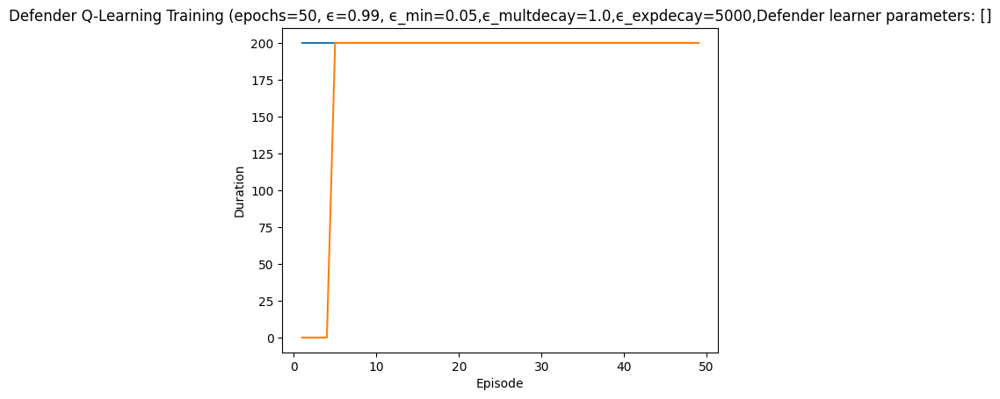

Rendering the current state of the environment
  ## Episode: 50/50 'Defender Q-Learning Training' ϵ=0.1824, Defender learner parameters: []


Episode 50|Iteration 10|reward:  -30.0|last_reward_at:    7|Elapsed Time: 0:00:00||

1 0 6
{'action_type': 1, 'node_id': 0, 'parameter': 6}
[DEBUG] Received action: {'action_type': 1, 'node_id': 0, 'parameter': 6}
1 0 6
action type:  Block Traffic
Iteration 1: Action Taken: Type=Block Traffic, NodeID=0, Parameter=6
info {'action': 'block_traffic', 'status': 'failed', 'node_id': 'start', 'port_name': 6, 'reason': 'Machine not running', 'performance_metrics': {'actions_taken': 9801, 'successful_actions': 3693, 'failed_actions': 6108}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 7, 'parameter': 0}
3 7 0
action type:  Allow Traffic
Ite

Episode 50|Iteration 13|reward:  -45.0|last_reward_at:    7|Elapsed Time: 0:00:00||

Allow Traffic
Iteration 11: Action Taken: Type=Allow Traffic, NodeID=10, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_service', 'performance_metrics': {'actions_taken': 9811, 'successful_actions': 3694, 'failed_actions': 6117}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 3, 'node_id': 7, 'parameter': 0}
3 7 0
action type:  Allow Traffic
Iteration 12: Action Taken: Type=Allow Traffic, NodeID=7, Parameter=0
info {'status': 'unnecessary', 'reason': 'Service not running or not found', 'action': 'stop_servic

Episode 50|Iteration 19|reward:  -15.0|last_reward_at:   16|Elapsed Time: 0:00:00||

firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the current state
[DEBUG] Received action: {'action_type': 1, 'node_id': 4, 'parameter': 0}
1 4 0
action type:  Block Traffic
Iteration 14: Action Taken: Type=Block Traffic, NodeID=4, Parameter=0
info {'action': 'block_traffic', 'status': 'success', 'node_id': '3_LinuxNode', 'port_name': 0, 'performance_metrics': {'actions_taken': 9814, 'successful_actions': 3695, 'failed_actions': 6119}, 'network_availability': 1.0}
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
Updating Q-matrix for state=140, action=0, next_state=-1
Accessing Q-matrix with state=140, action=0
firewall_active: 1.4000000000000001, infected_nodes: 0.0, services_active: 0.0, calculated state: 140
No infected nodes detected. Choosing a preventive action.
Choosing action based on the cu

Episode 50|Iteration 69|reward:  305.0|last_reward_at:   69|Elapsed Time: 0:00:00||

In [ ]:
random.seed(120394016)
#%matplotlib inline
trained_defender = epsilon_greedy_defender_training(
    cyberbattle_gym_env=gym_env,
    environment_properties=ep,
    learner=learner2,
    episode_count=50,
    iteration_count=200,
    epsilon=0.99,
    epsilon_exponential_decay=5000,
    epsilon_minimum=0.05,
    epsilon_multdecay=0.99999999999999999999,  # 0.999,,
    verbosity=logging.INFO,
    render=True,
    plot_episodes_length=True,
    title="Defender Q-Learning Training"
)

# Initialise Both Agents

In [ ]:
trained_attacker['learner'] 

In [ ]:
attacker_learner = trained_attacker['learner']
defender_learner = trained_defender['learner']

In [ ]:
#this was made due to issues where the attacker q learner needed to use a wrapper environment
from cyberbattle.agents.baseline.agent_wrapper import AgentWrapper, StateAugmentation
def wrap_environment(env):
    initial_observation = env.reset()  
    state = StateAugmentation(initial_observation)  
    return AgentWrapper(env, state)



In [ ]:
import gym

gym_env = gym.make('CyberBattleChain-v0',
    size=12,
    attacker_goal=AttackerGoal(
        own_atleast=0,
        own_atleast_percent=1.0
    ),
    defender_constraint=DefenderConstraint(
        maintain_sla=0.80
    )
)

defender_name = "DefenderName" 
defender_agent = DefenderWrapper(gym_env,defender_name)

gym_environment = gym.make('CyberBattleChain-v0',
    size=12,
    attacker_goal=AttackerGoal(
        own_atleast=0,
        own_atleast_percent=1.0
    ),
    defender_constraint=DefenderConstraint(
        maintain_sla=0.80
    ),
    defender_agent=defender_agent
)



In [ ]:
gym_environment.environment
gym_environment.network.nodes
gym_environment.action_space

In [ ]:
gym_environment.observation_space

In [ ]:
import inspect
print(inspect.signature(gym_environment.step))

In [ ]:
attacker_rewards_per_episode = []
defender_rewards_per_episode = []
attacker_total_reward = 0
defender_total_reward = 0
attacker_total_reward += attacker_reward
defender_total_reward += defender_reward
attacker_rewards_per_episode.append(attacker_total_reward)
defender_rewards_per_episode.append(defender_total_reward)
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.pyplot as plt

number_of_episodes = 100
max_steps_per_episode = 100
wrapped_env = wrap_environment(gym_environment)
attacker_epsilon = 0.1
defender_epsilon = 0.1

attacker_rewards_per_episode = []
defender_rewards_per_episode = []

for episode in range(number_of_episodes):
    observation = wrapped_env.reset()
    done = False
    attacker_total_reward = 0
    defender_total_reward = 0

    for step in range(max_steps_per_episode):
        # Attacker's turn
        if np.random.random() < attacker_epsilon:
            _, attacker_action, _ = attacker_learner.explore(wrapped_env)
        else:
            _, attacker_action, _ = attacker_learner.exploit(wrapped_env, observation)
        
        if attacker_action is not None:
            observation, attacker_reward, done, _ = gym_environment.step(attacker_action)
            attacker_total_reward += attacker_reward

        # Defender's turn
        if np.random.random() < defender_epsilon:
            _, defender_action, _ = defender_learner.explore(wrapped_env)
        else:
            _, defender_action, _ = defender_learner.exploit(wrapped_env, observation)
        
        if defender_action is not None:
            observation, defender_reward, done, _ = gym_environment.step(defender_action)
            defender_total_reward += defender_reward
        
        if done:
            break

    attacker_rewards_per_episode.append(attacker_total_reward)
    defender_rewards_per_episode.append(defender_total_reward)
    print(f"Episode {episode + 1}: Attacker Reward = {attacker_total_reward}, Defender Reward = {defender_total_reward}")

wrapped_env.close()

# Plotting
episodes = range(1, number_of_episodes + 1)
plt.figure(figsize=(12, 6))
plt.plot(episodes, attacker_rewards_per_episode, label='Attacker Rewards')
plt.plot(episodes, defender_rewards_per_episode, label='Defender Rewards')
plt.title('Attacker vs Defender Rewards per Episode')
plt.xlabel('Episode')
plt.ylabel('Cumulative Reward')
plt.legend()
plt.show()

episodes = range(1, 101)

plt.figure(figsize=(12, 6))
plt.plot(episodes, attacker_rewards_per_episode, label='Attacker Rewards')
plt.plot(episodes, defender_rewards_per_episode, label='Defender Rewards')
plt.title('Attacker vs Defender Rewards per Episode')
plt.xlabel('Episode')
plt.ylabel('Cumulative Reward')
plt.legend()
plt.show()


In [ ]:
number_of_episodes = 100
max_steps_per_episode = 100
wrapped_env = wrap_environment(gym_environment)
attacker_epsilon = 0.1
defender_epsilon = 0.1

for episode in range(100):
    total_reward = 0
    observation = wrapped_env.reset()
    done=False
    for step in range(100):
        # Attacker's turn
        if np.random.random() < attacker_epsilon:
            _, attacker_action, _ = attacker_learner.explore(wrapped_env)
            #print("Attacker action before passing to step:", attacker_action)
        else:
            _, attacker_action, _ = attacker_learner.exploit(wrapped_env, observation)
            #print("Attacker action before passing to step:", attacker_action)
        
        if attacker_action is not None:
            #print("Attacker action before passing to step:", attacker_action)
            observation, attacker_reward, done, _ = gym_environment.step(attacker_action)
            total_reward += attacker_reward

        # Defender's turn
        
        if np.random.random() < defender_epsilon:
            print('executing next line explore')
            wrapped_env.reset()
            _, defender_action, _ = defender_learner.explore(wrapped_env)
            print("Defender action before passing to step:", defender_action)
        else:
            #observation = defender_learner.defender.get_observation()  # Use defender to get the current observation
            #print('observation',observation)
            print('executing next line')
            _, defender_action, _ = defender_learner.exploit(wrapped_env, observation)
            print(defender_action)
            #print("Defender action before passing to exploit step:", defender_action)

        #print(defender_action)
        if defender_action is not None:
            #print(defender_action['action_type'])
            observation, defender_reward, done, _ = gym_environment.step(defender_action)
            total_reward += defender_reward
        #observation = wrapped_env.reset()
        
        if done:
            break
        
            

    print(f"Episode {episode + 1}: Total reward = {total_reward}")

wrapped_env.close()

In [ ]:
multidecay0999999999_5000 = [[-5, 25, -5, 25, -5, -5, 25, -5, -15, -5],
  [25, -5, 25, 25, -5, -15, -5, 25, 25, -5],
  [-15, -15, 25, 25, -15, 25, 25, 25, 25, 25],
  [-15, -15, -15, -5, -5, -15, 25, -15, 25, -5],
  [25, -15, 25, -15, 25, 25, -15, 25, 25, -5],
  [25, 25, 25, 25, 25, -15, -15, 25, -15, 25],
  [-5, -15, 25, 25, 25, -15, 25, 25, 25, -15],
  [25, -15, -5, 25, -5, 25, 25, 25, -15, -15],
  [25, -15, -15, -15, 25, -5, 25, 25, 25, -15],
  [25, -15, -15, -15, 25, -5, 25, -15, -5, -15],
  [-5, -5, -15, -15, -5, -15, 25, -5, 25, -15],
  [-15, -15, -15, -15, 25, 25, -15, -5, 25, 25],
  [25, -5, -5, 25, -15, -15, 25, -5, -15, -5],
  [-15, -15, -5, 25, -15, 25, 25, 25, 25, 25],
  [-5, -15, -5, -5, -15, -15, -5, -15, 25, -5],
  [-15, -15, -5, -15, -15, 25, -15, -15, 25, -15],
  [-5, 25, 25, -15, -5, -5, -5, 25, 25, -15],
  [-15, -15, 25, -5, 25, -5, -15, -5, -15, -5],
  [-15, -15, -15, 25, 25, -5, -15, -5, 25, -5],
  [25, -5, -15, -15, 25, 25, -15, -15, 25, -15],
  [25, -5, 25, 25, -15, -15, 25, -5, 25, -15],
  [25, -15, 25, 25, -15, -15, 25, -15, 25, -5],
  [25, 25, 25, -5, 25, -15, -5, -15, -15, -15],
  [-15, -5, -15, -5, -15, -5, 25, 25, -15, 25],
  [-15, 25, -15, -15, -15, -15, 25, 25, 25, -15],
  [-15, -15, -15, -15, -5, 25, -15, -15, -15, -15],
  [25, -15, -15, 25, -15, -15, -15, 25, -15, -5],
  [25, -15, -5, -5, 25, 25, -15, -15, -15, -5],
  [-5, -15, 25, -5, 25, 25, 25, -15, 25, 25],
  [25, 25, -15, 25, -15, -15, 25, -5, -15, 25],
  [-5, -15, 25, -15, 25, 25, 25, 25, -5, 25],
  [25, -5, 25, -15, -15, -15, -15, -15, 25, -15],
  [-15, 25, 25, 25, 25, -15, 25, 25, -15, -15],
  [-15, -15, -15, -15, -15, 25, 25, 25, 25, 25],
  [-15, -5, 25, -5, -15, -5, 25, 25, -5, -15],
  [-15, -15, 25, 25, 25, 25, -5, 25, -5, 25],
  [25, -15, -15, 25, 25, -15, 25, 25, -15, 25],
  [25, -5, -15, 25, -15, 25, -5, 25, -15, 25],
  [-15, 25, -15, 25, 25, 25, -5, -5, 25, -5],
  [-15, 25, -5, -15, -5, 25, 25, -15, -15, -5],
  [25, 25, -15, -5, -15, -15, -15, -15, -5, -15],
  [-15, 25, -15, 25, -15, 25, -15, 25, -15, 25],
  [-15, 25, 25, 25, -15, 25, -15, -15, -15, -5],
  [25, 25, 25, 25, -15, -5, 25, 25, -15, -15],
  [-15, -5, -5, -5, -15, -15, 25, -15, -15, 25],
  [-15, -5, 25, -5, -5, 25, 25, 25, -15, 25],
  [25, 25, 25, 25, 25, -15, 25, -15, -15, 25],
  [-15, -15, -15, -15, 25, -5, -5, -15, 25, -15],
  [25, -15, 25, -5, 25, -5, -5, 25, -5, 25],
  [25, -15, -15, -5, -15, -5, 25, -5, -15, -15],
  [25, 25, 25, 25, 25, -15, 25, -15, -15, 25],
  [25, 25, -5, 25, -15, 25, -5, -15, 25, 25],
  [25, 25, -15, -15, -15, -5, -5, 25, 25, -5],
  [25, -15, 25, -15, -5, -15, -15, -15, 25, 25],
  [25, -15, 25, -15, 25, -15, 25, -15, 25, -15],
  [25, -5, -15, -15, -15, 25, -15, -5, 25, 25],
  [-15, -15, -15, 25, -15, -5, -15, 25, 25, 25],
  [25, -15, 25, 25, -5, -15, -15, -15, 25, -5],
  [-15, 25, -15, 25, 25, -5, -15, -15, -5, -15],
  [-5, -5, 25, -15, 25, -15, 25, -15, -15, -15],
  [25, -15, -15, 25, -15, 25, -15, 25, 25, -15],
  [25, -15, -5, 25, -15, -15, -5, 25, 25, -15],
  [25, 25, -15, 25, -15, -15, -5, -15, -5, -15],
  [-15, -5, -15, 25, -15, -15, -5, 25, 25, -5],
  [-15, 25, -5, 25, 25, 25, 25, 25, -15, -5],
  [25, 25, 25, 25, -15, -15, 25, 25, -5, 25],
  [25, -15, 25, -15, -15, 25, 25, -15, 25, -15],
  [-15, 25, -15, 25, 25, 25, -15, -5, -15, -5],
  [-15, -15, 25, 25, 25, -15, -15, -5, -15, 25],
  [-15, 25, -5, -15, -15, -5, -15, -15, 25, -5],
  [-5, -15, -15, 25, 25, 25, -5, -15, 25, -5],
  [25, -15, 25, -5, 25, 25, 25, 25, 25, -15],
  [-5, -15, -15, 25, -15, -5, -15, -5, 25, 25],
  [-15, -5, -15, 25, 25, 25, -5, -15, 25, -15],
  [-15, -15, -5, -5, -15, -15, 25, -15, -15, -15],
  [-15, -15, 25, 25, -5, -15, -5, 25, -15, 25],
  [-15, -15, -5, 25, -15, 25, 25, -5, 25, -15],
  [-15, -15, -5, -15, 25, -5, -15, -15, -5, 25],
  [-15, 25, 25, -15, -15, -5, -5, 25, -15, -15],
  [-5, 25, -15, -5, -5, -15, 25, -15, -15, 25],
  [-15, 25, 25, 25, 25, -15, -15, 25, -15, -15],
  [-5, 25, 25, -15, -15, -15, 25, 25, -15, -15],
  [25, -15, 25, -15, 25, -15, -5, -5, 25, -5],
  [-15, 25, 25, 25, -15, -15, 25, 25, 25, 25],
  [-15, 25, 25, 25, -5, -5, -5, 25, -15, 25],
  [25, -5, 25, -15, -15, -5, 25, -5, 25, -5],
  [25, 25, -15, -15, -15, -15, -15, -15, 25, 25],
  [25, -15, -5, -15, -15, -5, -5, -5, 25, 25],
  [-15, 25, 25, -15, -5, -15, -15, -15, -15, 25],
  [-5, -15, -15, -15, -5, 25, 25, -15, 25, -15],
  [-5, -15, -15, -15, 25, -15, 25, -15, -15, 25],
  [25, 25, 25, 25, -15, -15, 25, 25, -15, -15],
  [-15, -15, 25, -15, 25, -5, 25, -5, -5, 25],
  [-5, -15, 25, -15, -15, -15, -5, 25, 25, 25],
  [25, 25, 25, -15, 25, -5, 25, 25, -15, 25],
  [-15, -15, -15, 25, 25, -5, -15, 25, 25, 25],
  [25, -15, 25, -15, -5, 25, -15, -5, 25, 25],
  [-5, 25, -15, -15, 25, 25, -15, -15, -15, -5],
  [25, -5, -15, -15, -15, -15, -15, -15, 25, -5],
  [25, 25, 25, 25, -5, -15, 25, -15, 25, -15]]


multidecay099999999_2550 =[[-5, 25, -5, 25, -5, -5, 25, -5, -15, -5],
  [25, -5, 25, 25, -5, -15, -5, 25, 25, -5],
  [-15, -15, 25, 25, -15, 25, 25, 25, 25, 25],
  [-15, -15, -15, -5, -5, -15, 25, -15, 25, -5],
  [25, -15, 25, -15, 25, 25, -15, 25, 25, -5],
  [25, 25, 25, 25, 25, -15, -15, 25, -15, 25],
  [-5, -15, 25, 25, 25, -15, 25, 25, 25, -15],
  [25, -15, -5, 25, -5, 25, 25, 25, -15, -15],
  [25, -15, -15, -15, 25, -5, 25, 25, 25, -15],
  [25, -15, -15, -15, 25, -5, 25, -15, -5, -15],
  [-5, -5, -15, -15, -5, -15, 25, -5, 25, -15],
  [-15, -15, -15, -15, 25, 25, -15, -5, 25, 25],
  [25, -5, -5, 25, -15, -15, 25, -5, -15, -5],
  [-15, -15, -5, 25, -15, 25, 25, 25, 25, 25],
  [-5, -15, -5, -5, -15, -15, -5, -15, 25, -5],
  [-15, -15, -5, -15, -15, 25, -15, -15, 25, -15],
  [-5, 25, 25, -15, -5, -5, -5, 25, 25, -15],
  [-15, -15, 25, -5, 25, -5, -15, -5, -15, -5],
  [-15, -15, -15, 25, 25, -5, -15, -5, 25, -5],
  [25, -5, -15, -15, 25, 25, -15, -15, 25, -15],
  [25, -5, 25, 25, -15, -15, 25, -5, 25, -15],
  [25, -15, 25, 25, -15, -15, 25, -15, 25, -5],
  [25, 25, 25, -5, 25, -15, -5, -15, -15, -15],
  [-15, -5, -15, -5, -15, -5, 25, 25, -15, 25],
  [-15, 25, -15, -15, -15, -15, 25, 25, 25, -15],
  [-15, -15, -15, -15, -5, 25, -15, -15, -15, -15],
  [25, -15, -15, 25, -15, -15, -15, 25, -15, -5],
  [25, -15, -5, -5, 25, 25, -15, -15, -15, -5],
  [-5, -15, 25, -5, 25, 25, 25, -15, 25, 25],
  [25, 25, -15, 25, -15, -15, 25, -5, -15, 25],
  [-5, -15, 25, -15, 25, 25, 25, 25, -5, 25],
  [25, -5, 25, -15, -15, -15, -15, -15, 25, -15],
  [-15, 25, 25, 25, 25, -15, 25, 25, -15, -15],
  [-15, -15, -15, -15, -15, 25, 25, 25, 25, 25],
  [-15, -5, 25, -5, -15, -5, 25, 25, -5, -15],
  [-15, -15, 25, 25, 25, 25, -5, 25, -5, 25],
  [25, -15, -15, 25, 25, -15, 25, 25, -15, 25],
  [25, -5, -15, 25, -15, 25, -5, 25, -15, 25],
  [-15, 25, -15, 25, 25, 25, -5, -5, 25, -5],
  [-15, 25, -5, -15, -5, 25, 25, -15, -15, -5],
  [25, 25, -15, -5, -15, -15, -15, -15, -5, -15],
  [-15, 25, -15, 25, -15, 25, -15, 25, -15, 25],
  [-15, 25, 25, 25, -15, 25, -15, -15, -15, -5],
  [25, 25, 25, 25, -15, -5, 25, 25, -15, -15],
  [-15, -5, -5, -5, -15, -15, 25, -15, -15, 25],
  [-15, -5, 25, -5, -5, 25, 25, 25, -15, 25],
  [25, 25, 25, 25, 25, -15, 25, -15, -15, 25],
  [-15, -15, -15, -15, 25, -5, -5, -15, 25, -15],
  [25, -15, 25, -5, 25, -5, -5, 25, -5, 25],
  [25, -15, -15, -5, -15, -5, 25, -5, -15, -15],
  [25, 25, 25, 25, 25, -15, 25, -15, -15, 25],
  [25, 25, -5, 25, -15, 25, -5, -15, 25, 25],
  [25, 25, -15, -15, -15, -5, -5, 25, 25, -5],
  [25, -15, 25, -15, -5, -15, -15, -15, 25, 25],
  [25, -15, 25, -15, 25, -15, 25, -15, 25, -15],
  [25, -5, -15, -15, -15, 25, -15, -5, 25, 25],
  [-15, -15, -15, 25, -15, -5, -15, 25, 25, 25],
  [25, -15, 25, 25, -5, -15, -15, -15, 25, -5],
  [-15, 25, -15, 25, 25, -5, -15, -15, -5, -15],
  [-5, -5, 25, -15, 25, -15, 25, -15, -15, -15],
  [25, -15, -15, 25, -15, 25, -15, 25, 25, -15],
  [25, -15, -5, 25, -15, -15, -5, 25, 25, -15],
  [25, 25, -15, 25, -15, -15, -5, -15, -5, -15],
  [-15, -5, -15, 25, -15, -15, -5, 25, 25, -5],
  [-15, 25, -5, 25, 25, 25, 25, 25, -15, -5],
  [25, 25, 25, 25, -15, -15, 25, 25, -5, 25],
  [25, -15, 25, -15, -15, 25, 25, -15, 25, -15],
  [-15, 25, -15, 25, 25, 25, -15, -5, -15, -5],
  [-15, -15, 25, 25, 25, -15, -15, -5, -15, 25],
  [-15, 25, -5, -15, -15, -5, -15, -15, 25, -5],
  [-5, -15, -15, 25, 25, 25, -5, -15, 25, -5],
  [25, -15, 25, -5, 25, 25, 25, 25, 25, -15],
  [-5, -15, -15, 25, -15, -5, -15, -5, 25, 25],
  [-15, -5, -15, 25, 25, 25, -5, -15, 25, -15],
  [-15, -15, -5, -5, -15, -15, 25, -15, -15, -15],
  [-15, -15, 25, 25, -5, -15, -5, 25, -15, 25],
  [-15, -15, -5, 25, -15, 25, 25, -5, 25, -15],
  [-15, -15, -5, -15, 25, -5, -15, -15, -5, 25],
  [-15, 25, 25, -15, -15, -5, -5, 25, -15, -15],
  [-5, 25, -15, -5, -5, -15, 25, -15, -15, 25],
  [-15, 25, 25, 25, 25, -15, -15, 25, -15, -15],
  [-5, 25, 25, -15, -15, -15, 25, 25, -15, -15],
  [25, -15, 25, -15, 25, -15, -5, -5, 25, -5],
  [-15, 25, 25, 25, -15, -15, 25, 25, 25, 25],
  [-15, 25, 25, 25, -5, -5, -5, 25, -15, 25],
  [25, -5, 25, -15, -15, -5, 25, -5, 25, -5],
  [25, 25, -15, -15, -15, -15, -15, -15, 25, 25],
  [25, -15, -5, -15, -15, -5, -5, -5, 25, 25],
  [-15, 25, 25, -15, -5, -15, -15, -15, -15, 25],
  [-5, -15, -15, -15, -5, 25, 25, -15, 25, -15],
  [-5, -15, -15, -15, 25, -15, 25, -15, -15, 25],
  [25, 25, 25, 25, -15, -15, 25, 25, -15, -15],
  [-15, -15, 25, -15, 25, -5, 25, -5, -5, 25],
  [-5, -15, 25, -15, -15, -15, -5, 25, 25, 25],
  [25, 25, 25, -15, 25, -5, 25, 25, -15, 25],
  [-15, -15, -15, 25, 25, -5, -15, 25, 25, 25],
  [25, -15, 25, -15, -5, 25, -15, -5, 25, 25],
  [-5, 25, -15, -15, 25, 25, -15, -15, -15, -5],
  [25, -5, -15, -15, -15, -15, -15, -15, 25, -5],
  [25, 25, 25, 25, -5, -15, 25, -15, 25, -15]]

multidecay0999_2550 = [[-5, 25, -5, 25, -5, -5, 25, -5, -15, -5],
  [25, -5, 25, 25, -5, -15, -5, 25, 25, -5],
  [-15, -15, 25, 25, -15, 25, 25, 25, 25, 25],
  [-15, -15, -15, -5, -5, -15, 25, -15, 25, -5],
  [25, -15, 25, -15, 25, 25, -15, 25, 25, -5],
  [25, 25, 25, 25, 25, -15, -15, 25, -15, 25],
  [-5, -15, 25, 25, 25, -15, 25, 25, 25, -15],
  [25, -15, -5, 25, -5, 25, 25, 25, -15, -15],
  [25, -15, -15, -15, 25, -5, 25, 25, 25, -15],
  [25, -15, -15, -15, 25, -5, 25, -15, -5, -15],
  [-5, -5, -15, -15, -5, -15, 25, -5, 25, -15],
  [-15, -15, -15, -15, 25, 25, -15, -5, 25, 25],
  [25, -5, -5, 25, -15, -15, 25, -5, -15, -5],
  [-15, -15, -5, 25, -15, 25, 25, 25, 25, 25],
  [-5, -15, -5, -5, -15, -15, -5, -15, 25, -5],
  [-15, -15, -5, -15, -15, 25, -15, -15, 25, -15],
  [-5, 25, 25, -15, -5, -5, -5, 25, 25, -15],
  [-15, -15, 25, -5, 25, -5, -15, -5, -15, -5],
  [-15, -15, -15, 25, 25, -5, -15, -5, 25, -5],
  [25, -5, -15, -15, 25, 25, -15, -15, 25, -15],
  [25, -5, 25, 25, -15, -15, 25, -5, 25, -15],
  [25, -15, 25, 25, -15, -15, 25, -15, 25, -5],
  [25, 25, 25, -5, 25, -15, -5, -15, -15, -15],
  [-15, -5, -15, -5, -15, -5, 25, 25, -15, 25],
  [-15, 25, -15, -15, -15, -15, 25, 25, 25, -15],
  [-15, -15, -15, -15, -5, 25, -15, -15, -15, -15],
  [25, -15, -15, 25, -15, -15, -15, 25, -15, -5],
  [25, -15, -5, -5, 25, 25, -15, -15, -15, -5],
  [-5, -15, 25, -5, 25, 25, 25, -15, 25, 25],
  [25, 25, -15, 25, -15, -15, 25, -5, -15, 25],
  [-5, -15, 25, -15, 25, 25, 25, 25, -5, 25],
  [25, -5, 25, -15, -15, -15, -15, -15, 25, -15],
  [-15, 25, 25, 25, 25, -15, 25, 25, -15, -15],
  [-15, -15, -15, -15, -15, 25, 25, 25, 25, 25],
  [-15, -5, 25, -5, -15, -5, 25, 25, -5, -15],
  [-15, -15, 25, 25, 25, 25, -5, 25, -5, 25],
  [25, -15, -15, 25, 25, -15, 25, 25, -15, 25],
  [25, -5, -15, 25, -15, 25, -5, 25, -15, 25],
  [-15, 25, -15, 25, 25, 25, -5, -5, 25, -5],
  [-15, 25, -5, -15, -5, 25, 25, -15, -15, -5],
  [25, 25, -15, -5, -15, -15, -15, -15, -5, -15],
  [-15, 25, -15, 25, -15, 25, -15, 25, -15, 25],
  [-15, 25, 25, 25, -15, 25, -15, -15, -15, -5],
  [25, 25, 25, 25, -15, -5, 25, 25, -15, -15],
  [-15, -5, -5, -5, -15, -15, 25, -15, -15, 25],
  [-15, -5, 25, -5, -5, 25, 25, 25, -15, 25],
  [25, 25, 25, 25, 25, -15, 25, -15, -15, 25],
  [-15, -15, -15, -15, 25, -5, -5, -15, 25, -15],
  [25, -15, 25, -5, 25, -5, -5, 25, -5, 25],
  [25, -15, -15, -5, -15, -5, 25, -5, -15, -15],
  [25, 25, 25, 25, 25, -15, 25, -15, -15, 25],
  [25, 25, -5, 25, -15, 25, -5, -15, 25, 25],
  [25, 25, -15, -15, -15, -5, -5, 25, 25, -5],
  [25, -15, 25, -15, -5, -15, -15, -15, 25, 25],
  [25, -15, 25, -15, 25, -15, 25, -15, 25, -15],
  [25, -5, -15, -15, -15, 25, -15, -5, 25, 25],
  [-15, -15, -15, 25, -15, -5, -15, 25, 25, 25],
  [25, -15, 25, 25, -5, -15, -15, -15, 25, -5],
  [-15, 25, -15, 25, 25, -5, -15, -15, -5, -15],
  [-5, -5, 25, -15, 25, -15, 25, -15, -15, -15],
  [25, -15, -15, 25, -15, 25, -15, 25, 25, -15],
  [25, -15, -5, 25, -15, -15, -5, 25, 25, -15],
  [25, 25, -15, 25, -15, -15, -5, -15, -5, -15],
  [-15, -5, -15, 25, -15, -15, -5, 25, 25, -5],
  [-15, 25, -5, 25, 25, 25, 25, 25, -15, -5],
  [25, 25, 25, 25, -15, -15, 25, 25, -5, 25],
  [25, -15, 25, -15, -15, 25, 25, -15, 25, -15],
  [-15, 25, -15, 25, 25, 25, -15, -5, -15, -5],
  [-15, -15, 25, 25, 25, -15, -15, -5, -15, 25],
  [-15, 25, -5, -15, -15, -5, -15, -15, 25, -5],
  [-5, -15, -15, 25, 25, 25, -5, -15, 25, -5],
  [25, -15, 25, -5, 25, 25, 25, 25, 25, -15],
  [-5, -15, -15, 25, -15, -5, -15, -5, 25, 25],
  [-15, -5, -15, 25, 25, 25, -5, -15, 25, -15],
  [-15, -15, -5, -5, -15, -15, 25, -15, -15, -15],
  [-15, -15, 25, 25, -5, -15, -5, 25, -15, 25],
  [-15, -15, -5, 25, -15, 25, 25, -5, 25, -15],
  [-15, -15, -5, -15, 25, -5, -15, -15, -5, 25],
  [-15, 25, 25, -15, -15, -5, -5, 25, -15, -15],
  [-5, 25, -15, -5, -5, -15, 25, -15, -15, 25],
  [-15, 25, 25, 25, 25, -15, -15, 25, -15, -15],
  [-5, 25, 25, -15, -15, -15, 25, 25, -15, -15],
  [25, -15, 25, -15, 25, -15, -5, -5, 25, -5],
  [-15, 25, 25, 25, -15, -15, 25, 25, 25, 25],
  [-15, 25, 25, 25, -5, -5, -5, 25, -15, 25],
  [25, -5, 25, -15, -15, -5, 25, -5, 25, -5],
  [25, 25, -15, -15, -15, -15, -15, -15, 25, 25],
  [25, -15, -5, -15, -15, -5, -5, -5, 25, 25],
  [-15, 25, 25, -15, -5, -15, -15, -15, -15, 25],
  [-5, -15, -15, -15, -5, 25, 25, -15, 25, -15],
  [-5, -15, -15, -15, 25, -15, 25, -15, -15, 25],
  [25, 25, 25, 25, -15, -15, 25, 25, -15, -15],
  [-15, -15, 25, -15, 25, -5, 25, -5, -5, 25],
  [-5, -15, 25, -15, -15, -15, -5, 25, 25, 25],
  [25, 25, 25, -15, 25, -5, 25, 25, -15, 25],
  [-15, -15, -15, 25, 25, -5, -15, 25, 25, 25],
  [25, -15, 25, -15, -5, 25, -15, -5, 25, 25],
  [-5, 25, -15, -15, 25, 25, -15, -15, -15, -5],
  [25, -5, -15, -15, -15, -15, -15, -15, 25, -5],
  [25, 25, 25, 25, -5, -15, 25, -15, 25, -15]]

epsilon_decay_2550 = [[25, 25, -5, -15, 25, -15, -5, 25, -15, -15],
  [25, -5, -5, 25, 25, 25, -5, -15, 25, -15],
  [-15, 25, 25, -15, -5, -15, -15, 25, -15, -5],
  [-15, 25, 25, -15, -15, -5, -15, -15, 25, 25],
  [-15, 25, -15, 25, -15, -5, -5, -5, -15, -15],
  [25, 25, 25, 25, 25, -15, 25, -15, -15, 25],
  [-5, -15, -15, -15, -5, -5, -15, -15, 25, -5],
  [25, -15, -15, -15, 25, -5, 25, -5, -15, -15],
  [-15, 25, -15, 25, -5, -15, -15, -15, 25, -15],
  [-15, 25, -15, 25, -15, -15, 25, -15, 25, -15],
  [25, -15, -15, 25, 25, -5, 25, 25, -15, 25],
  [-5, 25, -5, -15, -15, -15, 25, -15, 25, -5],
  [25, -5, 25, 25, -5, -5, 25, -15, 25, 25],
  [-5, -5, -15, 25, -15, 25, 25, 25, 25, 25],
  [-5, -5, -15, -5, -5, 25, -15, 25, -15, -15],
  [25, 25, -15, -15, -15, -5, -5, -15, -15, 25],
  [-15, -5, -5, 25, 25, 25, 25, -15, -15, -5],
  [-15, 25, -15, -15, -15, -15, -15, -15, -15, 25],
  [25, 25, -5, -15, -5, -5, -5, -15, -5, -15],
  [-15, -15, -5, -5, -15, -5, -15, 25, 25, -15],
  [-15, -15, 25, 25, -15, 25, -15, 25, 25, 25],
  [-15, -15, -5, -15, 25, 25, -5, -5, -15, -15],
  [25, 25, -15, -15, -15, -15, 25, -5, -15, 25],
  [-15, -15, 25, 25, -15, -15, -5, -15, -15, -5],
  [-15, 25, 25, 25, -15, -5, -15, -15, 25, -5],
  [-5, -15, 25, -15, -15, -15, 25, -15, -15, -5],
  [-5, -15, -15, 25, -5, -15, 25, -15, -15, -15],
  [-15, -5, -15, -15, 25, 25, -5, 25, -15, 25],
  [25, 25, 25, -5, -15, -15, 25, 25, -5, -15],
  [25, 25, -5, 25, -15, -15, -15, -15, -15, 25],
  [-15, 25, 25, -15, -15, -5, -15, -5, -5, -5],
  [-15, 25, -15, 25, -15, -15, 25, -15, -5, -15],
  [25, 25, -5, 25, -15, 25, 25, -5, 25, 25],
  [25, -15, -15, -15, -15, 25, 25, -15, -15, 25],
  [-15, -15, -15, 25, 25, -15, -5, 25, 25, -15],
  [25, 25, -15, -5, 25, -15, -15, -5, -15, -15],
  [-5, -15, -15, 25, 25, -15, -5, -15, -15, 25],
  [25, -5, 25, -15, 25, 25, -15, -15, -15, 25],
  [25, -15, 25, -15, -15, 25, -5, 25, -15, -15],
  [-5, 25, -15, -15, -15, -15, -15, -15, 25, -15],
  [-15, 25, 25, -5, -5, -15, -15, -5, -15, 25],
  [-15, 25, -15, -15, 25, 25, -15, -15, -15, -15],
  [-15, -5, 25, -15, -15, 25, -15, 25, 25, 25],
  [-5, -15, -15, -15, 25, -15, -15, -15, -5, -5],
  [-15, -15, 25, -15, -5, -15, -15, -15, -15, -5],
  [-15, -15, -15, -5, -5, 25, 25, -15, -5, 25],
  [-5, -5, 25, -15, -15, -5, -5, 25, -15, -15],
  [25, -15, -15, 25, -15, 25, -15, 25, -15, -5],
  [-15, 25, -5, 25, -15, -15, 25, 25, -15, 25],
  [-15, -5, 25, -15, -15, -15, -15, 25, 25, 25],
  [25, -15, -15, -5, -5, 25, 25, -15, 25, -15],
  [-15, 25, -15, 25, -15, -5, -15, -15, -5, 25],
  [-15, -5, 25, -15, 25, -5, 25, -5, -5, 25],
  [-15, 25, -15, 25, -15, 25, 25, -5, -15, -5],
  [25, -5, -15, -5, 25, 25, -5, -15, -15, -5],
  [25, 25, 25, 25, 25, -15, 25, -5, 25, 25],
  [25, -5, -15, -15, -15, 25, -5, -5, -5, 25],
  [25, 25, -15, 25, -15, -5, 25, -15, -15, -15],
  [25, -15, 25, 25, -15, -5, 25, -15, -15, 25],
  [-15, 25, -15, 25, 25, -15, -15, 25, -15, -15],
  [-15, -5, -15, -15, -15, -15, -15, -5, -5, -5],
  [25, -15, 25, 25, -5, 25, -15, 25, 25, 25],
  [25, -15, 25, 25, -5, 25, -15, -15, 25, 25],
  [-5, -15, 25, 25, 25, -15, -5, -15, 25, -5],
  [25, -15, 25, -5, -15, -15, 25, -15, -15, -5],
  [-15, 25, -5, -5, -15, -15, 25, -15, 25, -15],
  [-5, -15, 25, -15, -15, 25, 25, 25, -15, 25],
  [25, -5, 25, -15, -15, 25, 25, -5, -15, -5],
  [25, -15, -15, 25, 25, 25, 25, -15, 25, -5],
  [-15, -15, -5, 25, 25, -15, -15, 25, -15, 25],
  [25, -5, -15, -5, -15, -5, 25, -15, -15, -15],
  [-15, 25, -15, -15, -15, -15, 25, -15, -15, -5],
  [25, 25, 25, 25, -15, -5, -5, 25, 25, 25],
  [-15, -15, 25, -15, 25, -15, 25, 25, -15, 25],
  [25, 25, -15, 25, -15, -15, -15, 25, -5, -5],
  [-15, 25, -5, -15, -15, -5, 25, 25, -5, -15],
  [-15, -5, -15, -15, -15, -15, -15, 25, -15, -5],
  [25, -15, 25, 25, 25, -15, -15, -15, -15, -15],
  [-15, -15, 25, 25, 25, 25, -15, -5, 25, -5],
  [-15, -15, -15, -5, -15, 25, -15, 25, 25, 25],
  [-15, -5, 25, -5, -15, -15, -15, 25, -15, 25],
  [-15, 25, -15, -15, -15, 25, -15, -5, 25, 25],
  [-15, -15, -5, -15, -5, -15, 25, -15, 25, 25],
  [-15, 25, 25, -15, -5, 25, -15, -15, -5, -5],
  [-5, -15, 25, -5, -5, -5, 25, -5, -5, 25],
  [-15, 25, -15, -15, -15, -5, 25, -15, -15, -15],
  [-15, -5, -15, 25, 25, -5, -5, -15, -15, -5],
  [25, -15, -15, 25, 25, -15, -15, -15, 25, 25],
  [25, 25, -15, 25, 25, 25, -5, 25, -15, -5],
  [-15, -5, -15, -5, 25, 25, 25, -15, -15, 25],
  [-5, 25, -15, -5, -5, 25, -5, 25, -15, -15],
  [-15, -5, -15, -5, -5, -5, -5, -15, -15, 25],
  [-15, 25, 25, -15, 25, -15, -15, -5, 25, -15],
  [25, -15, 25, -5, -15, 25, -15, -15, 25, 25],
  [-15, -5, -5, -5, -15, 25, -15, -5, 25, -15],
  [-15, -5, -15, -5, 25, 25, 25, -15, -15, 25],
  [-5, 25, 25, 25, -15, -15, -15, -15, 25, 25],
  [25, -15, -15, -5, -5, -15, 25, -15, -5, 25],
  [25, 25, 25, -15, 25, 25, -5, -15, -15, -15],
  [-5, 25, -15, 25, -15, -5, 25, -5, -15, 25]]

epsilon_2500 = [[25, -5, -5, -5, -15, 25, 25, -15, 25, -5],
  [-15, -15, -5, -5, 25, -15, -15, -15, 25, -5],
  [25, 25, 25, -15, -15, 25, -15, 25, -15, -15],
  [25, 25, 25, 25, 25, -15, -15, -15, -15, 25],
  [25, -15, -5, 25, -15, 25, -5, 25, -15, 25],
  [-15, -15, -5, 25, 25, -15, -15, 25, -5, 25],
  [25, -15, -15, -15, -15, 25, -15, -15, 25, -15],
  [-15, -15, 25, -15, -15, -5, -5, -5, -15, -15],
  [-15, -15, 25, -15, -15, -5, 25, 25, 25, -15],
  [25, -15, -5, -5, -5, -15, -15, -15, 25, 25],
  [-5, 25, -15, -15, -5, -15, 25, -15, 25, -15],
  [25, -15, -15, -15, 25, 25, -15, -5, -15, -5],
  [-15, -15, 25, 25, -15, 25, -15, 25, -15, -15],
  [-15, 25, -15, -15, 25, 25, 25, -15, -15, -5],
  [25, -5, 25, -5, -5, -15, -15, 25, 25, -5],
  [-15, -15, -15, -15, -15, -15, 25, 25, 25, 25],
  [25, -15, -15, 25, -15, -5, 25, -5, 25, -5],
  [-15, -15, -15, -5, 25, -15, -15, -5, -5, -5],
  [-15, -5, -5, -15, -5, -15, -15, -15, 25, -15],
  [-5, -15, 25, 25, 25, 25, 25, 25, -5, -15],
  [-15, 25, -15, -15, -15, 25, -5, -15, 25, -5],
  [-15, -5, -15, -5, -15, -15, -15, -5, 25, 25],
  [25, -15, -5, -15, -15, 25, -5, 25, -5, -15],
  [25, 25, 25, -15, -15, -15, 25, -5, -5, -5],
  [-15, -15, -15, -15, -15, -5, 25, -15, 25, 25],
  [-15, 25, -15, -5, -15, -15, 25, -5, 25, -15],
  [-15, 25, 25, -15, -15, 25, 25, -15, -5, -5],
  [25, -15, 25, -5, 25, 25, -15, 25, -5, -5],
  [-15, -15, 25, -15, 25, 25, 25, -15, -15, -5],
  [-15, -15, -15, 25, 25, -15, -15, 25, 25, -15],
  [-15, -15, 25, -15, -5, -5, 25, -15, 25, 25],
  [-15, -5, -5, -15, -15, -15, -15, 25, -15, -15],
  [-15, -15, -15, -5, 25, 25, 25, -5, -5, 25],
  [-15, 25, -15, -5, 25, -5, -5, -5, -15, -15],
  [25, -15, 25, 25, -15, 25, -5, -15, -15, 25],
  [-15, -15, -15, -15, -15, -5, 25, -15, -15, -15],
  [25, -5, 25, 25, 25, -15, -15, -5, -15, -15],
  [-5, -5, -15, -15, -15, -15, 25, -15, -15, 25],
  [-15, -15, 25, -5, 25, -15, -15, -15, -5, -15],
  [25, 25, 25, -15, -15, 25, 25, -15, 25, -15],
  [-15, 25, -15, 25, -15, -5, -15, 25, -15, -15],
  [-15, -15, 25, -15, 25, 25, -15, 25, -15, 25],
  [25, -15, -5, -15, 25, 25, -5, -15, 25, 25],
  [-5, -15, -15, -5, -15, -5, 25, 25, 25, 25],
  [-15, -15, 25, 25, -15, -15, 25, -5, -15, -5],
  [-15, -15, -15, 25, 25, 25, -15, -15, -15, -15],
  [-15, -5, -5, 25, 25, 25, -15, 25, 25, -15],
  [-15, -15, 25, -15, -15, 25, 25, -5, 25, -5],
  [-15, -15, -15, -15, 25, 25, 25, 25, -5, -15],
  [-15, -15, 25, -15, -15, 25, -5, -5, -15, -15],
  [-15, -15, -5, 25, -5, -15, 25, 25, -15, 25],
  [25, 25, -5, -15, 25, -15, -15, -5, -15, 25],
  [-15, 25, -15, -5, -15, 25, 25, -15, 25, 25],
  [-15, 25, -15, -5, -15, -15, -15, -5, -15, -15],
  [-5, -15, 25, -15, -5, -15, 25, -5, -15, -15],
  [25, -15, -15, 25, -15, 25, -15, -15, -5, -15],
  [-15, 25, 25, -5, 25, -5, -15, 25, -15, 25],
  [25, 25, 25, -15, -15, 25, 25, -5, -15, 25],
  [-5, 25, -5, -15, 25, 25, 25, -5, 25, -15],
  [25, -15, -15, -15, 25, 25, -15, -5, -15, 25],
  [-15, 25, -15, -15, 25, 25, 25, 25, -15, -5],
  [-5, -5, 25, -15, -15, -15, -15, 25, -15, -5],
  [-5, -15, -15, 25, 25, -15, 25, 25, 25, -15],
  [25, -15, 25, 25, -15, 25, 25, -15, -15, -15],
  [-15, -15, 25, -5, 25, 25, -5, 25, -5, 25],
  [-15, 25, -15, -15, -5, 25, -15, 25, -5, -15],
  [-15, -15, -15, -5, 25, -15, -5, -15, -15, -15],
  [-15, 25, -15, 25, -15, 25, -5, -15, -15, 25],
  [25, -5, -5, 25, -15, -15, -15, -15, -15, -5],
  [-15, -15, -15, 25, -15, -15, -15, -5, 25, 25],
  [25, 25, -5, -15, -15, -5, 25, -15, -5, -5],
  [25, -15, 25, 25, -15, 25, 25, 25, -15, 25],
  [-15, -15, 25, -5, -5, 25, 25, -5, -15, -15],
  [-5, -15, -15, -15, 25, -5, 25, -15, -15, -5],
  [-5, -5, -15, 25, -15, 25, -15, -5, -15, -15],
  [-15, -15, 25, 25, -15, -15, -5, -15, -15, -5],
  [-15, 25, -5, -5, -15, 25, 25, 25, 25, -15],
  [25, -5, -5, -15, -15, 25, -15, -5, 25, 25],
  [25, -5, -5, 25, 25, -15, -15, -5, 25, -15],
  [-15, -15, -15, -15, 25, 25, -5, -15, -5, -15],
  [-15, 25, -15, 25, -5, -5, -5, 25, 25, 25],
  [25, 25, 25, 25, 25, 25, 25, -15, -15, -15],
  [25, -15, -15, 25, 25, -15, 25, -15, -15, -5],
  [-15, -15, -5, -15, -15, 25, 25, -5, -15, -15],
  [25, -5, 25, 25, -15, -15, -15, -15, -15, -15],
  [-15, 25, -15, 25, -15, -15, -5, 25, -15, 25],
  [25, 25, -5, 25, -15, -15, -15, -15, 25, 25],
  [25, 25, 25, 25, 25, -15, -15, -15, 25, 25],
  [-5, 25, 25, -5, 25, -5, 25, -15, 25, -15],
  [25, -5, 25, 25, 25, 25, -15, 25, 25, -15],
  [25, 25, -15, -15, -5, -15, 25, 25, -5, -15],
  [25, -5, 25, 25, -15, -15, -5, -15, 25, -15],
  [-5, -15, -15, -15, 25, 25, -15, -15, 25, 25],
  [-5, 25, 25, -5, -5, -15, -15, 25, 25, -15],
  [-15, 25, -15, 25, -15, -15, 25, -15, 25, -15],
  [-5, -15, -15, 25, 25, 25, -15, 25, -5, -15],
  [-15, -15, -15, -15, -15, -5, 25, 25, -15, -5],
  [-5, 25, -5, 25, -5, 25, -5, 25, -15, -5],
  [25, -5, -15, -15, -5, 25, 25, -15, -15, -15],
  [-5, 25, 25, -15, -15, 25, -15, -15, -5, -15]]

epsilon_1000 =[[-5, -5, -5, -5, -15, -5, -15, 25, 25, -15],
  [-5, -5, 25, -15, -5, 25, -5, -15, 25, -15],
  [-15, 25, -5, -15, 25, 25, -15, -15, 25, -15],
  [25, -15, 25, 25, -15, 25, -15, 25, -15, 25],
  [-15, -5, 25, -15, -15, 25, 25, 25, -15, -5],
  [-15, 25, -15, -15, -5, -15, -5, -15, -15, -15],
  [-5, -5, 25, 25, 25, 25, -5, -5, -15, 25],
  [-15, -15, -15, -5, -5, 25, 25, -15, 25, -15],
  [-15, 25, 25, -15, -15, -15, -15, -15, -15, -15],
  [-5, -5, -15, -15, -15, -15, -15, -5, -15, -15],
  [-15, 25, -15, -15, -15, 25, -15, -15, -5, -5],
  [-5, 25, 25, -5, -15, -15, -5, -5, 25, -15],
  [-5, 25, -15, 25, -15, -15, 25, -15, 25, -15],
  [-15, -15, 25, 25, -15, -15, 25, -15, 25, 25],
  [25, -5, 25, -15, 25, 25, -15, -15, 25, -5],
  [-15, -15, -15, -5, 25, -15, 25, -15, 25, 25],
  [25, 25, 25, 25, -15, -15, 25, -15, -15, 25],
  [-15, -5, 25, -15, -5, 25, -5, -15, 25, 25],
  [-15, -15, -15, -15, -15, -15, -15, 25, -5, 25],
  [25, 25, -5, -15, -5, -15, -15, -5, -15, -15],
  [-15, -15, -5, -5, 25, 25, -15, -5, 25, -15],
  [25, -5, 25, -15, -15, 25, -15, -15, 25, 25],
  [-5, -5, -15, 25, -15, -15, -15, -15, -5, 25],
  [-15, 25, -5, 25, -5, -15, -5, -15, 25, 25],
  [-15, -15, 25, -15, -5, 25, 25, -15, 25, -15],
  [-15, -5, -15, -15, -15, -15, 25, -5, -15, -5],
  [25, -15, -15, 25, 25, -15, -15, 25, 25, 25],
  [25, -15, -15, -15, 25, -5, -15, -15, -5, -15],
  [25, -5, -15, -15, -15, 25, -15, -5, -5, 25],
  [25, -15, -15, -5, -15, 25, -5, -15, -15, -15],
  [25, 25, -5, 25, -5, 25, 25, 25, 25, 25],
  [-15, -15, -15, -15, 25, -15, 25, 25, -15, -15],
  [-5, 25, 25, -15, 25, -15, -5, 25, 25, -15],
  [-5, 25, -15, -15, -5, -15, -15, -15, -15, -15],
  [-15, 25, -15, 25, 25, -15, -5, -15, 25, -5],
  [25, -15, -5, 25, -5, -5, -15, -15, -15, -5],
  [25, 25, 25, -15, -15, -5, -15, -15, -15, -15],
  [25, -5, -15, 25, 25, -15, -15, -15, -15, 25],
  [25, -15, 25, 25, -15, 25, 25, -15, -5, -5],
  [25, -15, -15, -15, -5, -15, -15, -5, -15, 25],
  [-15, -15, -15, -5, -15, 25, -15, -5, -15, 25],
  [-5, -15, 25, -5, -15, -5, 25, -15, 25, 25],
  [25, -15, -15, 25, -15, -15, 25, 25, -15, -5],
  [-15, 25, -15, 25, 25, 25, -15, 25, 25, -5],
  [25, -5, -15, -15, -15, -15, -5, 25, 25, -15],
  [-15, -5, -5, -15, -15, -15, -15, -5, 25, 25],
  [25, 25, -5, -15, 25, -15, -5, -15, -5, -15],
  [-5, -15, 25, -5, -5, -15, 25, -15, -15, -15],
  [25, -15, -15, -5, -5, -15, -15, -5, 25, -15],
  [25, -15, -15, 25, -15, -15, 25, -15, 25, 25],
  [-15, -15, 25, -15, -15, -5, -15, -5, -5, 25],
  [-15, 25, -15, -5, 25, -5, -15, -5, -15, -15],
  [-15, -15, 25, -5, -15, 25, -15, -15, -15, -15],
  [-5, -15, -5, -15, 25, 25, -5, -5, 25, 25],
  [25, -15, -5, -15, -15, 25, -15, 25, 25, 25],
  [25, -5, 25, -15, 25, -5, 25, -15, -15, 25],
  [25, -5, 25, -5, 25, -5, -15, 25, -5, 25],
  [25, 25, -15, 25, -5, -5, 25, 25, -15, 25],
  [-15, -5, 25, 25, 25, -15, -15, 25, -5, -15],
  [25, -5, -5, 25, -5, -15, 25, 25, 25, -5],
  [-15, -15, -15, 25, -15, -5, -15, -15, -5, 25],
  [25, -5, -15, -15, -15, -15, 25, 25, -15, -15],
  [-15, 25, 25, -15, -15, -15, 25, 25, -15, 25],
  [-15, -5, 25, 25, -5, 25, -15, -5, 25, -15],
  [-15, -15, -5, -5, 25, -5, -15, -15, 25, -15],
  [-15, -5, -5, -15, 25, -15, -15, 25, -5, -15],
  [-5, -15, 25, -15, -5, -15, 25, 25, 25, -15],
  [25, -15, -15, 25, 25, -15, 25, 25, 25, 25],
  [-5, -15, -15, -5, 25, -5, -5, -15, -15, 25],
  [-15, -15, -5, -15, 25, -5, 25, -15, -5, -5],
  [-15, 25, -5, -15, -15, 25, -15, -5, -5, 25],
  [-15, 25, 25, -5, 25, -5, -15, -15, -15, -5],
  [-5, -15, -5, 25, -5, -15, -15, -15, -15, -5],
  [-15, -15, 25, 25, -15, 25, -15, -15, 25, -15],
  [25, -15, -15, 25, -15, -15, -5, 25, -5, -15],
  [25, -15, -15, 25, -5, -15, 25, -5, -15, -15],
  [-5, 25, -15, -5, -15, 25, -15, -15, -15, -15],
  [25, -15, -15, 25, -15, -15, -5, -15, 25, 25],
  [25, -15, -15, -15, 25, -15, -15, -5, 25, -15],
  [25, -15, 25, 25, -5, -5, -5, 25, -15, -15],
  [-5, 25, -5, 25, 25, -5, 25, 25, 25, 25],
  [-15, -5, -15, -15, -15, -15, -15, -15, 25, 25],
  [-15, -5, -5, -15, -15, 25, 25, 25, -15, -5],
  [-5, -5, 25, 25, -15, 25, 25, -15, 25, -5],
  [-15, -5, -5, -5, -15, -15, -15, 25, 25, 25],
  [-15, -15, -5, -15, -15, -15, -15, 25, -15, -5],
  [-15, 25, 25, -15, -5, -15, -5, -15, 25, -5],
  [-15, -15, -15, -5, -5, -15, 25, -5, -15, -5],
  [-15, 25, -15, 25, 25, 25, 25, 25, 25, -15],
  [-5, -15, -15, -15, -15, 25, 25, -15, -15, -15],
  [-15, -15, -5, -15, -15, 25, -5, 25, -15, -15],
  [-15, -15, -15, 25, 25, -15, -5, 25, 25, -15],
  [-15, 25, -15, -15, -15, 25, -5, -15, 25, 25],
  [-5, 25, 25, 25, -5, -15, 25, -15, 25, -15],
  [-5, -15, -15, 25, 25, -15, -15, 25, -15, 25],
  [-15, -15, 25, 25, -5, 25, -5, 25, -5, 25],
  [-15, -15, -15, 25, -15, -15, -15, 25, 25, -5],
  [-15, -15, 25, -15, 25, -15, -5, -15, 25, 25],
  [-5, -15, -15, 25, -5, -15, -15, 25, 25, -15],
  [-15, -15, 25, 25, 25, -5, -5, -5, -15, 25]]

epsilondecay_5000  = [[-5, 25, -5, -15, 25, -15, -15, -15, 25, 25],
  [-5, 25, -15, 25, -15, -5, 25, -15, 25, -15],
  [-15, -15, -5, -5, -15, 25, -15, 25, 25, 25],
  [25, 25, -15, -5, -15, -5, 25, -5, -15, 25],
  [25, 25, 25, -15, -15, 25, 25, -5, 25, -15],
  [-15, 25, -15, -5, -15, 25, -15, -15, -5, 25],
  [-15, -15, 25, -5, -15, -15, 25, -15, -15, -15],
  [25, -15, -5, -15, -15, -5, 25, -15, -5, 25],
  [25, -5, 25, 25, 25, -5, 25, 25, 25, -5],
  [-15, -15, -15, -15, -15, -15, -15, -15, -5, 25],
  [25, -15, -5, -15, -15, -15, -5, -15, -15, -5],
  [-5, 25, -5, -5, 25, -15, 25, -15, -15, -15],
  [-5, 25, 25, -15, 25, -5, 25, -15, -15, -5],
  [-5, -15, 25, 25, -15, 25, 25, 25, 25, 25],
  [25, -5, 25, -5, -15, -5, -5, -15, 25, 25],
  [25, 25, -5, -15, 25, -15, -5, -15, -15, 25],
  [25, -15, 25, 25, -15, -15, -15, -15, -15, -15],
  [25, 25, -15, -15, -5, -15, 25, -15, 25, -5],
  [-15, 25, -15, -5, -15, 25, -5, 25, -15, -15],
  [-5, 25, -15, -5, 25, -5, -15, 25, -15, -15],
  [-15, -15, -5, -5, 25, -15, -5, -5, -15, 25],
  [-15, 25, 25, 25, -15, -15, -5, 25, -15, 25],
  [-15, 25, -5, -15, -5, -15, -15, 25, -15, -15],
  [-5, -15, -15, -5, -15, -15, -5, 25, -5, -15],
  [-15, -15, -5, 25, -15, -15, 25, -15, 25, -15],
  [25, 25, -15, 25, -5, -5, 25, -15, -15, -15],
  [-5, -5, -15, 25, -15, 25, -5, -5, -15, -15],
  [-15, 25, 25, -15, 25, -15, 25, -5, 25, -15],
  [25, -5, 25, 25, -15, 25, 25, -15, -15, -15],
  [-5, 25, -5, -5, 25, 25, 25, -15, -15, -5],
  [25, -15, 25, 25, -15, -15, -5, -15, 25, 25],
  [-5, -15, -15, -15, 25, -5, 25, 25, 25, -5],
  [25, -15, -15, 25, -15, 25, -15, 25, 25, 25],
  [-15, -15, -15, -15, -5, -5, -5, -15, -5, -5],
  [25, -5, -15, -15, -15, 25, -15, 25, -5, -15],
  [-15, 25, 25, -15, -15, -5, 25, -5, -5, -15],
  [-5, 25, 25, 25, -5, 25, 25, -15, 25, 25],
  [-5, -5, -15, -15, -15, 25, -15, -15, 25, 25],
  [-15, 25, 25, 25, -5, 25, 25, -15, 25, -5],
  [-15, 25, 25, 25, -5, 25, 25, -15, -15, -15],
  [-15, -5, -15, -15, 25, -15, -5, 25, 25, 25],
  [25, 25, -5, -15, 25, -15, -15, -15, 25, 25],
  [25, -15, -5, -15, 25, -15, -15, -15, 25, -15],
  [25, -15, -15, -15, -5, 25, 25, 25, 25, -15],
  [-15, 25, -5, -15, 25, -15, 25, -15, -15, -15],
  [25, 25, 25, -15, -15, 25, -15, -5, 25, 25],
  [25, -15, 25, -15, 25, -15, 25, -15, -15, -15],
  [-15, -15, 25, -5, -15, -15, -15, -5, -15, -15],
  [25, -15, 25, -15, 25, -15, 25, -15, -5, -15],
  [-15, 25, -15, 25, 25, -15, -15, -15, 25, -5],
  [-5, -15, -5, -15, -15, -15, -15, -5, 25, 25],
  [25, 25, -15, -5, -15, -15, -5, 25, -5, -15],
  [25, -15, -5, -15, -5, 25, -15, -5, 25, 25],
  [25, -15, -15, 25, -15, 25, -15, -5, -5, 25],
  [-5, 25, -15, -15, -15, -15, -15, -15, -5, 25],
  [-15, 25, 25, -5, -15, 25, 25, 25, 25, 25],
  [-15, -15, -15, -15, 25, 25, 25, -5, 25, 25],
  [-15, -15, -5, -15, -15, -15, 25, 25, -15, -15],
  [-5, -15, 25, -5, -15, 25, -15, -15, -5, -5],
  [-15, -5, -5, 25, 25, 25, -5, -15, -15, -15],
  [25, 25, -15, 25, 25, -15, -15, -15, 25, -15],
  [-5, -5, -15, 25, -15, 25, -15, 25, -5, -5],
  [-15, 25, -15, -5, -15, -15, -5, -15, -5, 25],
  [-5, -5, -15, 25, -15, -15, 25, -15, 25, 25],
  [-5, -15, -15, -15, -15, -15, -15, -15, -15, 25],
  [-15, -5, 25, -15, -15, -15, 25, -15, 25, -15],
  [-15, 25, 25, -5, 25, 25, -15, -5, -5, -15],
  [25, -15, -5, -15, 25, 25, -5, -15, -15, 25],
  [-5, -5, -5, -15, 25, -15, -15, -15, -15, -15],
  [25, 25, -15, 25, -15, 25, -5, 25, 25, -5],
  [-15, 25, -5, 25, -5, -15, 25, -15, 25, -15],
  [-15, -15, 25, -15, -15, -5, -15, 25, -15, -5],
  [-5, -15, -15, -15, -15, -5, 25, -5, -15, -15],
  [25, -15, 25, 25, 25, 25, 25, -5, -15, 25],
  [-5, 25, 25, 25, 25, 25, -5, 25, -5, -5],
  [-5, -15, -5, -15, 25, -15, -5, 25, -5, -15],
  [-15, -5, -5, 25, 25, 25, -15, 25, 25, -5],
  [-15, -15, -15, 25, -15, -15, 25, -15, 25, 25],
  [25, -5, -15, -5, 25, 25, 25, 25, 25, 25],
  [-15, -15, -5, 25, -15, 25, -15, -5, -5, 25],
  [-15, -15, 25, -15, -15, -15, 25, -15, 25, -5],
  [-15, -5, 25, -15, 25, 25, 25, -5, 25, -15],
  [25, -15, 25, -15, -5, 25, -15, -5, 25, -15],
  [-15, -15, -15, -5, -15, 25, -5, -15, -15, -5],
  [25, 25, -5, -5, 25, 25, 25, 25, -15, -5],
  [25, 25, -15, 25, 25, 25, -15, -15, 25, 25],
  [-15, -5, -15, 25, -15, -15, -15, 25, -15, -5],
  [25, -5, -15, 25, 25, 25, -5, 25, -15, -15],
  [-15, -15, 25, -5, -15, 25, 25, -15, -15, -15],
  [-15, -15, 25, -5, -5, -5, -15, -15, -5, -15],
  [-15, 25, 25, -15, 25, -15, 25, -15, -15, -15],
  [-5, 25, -5, -15, -5, 25, 25, -15, 25, -15],
  [-5, 25, 25, -15, -15, 25, -5, -5, -15, -15],
  [-15, -15, -5, 25, -15, -15, 25, 25, -15, -5],
  [-15, 25, 25, -15, -5, -5, -5, 25, 25, -5],
  [25, 25, -5, 25, -5, -5, 25, -15, -15, -15],
  [25, 25, -15, 25, 25, -5, 25, 25, 25, 25],
  [-15, -15, -15, -15, 25, 25, 25, -5, 25, 25],
  [-5, -15, -15, -15, 25, 25, 25, 25, -15, -15],
  [25, 25, -15, 25, -5, 25, 25, -15, 25, -15]]

decay_10000 = [[25, -15, 25, -5, -15, 25, -5, 25, 25, -5],
  [-5, -15, -15, -15, 25, -15, 25, 25, -15, -15],
  [25, -5, -5, -5, 25, 25, -15, -5, -15, -15],
  [-5, -15, -15, -5, 25, 25, 25, -15, -15, 25],
  [25, 25, -15, -5, 25, 25, 25, 25, -15, 25],
  [25, -15, -15, 25, 25, 25, -15, -15, -15, -15],
  [25, -5, 25, 25, -5, 25, -5, -15, 25, 25],
  [-5, -5, 25, -5, 25, 25, -15, 25, 25, -15],
  [-15, 25, 25, 25, -15, -15, -15, -15, -5, -5],
  [-15, 25, 25, 25, -5, 25, -15, 25, 25, 25],
  [-15, -15, -15, -5, -15, -5, -15, -15, -5, -15],
  [-15, -15, -15, -15, -15, 25, -15, -15, -15, -5],
  [-15, -5, -15, -15, 25, -15, -15, -15, 25, -5],
  [25, -15, -5, -15, 25, -15, 25, 25, -15, 25],
  [-15, -15, -5, -15, 25, -15, -5, 25, -5, 25],
  [-15, -15, -5, -15, -5, 25, -15, -15, -5, -15],
  [-5, -5, -15, -15, -5, 25, -15, 25, -15, 25],
  [-15, -5, -15, -15, 25, -15, -5, -5, -15, -5],
  [-15, 25, 25, -15, 25, -15, 25, -15, -15, 25],
  [-5, -15, -5, 25, -15, -15, 25, -5, 25, -15],
  [25, -15, -15, 25, -15, -15, -15, 25, 25, -15],
  [25, -15, 25, -5, -5, -15, -5, -5, -5, -15],
  [-5, 25, 25, -5, -15, -15, -15, 25, 25, 25],
  [-15, -15, 25, -15, -15, -15, 25, -5, 25, -15],
  [-15, 25, 25, 25, 25, -15, -5, -5, 25, 25],
  [-5, -15, -15, 25, -15, 25, -15, -15, -5, -15],
  [25, 25, 25, 25, -15, 25, 25, -5, -15, -15],
  [-15, 25, 25, -5, -15, -15, 25, 25, -15, 25],
  [-15, 25, 25, 25, 25, -5, -5, -15, -5, 25],
  [-15, -15, -5, 25, -15, -15, 25, -15, -15, 25],
  [-15, 25, -5, -15, 25, -5, 25, 25, 25, -15],
  [-5, -5, -5, -5, -15, -15, 25, 25, 25, -15],
  [-5, 25, -15, -15, -5, 25, 25, 25, -15, -15],
  [-5, -15, 25, -15, -15, -15, -15, -5, -15, -15],
  [-15, -5, -5, 25, 25, -5, -5, 25, 25, 25],
  [25, -15, 25, 25, -15, -15, 25, -15, 25, -15],
  [25, 25, 25, -15, -5, -15, -5, -5, -15, -5],
  [25, 25, 25, -15, -15, -15, -15, -15, 25, 25],
  [-15, -15, -15, 25, 25, -15, 25, 25, -15, -15],
  [25, -15, -15, -15, -15, -15, -5, 25, 25, -5],
  [-5, 25, -15, -15, -15, -15, -5, -5, -15, -5],
  [-15, 25, -15, -5, 25, 25, -5, 25, 25, -5],
  [-15, -15, -15, -15, 25, -5, 25, 25, 25, 25],
  [-5, 25, 25, 25, -5, 25, -15, 25, -5, -5],
  [-15, 25, 25, -15, -15, 25, -15, 25, 25, -15],
  [-5, 25, -15, -5, 25, -5, -5, -5, -5, 25],
  [-15, 25, 25, -15, 25, 25, -5, 25, -15, -15],
  [-15, -5, -15, -15, 25, -15, -15, -15, -15, 25],
  [25, 25, -15, 25, -5, -15, -5, -15, 25, 25],
  [-15, -5, 25, -15, -15, -15, -15, 25, -15, 25],
  [25, -15, -15, -15, 25, 25, -15, -15, -15, 25],
  [-15, -15, -15, -15, -5, -5, -15, -5, -15, 25],
  [-15, -15, 25, -15, -15, -5, -15, 25, -15, 25],
  [25, -5, -15, 25, -5, -15, -5, 25, 25, 25],
  [-15, -15, -15, -15, -15, -15, 25, 25, -15, -5],
  [-5, 25, -15, -5, -15, -15, 25, -15, -15, 25],
  [-5, -15, -15, -5, 25, 25, -15, 25, 25, 25],
  [25, 25, -15, 25, -15, -5, -15, 25, 25, -15],
  [-5, -15, 25, 25, -15, -15, -15, -15, 25, 25],
  [-15, -5, -15, -15, -5, -15, -15, -5, -15, -5],
  [-5, -15, -15, -5, 25, -15, -5, -15, 25, -15],
  [-15, -15, -15, 25, 25, -5, 25, -5, -15, 25],
  [-15, -15, 25, -15, 25, -15, -5, -15, 25, 25],
  [-5, -5, -15, -5, -15, 25, -15, 25, -5, 25],
  [25, 25, -5, -15, -15, -15, -15, -5, -5, 25],
  [-5, 25, -15, 25, -15, -15, -15, 25, 25, -15],
  [25, 25, 25, 25, -15, -15, -15, 25, -5, -5],
  [-15, 25, 25, -5, 25, 25, -15, -5, -15, -5],
  [-15, -15, 25, -15, 25, -5, -15, 25, 25, -15],
  [25, 25, -5, 25, -15, -15, 25, 25, 25, -15],
  [25, 25, 25, -5, 25, -15, -5, -15, -15, 25],
  [-15, 25, -15, -5, -15, 25, -15, -15, -15, -15],
  [-15, -5, -15, 25, -5, 25, -5, -5, 25, -15],
  [-15, -15, -15, 25, 25, -5, -15, -15, -15, -5],
  [-15, 25, -15, -15, -15, 25, 25, -5, -15, -15],
  [25, -15, 25, 25, 25, -5, -5, -5, -15, -15],
  [-15, -15, 25, -5, -15, 25, -15, -15, 25, 25],
  [-5, 25, -15, -15, -15, 25, -15, -15, -15, -15],
  [-5, -5, -15, -15, -15, -15, 25, -15, 25, -5],
  [25, -15, 25, -15, -15, 25, -15, -15, 25, 25],
  [25, -15, -15, -15, 25, 25, -15, -15, -15, -5],
  [-15, -5, -15, -15, -15, -15, -15, -15, -15, -5],
  [25, -5, 25, -15, 25, -15, 25, 25, -5, -15],
  [-15, -15, -15, 25, 25, 25, -15, -5, 25, -5],
  [-15, 25, -15, 25, 25, -15, -5, -15, -15, 25],
  [-15, 25, -15, 25, -15, -15, -15, -15, -15, 25],
  [-5, -15, -15, -5, -15, -15, -15, 25, -5, -5],
  [-15, -15, 25, 25, 25, 25, 25, -15, 25, -15],
  [25, -15, -5, -15, -5, 25, 25, 25, -15, 25],
  [25, 25, -15, 25, 25, 25, -15, 25, -5, -5],
  [-15, 25, -15, -5, 25, 25, 25, 25, 25, -15],
  [-5, -15, -15, 25, 25, -15, -15, 25, 25, 25],
  [25, -15, 25, -15, -15, -15, -15, -15, -15, 25],
  [25, -15, 25, 25, -5, -15, -15, -5, 25, 25],
  [25, 25, -5, -15, 25, -15, -15, -15, 25, -15],
  [25, 25, -5, 25, -15, -5, -15, -15, -15, -15],
  [-15, -5, -15, -15, 25, -5, 25, -15, -15, -15],
  [25, 25, -15, 25, 25, -15, 25, -15, -15, 25],
  [-15, -15, -15, 25, 25, 25, -5, 25, -15, -5],
  [25, 25, -15, -15, -5, -15, -15, -15, -5, -15]]

decay2500= [[-15, -15, -5, -15, -15, 25, -5, 25, -5, -5],
  [-15, -5, 25, -5, 25, -15, 25, 25, -5, -15],
  [-5, 25, 25, -15, -15, -5, -15, -15, -5, -15],
  [-5, -15, -15, 25, -15, -15, 25, 25, -15, -15],
  [25, -15, -15, -15, 25, -15, 25, 25, -15, 25],
  [-15, -5, 25, 25, 25, 25, -5, 25, -5, -5],
  [-15, -15, -15, -5, -15, 25, 25, -15, 25, -15],
  [-15, 25, -15, 25, 25, -5, 25, -5, -15, -5],
  [-5, -15, 25, -5, 25, -5, 25, 25, 25, 25],
  [25, 25, -15, -15, -15, -15, 25, -5, -5, -15],
  [-15, -5, -15, -15, 25, -5, -15, 25, 25, -5],
  [25, -5, -15, -5, 25, -15, 25, -5, -5, -15],
  [-15, -5, -5, 25, -5, 25, 25, -5, -15, -15],
  [-5, -15, -15, -5, 25, 25, -15, 25, -5, 25],
  [-15, -5, -15, -5, -15, -5, 25, -15, -15, 25],
  [-5, 25, -15, -15, -15, -5, 25, -15, -5, -15],
  [-15, 25, 25, 25, -15, -5, 25, 25, 25, 25],
  [25, -15, 25, 25, -15, -15, 25, -15, -15, 25],
  [-15, -15, -15, -15, 25, -15, -5, -15, -5, -15],
  [25, -15, -5, -5, 25, 25, -15, 25, -15, -15],
  [25, -15, 25, 25, 25, 25, 25, 25, -15, -15],
  [25, -15, 25, -15, 25, 25, 25, -15, -15, -5],
  [-15, -5, -5, 25, -15, 25, 25, -15, -15, 25],
  [25, -5, 25, -15, -5, -5, -15, -15, -15, -15],
  [25, 25, -15, -5, -5, 25, -15, -5, 25, -15],
  [-15, -15, -5, -15, -5, 25, -5, -15, -5, -5],
  [25, -15, -5, 25, -5, -5, -5, -5, -15, -15],
  [-5, -15, -5, -15, 25, 25, -15, 25, 25, -15],
  [25, -5, -5, -15, -15, -5, 25, 25, -5, -15],
  [-5, -15, 25, -15, -15, -15, 25, 25, 25, 25],
  [25, 25, 25, -15, -15, -15, 25, -15, -5, 25],
  [-15, -15, -15, -5, 25, -15, 25, 25, 25, -15],
  [-5, 25, 25, -5, -15, -15, 25, 25, 25, -15],
  [25, -15, 25, 25, -5, -5, 25, -15, 25, -15],
  [-5, 25, -15, 25, -15, -5, -5, 25, -15, -15],
  [25, -15, 25, -15, -15, 25, 25, 25, 25, 25],
  [-5, -15, -15, 25, -5, -5, 25, -5, -15, -15],
  [-5, -15, -15, -5, 25, -15, -15, -15, 25, -15],
  [25, -15, 25, 25, 25, -15, 25, 25, -15, -15],
  [-15, -15, -15, 25, -15, -15, 25, -5, -5, -5],
  [-15, -15, -5, -15, -15, 25, 25, 25, -5, -15],
  [25, -15, 25, -15, -5, -15, 25, -15, -5, 25],
  [-15, 25, -15, 25, 25, 25, 25, -5, -15, 25],
  [25, 25, -5, -15, 25, -15, -15, -5, -5, -15],
  [25, 25, 25, -15, 25, 25, -15, -5, 25, -15],
  [-15, -5, -15, 25, -15, -15, -15, -15, -15, -5],
  [-15, 25, 25, -5, -15, 25, -5, 25, 25, -15],
  [-5, 25, 25, -15, 25, -5, -15, -5, 25, 25],
  [-15, -15, 25, -15, -5, -15, 25, -15, -5, -15],
  [-15, 25, -5, 25, -15, -15, 25, -15, 25, -5],
  [-5, 25, 25, -5, 25, -15, 25, 25, -5, 25],
  [25, -15, 25, 25, -5, 25, -5, -15, -15, -15],
  [25, 25, 25, -15, -5, -15, -5, -5, -15, 25],
  [-5, -15, -15, 25, -15, -15, -15, 25, -5, -15],
  [25, -15, -15, 25, -5, -15, -15, -5, -5, -15],
  [-15, -15, 25, -5, 25, -5, -15, -15, -15, -15],
  [25, -15, -15, -15, -5, 25, -15, 25, 25, -15],
  [25, 25, -15, -15, 25, -5, -15, -5, 25, -15],
  [-15, -5, -15, -15, -15, 25, -5, 25, -15, -5],
  [25, -5, -5, -5, -15, -15, 25, 25, 25, -15],
  [-15, -15, -15, 25, 25, -15, 25, -15, -5, -5],
  [25, 25, -5, -5, -15, 25, -15, -5, -15, 25],
  [25, -15, -5, 25, -15, 25, 25, -15, -5, -15],
  [25, -15, -15, -15, -15, 25, -15, -15, -15, -15],
  [-5, -15, -15, 25, 25, 25, 25, 25, 25, -15],
  [-15, -15, 25, -15, -15, 25, 25, -5, -15, 25],
  [25, -15, 25, -15, 25, -15, -5, 25, -15, -15],
  [-5, 25, 25, -15, -15, 25, -15, 25, 25, 25],
  [25, 25, 25, -15, 25, 25, 25, -5, -5, -5],
  [25, -5, -15, -15, 25, -15, 25, 25, -5, -5],
  [25, -15, 25, 25, 25, -15, -15, 25, -5, -5],
  [25, 25, -5, -15, -5, -5, -5, -15, -15, -5],
  [-15, -5, -15, 25, -15, -15, -15, -15, -5, 25],
  [-15, 25, 25, 25, 25, -15, 25, -15, 25, 25],
  [-15, 25, -15, -5, -5, 25, -15, -5, -5, -15],
  [-15, -15, -5, -5, -15, 25, -15, 25, 25, -5],
  [25, -5, -15, -15, -5, 25, -15, 25, 25, 25],
  [25, -15, -15, -5, 25, 25, -15, -5, -15, -15],
  [-5, -15, -15, -15, -15, -15, -5, 25, -5, 25],
  [25, -15, -15, -15, 25, -15, 25, -15, -5, -15],
  [-15, -5, 25, -15, -15, -15, -15, 25, -5, -15],
  [-15, -5, -15, -15, 25, -5, -5, -5, -15, -15],
  [25, -15, 25, 25, 25, 25, -5, -15, -15, 25],
  [-15, 25, -15, 25, 25, -15, 25, -15, -5, -15],
  [25, -15, 25, -5, -15, 25, -15, -15, 25, -15],
  [-5, 25, 25, 25, -15, -15, 25, -15, -5, -5],
  [-15, -15, -15, 25, -15, 25, 25, -15, -15, 25],
  [25, -5, 25, 25, 25, 25, -15, -15, -5, -15],
  [-15, -5, -15, 25, 25, -5, -15, -5, -5, -15],
  [-15, -15, -5, 25, -5, 25, -15, -15, -5, -15],
  [25, -15, -15, 25, -15, -5, -5, -15, 25, 25],
  [-5, -5, -5, -15, -5, -15, -15, 25, 25, 25],
  [-15, -15, 25, 25, -5, 25, -5, -15, 25, -15],
  [-15, -15, 25, -15, -15, -15, 25, -5, -15, -15],
  [25, -5, -15, 25, 25, -15, -15, -15, -15, 25],
  [-15, 25, -15, -15, 25, 25, 25, -15, -15, -15],
  [-15, -15, -5, -5, 25, -15, -15, -5, 25, -15],
  [-15, 25, -15, -15, -15, -15, -5, -5, -5, -5],
  [25, -5, -15, -5, -15, -15, 25, -5, -15, -5],
  [25, -15, 25, -5, -5, 25, 25, -5, 25, -15]]

[[25, 25, 25, 25, -5, 25, 25, -15, 25, -15],
  [25, -15, -15, -5, 25, 25, -15, 25, -15, 25],
  [-15, 25, -15, -15, -15, 25, 25, -15, -15, -15],
  [25, -5, 25, -15, -15, 25, -15, -15, 25, 25],
  [25, -15, 25, 25, 25, 25, -15, -15, 25, 25],
  [-15, 25, -15, 25, -15, 25, 25, 25, -15, -15],
  [25, -15, -5, -15, -15, -5, -15, 25, -15, -5],
  [-5, -5, -15, -15, 25, -5, -15, 25, -15, -15],
  [-5, -5, 25, 25, 25, -15, 25, 25, -15, -15],
  [25, -15, -15, -15, 25, 25, -15, -15, 25, -15],
  [-15, -15, -15, 25, -5, -15, -15, -15, -5, -15],
  [-5, -15, -15, 25, 25, -5, 25, 25, 25, 25],
  [25, -15, -15, -15, -15, -5, -15, 25, -15, -5],
  [-15, -5, -5, -5, -15, -5, -15, -15, 25, -15],
  [-15, 25, -5, -15, -5, -15, 25, 25, -5, -15],
  [-15, 25, 25, 25, -5, 25, -5, -15, -15, 25],
  [-15, 25, 25, -5, 25, -15, -15, -15, -5, -15],
  [-5, -15, 25, -15, -15, 25, -15, -5, -15, -15],
  [-15, -15, -5, -5, -15, -5, 25, 25, 25, -5],
  [-15, -15, -5, 25, -15, -15, -15, 25, -5, -5],
  [-15, 25, 25, -15, -15, -5, -15, -5, 25, 25],
  [-15, -15, 25, -5, -5, 25, 25, -5, -15, 25],
  [-15, -15, -15, -5, -15, 25, -15, 25, 25, -5],
  [-15, 25, -15, -15, 25, -15, -5, -15, -15, -15],
  [25, -5, 25, 25, 25, -15, -5, -5, -15, 25],
  [-15, 25, -5, 25, -15, -15, -15, -15, 25, -15],
  [-15, -15, 25, -15, -15, -15, -5, -5, -15, 25],
  [25, -15, -5, 25, -15, -15, 25, -5, -5, -5],
  [25, -5, 25, 25, -5, 25, 25, 25, -15, -5],
  [-5, 25, -15, -15, -15, 25, -5, -15, -15, 25],
  [-15, 25, -5, -15, 25, -15, -15, -15, -15, -15],
  [25, -15, 25, -15, -15, -15, 25, -15, 25, -5],
  [-15, -5, -15, -15, -15, -5, 25, 25, -15, -15],
  [25, 25, -15, 25, -15, -15, -15, 25, -5, -15],
  [25, 25, -15, -15, -5, 25, 25, -15, 25, -15],
  [25, -15, 25, -5, -5, 25, 25, -15, -15, 25],
  [-15, 25, -5, -15, -15, 25, -5, 25, 25, -5],
  [-15, -15, -15, 25, -15, 25, 25, -5, -5, 25],
  [-15, 25, 25, -5, 25, -5, 25, -5, -15, -15],
  [25, -15, -15, 25, -15, -5, 25, -15, -5, 25],
  [25, -15, -15, 25, 25, 25, 25, 25, -15, -15],
  [-5, 25, 25, -15, -15, -15, -15, -15, 25, -5],
  [25, 25, -15, -5, -5, 25, -15, -15, -5, 25],
  [-15, -5, -15, 25, -15, -15, 25, -15, 25, 25],
  [25, 25, -15, 25, 25, 25, 25, 25, 25, 25],
  [-5, -5, 25, 25, -15, 25, -15, -15, 25, -5],
  [-15, 25, -5, 25, -5, 25, -5, -15, 25, -15],
  [-5, -15, -15, 25, -15, 25, -15, 25, -15, 25],
  [25, -5, -15, -15, 25, -15, 25, 25, -15, -15],
  [-15, 25, -15, -15, -5, -15, -5, -5, -15, -15],
  [25, -15, -5, -5, -5, -15, -5, -15, -5, -15],
  [-15, -15, 25, -5, -5, 25, -15, -15, -15, -15],
  [-5, 25, -15, -15, 25, -15, -5, -15, 25, -15],
  [25, -15, -5, -15, -5, 25, -15, -15, 25, -15],
  [25, 25, -15, -15, -15, 25, -15, 25, -15, -5],
  [-15, -5, -5, 25, -15, 25, 25, -15, 25, -15],
  [-5, 25, 25, -5, -15, -5, -15, 25, -5, 25],
  [-5, -5, -5, -15, -15, -15, 25, -5, -15, 25],
  [25, 25, -15, -5, -15, 25, 25, 25, -15, -15],
  [25, -5, -15, -5, -15, -15, 25, -5, 25, -5],
  [25, -15, -15, 25, -5, -5, -15, -15, -15, 25],
  [-15, -5, -15, -5, 25, 25, 25, 25, -15, 25],
  [25, -5, -15, -15, -15, -15, 25, -15, 25, -5],
  [-15, -15, -5, -15, 25, 25, 25, -15, -15, -15],
  [-15, -5, -15, 25, 25, -5, 25, 25, 25, 25],
  [25, 25, 25, -15, 25, -15, -15, -15, 25, -15],
  [-15, -5, -5, -15, -5, 25, -15, 25, -15, -15],
  [25, -15, -5, -15, 25, -15, -15, -15, 25, -15],
  [-15, -15, -5, -15, -5, -15, -15, -5, -15, 25],
  [25, 25, 25, 25, 25, -15, -15, -15, 25, 25],
  [-15, -5, 25, -15, -15, -15, 25, 25, 25, 25],
  [-15, -5, -5, 25, 25, 25, -15, -15, -5, -5],
  [25, 25, 25, -5, -5, -15, 25, 25, -15, -15],
  [25, -15, -5, -5, -15, 25, -15, 25, 25, -15],
  [25, -15, -5, -5, 25, -15, 25, -15, 25, 25],
  [-15, -5, 25, -15, 25, -15, -15, -15, -5, -15],
  [-5, -5, 25, 25, -15, -5, -15, -15, -15, 25],
  [25, -5, -5, 25, -15, -15, 25, -15, 25, 25],
  [-5, 25, -5, -15, 25, -15, 25, -15, -15, 25],
  [25, -15, -5, -15, -5, 25, -15, -5, -15, -15],
  [-5, -5, -15, 25, 25, -15, 25, 25, -5, 25],
  [-15, -5, 25, -5, 25, 25, -15, -15, -15, -5],
  [-15, -5, -15, -5, -15, 25, -15, 25, 25, -15],
  [25, -15, 25, 25, -5, 25, 25, 25, -15, -15],
  [25, 25, -5, -15, -15, 25, 25, 25, 25, 25],
  [25, -5, -15, 25, 25, 25, 25, -15, 25, -15],
  [25, -15, 25, 25, -15, -15, -15, -15, -15, -15],
  [-5, -15, 25, -5, -15, -15, -15, -15, -15, -15],
  [-15, 25, -15, -15, -15, -15, -15, -15, 25, 25],
  [25, -5, -5, -15, -5, 25, -15, -15, -15, -5],
  [-5, 25, 25, -15, -5, -15, 25, 25, 25, -15],
  [-15, -15, -15, -5, -15, -5, -15, -15, -15, 25],
  [25, -15, -15, -15, 25, -15, -15, -15, 25, -5],
  [-15, -5, -5, -15, -15, -15, -15, -5, -15, 25],
  [-5, 25, 25, 25, 25, -15, -15, -15, 25, -15],
  [25, 25, 25, -5, -5, -5, -15, 25, -15, 25],
  [-15, -15, -15, -5, 25, -15, -5, -5, -15, -15],
  [-15, -15, 25, -5, -5, -5, 25, -5, 25, -15],
  [-15, -15, 25, 25, -15, -15, -15, 25, 25, -15],
  [25, 25, 25, -15, 25, -15, -15, 25, 25, -15]]



In [ ]:
def count_total_negative_rewards(rewards):
    total_negative_rewards = 0

    for episode_rewards in rewards:
        negative_rewards_count = sum(1 for r in episode_rewards if r < 0)
        total_negative_rewards += negative_rewards_count

    return total_negative_rewards

# Count total negative rewards for each epsilon decay value
total_negative_5000 = count_total_negative_rewards(epsilondecay_5000)
total_negative_1000 = count_total_negative_rewards(epsilon_1000)
total_negative_2500 = count_total_negative_rewards(epsilon_2500)
total_negative_2550 = count_total_negative_rewards(epsilon_decay_2550)
#average_negative_5000 = count_total_negative_rewards(decay5000)
average_negative_2500 = count_total_negative_rewards(decay2500)
average_negative_multidecay0999_2550 = count_total_negative_rewards(multidecay0999_2550)
average_negative_multidecay099999999_2550 = count_total_negative_rewards(multidecay099999999_2550)
average_negative_multidecay0999999999_5000 = count_total_negative_rewards(multidecay0999999999_5000)

#decay2500

average_negative_multidecay0999999999_5000, total_negative_5000, total_negative_1000, total_negative_2500, total_negative_2550,average_negative_multidecay0999_2550,average_negative_multidecay099999999_2550


In [ ]:
trained_defender